In [148]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime

In [149]:
import urllib  # the lib that handles the url stuff
import io
import requests

url = 'http://web.mta.info/developers/data/nyct/turnstile/turnstile_170513.txt'
f=requests.get(url).content
df1=pd.read_csv(io.StringIO(f.decode('utf-8')))

url = 'http://web.mta.info/developers/data/nyct/turnstile/turnstile_170506.txt'
f=requests.get(url).content
df2=pd.read_csv(io.StringIO(f.decode('utf-8')))

url = 'http://web.mta.info/developers/data/nyct/turnstile/turnstile_170429.txt'
f=requests.get(url).content
df3=pd.read_csv(io.StringIO(f.decode('utf-8')))

url = 'http://web.mta.info/developers/data/nyct/turnstile/turnstile_170422.txt'
f=requests.get(url).content
df4=pd.read_csv(io.StringIO(f.decode('utf-8')))

df = pd.concat([df1, df2, df3, df4])

In [150]:
df = df.reset_index(drop=True)

In [138]:
df.head(10)

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS
0,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/06/2017,00:00:00,REGULAR,6166390,2088519
1,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/06/2017,04:00:00,REGULAR,6166420,2088525
2,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/06/2017,08:00:00,REGULAR,6166433,2088557
3,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/06/2017,12:00:00,REGULAR,6166514,2088663
4,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/06/2017,16:00:00,REGULAR,6166791,2088720
5,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/06/2017,20:00:00,REGULAR,6167090,2088765
6,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/07/2017,00:00:00,REGULAR,6167259,2088794
7,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/07/2017,04:00:00,REGULAR,6167284,2088800
8,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/07/2017,08:00:00,REGULAR,6167297,2088823
9,A002,R051,02-00-00,59 ST,NQR456W,BMT,05/07/2017,12:00:00,REGULAR,6167402,2088901


In [139]:
df.tail(10)

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS
789762,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/20/2017,09:00:00,REGULAR,5554,297
789763,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/20/2017,13:00:00,REGULAR,5554,297
789764,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/20/2017,17:00:00,REGULAR,5554,297
789765,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/20/2017,21:00:00,REGULAR,5554,297
789766,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/21/2017,01:00:00,REGULAR,5554,297
789767,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/21/2017,05:00:00,REGULAR,5554,297
789768,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/21/2017,09:00:00,REGULAR,5554,297
789769,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/21/2017,13:00:00,REGULAR,5554,297
789770,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/21/2017,17:00:00,REGULAR,5554,297
789771,TRAM2,R469,00-05-01,RIT-ROOSEVELT,R,RIT,04/21/2017,21:00:00,REGULAR,5554,297


In [151]:
station = (df["STATION"])
ins = (df["ENTRIES"])
dates = (df["DATE"])
linenames = (df["LINENAME"])
scp = (df["SCP"])

In [141]:
def isolate_day1(df):
    for i in range(len(df)-1):
        if station[i] == station[i]:        #must be the same station
            if scp[i] == scp[i]:            #must be the same turnstile    
                if dates[i] == dates[i]:    #must be the same day
                    print(abs(ins[i+1]-ins[i]))    #calculate the difference between each checkpoint

isolate_day1(df)

30
13
81
277
299
169
25
13
105
203
252
98
8
40
194
326
780
233
30
34
148
338
753
220
16
45
177
349
736
218
26
48
188
311
763
253
21
42
172
343
924
587852
13
9
66
145
264
121
16
7
58
142
166
81
4
20
118
154
612
167
8
31
142
245
581
133
5
25
126
245
521
191
15
40
116
228
617
178
15
22
146
257
267
4686038
11
9
36
83
101
78
7
3
38
73
94
71
5
17
48
127
269
88
4
11
70
132
292
92
6
23
57
102
260
91
6
10
50
84
272
104
9
21
71
100
264
638685
37
14
122
249
308
228
34
15
108
189
262
190
22
54
154
277
615
244
21
45
187
292
552
228
19
45
177
318
603
312
26
32
161
300
605
292
24
38
176
327
636
5078255
32
27
107
236
268
163
22
19
79
183
225
168
20
48
205
265
617
249
14
48
212
311
651
236
24
34
167
302
619
247
23
44
174
296
589
273
30
71
187
279
677
377156
28
17
90
212
230
136
21
17
67
132
195
113
28
48
218
231
612
187
12
48
196
261
649
193
13
43
199
282
653
190
14
43
224
275
626
249
20
40
196
239
677
1284046
30
23
99
222
276
161
32
22
74
184
232
163
19
79
242
274
633
221
19
69
239
254
646
215
13
69
2

1128
131
108
621
1382
2567
479034
138
41
258
776
1043
991
285
80
420
987
1042
534
61
78
513
1085
2322
774
76
77
489
1051
2213
867
87
71
11
536
1043
2438
908
103
71
530
1142
2430
919
108
88
535
1253
2407
12340312
150
53
288
843
1188
843
193
55
387
982
1061
495
54
86
563
1113
2246
814
69
91
510
1081
2313
912
73
81
7
616
1178
2402
989
112
68
548
1216
2477
957
83
91
633
1265
2291
55643384
0
0
4
49
85
70
2
1
15
51
83
25
3
7
34
65
114
75
8
1
26
53
130
59
4
7
0
30
79
321
85
5
5
26
84
62705953
11
2
34
100
140
112
11
2
37
102
111
70
14
10
88
120
933
145
11
14
69
133
813
137
13
10
3
67
118
803
167
16
11
69
148
816
217
14
14
79
217
930
1594492
106
77
193
354
505
368
97
39
152
329
388
305
49
240
436
497
1164
448
53
246
417
495
1239
556
77
239
404
470
1243
418
82
219
392
525
1242
473
94
210
372
526
1098
7236317
148
74
324
570
742
457
144
78
267
465
522
398
54
386
904
644
1629
521
79
372
867
652
1629
685
83
377
1015
690
1676
628
88
355
944
677
1707
635
110
348
882
782
1492
1118150
103
72
239
487
635

38
31
161
118
207
108
44
37
155
153
200
145
29
28
185
170
252
143
36
19
169
183
257
526221
32
5
23
73
107
71
38
3
22
51
65
58
8
13
68
58
95
37
9
13
43
44
97
44
11
11
74
40
87
41
10
18
83
71
110
54
13
15
61
63
108
454508
60
9
26
108
139
141
53
7
33
95
98
106
20
30
154
82
159
90
19
30
142
91
173
115
24
29
145
106
179
90
20
25
143
130
166
84
21
23
130
137
210
65524304
103
31
59
248
385
347
159
20
48
199
269
224
59
30
168
293
603
348
55
30
135
273
608
312
42
31
161
336
494
318
54
34
149
310
582
302
54
25
134
348
558
57259295
41
14
147
571
900
319
42
12
93
426
558
181
9
36
280
502
1001
282
21
34
268
450
1053
313
33
40
250
545
1024
404
20
46
291
548
1109
416
24
29
253
671
1274
1701378
57
15
146
582
811
381
51
17
104
435
569
205
13
35
255
506
930
298
16
31
242
498
994
323
26
38
284
484
946
409
27
44
285
545
1025
426
36
37
255
606
1221
77834
56
13
116
529
847
329
74
10
85
452
575
205
12
28
229
432
915
291
28
26
249
480
897
320
18
24
276
470
974
379
36
36
262
519
999
408
41
28
257
592
1067
7088

0
4
29
119
168
18
0
6
33
103
155
17
0
7
38
132
188
20
0
3
60
156
4041208
4
5
39
114
75
16
0
5
46
74
67
9
1
5
44
124
198
23
2
9
37
111
195
19
0
6
40
119
236
19
0
9
50
137
188
36
1
10
63
150
5249229
3
6
41
134
129
23
2
8
40
81
62
10
1
11
58
152
288
35
1
18
52
139
282
31
1
25
59
144
301
32
2
22
82
182
322
46
1
17
76
182
1095414
0
0
0
0
0
0
0
0
0
0
0
0
0
3
6
23
17
0
0
1
6
29
23
0
0
1
6
20
12
0
0
0
14
21
21
0
0
0
2
25
68742
0
0
0
0
0
0
0
0
0
0
0
0
0
1
20
78
54
0
0
4
17
62
38
0
0
1
24
46
39
0
0
2
20
89
53
0
0
1
16
107
1054546
0
0
0
0
0
0
0
0
0
0
0
0
0
3
20
86
38
0
0
2
8
68
45
0
0
3
24
77
57
0
0
4
26
76
42
0
0
3
21
90
1121633
0
0
0
0
0
0
0
0
0
0
0
0
0
0
17
30
29
0
0
0
5
28
36
0
0
1
5
43
39
0
0
0
11
50
28
0
0
1
7
45
610984
0
5
58
144
101
11
1
7
23
112
82
12
1
27
150
313
326
13
0
35
115
270
322
12
0
27
153
259
348
6
2
36
142
383
359
10
0
24
170
417
1371857
5
3
122
316
231
33
8
10
75
199
191
25
2
21
143
326
449
44
1
19
117
319
457
44
1
24
140
279
517
47
2
26
160
360
510
45
0
13
136
427
217450
12

127
120
60
16
7
99
156
364
209
29
5
123
183
373
199
24
10
92
204
404
207
39
14
95
183
381
180
37
10
78
192
393
141
118046516
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
1
1
0
0
0
1
1
0
0
0
0
0
1
0
1390
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
33554697
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
33554698
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3790114
4
10
70
61
31
3
0
7
44
60
16
3
0
31
64
312
28
3
5
19
51
302
47
5
1
29
55
298
63
5
1
25
87
334
42
7
3
18
80
278
57
30423013
9
21
128
149
85
21
1
24
85
120
53
9
2
72
171
589
134
16
12
58
179
607
174
25
7
55
146
575
161
24
3
72
208
599
168
28
4
66
194
517
125
29564996
21
34
122
231
228
85
17
34
89
180
147
55
8
74
37
70
385
256
512
39
0
60
95
430
768
43
0
66
123
427
805
44
0
63
92
443
771
46
0
61
132
445
649
4561754
10
7
67
190
169
40
10
8
69
143
98
23
6
17
18
42
196
125
220
14
0
12
61
166
353
12
0
17
49
172
352
8


77
5
129
151
146
176
61
5
124
180
190
196
56
2
134
177
184
171
51
6
125
132
133
81
2844055
0
9
34
20
17
7
3
9
21
28
23
5
2
29
63
8
39
34
8
1
36
55
27
41
11
1
36
62
37
43
9
0
38
62
34
31
13
1
38
51
27
26
9928
2
5
9
11
19
4
0
5
8
14
6
2
0
9
15
5
12
14
0
1
10
26
11
9
3
0
7
24
17
16
3
0
10
26
14
8
3
0
9
18
11
8
64235
1
1
4
7
2
1
0
2
2
5
4
0
0
7
13
1
10
7
3
2
6
12
9
5
0
0
9
14
10
6
1
0
7
13
10
5
0
0
9
15
6
3
147748
3
13
40
37
25
11
3
7
23
23
15
7
1
51
67
32
118
73
34
1
60
73
120
98
28
2
58
83
136
84
48
1
57
88
138
90
20
3
59
84
85
40
305905
1
18
51
41
24
15
4
13
47
47
30
11
0
78
75
20
76
51
19
0
76
91
69
43
14
2
73
99
96
49
15
1
64
102
79
67
14
2
76
74
77
55
419289
4
44
95
76
80
31
5
23
90
72
49
15
3
147
171
31
110
95
30
2
147
197
108
84
29
6
146
214
127
108
21
4
165
197
118
87
29
3
155
198
122
65
27328
0
0
1
0
3
0
0
0
2
0
2
1
0
1
3
0
0
1
0
0
1
2
2
3
2
0
0
1
2
1
0
0
1
1
1
1
2
0
0
1
1
0
1887
0
1
2
1
4
0
0
2
0
1
4
0
0
7
4
0
5
5
1
0
6
4
3
5
2
0
6
4
3
5
1
0
7
6
6
5
2
0
4
7
8
4
23646
0
0
0
1
0
0

276
212
53
15
707
237
341
225
55
13
659
250
292
217
56
10
652
238
281
156
2522172
28
187
284
283
206
87
30
115
257
237
166
81
40
1021
421
485
371
85
23
1045
340
482
397
89
25
1057
395
563
369
95
32
1051
429
488
401
102
27
1008
432
467
396
9502437
17
90
232
244
182
77
9
60
177
194
147
59
12
389
419
400
344
128
13
393
392
415
348
115
13
392
462
398
315
134
12
382
436
397
292
151
11
377
449
299
243
12400880
6
55
141
196
118
51
7
42
126
131
120
40
8
262
359
405
276
117
5
245
272
349
285
111
7
269
302
419
263
112
6
253
307
415
303
97
8
236
277
275
159
7520949
10
66
145
212
128
46
14
54
143
127
129
51
6
302
405
489
370
122
5
290
309
470
372
131
1
303
336
478
344
119
4
282
336
529
359
124
6
272
283
327
246
2444251
15
108
243
269
201
82
14
62
220
196
190
72
4
421
475
681
484
188
8
430
432
653
460
194
8
396
456
674
496
191
4
373
507
740
506
160
11
384
424
468
323
3626955
26
193
384
447
295
132
24
102
296
255
259
129
12
527
626
961
728
327
10
576
617
861
739
304
10
598
654
956
692
302
19
592
712

114
12
187
533
244
330
139
8
182
504
248
350
141
11
178
436
275
359
2961330
28
13
145
196
184
117
17
17
95
284
164
59
7
102
357
163
203
65
7
144
790
154
223
64
4
146
421
156
235
74
6
122
367
180
231
95
10
102
319
163
249
4825047
19
16
143
219
220
135
18
21
95
298
143
44
3
148
427
167
200
69
2
175
858
152
229
51
2
138
476
166
227
71
4
142
441
136
227
83
8
140
400
174
229
4753417
22
54
298
390
364
177
20
47
229
456
265
79
9
346
749
273
431
114
14
295
1286
304
386
108
8
328
851
293
411
123
9
344
823
311
396
129
12
318
763
304
387
1912662
1
8
18
37
41
20
5
3
10
14
32
17
0
18
26
41
92
21
2
17
36
43
94
24
1
18
21
42
85
21
3
15
29
47
73
28
1
18
22
47
90
2468213
10
13
59
79
80
39
11
4
26
34
58
15
4
32
61
81
170
50
2
20
49
86
159
46
1
26
53
101
152
46
4
27
44
108
157
57
5
29
55
92
140
1831509
18
22
87
133
184
118
28
25
71
81
138
89
11
83
148
216
315
121
11
90
114
188
336
118
11
89
148
195
344
144
15
81
146
213
309
129
14
94
146
204
294
11664417
44
79
263
283
234
76
45
59
206
131
140
54
15
406
8

4
430
240
218
159
19
11
451
232
212
159
25
8
403
250
227
160
337643
3
183
180
123
61
18
5
73
163
76
46
7
6
225
200
94
69
10
10
260
251
147
75
16
5
227
175
123
73
6
5
214
145
124
81
6
4
211
145
130
99
4461348
6
38
66
71
52
12
7
35
33
60
29
0
0
0
87
207
253
22
7
220
167
180
197
25
6
248
136
192
237
26
9
242
131
209
219
30
8
224
131
216
152
1109266
6
109
122
95
64
20
2
58
118
154
114
43
14
580
295
244
207
22
14
388
201
225
207
25
14
387
157
216
195
31
8
377
150
225
203
33
12
334
194
235
168
5811082
7
286
347
223
142
38
11
237
329
127
89
22
7
525
186
94
30
7
369
274
194
108
19
11
360
276
201
96
22
11
394
305
219
125
29
9
363
287
223
111
1023817
4
149
191
132
101
20
5
96
173
98
50
21
5
174
129
115
72
17
4
168
150
137
71
8
2
159
156
105
92
15
1
203
156
120
77
20
8
164
165
151
77
1939804782
4
151
191
128
113
27
5
99
202
107
74
25
6
301
165
141
121
22
6
279
195
158
115
19
5
287
172
140
112
29
6
250
138
142
105
20
6
249
166
164
102
1939941910
0
3
4
0
1
0
0
1
3
1
0
0
0
8
3
6
2
0
0
7
7
5
3
0
0
5


33
335
212
262
237
77
38
291
200
343
254
6146387
29
97
135
313
279
96
35
55
169
232
199
53
27
239
55
122
321
190
60
28
270
185
288
197
52
22
306
194
362
224
77
24
279
177
360
227
64
25
265
169
331
239
597766956
6
47
119
266
224
62
14
43
114
233
191
32
11
199
36
87
268
144
33
15
201
163
194
171
45
20
180
143
285
170
43
15
187
150
276
154
44
17
184
151
259
177
597624374
8
54
105
219
142
32
11
35
90
135
154
22
7
144
28
71
220
127
28
12
180
145
241
146
27
10
147
116
285
146
35
17
141
133
267
121
37
13
152
123
234
157
3471948
4
22
56
133
85
16
9
15
70
166
92
22
2
106
20
51
158
85
20
3
93
93
166
94
18
3
94
91
220
99
20
1
89
83
175
97
26
10
96
82
201
103
887987
3
23
48
148
93
19
10
25
59
89
70
14
3
66
15
38
94
51
11
6
54
63
90
55
6
7
46
54
160
52
12
5
59
57
90
60
12
6
46
83
107
70
800049
7
24
63
199
122
30
7
38
61
103
121
15
6
78
22
48
140
89
12
6
79
79
133
78
15
9
85
63
165
96
20
12
66
68
125
80
19
5
62
70
138
108
157713
8
44
62
190
124
29
10
32
54
125
103
13
4
74
29
49
146
71
14
5
80
89
148

169
28
164
630
320
316
866949
0
0
0
0
0
0
0
0
0
0
0
0
0
130
611
210
218
116
16
140
611
274
262
143
17
125
614
255
254
149
19
136
613
265
262
123
37
108
588
304
290
476393
0
0
0
0
0
0
0
0
0
0
0
0
0
291
884
357
397
169
20
314
943
317
412
218
20
300
941
350
416
259
23
291
971
382
460
211
33
265
947
414
435
706724
7
2
3
59
0
5
0
2
6
7
9
3
17
797
631
339
263
76
22
835
662
490
294
96
16
847
722
376
300
88
21
846
854
402
399
105
22
1256
1283
687
751
6163269
9
2
4
47
0
3
0
0
3
7
2
1
18
812
594
359
298
88
15
826
675
166
333
120
14
838
597
228
325
126
10
774
503
304
264
128
27
102
0
0
0
6033626
2
0
4
1
1
2
1
20
1
3
2
0
1
220
235
165
146
93
20
231
227
144
178
121
15
213
246
153
177
100
19
209
221
148
190
128
35
221
225
149
195
1309157
1
0
3
2
1
5
0
24
2
4
1
1
1
165
166
100
74
55
9
149
165
66
96
57
4
156
172
89
83
53
11
154
137
90
109
69
11
156
179
98
115
1375288
0
1
0
0
0
1
1
13
1
0
2
0
1
65
51
27
22
6
1
53
57
34
23
9
2
61
70
35
20
5
3
65
69
35
25
7
0
138
121
54
47
3433782
0
0
0
0
0
0
0
0
0
0
0
0

586
452
689318
14
163
191
219
167
79
24
92
116
178
127
0
13
824
337
420
324
90
30
769
358
410
321
83
26
716
349
409
335
97
25
793
321
423
320
115
29
746
377
430
337
1626856
10
34
56
54
37
20
4
30
39
51
21
17
8
282
92
102
75
19
12
286
92
104
46
17
11
269
118
97
78
20
11
291
100
108
71
26
9
248
51
125
91
1487462
14
65
76
76
49
27
4
33
49
55
37
7
9
295
111
106
94
22
12
289
99
129
79
16
10
312
111
117
78
17
11
285
122
101
72
19
11
283
150
120
69
1610071
31
200
195
224
135
81
18
97
129
131
113
47
29
648
314
319
267
61
33
643
302
320
250
81
41
653
296
334
250
77
28
587
279
307
229
70
42
635
294
340
252
5030684
0
7
8
16
12
12
0
6
4
7
9
2
2
73
14
26
19
7
0
79
21
30
20
6
0
78
26
39
13
8
2
84
21
32
15
4
1
65
25
30
26
438816
9
29
55
57
49
15
10
25
45
41
32
19
8
170
69
97
99
22
7
191
94
92
100
31
7
168
84
112
85
32
11
189
86
89
88
33
7
174
76
103
89
1912235
62
337
271
284
209
129
44
205
215
227
160
95
60
1109
416
430
397
149
70
1173
457
464
359
148
79
1180
460
472
371
167
74
1193
453
468
335
168
7

1078
833
566
491
174
68
1037
749
628
500
202
69
1001
813
621
516
13117592
59
285
600
626
439
244
60
184
488
501
302
151
48
990
502
263
508
99
278
131
45
1010
750
558
377
121
28
960
783
547
407
130
35
958
761
532
428
137
44
970
777
561
423
11917802
70
279
618
594
417
250
86
215
505
553
328
128
46
995
493
281
548
118
304
117
46
1038
761
565
465
130
36
1068
823
539
419
137
39
1096
842
522
441
114
49
1005
854
622
519
3648525
72
339
669
660
493
252
55
253
648
632
404
154
47
1237
585
368
674
142
433
179
62
1298
983
671
629
144
53
1284
922
703
613
185
59
1253
989
699
642
186
50
1130
1019
726
657
5897222
41
247
504
482
330
179
55
179
444
394
249
94
52
698
547
480
300
106
39
664
532
432
345
102
39
706
550
453
322
144
54
677
508
434
337
123
49
671
543
461
350
2416308
24
152
336
323
238
139
25
102
267
240
159
59
18
483
358
297
190
62
27
460
331
295
214
54
28
493
360
285
206
60
20
473
364
255
201
58
22
475
366
323
222
6747648
23
236
444
460
338
150
31
144
461
369
190
73
35
641
427
383
226
70
33
68

225
133
75
52
11
5
218
121
99
59
13
7
217
122
89
88
566773
4
63
166
164
112
33
9
71
184
139
59
12
9
280
138
85
48
5
3
221
227
47
6
4
277
146
93
55
9
4
258
164
90
60
12
5
229
152
91
84
213613
11
191
268
263
191
69
6
148
330
225
112
32
19
450
286
142
105
19
11
484
452
118
19
11
467
284
181
92
20
12
504
285
217
137
20
9
436
256
208
131
1731706
11
91
149
92
70
23
8
88
151
108
38
15
17
509
191
121
55
8
10
552
181
117
57
15
8
562
191
136
52
15
11
565
190
118
69
9
15
492
184
110
77
2367852
10
133
224
159
117
35
7
105
204
147
64
18
18
678
231
145
97
15
16
663
250
181
96
14
20
674
226
176
81
13
13
685
268
172
99
18
12
676
249
222
118
2048967
24
286
404
315
205
92
15
203
351
292
171
38
22
1154
485
409
188
42
28
1135
483
395
215
48
28
1225
463
385
184
49
27
1181
490
428
256
35
28
1110
468
443
268
416103
0
32
20
24
20
10
1
21
22
16
10
5
3
237
46
35
14
3
2
255
59
28
13
6
1
280
58
43
16
3
1
252
62
24
31
3
2
213
54
29
16
3558146
4
77
80
54
26
18
7
46
71
52
22
11
6
358
121
69
35
14
17
396
126
78
53
16

0
4107
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
8055286
3
1
161
248
156
62
13
90
195
160
118
43
16
468
268
233
158
44
19
488
284
249
199
40
15
467
334
267
200
42
20
490
318
262
219
61
32
516
331
293
214
1944848536
32
282
319
258
141
53
15
118
202
187
109
42
27
488
256
207
157
39
22
508
219
238
134
40
25
509
252
238
162
41
23
490
248
218
165
51
21
452
248
223
187
1944220725
29
319
419
370
247
105
21
210
356
322
168
62
43
835
414
380
233
88
51
794
469
417
256
80
44
818
478
384
264
94
40
867
480
435
259
85
53
774
468
413
336
8348612
3
7
4
18
7
5
1
3
14
16
15
6
1
16
6
22
25
5
2
13
13
27
9
1
2
20
17
21
20
4
1
13
17
26
17
8
1
11
14
17
16
16699
1
2
9
7
10
1
1
2
11
11
9
1
2
9
9
16
16
3
1
9
10
17
15
3
0
8
8
17
13
3
1
8
11
15
19
1
1
13
7
12
7
348976
5
6
20
17
14
13
4
2
12
21
15
8
1
26
19
18
24
16
5
26
12
25
22
7
0
26
15
20
24
6
2
24
18
33
25
8
2
23
28
32
22
1343843
4
31
94
54
50
24
5
27
64
55
49
13
4
149
53
23
67
11
27
18
3
145
91
65
36
16
6
152
117
82
47

16
26
0
0
1
8
12
23
2
1
2
7
11
33
60978
2
1
12
19
33
9
1
3
8
24
17
5
0
24
84
91
304
35
0
23
107
102
284
39
0
36
95
96
292
37
0
26
81
89
255
35
0
24
73
105
220
454596
4
8
31
69
89
40
0
2
31
95
44
19
0
56
167
148
271
36
1
49
174
166
285
29
4
60
158
161
272
37
7
44
175
164
291
42
7
42
155
165
253
7022463
11
7
76
163
206
81
15
7
93
197
131
49
3
108
362
284
441
75
7
94
370
313
468
91
4
120
440
305
471
102
2
105
395
317
532
101
6
98
359
361
434
2563778
27
26
208
371
380
150
24
19
163
334
243
102
10
241
654
518
746
177
10
247
662
526
745
185
7
254
684
576
791
188
13
230
743
513
811
212
14
220
636
583
680
7635541
37
47
222
437
505
207
38
28
158
441
413
133
14
185
585
544
1010
244
17
186
630
585
1020
244
15
183
662
615
1011
286
16
197
626
627
1000
268
20
178
608
659
987
11133268
17
9
143
283
377
137
27
6
108
328
269
86
7
92
429
404
721
146
6
98
421
436
761
148
8
104
457
469
829
162
4
106
473
507
815
216
13
100
412
528
705
9332556
32
19
205
361
420
187
37
19
159
362
324
128
13
219
733
589
950
23

111
5
30
168
169
397
113
15
29
169
169
376
125
6
21
179
203
386
5821507
82
37
289
338
352
265
78
34
243
290
324
142
16
136
463
356
850
236
19
134
469
391
863
294
24
126
437
424
795
309
30
120
432
410
824
369
39
129
420
422
834
9959333
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
2
0
0
193699
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2769719
94
18
99
167
210
233
65
25
107
201
262
142
17
28
112
225
303
202
38
29
113
188
283
272
24
26
132
241
369
251
42
17
145
229
305
290
33
27
147
228
345
6771645
52
84
161
492
316
565
57
82
132
513
323
213
13
98
208
521
449
280
22
93
214
506
705
335
18
115
189
698
566
496
28
123
220
508
687
379
32
97
232
526
452
3733042
46
61
174
389
281
452
56
88
120
412
340
189
5
285
444
376
210
14
109
223
459
602
257
29
96
184
652
473
394
24
131
235
442
579
364
32
121
195
487
457
12073172
33
78
161
386
268
381
40
95
161
379
300
178
20
120
174
431
323
205
14
160
217
426
522
274
19
111
192
616
431
32

220
381
82
207
8844974
5
4
20
54
49
30
9
2
33
46
48
30
3
208
478
63
108
17
3
189
437
65
139
52
5
210
462
54
158
18
5
241
454
68
124
32
3
186
343
85
169
8281108
39
77
289
425
546
319
46
18
193
460
522
313
9
408
821
389
650
278
15
400
837
358
628
317
15
396
838
356
603
270
2
409
830
380
668
321
12
367
709
420
686
1656581
28
51
217
339
397
223
26
17
164
330
381
242
7
347
744
297
525
182
12
319
737
244
535
232
12
312
669
303
519
181
2
301
683
273
585
216
5
263
518
311
567
2462690
34
58
208
319
338
234
24
24
182
411
442
284
11
368
796
335
578
243
14
387
756
339
598
292
13
352
756
326
542
246
6
350
742
313
658
271
17
307
606
367
632
660200
32
50
181
294
332
245
33
28
188
383
466
247
18
289
755
348
500
218
22
253
718
322
562
315
23
311
676
352
520
243
12
279
683
349
534
270
26
285
611
359
618
5089258
36
33
160
272
282
242
49
24
233
440
458
268
23
220
557
287
395
161
17
205
561
228
450
210
17
229
600
245
377
208
11
197
544
293
482
227
31
188
469
298
505
800216
29
49
152
197
227
139
5
4
17
43
5

979
976
259
49
174
253
973
1100
284
53
163
257
887
1042
299
56
172
249
986
1011
366
73
159
291
1040
907
7185396
180
173
391
634
578
475
220
140
343
602
534
308
71
462
549
1514
1698
552
101
469
587
1456
1742
614
95
500
606
1425
1680
592
117
480
568
1556
1741
669
155
417
617
1560
1480
1338903
13
7
65
131
120
63
5
7
62
101
81
39
1
106
130
198
316
56
3
115
111
205
400
95
1
107
115
203
349
77
5
105
140
209
372
85
4
97
100
234
281
1739873
7
5
39
63
63
27
2
5
35
85
52
17
5
27
41
115
136
36
3
30
47
78
42
107
143
34
4
35
29
129
173
42
6
23
46
116
113
100119069
23
29
136
223
237
137
20
25
151
231
168
64
4
145
173
237
405
118
8
146
190
257
389
100
15
142
222
264
396
112
9
148
205
250
421
142
19
141
209
316
414
18880988
89
29
196
783
746
378
100
18
165
702
675
213
24
134
391
1316
2099
513
46
128
407
1359
2149
559
54
126
395
1371
2076
501
58
127
384
1439
2109
596
74
102
446
1516
1944
120067969
125
68
208
442
525
470
110
79
214
354
399
305
40
254
282
492
636
385
62
266
295
484
615
408
66
204
338
553

140
21
68
159
241
475
3869803
50
70
211
360
335
208
24
49
178
228
264
144
20
209
316
610
1803
358
35
218
371
647
1838
370
42
217
415
651
1721
414
41
229
397
637
1709
419
58
224
371
675
1412
1866869
26
40
144
261
203
111
14
26
89
180
179
82
10
119
335
426
1402
226
21
148
353
473
1391
220
17
145
293
412
1349
280
15
149
345
456
1338
272
30
140
288
411
1070
5131255
12
21
81
157
179
82
5
15
57
124
121
61
5
57
168
253
865
133
5
52
198
277
900
156
15
53
185
269
816
145
11
75
200
285
826
159
13
53
207
291
714
2249487
18
21
53
103
109
78
15
10
42
105
90
52
6
37
165
240
872
123
19
59
152
255
874
156
21
57
151
277
835
103
21
64
156
279
839
156
17
63
107
259
673
345714994
12
6
37
103
60
25
4
2
8
38
27
14
4
19
67
190
479
69
4
14
82
155
515
51
5
19
159
436
625
59
8
16
71
207
505
73
5
13
72
178
408
348995332
10
5
59
152
229
74
8
10
42
123
85
49
5
39
160
334
792
167
14
38
194
331
785
163
10
40
650
159
9
42
195
335
783
157
16
28
158
344
670
2375976
2
13
89
281
289
96
2
7
60
212
226
46
1
60
209
228
584


73
34
18
0
13
163
424
679
191
3
18
164
441
749
152
1
15
142
403
768
175
7
19
181
404
762
159
4
17
122
305
484
2610168
12
12
120
234
97
47
4
7
25
113
60
34
3
29
300
717
1086
360
7
37
367
716
1225
327
9
45
340
730
1077
338
10
35
369
730
1073
300
12
30
244
596
756
4225983
1
23
69
102
113
55
5
11
44
87
86
27
6
35
97
188
271
90
7
50
92
175
285
80
9
41
91
182
277
70
5
41
76
171
283
90
9
43
108
189
227
462011
0
7
26
59
59
32
3
3
19
42
37
17
2
17
50
129
168
44
0
23
57
101
182
49
3
17
46
126
187
38
5
12
38
133
181
31
3
14
43
120
165
601152
0
8
41
96
102
44
4
5
24
102
74
31
5
16
82
216
359
101
2
16
83
206
330
112
5
11
70
196
374
87
1
11
83
206
306
111
5
20
79
207
314
1588568
0
12
71
206
179
98
17
8
70
158
140
63
8
24
183
384
572
185
2
34
193
374
576
207
10
33
172
398
566
175
14
32
158
374
582
192
16
26
161
369
509
386974
0
17
140
297
254
146
25
15
105
223
163
100
15
52
330
533
720
220
2
57
344
531
742
235
10
46
311
556
770
274
21
62
282
491
809
263
18
52
250
487
618
402064
0
14
100
210
168
86
13

298
79
1512
1006
899
813
315
79
1186
1007
908
822
12509267
0
0
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
2
1
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
1
1
0
1359
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2225660
11
103
264
233
168
86
14
69
208
204
122
51
17
478
300
232
151
66
17
468
310
241
169
74
9
455
321
227
187
59
25
472
278
241
183
73
29
361
319
217
194
325468
5
46
126
118
98
46
7
42
107
101
54
25
13
269
158
127
83
34
8
243
152
136
122
25
7
245
165
149
109
24
10
263
157
115
121
34
13
218
160
179
126
591005
8
41
91
93
49
35
13
24
68
78
65
21
5
183
109
107
95
37
6
193
95
123
107
19
11
217
112
129
126
29
6
199
107
119
110
31
12
148
104
124
109
1343999
9
100
147
156
120
59
16
73
118
137
87
49
15
316
189
224
218
37
12
350
220
240
195
38
15
338
223
233
200
45
9
321
215
244
231
48
14
268
198
225
172
45824288
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
50331854
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2324552
1
2
0
1
0
0
0
0
0
0
0
0
8
367
111
53
20
7
14
427
100
50
35
12
24
672
104
45
21
13
16
422
96
52
26
7
12
369
96
60
30
1949676
1
2
6
0
1
0
0
0
0
0
0
0
10
341
63
34
20
6
6
346
93
35
25
0
0
75
66
41
23
10
4
311
77
46
24
3
5
322
60
55
36
1496224
2
0
0
0
0
0
0
0
0
0
0
6
6
459
139
83
50
12
12
436
107
84
47
15
7
428
111
83
56
13
7
423
135
83
47
15
15
385
81
96
58
1359650
2
0
0
0
0
0
0
0
0
0
0
4
7
288
71
62
44
9
9
287
62
70
44
16
10
273
81
47
35
10
10
275
71
51
40
5
11
235
67
59
54
293763
3
0
0
0
0
0
0
0
0
0
0
6
7
307
69
48
54
6
9
285
93
61
42
9
12
323
91
53
49
9
7
333
84
53
43
17
9
286
57
62
36
3890496
3
1
0
2
0
0
0
3
3
1
1
2
2
106
32
27
9
15
15
4
124
2
26
20
19
27
21
6
113
36
47
21
10
11
111
45
28
34
10
5
101
47
29
24
648540
9
0
0
0
0
0
0
0
0
0
0
8
3
357
154
87
35
23
28
5
399
5
90
66
70
44
18
4
375
123
72
40
17
6
371
166
77
65
27
3
347
145
75
65
1954889
12
0
0
0
0
0
0
0
0
0
0
15
17
597
319
156
54
54
46
10
682
10
151
151
154
119
39
1

6
181
95
84
48
21
15
165
109
80
43
16
9
171
74
72
55
1983857
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1354656
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
663839
12
108
97
100
60
39
15
70
88
96
56
38
16
354
169
161
82
36
18
399
230
149
90
36
12
433
192
152
95
41
16
445
213
150
98
39
12
378
198
176
98
1680128
11
56
84
70
44
27
7
39
66
56
35
25
11
256
152
125
71
23
6
254
140
121
62
26
4
243
131
130
68
26
6
228
136
124
69
36
5
236
138
143
77
1820107
6
61
67
77
42
30
6
33
59
45
29
29
11
284
134
152
74
30
6
302
155
152
80
31
6
280
144
152
90
28
12
253
164
168
71
43
14
252
133
148
95
1891221
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
186
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
975296
6
48
64
62
72
37
15
45
55
56
40
32
6
272
138
114
171
32
3
276
119
156
169
56
8
249
123
137
171
66
12
256
119
121
187
37
10
192
107
108
190
3891196
26
96
1

32
589
543
429
296
12296138
24
182
281
245
196
124
29
113
181
214
140
81
14
450
432
280
214
89
12
426
421
273
222
70
17
456
389
334
205
76
14
464
400
308
244
109
16
459
379
355
263
10059992
20
250
385
386
262
151
41
186
263
331
205
123
31
583
519
395
346
131
27
598
517
412
320
144
29
592
571
413
313
156
26
626
500
408
347
137
28
604
497
403
345
7539372
32
298
406
415
284
204
43
214
326
311
201
102
36
675
627
412
398
153
31
715
625
442
467
143
36
731
622
427
442
143
36
672
588
420
439
157
29
684
591
454
452
2570994
16
152
270
311
233
156
24
130
215
248
191
76
20
492
460
306
340
114
19
475
481
320
316
116
20
511
461
314
341
119
31
505
458
348
329
117
14
519
473
322
390
16305708
47
360
451
531
402
275
41
238
408
400
278
119
36
771
735
501
498
208
52
776
737
522
494
184
48
709
778
532
500
220
48
770
764
505
544
213
46
767
727
527
527
15784289
10
77
90
122
100
89
23
51
82
84
70
45
16
204
191
142
172
64
14
212
181
120
150
65
10
212
184
132
143
77
14
212
207
135
177
65
9
209
183
170
163
38456

5
1
0
2
2
2
3
1
0
4
8
18
94
12
0
4
12
19
113
7
0
6
12
18
88
10
0
8
13
26
102
5
0
7
10
19
99
477806
2
0
0
6
3
3
0
0
3
2
5
2
0
6
7
32
190
7
1
8
4
40
206
13
1
2
9
30
176
22
2
4
11
42
190
10
1
4
11
58
168
1135081
4
1
4
14
12
9
0
0
3
5
6
8
0
4
15
72
360
20
2
4
15
65
403
27
0
4
12
65
356
43
5
6
15
78
348
32
5
4
16
71
316
1707079
20
9
33
62
46
46
7
4
14
35
45
22
2
14
39
190
812
164
19
17
50
209
813
157
17
24
52
227
856
180
19
18
34
217
778
157
16
18
49
253
696
5065794
9
1
14
45
41
35
5
1
8
22
34
29
4
9
36
130
516
91
9
15
35
135
538
88
13
15
52
150
542
113
8
11
59
145
527
79
11
10
52
180
438
4559267
30
14
49
145
166
82
20
11
52
88
104
63
10
52
198
396
1018
238
30
50
221
422
1103
265
25
41
250
395
1025
292
24
51
229
405
1046
243
33
45
248
446
885
8724558
15
9
62
109
97
58
9
8
44
73
82
14
0
25
131
201
543
102
9
25
142
191
569
87
8
25
127
218
558
129
4
21
140
243
523
87
8
20
165
262
491
4646334
21
9
73
93
120
54
9
7
73
77
76
20
2
16
88
167
379
77
11
15
78
183
436
97
9
5
104
165
412
131
6
10
100
1

142
2105847
70
52
153
205
261
205
103
25
127
158
219
142
23
196
337
344
350
147
24
184
328
355
405
176
23
177
385
389
393
155
18
155
327
358
368
172
22
172
350
328
441
1754893
49
52
134
176
183
161
59
40
118
138
161
118
29
176
292
285
264
103
17
177
311
276
291
138
18
210
323
283
277
103
19
229
291
319
293
103
20
181
321
248
301
3519934
32
47
112
145
163
98
34
17
110
154
125
54
10
183
409
205
221
72
12
206
424
210
224
69
10
196
412
214
218
66
3
186
465
277
199
66
6
185
409
223
237
2598681
36
41
114
156
193
108
43
37
80
149
114
65
8
125
259
149
201
70
3
146
243
172
215
110
13
135
249
174
244
110
4
135
254
164
223
96
5
120
376
254
3430110
24
45
167
192
175
98
52
29
126
128
131
74
12
229
527
250
223
59
8
241
557
254
250
70
6
264
541
245
260
65
7
236
563
266
263
73
7
224
519
256
314
7026696
74
95
238
391
361
254
99
98
206
299
240
175
20
261
461
326
455
251
21
214
538
358
447
266
28
227
490
376
410
281
27
251
497
342
458
277
26
225
447
345
479
11823370
67
84
277
419
386
253
72
63
187
297
26

20
24
29
11
0
7
17
25
20
10
0
10
12
19
25
884093
2
23
39
40
22
8
3
10
36
31
32
10
1
82
132
45
29
8
2
57
101
54
44
5
4
80
158
77
58
21
4
64
107
50
43
14
4
49
69
30
30
7992563
4
28
59
62
47
15
9
19
56
67
48
13
3
174
158
90
49
31
9
120
161
101
58
18
2
133
188
71
69
22
8
135
137
90
55
16
8
112
127
98
63
6531822
4
12
34
72
54
21
4
7
34
55
39
11
1
38
58
71
53
13
0
30
56
78
58
11
0
32
60
78
75
17
0
31
54
71
52
18
0
33
54
91
57
929856
7
50
158
168
155
36
6
33
112
144
97
40
5
148
213
239
222
62
0
139
209
248
209
68
0
146
217
231
233
60
0
132
206
213
237
66
0
134
234
242
219
1266875
24
479
901
602
386
160
33
273
745
467
268
120
24
1168
1031
529
464
139
29
1232
1449
601
463
129
31
1231
1485
648
433
141
28
1239
1508
650
473
152
38
1221
1487
615
457
344137
10
205
507
336
240
87
13
101
424
247
161
61
9
701
1117
426
281
67
14
781
959
361
248
80
6
731
927
363
276
71
9
761
982
356
324
91
7
743
885
367
331
50586
11
120
331
287
201
60
7
74
286
231
141
61
8
500
791
349
222
49
6
462
650
285
204
50
6
438
70

1
2
3
8
4
8
0
1
3
5
3
9
4
1
5
5
12
7
5
0
2
7
11
8
1
2
3
10
5
11
6420
0
0
1
1
4
0
0
0
1
1
4
0
1
0
0
1
7
2
0
0
1
4
9
0
0
2
1
4
3
0
0
1
3
3
7
1
0
0
5
8
5
644299
0
1
6
4
6
3
2
1
4
10
8
3
0
4
10
2
16
4
0
4
5
9
14
2
0
4
13
19
12
8
1
4
7
12
11
5
1
4
11
11
16
2646429
0
2
13
11
11
9
0
1
16
19
6
4
1
13
26
16
14
6
0
25
33
3
13
3
0
18
31
11
5
5
1
8
25
4
14
4
2
11
31
9
9
63778919
3
34
156
156
106
51
7
24
108
121
66
32
5
232
361
121
106
57
2
231
370
111
140
37
4
225
366
135
139
39
6
245
378
125
132
55
1
214
352
130
141
66695390
1
2
11
11
8
8
0
2
12
12
20
4
2
10
23
22
30
11
1
12
18
18
40
8
2
11
12
18
30
14
0
10
24
15
38
15
1
11
16
17
31
102807341
17
24
127
104
100
47
10
19
92
139
77
43
8
214
342
131
146
50
9
210
367
112
159
40
4
203
323
123
145
55
7
209
358
115
151
39
4
181
351
124
139
103211159
3
51
225
213
171
64
5
37
237
229
92
45
5
348
649
202
254
57
8
424
649
196
236
53
10
399
691
222
225
65
7
387
683
190
229
56
7
351
653
222
228
297209298
6
9
29
49
50
25
3
3
28
48
47
14
1
40
58
64
100
37
0
38
4

83
7
310
297
231
184
61
17
295
342
259
194
68
7
311
307
214
245
4381324
5
72
161
142
124
61
6
48
127
124
88
46
4
264
289
200
186
58
6
296
279
206
187
70
4
263
353
250
192
78
4
287
315
224
173
72
7
272
281
214
169
1508084
26
231
384
257
221
108
19
151
244
188
147
68
13
1081
797
379
336
107
14
1070
832
381
338
96
12
1015
909
369
363
128
24
1103
921
447
387
108
21
1052
924
469
343
4113714
8
165
258
207
151
66
10
81
175
165
98
60
7
866
653
308
276
77
5
1002
696
301
263
77
8
970
771
301
282
75
12
958
744
312
291
66
11
897
642
328
284
5922705
5
101
143
99
85
42
6
34
88
95
68
25
5
570
429
198
165
35
2
631
482
161
184
34
3
605
447
199
175
37
9
668
466
157
157
35
5
627
401
184
176
968610
1
30
60
55
34
11
0
4
50
56
38
11
2
402
251
88
67
15
0
405
278
86
79
23
0
408
254
150
72
14
5
391
269
65
63
18
1
417
212
82
102
18911
0
6
19
13
10
7
0
3
10
14
13
4
0
68
47
22
12
3
1
101
45
22
24
5
1
129
58
30
21
9
2
105
71
18
24
3
1
103
56
23
20
517027
3
31
45
35
16
8
4
12
22
24
19
8
2
156
94
31
45
15
4
135
97
3

231
3681372
46
344
581
584
555
249
59
199
519
571
388
135
53
779
420
482
427
71
1
803
463
481
460
81
0
762
442
450
465
73
1
785
434
507
475
78
0
781
433
524
447
8609036
3
25
46
63
30
18
2
64
54
27
7
2
77
62
75
60
13
1
67
58
56
56
3
1
67
67
86
75
7
0
81
58
84
77
9
0
74
103
99
70
1211584
2
23
59
60
46
18
1
62
63
41
13
1
78
57
126
77
13
0
89
56
92
87
13
0
72
84
96
92
11
0
83
74
86
95
10
0
81
62
105
68
831331
6
62
95
122
107
32
5
134
145
92
38
5
219
163
204
212
27
0
217
158
246
197
27
0
219
168
225
222
24
0
202
165
223
225
31
0
203
177
247
173
170078
1
11
12
10
12
3
1
6
8
19
5
1
1
23
26
31
45
0
0
23
16
26
30
4
0
23
21
31
39
2
0
20
14
26
34
4
0
26
19
48
21
220842
3
22
34
40
24
11
3
9
18
45
32
14
5
64
53
76
99
12
1
63
42
64
91
11
0
72
34
71
88
13
2
57
38
69
99
6
2
61
52
99
74
817406
6
42
47
59
41
20
6
10
40
69
52
15
3
119
82
137
141
20
2
114
90
88
120
9
0
120
90
140
125
21
1
114
77
95
150
27
0
101
86
141
90
394051
6
15
31
33
40
17
2
5
21
37
24
10
1
62
37
69
78
7
1
63
41
47
66
6
1
63
36
61
74

95
364
88
8
4
79
133
358
87
10
3
61
121
378
81
10
6
53
127
337
91
16
6
62
125
369
2461924
24
13
32
101
181
111
27
6
35
77
130
66
8
4
100
197
662
148
18
17
139
208
658
157
14
16
103
214
658
150
21
15
68
222
672
177
20
13
117
241
605
197057
0
1
0
0
1
3
0
0
1
2
1
0
0
2
17
80
354
0
0
0
25
82
361
0
0
1
24
82
381
5
0
1
30
84
365
3
0
0
23
100
290
3850189
0
0
0
0
0
1
0
0
0
2
0
0
0
4
30
90
430
0
0
6
24
76
439
2
0
1
40
87
417
1
0
3
37
83
443
0
0
3
22
96
345
18491
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
2
3
0
0
0
0
0
3
0
0
0
2
1
2
0
0
0
0
8
2
0
0
0
0
2
3
55152
0
0
3
0
4
1
0
0
2
2
0
1
0
0
7
11
38
1
0
0
6
5
40
0
0
0
2
9
33
0
0
0
1
21
34
0
0
0
6
12
39
341632
92
17
89
225
335
222
85
17
79
214
305
185
32
39
187
491
1541
440
40
33
200
491
1537
454
45
31
223
495
1688
522
42
23
200
552
1677
474
58
28
210
577
1581
2373067
77
17
77
221
324
261
99
23
90
162
289
167
38
25
156
373
1361
329
52
37
179
410
1384
388
58
28
178
427
1524
380
54
21
201
461
1451
471
64
32
197
468
1364
5130346
91
13
102
230
327
286
92
16
72
183


16
12
1818558
7
5
57
122
167
37
10
4
74
112
128
34
2
129
476
174
432
79
2
120
670
182
417
93
2
119
422
208
467
73
3
97
441
167
527
91
1
109
400
186
500
952350
4
14
74
163
221
78
9
14
87
140
173
43
5
184
631
230
594
110
4
190
619
230
580
125
5
166
669
230
645
113
6
117
610
216
704
145
6
155
602
291
714
3035892
12
17
127
278
338
102
12
14
119
268
323
73
4
283
977
436
1061
170
5
280
966
424
1038
199
13
279
972
449
1052
188
4
228
1000
426
1118
231
8
259
888
513
1109
55458
37
24
206
467
508
199
32
26
214
427
447
124
10
443
1324
657
1468
289
8
440
1342
653
1530
285
6
407
1354
705
1592
306
4
357
1269
662
1463
312
18
349
1152
695
1516
22034240
43
70
309
563
691
258
58
51
304
518
589
189
27
524
1577
792
1635
350
30
536
1488
819
1669
366
28
569
1634
850
1698
391
22
485
1616
849
1696
345
45
505
1527
897
1666
20874231
49
64
360
672
731
312
63
59
347
628
625
199
24
578
1623
885
1626
390
28
599
1597
849
1620
458
25
596
1736
875
1661
441
41
500
1597
924
1811
442
53
579
1463
934
1597
235563046
58
8
10

974
316
15
128
429
679
1127
8425116
81
47
277
471
713
369
36
256
200
472
238
28
151
517
658
1019
319
10
160
284
738
1253
351
12
153
526
718
1100
387
26
121
480
656
1052
373
31
169
625
708
1172
1701333
102
86
349
787
829
505
62
319
287
654
301
39
210
739
836
1193
390
30
214
437
1119
1529
409
31
209
753
755
1251
443
40
192
704
783
1196
459
39
207
802
793
1345
1719223
133
105
440
746
908
548
79
378
333
622
368
50
279
836
901
1264
476
31
295
549
119
466
512
45
280
867
895
1214
556
40
318
827
778
1208
634
34
245
879
914
1285
3215006
218
57
188
431
558
498
211
42
162
406
463
313
45
94
285
302
132
387
68
102
296
328
477
422
87
100
347
330
532
449
85
98
283
341
476
523
91
93
333
362
493
4499004
171
35
153
386
517
484
170
35
145
385
432
306
28
75
215
373
716
359
53
64
218
312
548
390
45
64
260
297
496
405
61
70
232
348
538
515
84
63
229
388
595
2645893
175
39
144
464
634
500
155
26
129
455
539
362
27
58
267
466
755
417
31
69
297
421
666
464
43
73
288
420
657
416
52
59
262
451
681
524
77
67
291


286
445
326
124
12
414
1042
510
775
163
13
423
1078
524
760
177
12
418
1094
532
787
225
426
1098
549
795
211
15
408
1010
579
743
13953322
6
6
38
55
42
20
9
1
27
40
39
9
2
51
88
47
83
9
4
47
101
65
89
9
1
53
116
66
77
11
50
90
57
90
13
0
35
106
70
85
1868756
9
22
98
143
131
62
16
6
81
133
99
34
8
151
321
127
202
47
8
185
344
137
237
36
2
137
305
156
235
41
161
326
172
216
56
3
130
322
158
236
702792
39
13
128
198
222
147
38
17
81
235
214
126
16
116
131
246
398
144
19
101
175
211
420
137
16
99
164
274
396
168
112
174
262
396
192
25
93
170
267
382
2039055
2
13
76
122
91
35
11
6
62
83
77
29
2
63
167
100
138
30
3
81
136
113
164
42
5
68
138
114
141
39
1
67
144
141
188
28
5
67
107
105
159
32077
12
34
149
206
170
63
18
12
96
127
126
46
6
119
217
185
234
80
4
101
217
179
272
58
13
99
236
162
250
66
5
112
248
205
263
54
7
98
222
173
277
6380217
20
63
233
337
283
136
33
33
122
216
201
95
13
173
422
335
414
113
23
188
486
284
400
131
20
187
345
266
385
105
19
200
394
270
421
127
20
179
384
327
368

150
138
26
11
431
185
118
115
31
10
426
231
135
113
40
16
368
167
183
87
1624926
0
0
0
0
0
0
0
0
0
0
0
0
0
80
28
20
15
5
0
84
67
23
19
2
0
72
21
23
18
0
0
70
23
23
21
3
0
71
20
28
14
2042575
0
0
0
0
0
0
0
0
0
0
0
0
2
271
79
94
72
5
4
289
200
80
68
5
4
285
85
87
51
11
6
250
90
68
64
7
4
224
75
80
44
111042
0
0
0
0
0
0
0
0
0
0
0
0
3
684
329
271
225
35
22
739
522
283
219
39
16
719
339
274
237
23
18
742
332
278
206
32
24
668
316
338
182
3980892
0
0
0
0
0
0
0
0
0
0
0
0
0
545
569
265
276
60
11
591
676
255
258
65
16
580
627
282
267
69
10
586
574
304
271
81
11
575
572
283
249
3651367
0
0
0
0
0
0
0
0
0
0
0
0
0
257
227
88
92
17
2
258
337
74
97
19
1
235
260
77
85
20
4
261
259
84
92
23
2
243
231
91
96
4416088
0
0
0
0
0
0
0
0
0
0
0
0
0
110
102
21
37
5
0
96
149
32
39
8
0
116
106
34
48
1
0
108
94
29
39
7
0
104
87
26
47
524622
0
0
0
0
0
0
0
0
0
0
0
0
2
853
317
324
272
49
33
932
788
317
247
104
30
863
353
291
285
46
22
862
382
331
314
60
22
844
373
300
225
3875872
0
0
0
0
0
0
0
0
0
0
0
0
0
710
285
302


547
438
495
307
73
689
549
436
430
286
80
634
543
404
396
280
60
691
561
463
487
298
63
618
577
408
511
6456588
69
181
291
372
378
275
89
119
226
338
367
269
52
577
606
427
554
253
58
614
475
436
487
248
63
570
556
395
388
272
51
631
547
461
518
253
77
557
483
411
482
7624759
52
125
317
393
388
276
46
110
206
376
378
246
46
629
575
415
568
240
47
571
551
427
474
243
57
579
551
409
434
268
46
530
590
425
564
249
57
546
521
468
549
3681480
58
91
269
344
333
219
26
79
199
323
355
193
30
509
504
377
509
183
29
459
416
338
432
166
37
448
441
345
328
240
47
438
441
391
462
202
41
469
486
411
526
792101
73
90
259
312
368
160
60
69
220
343
328
187
23
437
386
501
301
170
37
342
391
419
394
183
42
366
423
443
231
166
40
363
369
425
398
191
31
369
427
439
423
29871052
0
0
0
0
2
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
33555590
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4346397
47
282
405
372
238
158
23
174
290
285
185
147
27
80

10
789
537
675
597
114
13
791
665
666
573
108
13
778
543
692
626
125
19
702
525
683
634
267172
0
0
0
3
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
1
0
0
1
0
0
0
314
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
143689
6
97
302
266
279
104
9
73
296
245
169
61
5
578
393
262
285
66
7
615
386
294
322
62
5
628
406
292
320
91
6
637
382
299
354
101
7
564
389
282
313
45722
2
39
191
222
158
65
6
45
180
151
89
24
5
416
216
179
190
42
1
409
217
176
206
44
8
413
239
195
200
46
4
389
274
181
216
51
3
352
242
211
212
47706
2
25
111
129
104
29
4
16
97
113
67
21
0
258
134
125
115
15
1
279
125
129
133
24
1
279
187
125
129
41
1
256
134
108
162
24
0
222
144
179
159
26309
5
14
83
80
93
22
1
9
76
47
36
9
1
198
76
76
91
14
2
167
67
85
105
15
0
172
97
65
86
27
0
145
80
80
85
17
1
142
77
102
106
10861
2
23
81
100
64
20
3
15
75
76
25
17
2
138
91
75
58
7
1
106
59
71
75
12
2
109
62
72
83
6
1
120
78
69
68
15
1
97
81
72
95
9194
2
11
48
52
60
19
1
13
62
47
22
10
1

262419
15
127
248
229
176
43
29
139
229
144
55
11
459
464
151
119
39
18
784
207
189
95
27
85
786
187
156
95
8
325
616
151
174
66
15
654
286
185
187
531504
12
130
340
295
180
66
48
184
242
152
79
14
460
921
225
191
54
20
1048
450
231
164
54
65
1256
280
227
145
28
258
1114
236
262
88
20
689
650
258
254
624973
2
21
135
1
452
46
108
16
1
447
213
56
98
5
10
577
82
110
53
0
49
545
57
130
29
0
206
313
66
123
773275
2
47
160
173
103
11
23
140
167
72
29
4
369
441
67
96
9
1
574
132
89
61
1
46
578
70
132
35
0
177
501
56
127
11
1
456
192
98
105
702657
4
66
163
154
69
8
8
92
120
72
17
0
304
404
75
83
7
5
616
123
100
51
1
29
547
78
120
30
4
137
483
61
117
11
4
373
209
93
122
183504
7
111
252
193
90
13
12
149
179
88
19
4
592
325
116
90
11
22
696
160
161
62
0
99
678
127
145
37
2
398
425
124
149
15
10
685
173
183
133
211032
11
134
213
185
115
12
25
176
226
98
29
2
647
354
172
151
9
38
831
203
277
88
1
194
829
152
234
53
4
532
486
208
199
31
19
715
221
259
196
182883
4
56
115
102
79
14
7
81
126
41
17
1


604
140
31
114
244
626
2004187
16
32
128
148
30
80
366
192
17
28
37
208
337
113
8
38
68
262
328
75
11
36
69
395
331
45
19
46
207
323
74365
2
3
13
44
153
47
5
10
71
85
32
3
11
4
32
54
5
2
3
4
43
34
3
1
4
9
67
39
5
5
5
26
70
20
3
4
11
54
48
80618
9
23
101
217
161
21
7
26
83
103
32
5
81
48
302
430
39
10
156
58
645
316
24
32
203
179
933
382
0
139
84
281
688
165
1
173
96
527
451
167134
61
61
224
527
546
249
47
83
224
337
224
28
208
277
523
1206
264
26
437
149
505
563
91
12
206
211
372
0
0
31
199
107
707
286
0
132
131
708
658
100902
58
180
395
174
149
40
13
204
406
382
132
33
541
282
1179
708
117
115
449
380
1594
705
93
443
442
801
1721
458
13
579
364
1346
1086
185
90
699
539
1520
302186
94
33
33527
294
528
402
119
55
116
272
220
48
47
320
211
939
401
52
92
271
369
1094
270
37
279
6514
725
993
208
9
374
183
981
628
81
0
0
114
42
435596
4
13
26
96
91
28
3
14
38
71
14
5
102
34
281
275
20
7
110
84
506
208
16
39
117
62
555
133
0
101
66
218
448
73
2
320
124
749
659
441965
1
1
2
3
1
2
0
1
1
2
0
0


253
154
30
40
174
262
215
36
39
375
147
1025
341
44
161
309
246
1101
269
28
361
157
394
1107
83
4
384
178
809
561
48
54
310
239
975
174333
48
44
97
198
259
176
50
58
113
230
199
45
64
335
161
948
270
36
230
221
261
1096
207
17
373
118
621
853
92
20
388
178
899
459
73
80
275
232
985
449291
62
30
86
169
213
202
62
54
138
229
257
64
47
333
160
1005
321
41
229
252
373
1268
186
18
332
116
734
762
113
59
367
182
1026
438
42
176
223
287
682
425878
56
26
87
203
216
275
67
78
147
261
232
58
62
315
186
998
299
34
231
213
158
334
238
18
326
161
685
774
141
40
324
179
846
332
40
125
231
258
853
990582
59
46
151
192
156
53
11
16
116
315
253
51
170
212
281
998
254
32
244
179
664
872
182
29
312
179
995
549
91
116
229
243
942
416
67
220
163
436
792
1421171
15
18
96
130
208
182
35
56
106
213
133
12
179
105
320
730
125
5
215
102
746
467
34
62
180
117
855
300
37
137
119
224
684
230
19
168
100
545
444
169757
22
8
0
0
47
14
83
0
19
59
24
8
218
103
85
36
3
10
112
45
27
27
5
63
129
82
89
48
8
190
120
70
104


175
7
305
103
824
802
89
12
190
137
1398
413
31
73
270
290
1063
53176
93
82
123
252
368
251
66
53
124
228
59
18
40
249
285
1621
488
46
154
195225
976
2454
531
58
261
143
1183
1018
181
54
222
240
459
179
43
111
233
458
1301
63719
44
70
156
318
283
128
41
65
171
360
249
42
289
190
939
1014
206
52
268
95
20
15
1
66
237
319
1524
427
46
178
172
702
1067
443
45
235
216
1335
807
31363
33
58
118
160
186
56
34
77
157
240
93
18
59
145
1167
669
68
87
221
257
353
171
15
127
201
655
1468
287
44
211
186
1413
1224
255
76
167
101
473
450
13864
24
32
101
275
190
57
14
37
99
170
95
17
191
100
1038
875
81
21
163
128
2275
853
121
83
174
324
1556
336
31
135
139
811
1504
249
23
247
190
1368
766
171237
22
46
86
247
241
130
34
61
98
210
161
43
86
166
381
1493
246
17
169
106
1230
1271
145
29
159
132
1440
474
49
60
163
265
1658
343
32
109
125
736
1043
195443
40
80
159
258
189
71
33
79
187
214
90
21
238
159
1540
603
84
70
285
361
2632
645
66
159
180
648
1518
226
20
315
162
1321
862
136
29
202
224
1552
413
77470


0
0
0
0
0
0
0
0
0
0
0
0
4
49
140
670
27
0
7
51
145
668
26
0
6
54
144
732
51
0
8
56
170
647
42
0
5
45
160
530
2128556
0
0
0
0
0
0
0
0
0
0
0
0
0
18
105
254
883
66
0
21
121
236
908
57
0
15
132
270
845
73
0
20
133
281
849
66
0
15
115
259
683
6455201
0
0
0
0
0
0
0
0
0
0
0
0
0
36
143
230
725
56
0
21
211
283
797
64
0
27
185
269
785
69
0
39
174
276
757
59
0
19
155
282
632
517232
0
0
0
0
0
0
0
0
0
0
0
0
0
6
61
67
447
12
0
8
63
87
407
24
0
6
72
87
406
14
0
8
68
116
446
12
0
9
67
93
365
106189
0
0
0
0
0
0
0
0
0
0
0
0
0
4
33
8
70
1
0
7
29
8
86
0
0
3
44
9
72
1
0
7
37
21
58
1
0
2
38
7
38
11263789
49
0
0
0
0
0
0
0
0
0
0
0
0
20
119
302
1352
156
39
34
133
351
1390
171
43
33
133
373
1432
186
38
33
141
353
1391
196
29
27
150
402
1129
4927780
22
0
0
0
0
0
0
0
0
0
0
0
0
11
90
157
899
83
19
21
91
177
908
73
15
24
70
170
887
58
19
23
87
207
844
69
19
16
92
185
676
6081940
11
1
0
0
0
0
0
0
0
0
0
0
0
18
87
82
468
24
10
23
87
79
537
27
10
16
100
93
520
29
11
21
115
112
520
27
23
18
90
109
369
337123
4
43
94
129

304
91
0
0
64
333
321
479
372
0
73
327
356
482
418
0
65
287
387
513
2324456
274
38
143
500
720
689
285
46
125
430
587
408
58
95
428
353
670
470
0
86
441
391
999
667
0
75
455
440
783
533
0
74
462
453
811
630
0
68
453
540
852
14447493
25
4
32
80
83
41
38
6
34
75
70
43
4
28
114
89
80
43
17
21
107
79
88
41
11
20
107
88
85
55
15
17
94
97
95
75
22
19
114
98
97
574486
61
12
76
196
169
127
74
15
65
178
132
86
18
28
257
147
174
80
22
47
230
149
164
103
24
38
216
175
188
133
19
36
218
170
177
117
41
40
215
218
207
1063843
88
19
117
299
276
173
102
22
103
212
230
115
36
78
367
241
274
151
38
69
357
278
315
192
46
72
346
298
332
221
58
77
318
261
323
197
73
68
316
332
317
1227128334
215
144
338
659
724
551
183
108
247
596
620
403
65
184
459
671
1028
586
137
190
483
642
1084
612
152
218
488
672
1090
669
171
192
484
699
1031
619
183
185
491
696
1008
1225622407
129
66
191
484
528
328
120
49
162
439
469
222
32
88
300
443
766
351
62
108
326
445
809
357
71
85
362
421
775
410
78
99
322
488
764
430
74
103

104
291
120
217
90
15
87
256
126
241
4438418
58
38
132
203
278
145
60
38
118
211
190
135
31
221
521
241
403
195
23
211
542
221
391
237
7
211
525
227
394
201
50
216
535
251
418
207
34
186
452
248
424
4384229
84
50
206
335
378
258
83
23
179
321
309
176
37
303
759
336
568
257
42
313
753
384
574
355
14
310
721
365
580
284
90
301
718
367
568
314
63
272
685
375
554
101846703
0
1
3
12
4
7
1
0
4
5
10
2
3
4
17
10
11
2
0
4
16
6
16
4
0
4
16
10
19
4
0
2
21
18
17
6
1
3
18
16
9
111894220
73
33
212
454
552
403
102
30
177
400
508
295
36
80
223
518
899
372
57
61
237
531
904
496
43
78
241
523
1052
497
71
63
245
566
1006
506
68
74
285
597
1088
5106625
36
16
141
381
636
327
59
17
132
376
424
251
25
33
211
394
671
294
31
42
233
383
701
330
29
39
182
381
767
346
32
43
209
454
772
336
42
44
227
479
873
4743997
22
8
90
268
358
203
27
6
80
204
306
132
11
16
147
266
475
147
11
23
122
231
451
179
11
11
103
254
518
190
19
14
100
281
536
201
25
34
135
315
577
658313
14
8
95
249
367
159
16
11
53
180
255
123
9
14
96

56
98
111
144
43
16
51
88
153
96
26
16
63
142
455
141
42
17
64
154
415
201
37
22
57
164
402
187
42
15
47
145
408
189
48
21
65
172
382
590224
51
8
45
73
135
132
31
10
35
72
113
87
18
14
56
136
404
133
31
25
54
164
384
205
27
16
37
162
442
168
27
17
42
147
368
183
39
13
56
163
338
1426020
95
21
78
148
193
186
62
22
69
156
224
159
30
29
76
249
627
213
49
25
104
251
603
314
70
30
91
219
653
272
66
29
90
227
568
288
78
30
90
259
585
5355983
103
23
80
139
184
219
79
28
84
162
210
173
24
33
92
340
651
292
71
31
110
271
638
345
73
31
98
260
645
351
68
36
95
290
621
331
85
37
109
311
583
8548710
95
22
98
172
199
259
84
18
67
169
276
162
31
33
143
225
763
294
48
41
124
293
736
419
61
40
138
368
739
386
62
43
133
345
684
407
81
32
152
335
670
8000283
11
4
55
119
109
76
6
8
41
65
140
45
4
10
113
184
242
98
4
20
115
199
248
89
4
14
95
222
263
100
10
9
88
255
216
87
8
10
71
162
205
607378
49
27
146
262
250
197
46
27
130
203
287
118
26
67
231
405
569
266
29
78
284
411
566
256
43
61
261
494
547
321
38

3
185
197
222
211
78
1
204
181
222
197
54
4
188
195
218
228
72
9
178
218
243
220
65
4
159
198
231
264
6264054
4
44
210
217
208
80
7
44
179
273
185
48
2
205
257
259
282
64
2
250
263
302
288
71
1
238
312
269
324
94
5
235
288
302
298
77
8
193
301
317
311
4503288
3
36
165
187
201
69
7
31
142
249
152
47
3
198
238
272
240
50
3
212
219
242
266
55
4
196
248
251
263
54
6
197
246
267
275
86
6
183
262
290
257
7454092
12
37
182
226
223
91
9
31
172
213
160
65
13
247
218
246
251
59
3
273
249
274
300
78
4
276
268
281
286
85
9
262
247
294
268
79
7
233
262
308
284
6003296
19
47
245
329
322
135
15
47
251
307
206
81
14
364
345
344
325
101
10
376
350
374
385
96
7
395
356
374
376
121
7
376
377
380
385
114
9
359
311
391
381
15515405
33
133
488
556
549
272
39
100
448
531
474
174
21
652
635
662
662
189
18
670
677
706
694
192
24
654
761
719
708
219
24
679
678
736
713
233
25
610
691
780
715
11555294
20
21
77
169
164
115
23
8
77
168
180
109
14
76
110
304
281
111
6
76
131
318
283
109
12
90
139
339
316
126
12
87
1

81
147
166
226
100
12
86
155
164
239
103
23
110
145
170
213
126
20
99
160
172
211
111
20
83
168
180
223
520081130
1
0
0
1
18
0
0
0
4
0
0
67
12
102
127
176
217
85
20
84
129
171
208
82
12
81
145
167
182
86
27
88
138
134
173
90
20
91
169
171
200
651893196
1
0
0
0
32
2
0
0
3
0
0
76
21
123
243
258
320
141
26
143
208
248
306
140
17
136
239
254
295
164
21
138
240
250
281
161
29
127
251
262
299
811069
14
105
313
320
259
84
15
53
217
238
143
41
11
295
495
248
175
43
7
328
505
240
210
44
17
309
561
253
204
55
10
316
513
266
203
53
16
283
474
254
249
15842350
90
287
726
664
480
312
63
197
611
682
424
198
48
671
999
655
547
231
47
695
1016
633
555
261
53
716
1016
667
589
244
52
714
1036
656
568
270
59
688
999
708
661
19566250
27
136
510
551
414
166
37
102
396
439
270
94
17
417
702
399
358
122
11
427
701
444
404
117
13
435
714
435
360
119
19
441
709
470
361
143
10
416
694
472
402
41765
20
58
284
303
220
90
13
37
209
260
127
40
6
261
417
206
191
55
3
228
411
224
187
72
6
269
483
243
193
64
9
232
481

420
506
1080
159
27
151
387
557
1103
156
14
151
396
580
1127
191
9
143
388
595
1020
1133377
0
0
0
0
0
0
0
0
0
0
0
0
0
59
118
439
970
89
20
105
352
399
896
97
12
118
334
467
870
86
13
94
292
458
935
108
9
96
289
428
925
12286628
0
0
0
0
0
0
0
0
0
0
0
0
0
124
332
484
1012
106
24
138
336
418
1028
125
12
117
335
487
998
131
23
119
308
451
1082
130
12
122
309
530
849
1937739
0
0
0
0
0
0
0
0
0
0
0
0
0
209
529
702
1358
234
41
219
523
700
1347
252
37
247
521
719
1359
250
45
233
541
687
1351
272
50
212
481
795
1300
8209116
0
0
0
0
0
0
0
0
0
0
0
0
0
260
474
623
1362
242
34
213
445
626
1449
238
33
227
464
672
1431
268
36
227
454
601
1351
291
49
219
439
663
1152
2485576
0
0
0
0
0
0
0
0
0
0
0
0
0
101
222
405
1100
132
20
146
277
454
1220
149
14
149
318
508
1196
137
21
147
281
448
1100
172
18
136
264
432
913
1283736055
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3
0
0
0
0
0
0
1
0
0
0
0
2
0
0
0
0
0
3
2
0
0
0
0
1
2
1289815059
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2163021
0

192
463
762
68056
31
31
161
466
424
208
49
24
124
362
320
139
17
79
278
501
812
266
28
84
281
545
906
262
26
89
291
524
913
297
24
72
278
500
854
267
30
79
241
553
841
493603
37
16
158
418
416
212
30
28
142
366
285
121
11
75
294
512
825
211
18
89
304
553
905
213
21
68
321
578
873
233
23
90
304
558
833
234
18
67
291
530
843
131648
39
30
164
506
518
194
31
25
133
443
363
172
18
65
274
522
779
181
20
73
342
529
843
190
17
81
300
536
813
231
14
77
281
481
816
197
16
53
299
497
850
1860071221
59
71
287
613
637
292
48
47
249
568
410
190
24
73
385
518
829
197
22
79
423
584
831
179
17
71
352
579
810
207
18
67
346
519
857
197
24
59
364
578
803
1849939026
45
37
166
334
407
148
26
28
108
252
269
103
14
34
181
281
481
94
13
39
212
328
530
97
13
33
215
308
440
120
8
50
190
284
479
106
11
46
209
340
441
10196215
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
1
0
0
0
0
0
0
0
0
1
1
0
2071
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
119308145
49
43
203
3

466
717
699
1082057
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
1
0
750
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4312201
28
43
156
325
197
144
22
20
102
212
161
76
5
321
310
532
798
157
16
360
400
604
728
179
16
333
411
592
732
188
23
366
393
568
807
207
16
318
382
532
488
110283
24
23
106
242
148
115
26
16
101
172
132
70
11
209
205
431
543
123
17
261
259
397
513
113
17
226
271
422
535
139
15
249
254
474
570
139
14
226
269
437
483
776726
20
42
185
322
183
109
17
22
161
247
143
62
8
363
355
532
607
127
7
354
369
523
581
145
9
321
384
538
663
152
13
322
361
594
647
159
16
318
333
583
496
499042
1
0
5
14
10
6
3
1
2
13
9
4
2
18
21
58
101
3
2
22
23
66
105
8
3
22
22
58
93
15
1
19
42
65
82
5
0
17
25
59
73
1964543
2
7
37
55
41
19
3
5
37
44
28
18
1
109
102
189
167
28
1
127
103
178
199
42
2
127
113
176
171
34
2
123
94
185
194
40
0
117
96
170
125
1534762
13
35
154
147
168
92
17
29
132
133
121
47
2
172
207
282
413
87
8
152


660
64
128
20
0
70
345
73
222
25298
5
6
84
107
135
29
5
11
76
65
62
19
4
276
863
75
129
26
7
207
39
471
366
78
230
37
4
226
859
84
229
40
0
1116
89
298
47
1
184
616
116
492
4526398
18
11
99
172
154
43
9
5
89
135
89
32
8
376
1287
107
250
44
10
313
49
558
514
87
437
65
15
331
1071
123
449
58
0
1625
132
566
78
15
291
840
195
749
2973931
11
12
131
199
177
47
8
11
133
146
100
34
4
461
1444
142
442
62
10
401
71
618
654
166
736
105
23
453
1230
185
702
78
11
1813
213
889
121
9
378
1060
246
1113
1494673
4
9
85
143
134
38
3
9
70
105
105
25
2
519
1371
139
443
43
9
465
69
629
633
125
556
83
12
442
1240
128
766
92
27
1950
169
944
131
12
379
1111
220
1181
2008940
34
17
224
353
326
110
25
64
205
247
258
104
11
1032
2306
385
1207
179
27
855
109
808
1069
346
1775
294
25
995
1939
426
2188
329
107
3476
408
2284
376
27
1005
1839
582
2450
1309970
48
39
187
350
366
117
31
21
175
247
279
89
10
1072
2252
380
1538
245
32
866
106
844
1142
352
2166
380
30
948
1972
509
2586
395
94
3461
460
2491
445
35
967
1846
60

11290912
40
14
132
329
343
159
40
12
142
270
269
74
12
65
332
506
1088
229
23
64
399
599
1084
233
36
58
385
593
1208
299
25
55
972
1182
316
32
41
352
654
1092
9883761
26
18
105
244
267
118
5
11
75
214
197
56
12
61
363
480
1075
207
16
66
370
476
1166
223
25
72
377
604
1176
219
36
60
842
1251
233
43
64
318
598
1165
3518176
36
15
148
327
342
161
28
17
95
284
287
89
14
94
528
793
1670
370
34
110
570
822
1726
356
46
97
550
856
1700
412
41
91
1389
1734
373
50
90
583
908
1625
4124536
15
10
69
204
219
84
16
1
50
109
136
31
3
24
158
292
569
119
12
36
200
345
612
142
18
25
210
321
650
158
17
22
526
641
168
17
31
184
333
580
3017301
5
1
9
44
31
8
2
4
17
24
30
6
1
6
44
114
427
37
6
3
62
116
463
39
11
5
50
118
401
33
8
8
198
422
45
8
2
60
141
427
699900420
37
40
84
233
435
279
43
25
64
238
405
91
19
57
65
38
306
169
117
376
252
29
63
0
26
92
332
643
257
29
61
136
363
707
262
27
75
112
336
723
308
44
69
136
364
696
693744071
22
13
59
159
280
149
18
9
28
155
254
50
6
23
52
22
192
103
52
194
114
10
31

364
1361
879
1308
391
18
369
1196
926
1172
443
23
340
1163
957
1274
6351507
33
163
403
451
438
190
29
110
333
402
302
142
25
693
608
861
712
199
20
331
328
9
589
931
755
223
19
670
654
907
740
190
17
709
653
939
772
204
23
645
620
957
750
1094393
30
136
310
376
361
148
31
98
261
322
250
96
14
618
591
841
597
157
20
271
318
10
547
756
656
138
12
620
599
748
720
159
15
637
559
820
707
175
18
559
547
809
612
6396193
20
87
249
305
244
111
11
49
159
278
162
63
6
471
475
674
561
99
10
240
277
11
430
686
634
115
10
501
469
742
627
117
7
478
485
766
701
132
15
417
429
747
553
1227841
6
94
256
334
255
95
7
56
222
260
163
69
3
557
512
896
797
121
8
236
295
14
597
930
823
116
8
525
524
923
892
119
2
562
585
918
880
146
11
432
554
916
790
16217502
22
127
282
425
380
141
12
84
287
403
246
96
10
663
653
1177
1123
174
11
279
357
21
732
1245
1158
195
14
639
664
1218
1140
188
12
582
712
1206
1138
185
16
567
645
1262
935
18224453
25
218
624
713
596
249
24
174
553
695
487
185
19
904
994
1543
1452
334
22


103
21
599
466
444
342
147
17
669
618
431
386
171
15
631
579
428
378
171
20
706
570
493
340
173
23
640
597
332
392
2113604
12
203
326
336
243
130
24
154
228
236
173
80
28
616
607
358
349
131
31
612
601
427
369
131
25
685
616
414
363
137
29
633
620
395
361
142
25
613
573
447
365
11999514
27
252
406
423
283
134
31
182
283
324
228
101
32
774
740
544
421
154
30
737
703
510
445
153
37
699
707
521
459
151
39
669
703
478
457
190
33
684
625
522
504
2116395
49
364
558
550
382
220
59
238
409
435
342
179
59
856
979
672
613
230
53
850
889
715
575
248
46
879
849
680
674
248
62
916
893
681
643
242
53
886
893
727
650
9825479
24
192
347
262
251
100
25
131
211
269
172
83
26
601
543
460
328
127
26
659
629
459
393
128
19
658
623
450
415
165
25
670
647
438
413
146
28
643
576
474
415
916387
26
206
343
398
286
124
36
134
240
250
195
91
22
606
631
421
355
145
24
602
590
423
359
152
29
616
603
444
403
129
28
586
622
449
457
149
32
586
574
474
404
7142849
31
214
349
444
310
144
43
142
268
307
228
110
30
613
63

469
5040543
15
89
332
434
347
146
20
71
281
443
276
91
7
423
400
507
469
82
12
459
347
480
475
91
5
448
423
508
524
121
15
421
378
547
490
127
26
397
405
532
552
5670954
56
83
250
396
403
209
49
70
139
361
277
164
25
276
317
665
629
194
23
276
310
625
688
221
33
229
342
621
686
206
38
310
408
881
1059
251
37
238
317
686
669
1114190
40
71
203
411
365
171
44
67
178
336
283
133
25
214
261
558
657
101
38
209
262
551
627
189
30
201
252
552
610
169
0
0
0
0
0
110
37
198
287
650
587
1943883764
78
100
219
465
456
263
63
78
198
418
360
168
40
239
329
650
704
301
46
247
336
668
789
249
75
249
306
710
791
342
67
349
504
923
1069
315
63
280
390
766
800
1934161061
25
159
452
432
361
165
30
109
445
408
243
106
19
497
744
99
436
233
306
151
16
510
3
387
501
558
565
171
36
523
918
499
590
213
24
501
976
513
592
173
30
510
904
526
600
10765506
31
126
414
422
314
172
37
101
409
342
222
99
25
343
635
98
374
180
269
134
27
396
1
306
431
400
461
126
21
388
708
419
459
154
17
398
683
384
453
157
21
329
707
4

121
76
810
576
631
375
130
67
1014
629
639
349
146
78
1052
582
659
381
124
71
1019
597
651
393
135
73
1048
609
654
408
2238402
29
277
327
354
223
92
35
151
253
272
147
55
39
824
404
472
254
73
27
778
398
459
227
71
37
762
421
457
249
78
43
776
509
477
251
67
50
713
437
504
288
680425526
14
181
213
235
121
56
23
109
156
173
106
41
26
696
277
407
198
48
28
588
289
441
203
45
31
622
338
415
210
41
20
593
311
420
199
45
23
612
294
410
240
689300419
21
116
394
161
98
27
86
119
160
133
50
23
369
265
314
213
66
21
280
236
286
257
69
14
287
234
377
262
74
18
301
268
393
241
87
20
325
264
375
237
6220770
20
174
397
168
93
21
116
113
172
139
65
23
378
231
343
203
70
26
330
260
326
243
100
35
320
243
327
257
82
39
332
224
409
217
84
31
277
253
340
230
3959611
25
165
379
163
84
12
102
110
167
135
77
31
402
217
309
237
79
32
391
221
331
256
70
32
337
260
332
233
77
22
363
249
429
240
66
31
347
255
361
230
216177
30
184
491
180
114
23
126
161
210
238
118
53
692
295
406
265
83
38
524
357
455
239
96
3

85
130
110
31
12
113
78
130
121
37
12
119
73
148
122
1094427
30
185
185
229
177
92
15
114
181
163
104
60
27
484
203
439
298
50
8
427
208
464
286
59
3
426
220
408
256
58
4
445
203
419
296
56
7
423
247
442
293
2779413
15
99
97
156
132
54
16
76
100
76
79
27
15
316
162
221
167
37
5
316
141
253
160
38
1
289
153
231
175
35
5
286
159
238
173
24
2
273
136
244
148
1898077
15
122
136
153
125
69
16
89
119
120
84
55
16
339
176
206
164
44
4
371
188
249
160
56
2
422
163
233
175
48
4
419
195
266
152
54
5
381
189
259
159
582911
9
57
59
74
51
42
7
36
43
48
43
15
5
109
71
122
76
35
15
119
69
134
80
35
16
76
50
64
134
85
31
22
122
68
112
83
41
18
101
84
137
113
1083726
5
20
36
38
44
25
6
20
27
24
24
5
4
63
40
69
45
14
5
62
31
77
61
25
8
29
18
36
75
52
18
12
39
31
73
46
24
12
43
36
72
68
358439
4
21
32
38
23
12
4
7
13
9
15
10
2
31
41
57
51
13
12
41
29
53
51
22
6
23
18
27
64
46
18
13
40
33
60
33
12
8
47
29
64
36
1393293
3
35
41
60
38
10
4
26
37
49
33
7
11
137
62
194
98
7
5
123
62
166
93
14
4
131
93
195
101

0
0
0
0
0
0
0
0
0
0
58631094
17
106
205
190
152
88
22
82
127
209
101
72
18
497
411
263
147
72
20
491
333
208
155
75
18
512
390
212
165
80
23
486
371
206
176
60
25
428
373
250
190
310319
18
108
198
230
140
83
20
66
167
262
170
104
28
726
567
386
252
116
27
628
357
195
148
89
15
450
349
230
166
76
19
442
358
213
145
75
23
406
337
238
180
6784718
12
80
169
192
139
54
18
51
95
0
0
0
0
0
0
0
0
0
0
92
275
161
135
48
10
315
315
186
138
60
11
330
298
183
135
70
13
306
292
222
195
1019089
18
131
226
251
150
88
18
79
172
192
131
88
19
613
427
281
210
82
22
608
415
257
226
84
23
531
430
258
233
95
18
577
394
298
230
93
19
528
455
270
274
1028423
24
206
275
299
208
143
27
125
223
240
152
112
20
667
569
314
287
131
26
788
524
352
295
136
25
740
584
350
306
154
26
758
543
346
305
146
32
734
565
356
326
1435230
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
221
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
53163968
3
28
51
43
19
9

21
63
183
195
327
116
17
63
202
227
315
127
35
76
204
238
325
150
18
67
188
237
335
2247934
15
29
112
167
167
113
49
22
89
163
110
58
10
61
150
187
265
98
15
68
163
180
290
86
19
56
158
189
274
121
26
66
169
191
295
114
24
64
165
198
276
857521
7
32
117
152
161
80
30
24
109
164
96
49
5
87
248
192
347
58
14
98
245
225
355
63
15
97
262
226
396
64
12
87
230
211
372
86
15
91
240
204
373
5140130
32
23
65
108
118
67
51
18
97
86
80
46
24
36
98
159
268
81
27
41
104
177
263
92
27
41
102
203
292
101
76
46
104
205
289
89
71
38
105
195
257
1356171
28
17
43
84
109
61
43
16
47
71
77
49
15
25
71
111
268
67
33
32
95
132
301
93
37
33
95
137
291
93
38
30
110
168
312
86
48
37
80
141
290
3914084
47
23
100
133
144
106
49
23
76
115
100
93
28
68
178
182
446
114
53
84
168
182
472
141
54
78
208
212
421
142
77
89
223
223
445
129
64
72
210
232
401
116438814
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4
0
0
0
0
0
1
0
1
1
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
117441056
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

17
391
689
308
246
76
13
391
676
342
292
9585599
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
1
0
0
0
0
2
0
0
0
0
2
0
0
0
0
0
0
1
0
1903
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6793384
25
204
491
409
299
135
18
109
358
352
202
85
11
661
882
398
423
90
22
610
909
426
395
112
16
641
915
448
401
124
16
598
886
427
401
115
25
646
872
465
417
4671435
61
271
522
432
434
250
51
187
449
355
259
128
28
565
724
420
576
208
44
653
777
430
599
195
50
670
762
507
564
227
50
695
777
439
546
197
42
601
788
454
568
9148892
25
264
459
386
274
105
26
185
404
310
208
64
26
926
548
384
253
80
30
945
550
405
256
72
33
922
618
385
270
97
31
938
5697738
11
120
255
212
139
55
8
63
172
184
105
37
12
507
246
199
153
50
9
490
287
202
181
45
6
484
301
189
167
42
13
509
2892526
11
65
127
116
98
37
7
26
101
89
69
21
4
252
153
110
95
29
3
229
166
118
101
34
10
227
178
141
99
27
8
219
1494128
5
36
96
99
80
37
12
37
87
87
67
13
10
203
121
107
113
26
6
165
132
116
111
29
10
164


663
546
307
272
102
21
671
608
366
283
10076867
110
868
1064
879
673
410
127
491
874
787
578
274
99
1607
1202
870
789
271
38
1024
762
431
373
150
34
951
719
12
457
377
159
31
956
702
439
377
147
36
985
837
448
383
8079160
0
0
0
7
9
3
1
1
0
12
7
3
0
9
26
14
7
34
54
1272
923
631
560
224
48
1319
966
11
668
595
276
60
1399
999
689
577
256
56
1333
912
682
637
7127323
48
663
824
625
468
230
65
330
581
573
354
184
43
1412
1014
600
524
191
23
1446
919
532
507
193
28
1388
990
9
522
521
154
39
1298
905
580
487
176
38
1443
930
534
530
871016
16
418
506
388
331
159
32
176
395
389
240
101
25
1274
713
342
361
116
19
1007
667
401
296
101
13
981
736
4
350
365
106
16
1054
731
366
326
113
21
1006
764
374
383
6325123
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6
6
468
336
167
155
60
7
459
365
1
147
138
62
6
470
326
141
186
63
7
482
349
201
234
452707
21
451
553
360
299
132
26
152
463
412
176
1
1
916
730
340
300
112
9
683
480
176
214
83
8
682
499
1
203
210
76
12
718
519
186
216
89
9
623
462
137
127
11646662
33
527


48
781
849
657
574
334
56
767
904
692
644
361
50
721
864
660
692
12480413
32
163
485
409
403
247
29
111
371
359
318
206
23
514
668
551
487
189
23
579
714
547
479
226
24
587
812
572
462
224
17
541
750
601
498
242
28
603
695
560
466
5011790
0
0
1
0
2
0
0
0
0
0
1
1
0
0
3
1
2
0
0
1
2
0
2
0
0
1
1
2
0
0
0
0
2
3
1
0
0
0
2
2
0
62098
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
438444
0
0
2
12
16
4
0
0
3
13
13
2
0
1
3
7
18
2
0
0
3
8
17
1
0
0
7
10
15
3
0
0
8
16
24
1
0
0
5
13
13
3421
0
0
3
13
22
3
0
0
1
6
5
5
0
0
4
8
14
1
0
0
1
9
6
2
0
0
2
6
6
1
0
0
3
16
15
2
0
0
3
9
12
4743
0
0
3
10
20
4
0
0
1
9
5
2
0
0
1
11
23
1
0
0
5
11
3
1
0
0
3
10
10
1
0
0
5
5
12
3
1
1
4
11
10
37893
2
0
11
32
44
8
2
0
5
34
18
10
1
4
9
34
33
10
0
1
16
22
39
4
1
2
8
17
27
6
1
4
16
31
22
10
2
1
18
32
35
47964
9
15
31
142
149
40
12
11
44
52
179
43
8
16
36
172
290
40
3
18
30
154
231
50
6
16
25
141
221
50
22
4
29
201
225
54
14
12
38
177
158
223336
19
12
40
210
270
82
23
4
78
101
277
65
6
4
53
3

182
8100097
26
23
97
195
260
206
29
15
78
266
191
109
14
289
463
93
273
280
99
10
285
607
226
271
134
16
297
527
222
235
132
7
253
524
277
282
134
14
214
533
267
350
2913254
33
31
136
268
372
267
37
22
109
323
290
146
8
291
482
110
357
421
157
10
307
683
325
463
184
11
287
555
338
420
174
16
293
603
349
467
192
18
260
664
409
508
2527085
43
47
206
371
441
346
51
33
133
430
351
162
22
347
494
150
460
632
202
14
351
805
412
661
211
8
330
642
458
570
220
23
319
663
444
615
244
18
286
753
533
668
3610156
50
55
244
436
454
343
42
26
182
434
456
180
17
339
554
168
494
679
213
17
371
870
480
721
233
26
355
694
492
741
270
11
344
759
473
703
260
24
329
820
530
738
1153191
59
64
245
428
520
385
58
49
188
465
417
171
19
398
598
180
508
798
229
24
391
911
506
667
260
23
396
770
512
826
254
19
390
786
511
736
273
27
329
902
565
822
667093
41
46
240
426
474
363
40
43
117
461
417
161
15
363
570
175
497
633
179
17
356
928
503
628
253
20
356
687
392
799
240
16
314
724
483
682
256
15
318
894
561
737
37

269
271
2288449
21
169
305
310
237
130
17
103
270
288
163
107
21
658
826
378
249
80
18
695
831
413
387
120
16
691
887
476
421
146
22
715
836
430
396
135
20
645
796
427
393
110590174
5
14
54
63
37
17
5
9
39
36
22
9
1
93
190
77
70
33
1
117
177
74
64
18
1
99
178
74
73
20
5
95
179
70
56
22
0
93
202
70
61
117121193
4
12
34
33
28
12
2
14
18
23
10
11
1
71
95
30
82
42
1
74
110
52
41
14
0
72
147
49
57
14
0
81
131
47
57
14
2
72
121
57
55
4871849
9
57
134
121
94
37
7
33
112
90
84
36
7
362
392
168
153
84
9
356
414
188
163
46
8
355
458
186
181
51
7
348
436
169
170
63
9
332
378
168
146
7408086
42
242
564
479
329
217
21
155
300
339
223
135
13
1135
1209
658
389
208
17
1140
1167
635
554
221
30
1089
1250
691
484
185
10
1129
1243
612
598
242
23
1030
1345
656
631
5318318
29
245
459
427
342
180
30
156
310
306
208
116
34
996
1186
556
324
185
20
1025
1117
508
431
204
15
1010
1113
569
437
191
22
983
1085
609
475
188
16
1001
1206
576
462
3380005
28
221
366
345
255
170
27
130
253
242
190
125
20
849
896
413
204


0
8
1
5
2
422443
1
4
11
14
12
4
0
2
11
15
10
2
0
26
21
23
21
1
0
26
29
17
18
1
2
31
13
22
18
6
0
24
20
22
21
4
0
31
21
34
22
10399578
23
179
259
356
220
115
16
135
197
285
210
74
30
627
432
442
325
101
29
624
573
431
438
32
625
409
425
351
92
25
618
349
164
190
108
29
599
390
469
341
4341392
9
84
119
202
121
64
11
60
83
152
105
31
16
370
207
244
164
48
18
357
317
230
208
14
358
208
238
183
44
19
364
193
457
270
55
16
313
203
257
179
6250722
19
89
131
165
94
60
15
67
90
117
103
39
23
395
219
190
113
43
13
365
236
165
158
23
342
156
190
155
53
19
356
208
263
161
43
23
302
190
213
139
6306508
10
46
58
72
28
24
7
30
48
59
32
11
7
174
74
74
38
16
8
181
92
81
57
7
169
64
64
47
16
9
150
77
87
63
14
8
145
76
57
38
6070043
3
27
52
51
27
14
8
20
26
37
23
7
6
180
61
49
39
19
7
192
69
47
42
8
155
70
55
32
4
5
150
70
44
42
17
6
156
63
49
33
11925908
12
77
109
103
76
30
11
53
63
82
44
25
16
377
145
127
66
16
11
355
138
130
86
12
364
138
116
81
26
6
346
143
112
75
28
17
329
123
132
93
12513885
0
0
0


0
0
0
4
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
584350
12
25
284
521
428
135
16
21
306
439
298
83
2
40
222
286
510
87
0
35
199
358
527
111
5
42
205
339
459
103
8
44
227
324
438
121
4
37
195
369
441
1575631
36
86
370
620
496
199
29
55
348
502
401
146
6
120
265
454
741
196
5
121
258
467
709
221
5
116
234
420
786
203
13
109
252
407
671
207
11
116
300
483
641
699258
7
15
125
297
248
60
7
13
154
235
190
61
0
22
96
197
420
66
0
23
88
215
401
72
0
20
112
168
401
61
0
13
58
195
384
89
1
18
106
240
357
1484188
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
2
0
3659755
4
75
454
516
408
106
5
71
423
486
303
60
1
440
261
183
317
65
192
47
0
156
239
15
521
348
228
59
1
422
460
311
237
42
2
419
416
271
211
53
1
393
465
339
285
1489309
3
79
477
519
386
105
5
68
391
455
303
75
0
460
271
186
289
78
217
51
0
266
258
8
513
296
189
60
0
511
443
289
242
46
1
511
420
273
218
54
1
492
472
316
268
1786659
3
2
61
160
123
16
2
1
87
115
88
11
0
16
34
37
83
21
66
1

11972773
7
5
45
21
24
47
6
3
11
24
10
11
2
3
45
18
33
19
2
0
45
14
31
21
3
2
28
22
34
30
6
6
19
20
34
29
3
1
21
27
37
1187034
3
0
18
22
17
28
4
1
5
14
13
6
1
2
27
5
14
6
1
2
18
7
17
8
0
2
15
10
12
13
0
4
11
7
25
12
2
1
11
12
20
6647318
91
104
263
350
446
386
102
47
160
264
319
234
52
349
539
572
1594
492
51
361
566
625
1568
568
69
390
580
611
1563
545
75
298
385
144
632
1527
560
70
326
521
636
1377
4856189
39
34
155
217
270
227
35
21
97
167
201
106
12
158
381
396
1201
267
33
185
380
362
1240
329
23
172
381
380
1357
311
34
194
336
72
407
1283
300
29
128
362
397
1087
597387
27
13
105
135
198
122
20
9
54
89
127
80
8
80
300
264
952
165
16
102
313
291
981
184
12
88
295
279
1003
172
14
121
253
58
287
1050
192
16
66
283
278
878
190332
16
10
63
107
151
77
19
4
42
56
96
41
1
57
266
196
889
101
13
38
277
182
895
129
6
44
287
198
941
125
12
61
235
40
207
980
116
13
37
256
224
806
57386
26
16
47
80
85
66
9
4
34
49
60
43
5
105
228
124
742
102
10
112
242
156
719
116
1
126
245
159
752
137
6
125
223
2

20
40
316
550
980
349
36
32
188
547
929
335
30
34
242
610
926
337
26
40
209
553
834
376
25
49
185
449
659
1592824
135
50
519
1089
773
560
127
34
269
677
626
219
19
138
540
877
1554
399
30
122
372
902
1542
550
43
156
502
1058
1605
473
41
124
455
918
1365
468
41
110
316
698
1189
4773575
236
120
815
1589
1401
917
178
100
512
1080
1055
420
51
405
510
1363
1872
835
71
513
889
1428
2166
833
84
499
1053
1601
2168
813
82
451
962
1525
2049
807
108
381
677
1073
1848
58661440
46
25
217
448
309
173
22
17
127
238
173
82
10
105
216
423
601
163
16
123
208
372
565
217
4
136
217
420
617
153
7
135
214
341
470
195
13
92
146
281
460
64566521
65
40
377
673
541
344
62
45
221
370
335
147
13
128
330
684
955
307
15
184
427
662
1044
383
14
165
409
731
1005
316
15
171
398
694
898
440
24
116
252
509
894
495747
60
27
319
660
516
273
29
14
88
345
317
175
14
108
302
755
1155
302
16
80
293
732
1117
365
18
119
438
789
1180
302
14
92
337
705
1005
395
32
65
222
468
696
1462587
1
6
22
42
37
17
2
6
8
24
23
6
1
59
67
152
1

7
36
154
146
64
6
0
27
102
101
34
1
12
95
201
289
90
11
8
112
197
214
78
2
6
104
214
235
67
3
14
108
227
273
73
3
9
83
150
151
5538415
10
3
47
159
116
61
13
4
35
102
106
33
3
13
110
219
328
78
6
24
132
236
323
85
6
17
107
212
324
82
4
15
113
285
368
83
8
11
129
164
229
45419327
10
14
76
171
187
81
14
2
34
139
142
53
2
35
281
451
1065
200
11
59
351
490
1173
245
9
49
326
510
1111
205
8
41
315
515
1135
207
14
35
277
306
880
133670615
7
2
27
75
61
31
4
0
19
51
49
9
3
22
151
211
372
75
4
33
141
229
375
64
3
33
142
231
340
85
2
29
142
221
370
61
6
25
122
170
353
178493856
16
5
26
103
110
65
2
2
15
78
55
25
4
12
92
254
621
97
6
24
92
256
589
131
7
23
110
286
601
128
6
18
113
294
569
121
10
18
103
227
448
6231158
8
31
155
343
244
86
7
15
102
199
162
37
5
38
79
116
156
16
2
110
72
150
171
35
2
39
97
137
168
54
1
43
89
137
178
38
7
35
110
219
169
43146
10
42
165
357
271
119
6
32
126
247
203
30
3
52
106
166
225
44
2
170
113
166
249
46
2
47
113
156
259
42
2
40
82
183
252
44
3
47
111
293
258
50202


1759
339
10
167
489
1244
1750
320
2
143
421
963
1710
1719997501
61
117
581
1319
1278
341
58
79
461
1212
1118
364
24
221
645
1198
1748
400
27
230
657
1310
1753
432
23
226
672
1265
1769
337
10
224
603
1221
1708
358
12
226
633
1025
1573
330117564
30
59
541
1179
1294
509
40
40
490
948
948
255
10
132
549
1050
1509
298
11
149
554
1071
1502
279
16
152
565
1088
1372
243
1
144
495
1081
1427
214
4
134
644
899
1252
333795669
2
5
22
47
46
64
3
4
22
39
28
22
4
25
70
201
309
57
4
27
72
198
212
40
8
22
71
179
246
34
0
30
66
163
251
42
3
20
77
160
156
2526445
7
8
28
61
83
82
2
10
30
66
46
29
2
35
139
276
530
71
9
31
121
305
429
63
3
19
100
278
385
58
3
26
130
232
375
59
3
34
129
212
304
389286
12
15
47
136
138
114
11
6
51
100
89
44
4
57
239
389
684
135
6
46
231
418
537
97
7
62
238
379
574
112
5
56
235
392
534
99
5
57
220
353
429
6527889
23
10
107
194
203
112
28
28
88
151
131
62
12
93
392
537
743
155
9
115
323
426
538
129
7
96
323
444
611
136
11
88
328
485
634
121
8
75
300
444
532
1232013
35
35
125
291

372
591
270
200
62
12
381
609
211
195
62
5
324
565
251
161
5848214
13
76
185
187
143
74
7
41
176
170
119
56
12
255
351
151
108
56
12
261
363
135
93
53
8
311
368
166
89
54
5
277
368
163
151
40
9
239
312
128
59
1302742
5
38
86
83
51
43
3
24
81
64
65
26
4
164
207
101
181
25
5
192
361
120
31
6
195
205
84
141
26
3
191
219
85
92
33
5
170
184
53
112
2653498
0
1
3
2
2
2
0
1
3
3
3
4
0
9
11
3
8
3
0
9
9
2
4
3
1
11
9
5
3
2
0
10
14
7
11
2
0
11
10
1
4
8098402
15
85
189
188
199
111
19
71
154
173
133
53
16
253
283
199
161
90
16
248
357
203
164
75
15
265
316
204
169
79
18
222
324
198
188
81
12
236
272
162
144
6913549
28
132
231
244
191
114
20
86
178
213
158
72
20
299
366
222
168
92
11
351
442
263
178
70
9
343
414
248
179
72
15
316
403
249
196
70
13
318
340
213
183
8157639
16
118
264
274
206
102
20
113
188
235
152
72
12
357
427
269
197
86
17
390
518
273
198
94
16
397
498
279
201
106
18
360
475
277
206
86
18
351
479
225
181
555029
8
137
290
318
244
117
15
87
172
252
158
80
10
394
558
308
305
119
14
485
6

138
27
2
433
517
223
140
32
1
426
503
200
169
27
0
425
522
247
143
20
1
381
417
174
118
1608456
0
65
188
171
105
48
6
52
165
151
74
26
0
464
558
267
148
35
2
504
576
309
191
26
5
499
568
265
176
38
0
469
587
264
209
41
2
452
500
259
125
2612604
1
112
233
216
152
53
9
59
205
141
96
40
4
562
652
307
216
48
2
566
678
295
243
57
3
612
643
293
262
41
1
631
647
313
264
65
2
556
607
289
178
2025880
10
143
301
296
221
113
11
79
262
206
141
52
6
655
756
427
367
86
5
642
832
432
366
70
3
715
843
421
366
80
4
687
780
425
436
90
5
634
731
396
317
1903487
16
303
478
288
194
77
26
233
433
357
207
47
28
992
499
327
278
49
17
840
367
267
311
28
19
766
455
394
374
90
33
877
386
392
384
56
29
734
378
316
219
1567930
28
291
437
378
265
89
19
208
429
308
228
62
18
917
511
353
324
54
31
848
473
378
353
58
19
877
482
377
371
71
19
844
485
361
344
76
24
741
336
310
269
312797
9
297
406
402
280
100
19
200
331
267
181
43
25
819
387
371
356
59
20
948
536
424
320
66
33
965
482
342
277
47
17
856
499
369
271
55
9


0
0
0
0
0
0
1
1
0
0
0
0
0
1
1
0
0
0
1
0
0
0
0
0
0
0
0
1
1
0
0
0
0
1
1
6776
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2315963
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2170501
69
207
675
702
374
290
54
141
561
611
453
186
34
484
548
851
1127
434
35
730
1582
913
1393
431
29
737
1539
925
1337
409
44
741
1336
195
6
866
1431
402
42
636
1469
785
1181
808846
67
86
439
587
601
366
66
65
349
506
434
193
32
623
1157
802
1689
324
45
474
1205
811
1412
407
39
502
1256
766
1455
429
47
449
1072
136
9
760
1453
410
66
423
1149
722
1231
4818607
77
61
209
322
296
221
77
59
158
250
250
176
58
201
331
435
466
197
43
180
361
463
498
219
48
192
342
487
493
214
58
175
370
460
415
194
53
179
288
411
425
5118866
70
54
161
278
277
170
50
45
139
246
198
123
35
178
377
417
419
182
34
191
359
424
470
177
38
182
396
426
456
197
34
175
406
420
426
136
50
155
355
376
415
253283
49
45
146
235
265
140
48
31
124
180
196
91
29
128
286


375
108
10
681
960
441
353
116
12
612
791
327
302
7349853
1
1
0
0
0
0
0
1
0
0
0
3
2
688
745
472
442
170
12
726
745
483
416
156
19
701
754
487
475
179
18
723
604
98
8
497
458
150
21
669
640
387
329
7698693
0
0
0
0
0
0
0
0
0
0
0
0
0
424
484
300
275
87
8
454
465
294
238
99
7
430
491
312
288
99
6
466
409
61
4
315
280
79
7
429
421
249
240
2207551
0
0
0
0
0
0
0
0
0
0
0
0
0
359
351
271
210
70
7
317
351
252
216
67
4
335
391
308
236
77
4
343
272
60
5
285
215
68
4
302
308
264
180
1679463
0
0
0
0
0
0
0
0
0
0
0
0
0
406
466
387
296
98
4
376
504
421
287
119
12
371
940
325
114
7
378
384
93
4
438
373
116
12
349
382
328
251
8445275
0
0
0
0
0
0
0
0
0
0
0
0
0
738
880
870
729
283
42
773
922
874
732
278
29
774
948
828
794
292
26
767
724
198
5
861
770
281
34
683
822
701
681
16924475
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
533
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3807990
1
0
1
0
0
1
0
0
0
0
0
2
0
374
385
161
100
37
3
395
3

560
163
142
47
7
564
565
160
164
49
6
577
530
170
155
42
10
533
478
129
178
1366369
3
101
250
152
93
46
4
60
207
143
60
23
8
398
397
99
102
21
4
391
364
102
95
40
6
418
376
89
109
33
8
375
348
86
85
26
4
339
303
64
108
2697754
5
184
350
217
136
73
16
127
326
185
103
38
10
602
478
132
167
42
12
588
507
123
159
49
12
608
463
119
187
48
11
576
515
131
176
60
11
564
473
136
163
7149531
5
228
433
204
120
69
5
165
363
166
96
49
2
837
561
37
162
43
5
898
674
96
158
44
6
840
623
32
155
55
4
888
567
39
166
58
3
834
671
95
162
36982
4
27
88
83
76
27
5
17
80
78
66
20
2
80
153
115
88
33
4
92
145
94
89
26
2
95
154
96
100
38
0
102
135
121
96
31
3
87
90
65
104
8706322
5
215
411
245
164
50
2
114
59
1
2
0
304
220
110
36
4
585
675
449
294
42
5
556
729
436
229
45
4
624
700
474
178
46
5
574
686
457
235
39
3
537
611
409
189
6028425
0
94
252
163
74
34
2
47
33
0
2
0
179
127
64
21
5
373
438
213
145
32
0
395
360
234
141
35
2
378
412
246
97
24
0
370
421
214
130
27
1
343
378
226
104
5156011
7
149
323
166
126
47


594
1206450956
176
49
286
693
644
581
142
33
182
468
545
349
64
203
484
511
1000
570
77
123
513
558
1050
557
60
228
516
521
1033
588
74
225
564
541
1003
585
79
219
543
548
881
1211484400
0
0
1
4
5
7
0
0
6
4
4
1
0
2
0
2
29
10
0
2
4
2
18
2
1
1
1
5
30
7
1
1
3
5
17
12
0
1
2
4
20
1516541
16
4
17
56
42
28
9
3
13
31
38
25
0
3
15
38
109
48
3
2
16
28
100
49
4
4
15
24
113
41
4
4
15
41
112
53
4
3
17
28
104
1150051
28
9
51
98
107
93
40
7
39
105
89
65
10
26
90
155
261
98
11
30
90
198
269
98
19
19
79
169
305
116
6
20
90
187
284
118
27
26
130
222
241
1858060
47
8
48
126
118
120
46
6
35
120
152
74
12
13
77
142
186
79
9
22
87
144
195
129
13
23
79
144
219
105
14
19
85
134
198
120
20
27
100
214
192
391316
81
18
99
278
246
191
73
12
79
220
228
138
18
46
210
233
352
162
17
54
199
266
379
195
17
47
212
276
409
218
19
50
207
280
400
186
34
54
254
323
363
4992306
270
67
202
507
552
518
256
38
154
378
555
411
98
43
163
408
897
643
106
42
152
398
867
637
111
46
168
360
852
699
116
43
178
396
716
671
168
53
156


695
820
515
589
206
31
719
886
543
563
201
38
698
910
611
519
210
42
733
829
533
601
258
44
669
856
495
517
4710095
59
320
651
599
433
255
46
136
475
487
346
120
22
675
814
463
523
153
25
664
832
509
487
196
34
665
867
534
539
177
30
669
848
517
530
197
32
593
732
431
490
3591252
19
168
378
391
275
117
21
62
293
282
131
52
6
540
599
313
290
93
12
529
577
256
257
78
17
522
562
300
277
85
15
543
658
269
295
90
24
417
536
220
302
3289160
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
2203
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
9552313
26
175
402
313
328
167
36
110
328
285
223
104
17
386
496
284
271
103
13
367
435
269
278
105
19
389
486
305
226
82
20
359
439
275
267
124
21
349
446
257
269
2773535
18
123
334
394
255
111
27
78
260
261
185
83
14
279
395
177
194
67
13
268
388
170
189
67
13
297
388
177
166
63
10
251
356
188
160
73
13
274
367
168
179
5387830
25
242
588
496
273
150
28
120
374
428
204
108
16
458
562
263


142
256
221
45
34
140
164
300
297
48
37
141
85
204
230
81
40
115
131
306
289
53
52
181
182
337
386
79
56
169
205
306
375
21451
42
88
137
217
198
50
31
103
120
227
194
47
28
126
141
281
233
63
23
114
167
280
191
69
30
162
141
221
232
49
32
134
167
271
317
85
32
104
114
308
249
53422
24
131
151
251
209
149
18
115
24
156
246
180
40
178
187
299
288
158
43
157
216
292
215
166
26
163
162
308
226
124
24
161
173
251
278
133
43
154
144
246
261
6612003
20
90
296
340
248
156
21
56
326
376
187
53
19
591
637
368
280
65
21
579
725
409
322
68
15
583
674
433
332
80
11
545
606
442
340
102
27
493
630
423
274
1138992
19
89
225
220
200
109
22
51
226
243
137
42
8
479
471
320
242
67
18
456
518
287
260
66
7
472
510
344
267
71
9
448
492
330
270
60
15
405
483
345
208
464398
13
112
240
255
218
90
23
83
157
261
155
61
13
545
557
347
313
72
18
607
576
381
351
59
17
590
574
425
349
81
17
596
544
365
316
61
20
483
509
289
253
8324809
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


198
109
81
29
2
331
242
102
93
34
3
283
210
82
56
6728291
13
57
0
0
9
60
9
30
0
0
18
44
14
482
355
193
154
60
15
493
354
194
139
60
17
520
32
331
202
145
42
22
506
371
215
141
51
20
448
374
162
123
2561054
22
38
0
0
12
80
29
39
0
0
23
56
13
324
271
136
143
52
12
334
262
127
149
44
12
298
266
158
126
42
13
328
231
149
145
57
15
316
248
126
135
2246894
12
23
0
0
12
68
13
18
0
0
14
41
10
214
139
93
110
30
10
199
158
88
117
42
13
217
147
89
96
38
10
191
162
109
100
42
11
181
149
98
84
1827214
20
27
0
0
14
57
19
21
0
0
14
55
18
222
197
116
123
50
8
224
184
126
137
59
9
233
200
126
140
61
15
235
193
114
133
69
11
225
161
102
107
3361355
36
63
0
0
19
143
43
41
0
1
35
108
38
449
336
267
273
132
24
457
361
259
291
136
29
461
348
308
308
132
32
429
349
267
287
153
27
392
311
225
282
26345933
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6
0
0
0
0
0
0
0
0
0
0
0
0
0
0
33554245
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
65876490
9
44
0
0
0
0
0
0
0
0
0
0


269
99
15
146
396
262
205
67
17
757
520
363
271
71
19
727
434
408
306
67
21
769
528
414
252
0
0
0
307
371
279
87
15
687
525
372
330
1937793
8
73
330
247
173
68
13
74
247
312
137
49
10
500
315
245
173
48
6
542
400
250
166
46
12
532
379
236
238
102
26
1070
576
282
214
49
7
489
304
228
210
1915940
12
185
358
367
232
94
9
127
293
333
189
59
17
609
389
323
238
73
13
661
467
371
283
68
17
656
431
292
279
74
16
843
484
327
277
77
19
571
463
276
297
5641566
11
90
302
266
193
100
13
44
191
214
117
50
6
359
564
253
255
60
4
329
513
256
236
61
340
552
238
232
62
5
336
551
235
243
73
7
338
453
200
237
1193723
23
196
443
404
311
192
29
113
299
313
179
97
18
511
753
352
383
95
19
526
844
397
412
114
13
562
778
383
402
116
23
562
805
444
406
105
15
468
673
334
420
10834045
19
196
457
437
343
172
23
132
365
399
257
115
15
528
784
439
441
146
18
520
809
467
501
122
20
561
765
440
516
130
11
539
752
424
487
145
9
501
648
347
526
9614195
14
84
269
300
255
132
15
65
182
270
198
68
8
342
512
298
335
84
8
3

511
756
704
368
73
67
358
672
540
203
31
295
731
640
872
253
49
254
712
677
849
356
24
215
77
771
677
941
312
35
281
784
673
840
316
53
235
727
589
780
4755097
31
46
252
463
494
244
44
36
172
434
352
123
19
137
395
413
628
182
28
147
433
421
534
58
29
113
47
396
431
643
233
21
138
390
429
629
208
26
130
384
394
521
4473119
45
40
199
348
361
170
42
29
119
319
286
117
25
94
236
338
476
156
33
76
291
302
457
212
28
91
13
252
301
489
237
21
97
270
324
454
177
28
87
266
304
355
7911330
47
52
207
392
404
245
47
37
120
392
328
160
26
83
268
397
559
227
30
116
282
386
594
249
31
86
12
278
380
583
251
27
80
287
393
609
265
25
111
280
358
470
939457
90
73
292
589
638
347
83
54
180
528
493
231
47
151
394
542
841
307
55
177
412
546
831
348
52
155
24
396
521
857
427
49
176
438
597
921
389
47
139
367
464
728
4127967
133
114
426
703
716
478
122
84
305
574
673
351
73
266
620
749
1166
454
92
253
668
820
1186
514
78
219
42
662
841
1225
611
92
268
644
801
1167
498
71
212
609
716
1034
16164811
0
0
1
2
1
2

1240
2018
7130137
77
45
331
681
756
414
66
18
253
447
516
254
21
90
607
1048
2467
572
34
99
600
1239
2324
606
55
121
619
1056
2256
631
32
108
552
1062
2250
725
62
97
637
1116
1804
1381124135
42
30
220
523
573
283
54
16
183
347
417
180
14
73
479
871
1647
367
27
64
380
1006
2010
451
27
57
463
832
1918
458
19
55
433
864
1859
475
35
52
486
1021
1382
1391367335
95
30
138
309
419
253
81
30
111
253
385
181
23
46
191
527
1128
336
41
51
140
486
1001
409
42
44
190
453
1065
391
39
59
182
441
966
406
59
42
198
504
736
8238983
112
42
199
425
494
362
114
43
158
320
447
235
40
55
222
654
1417
482
68
75
246
621
1286
496
73
70
273
627
1352
481
71
73
259
613
1275
523
72
75
312
694
1005
6836540
109
26
200
437
534
335
104
30
171
370
489
261
51
62
1014
1219
423
65
65
274
673
1387
458
55
90
278
648
1349
533
75
61
317
683
1333
510
68
65
359
802
1136
3481486
133
44
217
540
585
395
131
63
199
410
565
313
68
103
454
435
1452
519
89
114
376
747
1484
604
111
108
378
781
1554
611
89
98
394
806
1566
624
105
107
377

538
1306
393
25
1241
1634
564
1143
403
26
969
1511
466
1099
350
46
948
1185
126
434
996
316
37
907
1585
561
959
416221760
9
18
20
19
5
6
7
20
21
40
32
28
6
36
60
42
30
23
7
55
56
40
31
12
1
39
34
26
10
5
5
329
465
40
131
374
92
5
329
751
267
490
382365
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3
0
0
7748
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1810127
1
3
20
30
19
7
3
2
9
23
25
8
1
171
247
39
55
8
0
180
290
36
58
9
2
191
325
51
71
21
8
175
312
42
86
17
3
197
311
87
82
89095
1
4
27
39
26
15
0
2
16
27
18
7
1
155
343
63
101
15
1
187
359
45
96
14
1
201
371
62
95
20
7
164
337
50
142
29
5
174
377
93
106
6041345
1
6
15
30
41
11
1
1
21
16
27
17
0
183
461
55
103
16
4
235
457
37
120
12
1
215
466
52
117
27
7
193
474
60
123
24
13
194
413
89
99
6829148
3
3
19
41
48
16
0
1
29
27
69
14
1
194
525
79
183
16
7
250
505
73
166
25
3
281
536
92
189
55
9
233
509
93
196
45
12
250
499
111
153
8845708
3
4
25
34
43
9
1
3
23
26
54
17


18
1
5
17
18
73
19
1
5
23
20
46
27
2
6
15
26
67
23
1
4
18
29
65
754703
29
2
14
77
149
93
14
26
60
81
61
4
12
66
94
171
81
0
12
68
85
200
81
5
11
67
76
194
80
4
11
69
101
210
94
4
15
52
100
148
3932409
24
4
42
117
182
123
45
28
95
127
84
7
16
80
119
204
85
3
15
97
120
211
108
5
16
81
124
188
92
5
12
89
120
260
115
4
12
81
122
191
879693
70
82
279
534
546
380
83
47
217
424
343
195
30
193
267
644
719
281
54
202
249
641
727
306
32
206
293
597
807
334
36
185
277
659
832
336
60
201
304
697
691
4795301
47
34
130
341
316
201
65
30
115
245
196
115
21
108
159
430
558
149
27
117
160
427
528
119
20
110
169
414
534
205
30
102
160
475
558
157
31
107
173
527
453
7014115
26
26
138
316
281
170
37
21
73
209
172
78
13
90
123
542
648
92
13
105
124
489
596
91
16
100
156
482
583
148
17
89
142
528
590
185
22
93
210
643
535
2123195928
52
29
132
356
364
219
62
28
92
236
172
121
31
109
187
699
794
168
27
99
176
727
766
171
35
103
184
629
812
211
34
120
170
760
849
277
54
115
200
827
624
2118830882
109
48
212
48

14
55
54
25
4
1
14
45
39
19
4
20
81
229
378
101
7
38
113
221
368
111
6
16
99
222
359
104
6
21
108
207
390
127
10
20
82
170
286
2266623
35
26
93
222
236
113
23
27
55
160
153
95
8
75
152
364
940
259
28
83
169
377
915
223
31
67
189
370
887
220
32
64
168
379
886
232
37
64
159
278
730
3876299
24
20
96
200
201
109
23
17
63
174
141
76
9
65
173
353
760
205
11
73
163
324
801
221
16
73
164
357
826
199
17
72
165
362
831
209
19
71
117
295
619
4322897
22
20
100
249
236
114
10
13
64
154
186
82
5
69
164
360
822
193
7
84
188
341
818
204
10
73
199
361
804
169
16
81
168
400
795
200
23
69
177
354
681
5393555
29
23
93
217
244
92
17
9
68
193
182
72
8
66
200
327
775
159
14
79
208
301
795
193
17
77
216
366
754
148
20
82
182
327
764
171
18
72
198
337
638
2744047
18
17
69
179
196
81
11
8
43
129
117
39
4
68
199
277
653
115
11
85
212
271
673
105
11
77
221
306
672
107
11
63
221
283
626
114
14
69
207
279
535
8008521
12
26
61
132
176
62
23
18
41
88
116
45
13
71
197
222
524
94
16
87
222
222
604
97
18
71
187
222
547


23
105
376
583
964
244
20
76
348
554
672
682676
24
23
112
0
1
0
1
2
29
243
148
54
22
15
56
100
121
52
9
80
380
676
911
227
18
70
420
644
985
257
14
96
387
670
1007
272
13
84
348
715
1012
269
15
88
397
589
683
926165
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
117438992
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
116473011
2
5
10
0
0
0
0
0
2
28
22
3
1
2
14
7
8
1
0
9
45
135
320
57
1
14
60
125
315
57
1
12
44
135
339
43
2
17
50
119
362
36
0
12
48
111
193
1883698
5
11
30
0
0
1
0
3
7
114
53
24
2
4
16
37
41
16
1
17
165
387
751
167
5
30
186
371
781
180
4
18
156
431
824
175
3
15
171
423
859
176
3
9
164
372
489
2604687
18
13
70
4
1
3
1
5
21
232
100
44
12
6
32
78
61
33
2
35
312
773
1084
305
11
34
359
718
1129
332
11
33
337
763
1132
342
12
37
375
715
1132
339
6
36
291
618
773
4217046
10
13
36
2
0
1
1
0
0
0
1
7
95
89
78
9
10
50
103
83
30
8
40
81
206
285
88
9
44
91
163
248
79
13
52
96
174
245
73
8
42


57
13
77
58
17
88
199
60
5
48
67
149
132
873377
25
10
56
84
56
58
14
9
37
36
0
8
10
48
71
105
179
49
0
42
51
109
181
42
9
56
65
95
158
57
6
55
62
17
114
211
45
19
42
80
126
138
448214
29
111
455
499
355
173
60
80
381
392
216
96
26
453
906
420
328
109
33
490
901
398
376
122
27
478
873
423
378
126
33
480
902
417
353
119
34
421
819
386
370
6287104
28
79
349
368
214
145
20
60
268
265
161
74
18
294
583
276
241
57
19
325
640
297
249
68
15
323
648
269
225
84
15
305
661
280
289
81
21
297
624
300
254
3866093
24
68
339
276
234
112
35
48
282
257
156
63
14
343
681
231
246
56
8
324
712
261
202
63
9
381
702
292
261
74
11
347
718
311
233
74
24
323
649
292
261
462738
48
220
363
363
277
144
56
140
325
299
212
99
33
800
507
362
326
134
42
869
435
425
370
130
44
821
485
447
378
133
38
795
453
363
352
121
27
754
398
372
341
403221
31
213
357
356
245
150
31
136
319
278
180
74
22
775
462
343
291
86
24
801
445
360
282
97
35
846
447
346
302
98
30
809
431
347
304
108
28
746
433
340
284
7981519
38
307
465
490
3

0
1
1
1
0
0
17
452
170
134
79
19
15
474
145
114
74
21
15
465
151
110
72
23
16
482
231
133
77
16
15
409
131
127
74
2443914
6
0
0
0
1
0
0
0
0
0
0
12
24
457
158
83
48
12
21
398
154
102
54
10
25
396
152
89
47
9
20
420
151
95
34
13
18
382
100
94
64
3752910
3
0
0
0
0
0
0
0
0
0
0
4
21
438
142
111
57
12
16
357
135
108
54
16
17
357
127
114
49
15
18
380
130
110
40
15
18
335
144
88
53
1385313
5
0
0
0
0
0
0
0
0
0
0
4
35
489
222
181
85
24
35
690
260
209
98
26
41
649
265
236
95
19
39
665
259
232
92
24
33
609
219
189
88
2844189
7
1
0
0
0
0
0
0
0
0
0
11
35
811
243
152
85
33
40
800
256
163
92
37
37
814
247
150
91
34
36
832
268
162
83
35
40
756
231
141
85
5165593
4
0
0
0
0
0
0
0
0
0
0
5
21
482
164
125
48
18
17
508
153
90
42
8
22
498
172
93
43
16
20
465
155
99
50
25
12
433
134
90
50
3332902
2
0
0
0
0
0
0
0
0
0
0
4
27
561
177
111
60
26
25
596
180
123
66
26
18
602
180
115
71
26
22
609
184
128
65
21
21
569
147
105
69
3911532
12
0
0
0
0
0
0
0
0
0
0
24
37
653
256
254
199
91
38
694
259
425
103
46
685
270
281
2

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
117136840
4
19
39
43
38
8
7
10
27
29
24
10
6
101
40
60
48
15
9
101
44
69
31
9
10
99
57
72
37
12
7
111
53
60
46
22
5
103
28
39
30
677924
5
27
37
39
34
14
2
16
21
19
13
9
7
79
30
61
35
11
10
101
31
53
26
9
8
85
36
57
21
8
13
89
38
52
27
9
8
77
31
38
36
2467649
7
21
22
23
20
3
7
15
14
17
13
6
3
100
26
40
21
9
7
102
31
51
25
2
8
94
23
36
21
5
11
88
25
51
29
2
2
89
22
35
18
97210540
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
100663833
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2108042
12
73
152
195
138
82
14
53
92
101
81
45
21
395
275
145
107
50
27
384
252
155
111
55
26
368
262
158
121
43
16
359
213
161
123
54
15
330
217
135
109
1423121
7
70
106
133
96
53
13
42
91
80
51
35
18
276
172
120
108
39
7
282
192
121
86
45
11
304
188
127
68
41
13
270
226
140
94
29
18
254
158
93
77
1245292
11
87
120
129
110
54
18
54
64
99
53
44
12
370
215
142
97
56
18
376
219
174
118
52
19
377
2

93
55
19
7
181
98
102
59
13
3
184
58
86
50
201343906
3
54
50
60
55
33
7
3
155
94
89
71
17
4
161
78
92
56
13
8
168
83
94
60
20
8
172
97
91
61
16
5
146
65
80
48
197537068
30
228
269
248
161
92
23
137
211
210
130
59
28
530
305
362
181
62
31
554
258
382
197
64
23
543
331
376
237
61
36
520
318
387
263
27
462
266
341
180
2210148
16
135
164
162
131
71
11
103
148
146
91
34
16
367
174
241
92
35
19
404
191
244
120
33
17
396
177
230
128
32
16
378
206
243
145
19
378
179
191
128
3186688
13
204
205
196
129
58
17
138
113
154
88
36
24
512
199
252
108
41
33
527
204
259
134
43
27
503
258
274
155
47
24
517
192
249
167
29
462
239
249
146
2049714
12
67
162
138
99
59
12
49
104
106
55
35
11
174
209
127
122
43
7
192
195
145
103
32
10
233
201
135
126
35
17
198
196
122
119
40
13
165
201
144
117
183471
19
117
218
178
130
65
27
76
160
142
126
72
21
281
310
205
192
70
25
310
292
200
200
77
23
274
321
220
197
53
22
308
287
218
200
65
26
258
297
213
180
2471203
32
160
295
256
184
108
14
102
206
205
122
69
19
392
386

114
19
66
215
527
824
120
42
111
227
571
1013
228
22
102
281
558
1024
180
23
94
306
589
1062
233
32
117
369
781
280
588
5820862
35
54
178
229
198
140
25
37
162
180
134
74
13
159
248
551
802
189
18
166
256
594
1172
214
22
181
296
608
1144
181
26
170
295
613
1130
199
27
178
341
721
254
536
11330658
2
15
72
256
272
99
5
15
59
208
196
50
6
13
181
1032
812
149
7
20
196
1050
873
163
11
22
185
1099
865
147
8
20
209
1047
858
175
11
20
222
1116
696
89115
2
15
70
200
206
65
0
11
58
162
123
24
2
42
209
958
648
93
3
30
237
968
736
96
10
38
243
987
691
96
8
47
235
987
757
116
6
46
269
1006
570
11729279
1
14
55
139
119
30
1
5
39
123
80
12
1
22
111
523
347
42
2
29
119
582
394
40
3
32
129
557
401
37
3
32
122
577
450
56
0
36
223
620
388
6034349
0
13
99
183
144
42
0
7
70
185
120
15
3
40
175
522
366
54
2
40
180
560
417
66
3
34
183
596
474
59
3
28
186
598
467
77
1
53
288
678
427
5359179
1
25
119
211
166
45
1
22
96
207
147
14
2
40
167
526
395
50
2
29
163
555
398
63
3
50
167
586
459
65
4
47
155
593
428
86
3

0
1
0
1
0
0
1
2
0
0
0
0
2
1
0
4452
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
937
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
937
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
7963799
4
10
28
102
24
6
0
2
10
19
8
3
1
11
13
187
159
24
1
9
18
148
112
15
0
25
18
166
81
7
0
12
28
168
88
7
1
19
20
109
34
6466999
3
43
153
131
106
47
1
41
93
77
83
25
7
174
205
362
156
50
5
192
197
381
258
59
2
173
202
395
255
56
12
184
195
402
324
72
3
172
219
349
176
1115739
0
0
0
2
0
0
0
0
1
1
1
0
0
0
0
2
1
0
2
0
1
1
2
0
0
0
0
0
1
0
0
0
0
9
0
1
0
0
0
1
1
386364
0
0
1
1
0
0
0
0
0
0
2
0
0
0
0
0
0
1
0
1
1
3
0
1
0
1
0
4
1
1
11
0
0
5
1
1
0
0
0
2
0
803212
5
42
104
78
65
30
4
38
79
64
66
18
5
91
164
519
285
32
9
65
122
447
317
29
8
76
198
440
261
33
20
78
131
514
292
33
11
57
180
504
235
1168800
1
41
122
71
86
27
2
41
93
52
54
8
3
76
141
455
258
32
10
71
114
413
284
38
5
85
179
401
270
23
2
105
179
481


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
40113768
106
254
598
653
550
305
99
163
451
568
411
260
74
661
981
598
477
272
87
168
11
1
1
486
966
570
470
274
68
683
969
568
499
265
64
659
939
599
515
282
61
649
879
504
443
9839157
117
268
633
749
565
373
95
206
469
616
492
287
74
666
1028
636
609
283
81
181
9
4
0
501
980
599
593
289
71
698
1030
625
575
306
67
734
1060
663
611
339
74
601
938
522
603
3395506
105
279
681
792
645
389
109
187
503
693
511
310
99
646
981
749
665
284
105
152
7
3
4
480
1084
675
698
327
86
657
1088
728
679
348
77
724
1121
711
740
358
71
625
933
535
626
252860
75
214
568
692
579
314
93
154
432
619
460
267
55
498
973
653
642
275
59
113
3
4
0
422
958
641
644
312
62
545
924
689
637
295
48
609
958
674
625
325
39
510
846
479
645
4022141
33
118
396
511
398
204
39
61
254
432
309
181
31
327
614
434
475
198
32
64
5
1
0
303
696
515
485
203
36
383
706
492
453
191
18
431
749
551
496
222
29
356
655
380
472
7673603
44
197
505
384
306
196
52
112
426
381
228
1

574
273
123
106
16
5
594
268
123
107
15
8
510
217
104
86
12878949
0
19
39
0
21
66
33
10
7
14
50
48
29
4
2
244
124
83
67
9
7
258
122
73
57
12
2
274
120
68
74
9
4
299
127
82
63
17
2
250
115
71
47
16851488
0
15
18
1
8
27
29
5
3
11
27
29
21
6
1
120
49
41
36
6
0
112
70
39
43
6
0
122
56
39
40
9
2
119
70
44
52
7
0
110
50
21
45
505475
7
19
35
20
47
45
23
12
22
33
45
27
17
2
79
68
49
41
18
6
75
72
55
47
14
1
53
56
56
40
14
2
41
58
51
53
13
6
67
54
57
46
1134113
2
15
12
20
53
29
5
3
3
19
27
12
9
1
56
51
32
38
7
0
72
60
45
41
9
1
61
60
39
37
10
2
58
48
45
35
11
1
52
36
32
37
885481
2
14
25
22
28
34
14
1
11
34
33
20
11
4
104
66
63
35
11
2
111
23
47
37
9
3
94
62
58
51
10
2
106
63
67
48
6
5
89
49
43
39
861548
7
36
59
27
62
59
25
6
24
57
57
40
18
16
187
99
88
67
10
3
213
110
89
61
21
7
178
99
82
77
13
5
185
99
128
69
30
5
165
92
79
53
8606024
9
64
98
59
202
137
53
14
28
126
149
101
31
8
400
242
226
199
42
8
452
263
226
183
32
5
427
266
204
196
50
21
437
209
274
250
58
6
383
201
208
182
9240916
19
104

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
724442
3
27
25
35
19
9
3
17
15
35
13
5
1
76
46
29
72
5
3
59
50
38
58
6
3
61
35
81
118
6
6
72
42
46
61
9
3
54
42
40
66
1735162
6
85
113
137
84
39
8
62
84
96
55
19
11
203
147
125
130
30
13
247
161
135
128
31
15
226
147
197
68
33
15
233
162
125
123
41
14
209
133
138
111
291623
19
102
131
270
59
9
50
96
127
87
49
15
226
220
222
152
49
15
242
215
186
163
63
19
232
230
356
156
48
18
231
129
51
178
174
53
13
247
198
170
124
633930
13
62
69
178
40
7
34
61
72
59
26
11
159
142
158
107
32
11
160
133
147
114
35
8
165
154
294
105
32
8
201
137
32
153
122
36
7
135
141
138
99
2629559
20
49
89
159
23
6
34
59
85
40
13
2
158
172
148
108
22
7
161
147
151
108
27
5
166
165
295
101
41
6
173
127
27
126
117
21
6
149
138
129
69
3658568
24
82
131
217
42
12
65
98
109
63
20
9
233
221
208
147
47
10
216
184
198
129
53
18
194
188
298
149
52
16
191
176
37
172
148
41
15
193
167
151
137
4136521
8
83
116
193
37
11
51
91
106
53
30
8
243
250
233
132
45
15
203


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1683044
22
57
137
179
141
80
12
36
123
123
110
46
9
236
464
195
226
53
10
252
498
241
254
63
7
230
465
229
278
56
8
243
489
243
263
67
8
233
495
334
387
1095611
49
61
269
315
277
164
44
40
200
238
192
88
26
241
536
287
396
125
28
271
568
266
380
139
22
251
556
278
403
135
27
257
539
281
429
151
25
229
537
300
366
1943253
26
26
144
187
168
110
41
9
93
144
116
45
13
141
311
160
219
66
10
132
304
143
219
83
13
148
333
154
229
80
8
130
358
162
227
100
12
116
340
191
211
426120
8
17
53
85
74
33
9
10
44
63
38
14
2
102
245
133
121
21
3
100
238
120
150
27
6
121
222
112
132
20
5
96
221
112
125
37
3
91
275
68
0
458018
55
82
226
291
303
154
42
37
156
212
177
111
17
343
611
251
305
123
17
359
680
255
347
122
13
361
667
279
323
133
20
337
676
260
316
145
16
294
623
223
294
6749680
41
38
125
161
195
104
30
20
98
166
104
71
15
173
420
133
215
84
10
182
368
140
216
73
5
179
402
174
225
84
14
182
376
135
207
86
14
173
398
1

317
64
27
142
431
1713
363
61
25
145
438
1837
370
77
21
143
498
1746
375
112
208
655
1847
2377847
113
19
82
140
206
198
65
13
64
128
198
124
29
27
122
403
1236
586
325
63
33
176
455
1804
364
70
24
176
499
1879
372
86
31
170
476
1936
384
74
34
187
702
1878
1929658
41
10
24
93
100
76
27
9
14
63
90
58
13
23
152
358
1096
530
257
23
33
182
323
1854
298
35
29
161
357
1748
293
40
24
169
408
1792
288
61
199
556
1715
58586398
0
0
0
1
1
2
0
0
0
0
0
0
0
0
0
2
0
1
0
0
0
0
1
1
2
0
0
0
1
0
1
0
0
0
3
3
0
1
0
0
1
1092
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
65611296
0
0
0
0
0
0
0
0
0
0
0
0
0
9
100
267
733
357
118
0
13
101
297
1154
143
0
13
112
299
1155
176
0
12
127
340
1162
193
9
124
320
953
1248844
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2829069
62
16
30
94
123
155
42
17
31
81
158
83
29
19
89
338
1120
425
263
46
14
114
387
1592
269
50
18
98
333
1578
304
48
21
124
400
1408
331
57
18
130
506
1281
3118005
65
11
64
138
19

277
569
2164210
71
42
464
872
867
446
62
22
256
475
558
314
23
200
493
8
108
520
869
341
23
182
621
523
972
414
25
198
593
514
963
322
29
197
603
560
971
454
32
159
612
473
901
8576893
204
103
894
1587
1486
967
178
78
500
882
953
520
61
483
898
10
247
973
1653
670
87
460
1193
981
1583
894
105
440
1267
1047
1718
724
92
445
1192
1047
1699
941
115
409
1043
899
1500
13265021
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
13225785
222
159
889
1678
1414
931
205
82
453
990
1116
697
78
470
981
5
268
1019
1708
599
82
523
1218
1073
1788
931
95
471
1334
1098
1805
760
86
515
1274
1171
1783
980
91
465
1182
956
1758
4590275
167
38
359
295
1064
729
78
40
474
863
1052
605
90
517
905
12
201
959
1457
648
72
615
1173
1028
1661
880
69
569
1114
987
1802
750
93
541
1251
1006
1645
1037
99
554
1051
875
1663
7192302
0
0
1
1
0
3
0
0
0
0
1
1
0
0
1
0
2
2
3
1
0
0
0
0
2
1
0
0
1
1
3
3
0
0
2
0
4
0
0
0
1
4
4
5641
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

52
47
274
597
705
354
84
46
229
552
603
238
26
158
530
1093
1068
337
31
158
546
717
1145
373
28
163
601
729
1069
379
50
166
541
691
1147
319
45
162
550
668
970
1705740
113
77
368
711
794
363
120
65
323
673
677
299
40
193
695
440
1199
560
54
220
809
828
1275
479
66
225
784
783
1255
480
63
241
722
830
1221
426
52
191
695
803
1072
1720408
143
97
495
814
824
422
150
91
423
700
812
351
45
292
819
423
1127
271
46
280
806
768
1219
450
60
258
851
867
1220
582
37
277
845
903
1192
513
70
283
743
795
1136
3224657
241
52
174
372
433
379
179
48
159
315
420
305
52
77
307
328
476
382
67
114
294
344
493
461
78
106
320
389
545
481
91
105
323
370
543
514
100
101
349
443
506
4498103
182
49
129
371
469
459
175
33
134
286
379
272
29
69
226
305
486
342
47
57
229
363
461
390
48
75
242
343
535
438
49
66
210
380
549
456
78
63
280
398
493
2644325
152
34
153
466
599
415
140
25
131
385
387
292
40
72
258
434
638
423
36
68
289
458
665
463
41
73
306
500
702
459
53
64
277
487
755
544
63
57
352
505
562
4090662
35
5
28

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
323
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6594461
31
47
137
182
211
105
21
28
140
185
128
54
5
133
301
189
271
70
7
143
286
179
303
81
8
130
313
200
290
87
9
138
299
200
283
78
11
119
303
158
290
6167784
34
21
84
144
191
80
14
12
59
109
69
47
3
70
172
91
220
60
7
48
200
112
245
46
8
67
198
112
230
66
8
60
167
132
225
59
8
60
162
122
200
6185750
53
30
153
235
264
132
42
17
91
168
170
95
14
77
234
184
353
119
14
87
242
194
349
109
18
84
279
186
328
133
18
72
259
196
350
121
22
86
241
210
300
4806469
34
35
133
232
231
155
50
12
109
156
138
92
16
131
292
208
415
121
21
115
317
244
435
146
20
130
314
247
481
153
18
136
261
251
399
126
18
125
269
239
393
11341320
0
2
1
1
0
0
0
0
3
2
2
1
0
2
4
8
2
0
0
7
6
8
3
0
0
2
2
7
4
0
0
1
1
6
2
0
0
4
4
8
2
683620
0
1
0
1
1
0
0
0
0
2
1
0
0
2
6
6
0
0
0
0
0
9
3
0
0
0
2
8
0
0
0
1
0
3
0
0
0
0
3
6
1
79127
0
0
1
1
2
0
0
1
1
1
3
0
0
0
4
6
1
1
0
0
2
4
0
0
0
1
3
3
1
1
0
2
2
0
1
0
0
1
1
5
1
6

0
0
0
1557594110
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1671799453
8
47
140
112
90
41
6
37
147
118
84
28
6
268
303
141
220
30
11
263
251
141
203
21
8
237
262
175
162
26
10
224
270
176
193
27
9
218
230
183
132
2460815
11
92
103
137
98
33
10
57
137
170
96
30
10
326
231
360
225
50
14
350
269
323
197
36
11
371
282
358
230
58
12
379
238
359
278
11
306
213
338
178
2810547
0
19
25
46
22
8
2
14
31
50
34
7
2
126
75
157
89
17
2
111
120
167
99
12
2
127
76
159
91
18
3
122
60
176
99
24
2
125
77
154
80
33769
1
2
3
12
5
1
0
4
4
9
11
2
4
25
18
58
19
3
1
24
23
55
23
5
1
34
14
57
35
4
1
32
27
60
42
3
0
29
20
54
28
3003600
3
12
13
10
16
1
1
12
10
14
7
3
0
68
40
38
31
2
0
76
34
32
39
3
1
79
37
40
45
1
0
77
35
43
39
1
77
28
41
17
1031838
0
19
20
7
12
11
10
0
7
28
16
11
1
2
40
21
36
5
1
1
56
23
30
18
4
0
55
27
37
19
4
1
79
43
38
19
4
3
59
29
35
12
630044
1
62
44
12
27
33
13
3
27
42
40
27
2
2
138
66
77
40
14
4
141
74
89
38
9
5
146
76
101
45
12
3
163
63
88
41
7
5
140

169
59
18
154
404
354
582
124
12
178
376
346
530
116
16
197
435
335
551
114
18
171
392
379
584
94
16
170
410
311
478
692086
22
99
332
382
323
128
24
61
269
260
215
70
12
297
574
429
694
154
28
305
623
459
572
107
17
303
642
432
648
109
15
307
625
441
639
127
25
261
596
388
566
3108138
33
160
485
530
465
186
28
505
356
287
120
27
483
882
599
973
203
31
502
903
594
773
145
37
499
942
619
796
172
40
517
884
607
816
177
39
445
872
539
746
2484841
56
340
732
692
515
244
55
213
540
592
396
194
54
760
1210
737
516
199
58
718
1215
658
1049
273
46
796
1268
817
1082
307
63
795
1258
812
1018
282
43
700
1136
798
940
12931578
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
3
1
0
0
0
0
2
1
0
0
0
0
2
0
0
0
0
0
2
0
0
1262
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4642329
39
539
622
541
298
82
31
342
489
447
221
62
54
765
422
378
251
89
60
805
410
392
292
83
54
798
461
284
249
76
58
812
415
383
278
97
45
787
399
313
241
1689241
17
302
333
336
177
48
12
140
289
244
140
25

85
37
18
19
4
1
103
32
17
30
11399
1
5
53
64
35
18
0
3
41
48
18
8
1
147
60
41
39
4
1
157
60
32
44
4
3
161
85
49
46
10
0
122
52
31
46
12
1
139
75
49
51
17816
3
12
71
118
85
53
0
4
72
90
52
12
0
222
92
53
61
14
0
241
103
48
80
15
3
235
112
70
64
9
1
217
118
70
107
22
1
196
135
88
92
22511
4
20
152
156
169
65
1
15
111
143
72
29
3
301
191
110
111
22
5
310
155
112
133
27
1
323
190
118
136
32
2
308
159
120
132
44
4
272
196
120
132
39170
12
42
237
231
233
105
9
22
190
205
119
62
6
429
252
162
166
51
7
457
261
179
190
65
3
486
251
174
179
61
2
446
275
198
194
75
4
380
281
185
210
49588
11
51
340
341
367
161
17
48
271
310
186
92
9
622
375
232
284
109
6
633
434
266
330
98
6
662
381
284
310
107
3
648
431
303
337
139
8
563
439
287
317
69590
18
131
470
519
527
249
23
80
420
442
292
141
16
839
577
378
475
172
9
926
599
458
495
189
14
885
597
430
531
179
8
897
584
456
573
181
15
775
612
407
555
70462
21
181
718
727
630
338
22
105
551
643
476
239
7
1192
791
582
806
252
9
1260
901
683
873
271
11
1192
8

1
1
0
0
0
125
76
65
29
3
37
107
70
44
21
2
85
107
55
39
12
10
117
96
65
31
6
19
95
38
32
21
37502
7
103
244
209
140
25
22
135
163
103
34
2
350
485
176
210
21
5
686
196
262
127
11
48
751
163
309
58
8
180
656
179
269
41
2
482
303
187
179
286391
1
19
58
47
21
5
0
23
48
32
12
0
125
184
41
44
3
4
283
46
58
27
1
19
316
36
66
6
4
99
247
40
47
12
1
226
85
47
31
13340
0
0
13
14
5
2
0
5
18
9
2
0
10
63
10
9
0
0
45
28
7
16
0
1
84
12
15
2
0
2
89
7
14
4
0
28
58
15
18
342289
4
9
67
110
106
31
0
7
59
44
26
4
6
154
29
68
27
1
46
160
38
81
15
0
156
68
45
75
9
0
153
35
97
37
2
15
185
36
102
63584
10
130
146
130
82
7
29
112
91
49
14
17
325
52
100
39
5
77
296
62
105
25
2
256
153
57
85
22
6
351
67
104
72
9
29
285
56
96
1131521
9
95
220
201
136
47
11
109
134
99
30
3
298
303
101
114
21
11
514
136
84
87
13
32
546
103
128
90
6
142
459
95
146
36
5
334
164
99
145
1165738
16
148
327
276
198
44
24
173
231
129
42
5
457
537
133
196
26
7
839
247
176
145
12
61
894
155
205
129
16
252
732
159
241
83
10
570
266
146
195
42

4
2
0
170
4
3
2
0
14
159
4
6
2
3
80
79
2
8
157575
0
0
0
0
0
0
0
0
1
0
0
0
13
0
0
0
0
0
3
0
0
1
0
6
0
0
0
0
0
9
0
0
0
0
0
0
0
0
0
18820
0
1
0
0
0
1
0
0
1
0
0
0
20
0
0
1
0
0
21
0
1
1
0
6
11
3
3
0
0
26
0
0
1
0
0
12
1
0
0
17493
0
0
0
0
2
0
1
0
1
1
1
0
0
31
0
1
0
0
1
23
3
1
1
0
27
3
2
1
0
0
30
0
2
1
0
0
24
2
3
31001
0
0
1
1
1
1
0
0
2
1
1
0
0
39
0
2
0
0
5
22
0
5
0
0
33
5
0
1
0
2
35
1
1
0
0
1
14
2
0
11614
0
0
0
1
2
0
0
1
2
1
0
0
45
1
0
0
0
5
30
1
1
0
0
14
33
0
1
0
0
36
3
3
1
0
2
33
0
2
0
236074
47
6
35
111
183
134
24
3
46
120
84
8
1
124
30
509
85
3
24
137
88
626
64
2
108
48
256
409
29
3
112
30
465
198
21
4
119
19
232
148255
34
128
243
428
424
150
23
121
302
301
98
22
162
143
983
647
89
32
181
245
1250
466
55
97
168
418
1250
305
24
190
173
787
861
194
21
204
105
453
476
1115200
163
29
101
254
338
356
98
18
84
291
198
84
27
134
152
1076
379
45
36
99
282
1074
291
36
113
101
596
816
165
24
109
162
981
552
111
49
112
58
468
823890
9
9
43
79
100
30
7
8
34
64
36
5
32
12
112
273
36
7
29
17
257
122
10

0
0
5
0
0
0
0
0
2
0
0
0
0
1
9
0
0
5918
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
13
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
13
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
37029
11
52
123
259
161
16
12
53
142
127
37
5
40
87
134
120
14
11
37
67
137
84
18
18
46
105
158
56
9
30
43
158
110
28
4
38
48
66
54
2090258
29
88
286
733
528
87
25
30
85
110
43
2
275
195
378
1357
75
3
326
138
861
730
41
39
291
210
1339
368
23
159
303
307
1474
208
23
256
112
143
626
1307362
63
174
427
727
497
39
24
93
147
242
39
9
278
170
1078
912
47
39
279
187
1307
398
61
155
260
289
1585
258
25
314
199
774
1314
178
73
286
142
486
420
819569
70
222
233
415
278
21
24
110
236
19
0
0
120
85
268
149
14
59
263
212
1230
350
92
190
188
306
308
96
24
135
9
91
82
11
4
146
108
264
114
802861
55
119
274
586
534
110
11
55
158
400
210
17
210
262


99
88
27952
0
0
2
10
11
0
0
2
0
8
2
0
0
3
9
52
4
0
2
5
23
20
0
0
8
3
36
18
1
1
7
6
46
8
0
1
5
18
17
13421
4
12
36
75
39
8
7
15
51
63
25
4
20
34
605
323
27
14
21
55
1083
213
14
13
18
119
820
66
4
23
38
456
469
46
3
21
63
680
153
15782
3
1
18
22
16
10
5
2
21
26
6
1
17
16
107
219
6
0
20
18
168
92
4
3
19
22
236
30
0
9
15
57
203
19
1
27
10
131
112
3117
0
2
17
23
13
1
2
4
14
22
5
1
19
12
411
225
5
2
35
35
396
65
2
4
20
52
412
22
0
16
21
174
268
9
4
28
23
320
78
22119
0
1
8
15
19
11
0
4
9
28
13
5
4
125
39
98
13
0
18
76
49
299
16
1
60
27
249
347
5
2
141
34
421
110
6
8
92
75
439
8613
5
6
21
38
37
16
3
6
13
29
30
7
18
56
28
374
26
4
100
48
129
370
24
3
168
21
170
65
4
5
77
18
244
36
1
25
72
44
239
35892
89
107
170
384
474
158
63
83
187
309
215
40
189
257
489
1561
281
19
338
220
747
985
172
48
366
240
1457
656
103
133
322
353
1573
243
4
66
263
128
829
34743
33
97
150
382
258
63
29
66
162
245
95
19
294
170
1089
1004
89
35
347
194
1570
517
50
132
310
316
1686
270
21
263
186
813
1373
303
64
390
177


15
62
244
288
814
175
16
83
275
332
799
150
18
56
262
301
831
173
24
58
275
320
691
3077862
26
9
94
192
205
88
25
11
89
172
170
59
9
38
244
171
495
83
14
41
231
214
507
97
24
36
207
197
500
108
15
52
234
258
565
110
26
46
214
240
484
4275035
28
14
119
265
194
88
24
5
125
174
119
33
5
34
162
159
363
68
11
30
126
135
387
75
20
29
157
134
376
81
24
29
125
180
387
82
16
32
144
155
299
1393730
30
12
78
213
184
108
21
7
97
168
139
40
5
29
115
150
489
79
15
43
100
177
579
108
14
29
123
150
490
88
14
27
118
191
559
97
16
24
105
146
386
417100
31
23
187
269
275
139
30
25
99
216
181
66
7
76
249
271
843
124
13
85
297
296
899
161
12
74
252
255
888
164
15
80
298
274
916
193
17
72
230
278
742
210106
18
31
196
241
205
94
14
19
129
234
172
45
9
135
484
249
1007
129
6
155
494
314
1089
176
12
169
538
331
1081
155
16
156
558
301
1073
188
15
133
450
203
840
3866425
79
39
202
426
441
230
58
29
202
301
324
140
20
40
160
401
1389
253
53
53
163
451
1461
255
39
47
172
426
1342
285
39
35
151
448
1369
252
53
36


0
0
50331293
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
48720141
9
6
18
74
37
27
1
3
17
37
52
7
2
16
51
105
192
21
4
18
53
105
190
18
3
20
52
107
204
29
6
30
55
118
202
34
5
20
43
98
181
1319764
27
23
80
179
138
79
17
17
47
93
95
56
3
44
158
257
395
68
18
49
139
242
415
62
16
39
173
264
420
64
10
42
156
265
460
86
14
36
142
270
413
286045
0
4
2
2
1
2
0
0
2
1
1
2
2
82
298
609
940
172
0
72
304
653
1108
186
1
87
348
725
1073
142
1
83
157
231
737
1150
183
1
64
301
722
734
572665
0
0
0
0
0
0
0
0
0
0
0
0
0
67
239
486
732
153
0
61
258
546
905
157
0
56
255
577
910
137
0
45
138
202
599
959
177
0
62
841
559
12134610
0
0
0
0
0
0
0
0
0
0
0
0
0
154
320
677
978
203
0
160
357
727
1110
246
2
160
372
750
1090
211
0
150
145
212
772
1138
275
0
137
394
653
711
10441324
31
12
54
163
119
88
27
12
64
133
111
71
8
73
105
150
214
64
7
74
116
171
237
71
13
71
101
169
210
91
11
66
98
189
228
95
13
75
113
168
235
1829583
23
19
62
153
111
77
22
7
60
118
103
39
2
47
103
129
14

87
50
2115
401
504
416
187
41
1874
27
1
217
1
179
508
362
3787868
52
297
357
404
315
161
35
165
305
325
387
143
77
2210
447
421
396
176
86
2230
448
449
486
195
80
2247
454
491
416
177
81
2196
454
481
422
231
82
2118
22
3
253
3
226
508
438
3980188
42
247
342
373
299
171
35
149
326
371
358
125
76
2031
413
345
357
135
67
2045
368
352
366
158
75
2008
381
362
308
131
69
2084
372
420
381
206
75
1871
26
8
260
0
195
423
354
4611429
58
312
550
590
456
281
53
196
529
564
517
186
72
2000
527
471
429
166
91
1860
434
503
418
206
84
1944
508
460
382
184
75
1917
491
510
471
233
62
1823
7
0
278
1
293
583
439
1565285222
31
56
34
12
6
39
31
62
45
35
35
46
39
115
51
27
19
53
46
142
44
33
26
37
42
150
39
39
28
43
29
76
26
2
7
18
11
23
0
0
5
0
3
1
0
1567791951
46
231
584
569
460
308
51
164
532
672
488
215
42
1382
408
503
379
155
45
1244
410
546
457
156
36
1245
428
549
450
172
40
1128
430
594
482
225
36
1154
22
2
156
1
205
614
474
2768458
89
270
565
624
534
401
70
193
525
663
550
266
61
1306
435
520
463
223

147
196
98
10
46
284
293
1028
219
16
38
245
321
1111
291
21
41
264
345
1048
241
21
37
292
377
1128
285
29
34
230
384
1044
4287728
35
22
149
134
200
164
20
14
110
131
151
81
13
37
243
238
929
147
20
39
239
307
1005
199
18
30
259
307
964
170
14
33
242
292
999
226
23
40
243
334
841
1829477
27
16
144
107
142
155
20
3
100
110
142
50
10
31
199
189
699
129
10
35
208
242
780
173
22
33
212
194
789
132
12
39
229
231
789
161
18
25
180
278
669
4300646
12
11
120
97
101
106
9
11
87
77
100
38
7
12
184
143
674
81
7
24
175
145
594
114
9
21
165
163
618
95
4
22
162
163
645
122
14
21
161
201
611
3076920
15
20
201
170
160
150
28
10
168
141
121
67
7
37
255
189
751
110
9
34
274
204
719
144
6
36
245
237
806
106
16
39
260
254
837
180
13
31
207
254
696
192468
28
22
240
210
207
154
27
15
213
170
181
93
20
47
287
238
804
166
27
58
310
321
900
217
12
45
291
282
885
205
13
46
281
316
909
235
22
39
231
321
896
199505
14
12
171
130
167
98
13
4
81
84
126
62
9
52
322
229
979
150
7
54
301
284
1047
211
17
70
305
323
1032

0
0
0
0
0
0
0
0
0
0
0
0
0
5107
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
5114
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
8664
23
85
409
479
516
220
24
43
355
416
340
122
9
506
504
551
555
167
9
510
556
574
632
167
14
530
583
648
626
169
11
480
548
556
670
186
16
475
519
550
585
1590880
24
95
374
479
493
197
21
54
357
426
337
92
12
480
476
462
502
130
6
458
487
558
593
118
16
476
539
530
620
149
6
476
543
540
620
186
12
428
461
553
574
13494547
16
76
300
433
386
134
11
40
270
350
287
73
5
423
374
401
440
92
9
394
411
439
515
111
7
440
464
424
500
120
7
392
446
464
506
117
7
371
452
453
464
8633407
7
24
193
252
255
97
6
13
141
209
170
25
1
260
255
263
280
48
1
279
257
295
331
46
2
256
260
257
341
61
1
221
282
283
345
60
5
245
321
306
300
4936780
0
20
138
193
152
59
4
20
142
138
139
27
2
211
188
256
290
33
2
171
194
232
245
40
0
200
201
241
239
42
3
183
214
243
264
34
1
170
225
126
71
25057
20
102
391
545
630
2

98
176
154
82
16
175
346
268
348
128
36
186
333
304
367
153
16
170
333
319
333
151
17
190
330
303
368
159
19
176
301
256
323
1291825
14
79
129
163
136
58
10
64
124
128
91
32
6
124
99
164
131
37
6
122
108
167
138
36
10
135
119
165
139
27
6
122
131
159
129
30
8
119
107
153
121
866813
17
85
167
173
135
47
18
51
123
123
102
33
13
109
131
161
169
52
7
115
117
156
159
49
4
104
112
185
152
38
7
100
130
198
175
53
4
115
117
133
127
1944350
17
92
204
217
122
85
6
47
137
146
104
37
8
96
109
181
177
51
3
110
120
190
171
56
8
112
134
200
163
78
7
111
97
206
189
51
7
100
134
176
137
2842957
9
69
157
174
141
71
11
34
112
122
79
36
4
112
121
232
205
50
9
88
104
201
189
56
8
126
130
206
215
60
13
133
130
211
199
53
7
95
141
145
129
186263012
6
53
125
149
126
49
9
33
111
91
87
20
4
80
136
244
259
55
2
119
122
246
266
75
7
86
147
270
261
68
1
96
130
220
250
88
8
90
115
201
130
176895375
0
0
0
0
0
0
0
0
0
0
6
16
10
368
242
295
221
73
13
398
263
292
266
65
14
425
243
335
277
57
14
435
245
299
283
82
13
40

30
2
8
25
36
38
12
2
34
27
47
21
1
5
17
30
53
23
0
12
19
29
49
16913
1
2
7
12
21
5
2
2
8
18
15
5
2
3
14
15
28
13
1
5
11
20
38
27
2
13
14
12
29
8
1
9
9
14
24
9
2
4
16
18
27
5638722
20
97
225
226
160
79
18
73
171
182
110
38
25
502
227
199
132
54
22
512
206
206
134
46
25
535
228
196
143
73
26
568
213
225
165
58
25
480
191
217
143
1895939
24
158
334
264
200
95
30
124
226
244
161
54
36
737
271
264
183
61
40
749
279
283
212
64
30
717
281
279
250
53
37
764
266
295
224
75
28
677
253
244
204
85458
13
195
227
331
190
72
16
109
204
200
124
45
19
1003
333
280
212
67
24
1073
371
346
242
81
31
1054
410
337
216
55
18
1025
400
333
288
75
24
927
309
286
209
5457502
19
113
261
347
231
122
11
60
180
216
152
75
17
534
420
238
208
80
9
554
421
270
256
79
10
590
418
223
255
74
11
576
446
234
274
88
13
453
405
230
196
668714
29
166
378
457
309
180
27
89
265
294
217
102
13
645
560
315
334
121
16
716
585
361
392
117
10
708
601
358
353
126
18
695
562
356
461
121
23
599
530
344
339
10625380
31
218
386
456
316
19

0
0
0
0
3
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
120
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1161780
1
0
0
1
1
2
1
0
25
0
1
4
4
82
161
318
441
85
6
91
191
378
502
93
7
67
183
325
467
92
4
59
141
325
438
94
4
65
152
331
397
92046
0
1
0
0
0
0
0
1
18
1
0
0
0
79
108
221
299
64
4
84
122
219
302
63
5
73
88
203
289
54
2
71
113
224
277
54
4
72
118
235
248
147240
0
0
0
0
0
0
0
1
2
0
1
0
1
106
98
207
284
46
0
112
118
192
285
42
3
115
120
200
264
49
0
124
116
245
317
41
2
107
124
250
268
642239
0
0
0
0
0
0
0
0
0
0
1
0
0
114
87
173
260
34
4
110
88
166
278
57
1
101
98
128
256
50
0
103
74
172
236
42
1
103
79
167
233
276212
0
0
0
0
0
0
0
0
0
0
0
0
0
86
87
86
206
30
1
106
82
117
212
32
0
87
93
90
239
45
4
86
63
118
219
36
1
81
79
134
166
177973
0
0
0
0
0
0
0
0
0
0
0
0
0
100
76
110
204
31
0
113
64
107
256
27
0
110
83
102
235
33
0
122
76
104
264
31
1
100
73
151
38799
0
0
0
1
0
0
0
0
0
0
0
0
0
167
107
118
302
27
0
190
152
138
319
21
0
179
224
304
32
0
195
132
116


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
118153871
89
31
177
477
508
404
91
28
168
363
470
232
16
63
151
464
769
362
24
66
182
439
624
377
29
75
223
385
624
400
20
62
214
404
533
510
62
164
388
699
47828072
126
53
346
603
518
509
84
29
199
603
682
295
21
200
399
728
978
425
33
197
418
738
1097
486
36
198
480
780
1147
528
46
175
385
747
1059
658
170
412
743
1018
69540431
28
31
124
380
386
235
34
22
89
264
300
116
7
155
235
531
764
189
13
153
251
519
773
241
19
171
275
494
709
255
11
149
317
527
736
278
131
211
473
620
4077522
9
8
36
193
194
79
4
1
16
107
99
38
1
28
58
193
384
65
2
40
77
216
335
95
3
43
86
182
387
83
1
44
87
230
353
98
37
74
180
307
1992637642
12
40
266
426
290
123
14
27
243
295
193
75
4
295
559
891
1116
231
8
298
595
905
1303
283
8
304
562
936
1280
270
10
300
606
880
1266
332
14
267
487
924
887
1987436357
7
27
151
250
137
67
12
15
167
166
116
37
1
134
305
574
731
133
4
141
326
572
793
154
3
138
288
624
818
178
5
142
359
547
846
220
6
131
300
567

252
411
762
48
0
110
299
499
628
6039739
0
16
67
67
36
14
0
12
77
48
33
9
0
165
121
92
215
14
1
180
103
103
246
17
0
182
114
96
228
8
0
167
138
96
300
16
0
177
197
190
261
8252394
0
17
89
75
62
22
0
16
64
42
47
9
0
256
160
94
217
12
0
230
155
95
225
11
0
211
148
99
221
11
0
244
147
98
250
16
1
265
194
215
265
11707065
0
36
114
99
76
17
0
18
67
77
57
17
0
425
239
182
333
20
0
438
240
149
409
19
0
417
255
160
398
17
0
420
225
188
417
23
0
455
288
312
392
2945378
0
43
158
181
150
42
0
23
136
169
119
31
0
592
384
266
573
31
0
546
416
249
619
49
0
519
377
301
571
30
0
510
375
314
666
35
0
598
466
525
572
2018555
0
76
240
284
275
85
0
56
182
259
225
58
0
739
496
456
767
83
0
639
514
425
873
67
0
720
542
486
873
75
0
698
549
514
944
76
0
680
644
736
804
4129820
0
98
298
335
326
121
0
57
239
252
235
91
0
900
646
605
1093
127
0
847
642
572
1074
117
0
886
698
602
1071
130
1
880
650
658
1134
131
0
811
735
835
1044
236947
0
144
376
411
387
139
0
72
329
384
360
108
0
1367
1025
690
1424
182
0
1456
1

19
67
0
0
1
19
12
49
0
0
0
17
35
44
770420
0
0
0
0
0
0
0
0
0
0
0
0
0
3
49
48
142
0
0
7
37
57
152
0
0
5
53
65
174
0
0
5
48
58
199
0
0
4
59
86
154
98724
0
0
0
0
0
0
0
0
0
0
0
0
0
7
144
167
283
0
0
11
131
160
364
0
0
10
164
169
363
0
0
10
136
220
389
0
0
15
174
187
342
183836
0
0
0
0
0
0
0
0
0
0
0
0
0
11
129
143
271
0
0
17
156
162
290
0
0
13
176
164
295
0
0
22
136
178
290
0
0
12
151
209
287
46101
0
0
0
0
0
0
0
0
0
0
0
0
0
10
132
102
222
0
0
22
131
110
273
0
0
17
154
105
265
0
0
16
140
132
264
0
0
18
123
131
235
4743838
33
10
23
68
82
68
24
9
33
63
72
55
6
16
40
148
429
116
20
21
49
144
466
134
15
19
42
119
447
118
18
16
49
139
392
131
25
11
46
160
360
4564218
41
14
71
104
155
131
32
25
64
147
145
98
19
26
95
242
725
170
29
39
131
234
684
209
39
43
117
262
744
242
46
39
113
279
707
219
53
30
118
252
610
330812
28
8
45
95
127
84
31
11
154
103
54
8
15
93
214
559
116
20
20
117
217
592
150
25
17
97
229
605
135
19
18
121
214
558
152
20
16
114
205
512
4386499
26
11
80
113
134
102
32
18
78
99
120

332
98
3
27
104
233
179
74
4
279
342
651
598
118
4
306
377
779
611
135
1
279
400
761
668
116
2
287
372
808
696
118
8
240
394
719
535
6240484
10
74
194
404
465
168
3
57
168
398
292
108
4
434
534
938
803
201
8
500
612
1007
852
166
4
489
554
940
875
169
11
456
591
1031
908
179
10
386
604
1013
776
10573133
18
94
310
525
477
202
6
52
280
511
345
127
9
687
756
964
897
197
5
724
744
1113
988
228
5
692
764
1138
933
205
7
708
754
1157
1006
228
10
617
673
1066
888
7360061
27
14
63
172
170
143
25
12
50
111
140
93
21
60
71
168
365
165
20
71
72
191
386
158
22
55
66
198
392
164
14
60
90
205
332
162
16
54
75
190
272
5472423
69
42
152
304
369
278
54
31
125
258
317
217
27
141
173
345
640
306
35
159
180
332
648
305
36
172
206
334
648
267
40
155
189
319
672
323
53
127
171
350
577
6495542
79
48
189
350
420
301
58
45
146
305
319
233
33
126
229
369
751
313
43
139
222
402
808
306
37
132
222
433
847
318
45
146
232
388
764
334
51
141
207
365
666
6169791
70
46
192
349
403
277
68
29
129
300
264
194
22
122
209
35

34
46
101
108
40
4
165
152
419
423
154
14
195
143
475
374
119
10
164
175
523
409
171
8
205
153
450
391
120
5
165
166
334
204
45932
35
78
186
295
233
123
28
44
121
168
127
73
19
198
349
861
1076
342
36
182
363
946
771
347
23
183
364
905
819
312
25
161
368
820
797
310
15
192
334
588
530
186705828
63
164
337
433
342
206
57
107
181
237
252
160
39
385
652
971
597
285
58
393
693
1042
1026
345
52
402
634
1094
1010
367
52
450
608
1054
1024
341
51
358
601
795
734
183644843
151
326
649
729
621
407
112
260
422
512
453
299
73
707
1104
1379
1336
475
93
737
1073
1331
1431
487
104
723
1118
1467
1449
509
97
724
1138
1386
1419
464
99
633
947
1071
1124
797880
46
134
191
301
346
118
30
103
149
216
276
69
29
412
315
401
375
214
26
463
377
471
363
291
33
409
353
469
371
334
26
449
444
437
364
114
32
394
330
314
293
291587
35
153
265
247
285
126
20
79
156
188
239
76
27
349
345
372
367
282
23
393
376
332
330
276
26
425
382
334
341
309
36
403
326
452
397
121
24
454
357
322
373
3524609
31
88
106
211
248
52
15


123
62
9
6
193
75
105
73
8
1
152
71
89
60
10
3
161
70
109
64
8
3
151
51
97
38
645823
13
152
204
189
106
69
15
101
154
152
102
37
22
503
257
395
229
63
23
501
283
405
238
76
28
531
254
377
213
64
26
507
224
384
194
49
26
483
212
386
145
5949386
40
190
333
306
239
154
41
127
219
237
217
145
22
714
481
380
384
164
51
785
538
395
381
158
38
712
545
368
413
150
22
762
536
405
379
153
40
658
501
298
321
163060
19
117
174
171
164
111
21
45
130
121
135
72
19
449
323
215
252
92
13
489
310
232
241
102
15
486
342
235
242
78
9
474
334
239
258
87
21
407
276
180
169
3216233
16
89
94
131
175
103
17
32
79
120
133
74
13
354
233
187
215
97
22
357
221
178
216
79
19
397
242
198
201
78
11
364
256
171
225
102
12
333
204
157
168
1552222
31
98
135
190
196
149
37
44
108
112
161
88
19
393
284
208
238
102
21
410
248
198
272
123
22
409
253
194
275
105
25
427
290
210
238
128
30
379
225
162
186
1469599
44
174
242
312
325
247
58
74
257
219
239
155
45
633
434
364
407
176
47
637
421
326
453
181
55
677
390
326
401
152


147
43
11
164
119
219
164
47
16
128
113
212
165
54
13
148
101
203
165
38
15
123
101
204
118
1788907
4
17
43
42
57
13
12
22
29
72
57
20
1
98
53
171
93
22
5
109
67
141
106
18
3
93
66
170
91
26
3
91
71
140
85
24
4
90
58
134
109
2202175
23
106
120
146
99
52
13
66
96
95
66
41
14
245
145
238
152
46
24
231
157
257
155
48
20
263
171
289
146
44
19
244
159
272
158
56
20
225
140
230
123
2113992
14
104
101
154
108
48
10
53
99
122
80
31
16
258
162
265
178
41
8
282
191
317
171
23
12
293
166
307
156
56
9
267
167
333
163
38
9
258
163
238
128
2886122
37
247
275
296
188
85
24
134
196
250
164
66
30
540
362
503
259
84
44
611
366
495
287
73
37
574
381
558
291
58
35
599
411
501
329
85
42
543
318
437
302
6266267
0
14
41
56
46
9
1
10
11
20
34
15
1
66
48
109
78
7
3
68
28
87
92
13
1
64
42
119
115
23
2
98
56
82
103
9
3
64
34
73
103
3603377
11
79
95
165
143
41
7
47
58
103
78
33
14
250
134
253
206
63
14
248
141
245
229
61
13
258
119
277
222
59
14
255
133
266
222
56
11
231
126
221
225
3527606
19
156
228
239
211
102

296
226
57
35
628
244
264
177
2447863
10
131
183
195
146
43
18
79
118
130
120
57
18
570
191
202
125
28
28
558
185
178
128
42
24
574
179
210
144
41
27
607
213
196
145
38
29
531
217
181
124
5676984
27
294
330
339
240
115
40
184
233
245
176
95
52
821
344
372
264
92
50
830
366
352
242
94
47
831
342
367
280
112
54
822
327
348
278
97
63
793
356
324
262
75783139
33
349
358
400
248
154
34
228
271
274
193
112
70
970
413
445
316
135
65
977
453
500
318
133
61
991
429
476
325
125
55
1016
455
428
329
121
49
907
366
358
301
84915537
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
2
0
0
0
1
0
3
1
0
0
1
1
1
0
0
0
1
3
1
0
0
0
1
0
0
0
3387
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
7233328
20
205
206
202
178
90
10
134
161
159
112
45
35
729
222
281
192
78
30
731
288
317
230
72
45
721
264
307
188
84
22
754
324
329
260
78
34
659
267
260
214
6874666
10
144
109
147
109
67
9
85
90
96
89
33
21
494
159
198
135
44
16
523
191
212
146
44
19
525
155
193
134
43
29
488
171
396
222
51
32
440
139
1

201
153
38
10
402
285
168
120
1022704
25
195
233
202
179
125
16
89
185
170
148
65
18
518
350
255
175
55
22
496
412
274
173
48
23
531
401
258
199
86
20
491
389
289
168
60
15
430
403
239
158
1805054
41
268
356
334
210
168
37
157
255
252
164
125
43
824
583
383
230
106
39
844
562
394
231
103
37
855
582
391
228
101
34
825
605
399
250
95
38
733
595
309
269
3317572
51
326
383
362
221
173
35
195
280
287
180
131
40
881
619
415
297
144
47
926
668
425
290
133
45
916
645
429
305
135
46
922
641
401
290
143
61
864
561
344
286
4835772
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
393290
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1077660
15
84
126
119
80
52
11
49
106
111
66
39
13
286
215
101
80
36
9
304
224
124
79
44
15
326
206
108
75
64
13
301
199
120
63
47
7
265
175
115
76
4516185
11
113
157
128
81
53
15
52
105
113
75
43
10
280
244
124
95
40
15
299
223
170
101
48
15
308
242
128
95
56
15
297
227
139
99
42
6
282
228
128
81
1273

239
374
531
262
65
115
225
390
522
258
23
116
269
395
543
256
62
115
241
332
401
1473848
82
16
96
224
228
253
50
16
90
139
130
93
12
39
94
214
328
122
17
48
103
217
332
142
25
56
94
251
301
149
11
31
105
235
325
145
34
49
102
245
280
163988
30
2
23
83
97
119
26
0
21
57
58
35
2
10
28
82
182
48
0
9
30
116
170
56
8
13
52
127
152
72
3
17
39
136
176
57
6
13
27
118
122
148896
17
2
26
38
41
40
3
3
22
33
36
18
1
7
26
29
63
22
4
13
31
32
71
41
5
12
28
29
79
40
5
15
29
40
72
33
8
12
32
35
78
465896
10
7
26
36
52
30
7
3
13
24
21
17
0
15
28
38
69
28
1
11
24
36
59
25
2
15
29
49
54
23
4
15
29
40
76
25
6
10
26
30
66
4110645
6
25
224
381
244
123
25
32
205
292
169
54
15
214
925
205
245
39
11
259
929
219
293
59
10
269
955
231
265
72
7
247
885
255
272
74
6
240
859
201
254
4296514
11
46
353
462
353
239
48
48
271
411
261
124
23
349
1271
331
416
109
28
389
1247
349
432
113
13
411
1196
329
451
114
19
380
1207
332
461
134
9
341
1156
305
411
3640545
29
98
456
560
480
274
53
71
403
492
337
164
30
471
1405
448
5

2
4
31
70
49
13
7
9
154
667
610
283
8
9
139
386
0
0
0
0
0
0
0
0
0
0
0
0
73
269
6
5
90
523
355
9079826
14
9
108
374
160
34
12
10
50
91
92
34
6
12
247
920
907
461
8
14
246
1014
1092
514
9
28
321
1252
1112
559
7
25
327
1182
1183
404
12
13
184
783
549
8962585
19
22
113
289
193
66
14
11
53
114
120
70
8
47
342
754
1023
334
18
60
294
754
1105
355
14
49
330
775
1041
326
19
67
344
789
995
341
16
48
253
608
720
6212909
8
11
66
145
109
32
10
7
47
51
52
39
14
25
207
473
671
168
13
38
170
1213
169
6
33
172
483
652
166
9
28
199
474
695
168
8
34
137
371
493
6528299
8
15
86
231
171
59
10
12
59
81
95
56
24
65
216
575
773
215
21
75
240
596
681
215
9
64
266
553
757
206
13
75
295
573
825
207
25
59
225
470
632
273591
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
117438648
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
115683598
17
48
97
160
146
48
23
29
42
81
96
31
18
94
192
446
671
100
16
127
256
505
812
154
19
118
256
478
817
148
22
1

630
589
300
327
99
27
622
570
311
295
109
24
631
422
4
100
301
321
111
30
586
540
278
302
5915588
32
426
620
437
256
130
15
129
319
279
158
81
17
609
529
341
354
114
23
544
538
318
313
108
26
610
536
310
325
96
22
573
441
5
117
311
312
106
26
527
527
273
323
12270035
79
758
964
650
319
156
32
218
392
365
275
113
31
829
702
436
456
147
33
859
698
412
377
152
30
814
712
428
429
164
38
829
571
2
137
412
406
153
23
768
647
401
577
18693052
0
0
0
249
317
182
36
202
400
422
279
119
28
695
661
470
441
157
33
779
727
473
452
161
32
854
700
496
435
166
32
839
590
9
120
527
441
167
48
809
713
468
152
19784078
34
428
594
540
372
187
38
249
504
406
276
127
27
1028
837
480
451
138
37
1123
903
447
426
151
34
1104
890
468
427
142
29
1079
714
4
139
524
433
160
41
1038
816
436
430
258075
13
286
398
356
255
94
16
123
302
276
170
56
8
752
580
325
309
75
15
787
605
319
315
56
14
795
636
315
316
81
12
805
521
4
87
344
303
81
10
756
623
301
300
11590366
13
309
411
51
401
292
121
24
136
307
376
248
85
24
770

473
279
386
128
14
309
432
335
388
135
16
286
460
318
373
160
19
278
442
307
330
136
14
283
411
184
293
1686532
14
57
198
242
241
107
13
38
127
193
165
82
13
221
287
204
261
83
10
229
307
227
260
82
8
174
318
199
236
98
5
226
301
205
267
96
11
208
324
182
212
4810651
7
28
151
200
192
104
18
22
87
133
143
68
11
174
224
161
207
67
5
168
199
159
163
80
5
142
223
143
178
75
5
170
211
147
156
66
4
173
255
178
165
1244194
15
47
142
221
230
124
14
27
102
168
204
83
4
172
272
216
229
97
10
187
259
205
205
93
7
178
284
176
231
81
5
172
285
233
226
80
8
251
365
201
204
9154246
23
72
246
340
345
188
22
31
205
266
241
115
12
323
469
312
377
170
9
295
489
330
358
148
9
290
462
340
361
144
10
340
453
345
357
130
13
526
629
301
370
6231657
27
156
445
469
489
255
29
73
384
457
410
190
18
547
853
534
605
235
19
570
860
498
599
200
16
544
856
578
596
209
20
599
864
563
568
236
25
76
320
266
381
15069903
57
294
752
733
643
399
51
163
568
577
535
268
34
873
1295
696
870
377
38
967
1304
805
918
334
38
959


36
158
98
147
1579251
14
19
85
149
171
71
24
8
79
107
95
42
7
46
198
175
166
50
1
45
178
175
160
44
7
38
198
158
164
43
4
51
193
176
187
62
8
34
182
138
157
1550971
6
11
50
92
112
53
10
5
35
93
47
16
0
26
122
75
116
32
3
36
111
107
100
26
2
34
130
114
105
35
4
21
141
104
110
38
1
14
111
85
100
23162
0
7
28
75
54
22
3
2
22
50
33
10
3
19
79
61
74
22
3
21
88
52
84
15
2
15
77
62
96
26
1
24
109
67
87
13
1
19
97
70
74
1299731
3
7
44
58
60
31
5
7
25
79
45
18
3
18
107
79
124
15
2
13
101
73
145
32
2
11
104
107
154
33
1
25
127
89
143
27
6
27
90
66
125
1005092
9
12
85
117
161
75
9
8
64
110
130
56
6
63
266
180
438
64
8
57
237
173
468
79
4
75
234
200
425
114
12
57
255
210
468
86
11
59
212
209
359
1537203
39
28
196
476
444
256
44
24
144
425
373
155
13
65
233
424
635
255
13
67
218
489
670
274
28
61
213
500
709
225
21
71
225
491
736
264
29
54
219
477
594
3989245
25
8
136
373
289
162
31
16
107
299
221
83
5
37
127
292
532
154
10
27
127
326
459
183
8
31
120
294
493
161
11
37
118
339
551
151
16
34
125
281

12
32
123
177
176
65
13
29
161
489
443
77
11
33
111
293
346
73
6
32
91
250
324
93
8
28
84
188
192
4365092
11
8
178
1592
1829
105
12
11
90
1423
1347
31
6
57
174
185
216
58
7
44
248
691
608
62
6
65
201
398
482
70
2
48
178
399
411
123
8
57
172
252
245
6694696
10
11
116
936
1050
56
11
7
89
570
476
27
4
36
161
90
101
15
4
46
191
291
219
25
3
59
178
144
170
21
4
47
156
144
172
34
5
58
169
140
108
47820
12
15
116
729
1029
86
14
17
67
449
447
37
7
72
223
108
123
23
3
78
243
218
202
39
8
77
220
135
168
45
3
77
244
122
155
50
6
67
209
129
134
7067425
13
48
222
724
910
126
27
25
168
472
406
60
5
210
502
154
202
68
7
252
547
247
299
64
8
245
543
188
224
65
4
222
525
201
250
57
7
220
576
183
223
3271817
6
38
167
299
444
69
7
30
141
219
187
31
6
190
561
118
138
28
3
204
533
152
169
33
1
206
536
152
147
49
1
228
551
146
155
33
4
181
464
104
141
261522765
72
224
699
720
620
320
92
146
524
652
501
203
43
689
1162
653
603
238
133
901
1656
671
646
224
137
909
1658
664
676
280
134
866
1578
677
641
275
121

641
96
0
945
601
775
569
14666685
3
22
72
72
63
21
7
17
42
69
46
21
1
96
117
237
210
18
0
88
105
204
149
21
0
99
131
208
174
15
0
83
120
226
183
22
0
79
102
210
141
674059
15
201
258
288
198
84
19
106
186
203
129
53
23
855
417
361
248
62
3
896
401
391
278
63
6
565
225
381
359
253
71
4
871
435
351
273
59
2
813
368
355
243
6815945
11
178
218
265
164
82
13
91
166
183
122
45
23
765
335
299
191
51
3
789
342
309
209
39
2
582
242
308
289
173
58
1
739
363
316
210
50
1
712
300
236
191
6724299
27
256
310
314
234
109
25
158
205
214
123
75
37
1039
492
372
210
75
1
991
428
410
236
57
0
679
287
451
386
236
45
4
955
433
387
263
78
0
845
405
318
254
5879588
57
464
492
496
401
195
49
278
384
413
260
108
56
1384
739
653
437
132
4
1530
774
611
405
140
3
1028
466
745
655
463
130
2
1441
830
622
478
133
4
1389
707
604
421
30058550
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
2
0
0
0
0
0
0
1
0
0
0
0
0
0
0
50332709
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1969

5
433
204
79
96
15
11
309
211
75
64
13
5
329
167
65
96
17
5
342
248
87
55
9951
6
42
73
51
51
35
9
25
57
36
20
22
4
329
176
80
58
21
5
398
174
78
79
7
16
330
202
59
72
29
10
323
151
65
91
11
7
342
205
67
66
146296
16
48
91
76
57
42
15
32
56
61
32
25
16
375
188
66
57
38
6
426
172
96
98
20
17
346
222
89
69
30
11
376
182
74
119
23
20
374
232
83
72
1417201
3
3
4
5
10
6
0
0
3
8
14
4
2
7
9
22
121
25
0
9
12
30
252
26
2
6
13
34
121
33
3
7
12
21
114
37
1
7
6
78
118
81315251
7
0
0
13
29
4
5
0
2
16
17
3
2
14
15
52
201
27
1
16
12
49
387
58
0
12
11
67
208
41
2
18
19
49
190
56
2
15
7
41
124
80903836
7
3
8
25
44
14
7
1
5
17
24
9
3
17
36
90
244
39
6
26
24
92
406
69
1
30
29
112
277
67
3
34
27
84
245
74
3
29
18
109
219
906218
11
9
4
37
47
21
10
4
6
40
29
9
8
47
44
101
307
47
5
40
35
96
464
85
4
56
32
144
326
83
3
51
42
106
317
91
3
49
20
75
232
121942
16
16
9
43
51
14
16
6
6
38
43
14
8
40
48
94
357
57
3
40
36
101
459
93
1
45
39
136
346
77
2
50
31
98
352
71
9
48
26
108
294
1450832
18
8
7
46
66
25
12
3
9
3

424
1360
504
61
39
22
277
421
1247
480
58
60
261
423
1223
441
82
57
244
448
1176
18889
70
16
213
544
612
412
119
40
153
301
501
306
46
78
288
565
1681
550
78
74
292
568
1703
655
71
52
39
298
658
1680
638
80
72
317
651
1656
555
75
87
310
682
1460
5248246
51
16
17
102
117
121
34
13
29
49
91
41
20
13
40
79
297
169
29
17
31
77
292
144
27
21
28
82
317
181
33
21
30
80
269
159
39
12
26
76
262
1767717
126
34
113
306
322
291
109
35
87
197
282
295
40
39
114
197
698
282
44
20
119
249
763
325
32
15
104
247
822
335
58
45
123
258
732
349
67
22
103
284
690
1075781
103
29
152
377
414
356
117
40
120
236
368
311
39
40
146
279
893
326
39
34
121
287
981
412
38
33
148
293
952
363
51
32
144
289
869
410
74
35
122
318
786
664948
131
37
201
480
546
465
126
33
119
337
549
402
38
64
232
418
1276
457
58
55
221
490
1305
588
53
59
247
468
1290
541
64
60
256
495
1275
567
86
64
256
494
1043
4379054
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3
0
0
0
0
0
0
0
0
686
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


23
208
552
590
286
30
12
99
402
461
167
9
93
208
569
1373
277
6
116
218
655
1432
344
11
127
225
602
1390
343
9
109
240
745
1333
391
14
105
236
848
1481
8706338
56
34
325
859
890
465
67
22
177
667
675
249
26
107
308
874
1563
378
31
101
298
969
1840
470
27
120
309
828
1849
599
24
85
334
1032
1944
615
30
98
390
1143
1899
1977777
82
83
520
1248
1115
665
111
34
317
970
1020
411
30
156
465
1273
2348
624
45
174
543
1352
2473
564
48
168
583
1383
2393
783
54
155
572
1369
2795
836
60
138
661
1539
2454
9989714
120
124
752
1713
1510
726
165
94
546
1292
1238
555
61
377
879
1601
2674
867
48
426
1023
1688
2739
704
59
375
1042
1747
2681
1073
69
434
1100
1754
2025
1041
104
378
858
1572
1331
10759311
1
0
8
32
31
15
0
0
2
11
18
0
0
5
12
38
206
9
1
5
16
55
164
17
0
11
17
63
188
11
0
9
9
71
303
11
1
4
21
59
204
67570345
25
34
152
503
465
226
36
17
92
304
359
123
15
100
209
633
1494
313
21
106
239
629
1618
440
18
102
846
1426
391
17
89
238
641
1381
390
24
86
267
786
1378
67499582
11
14
75
241
222
93
7
14
54

220
244
62
11
22
93
191
256
80
8
21
118
219
317
3436675
11
13
61
130
121
45
8
9
32
96
98
35
4
26
101
162
134
30
5
30
126
214
179
31
4
33
130
181
210
38
6
46
129
209
207
65
8
35
117
224
186
101699667
26
13
126
311
269
84
12
2
91
239
225
67
4
28
114
254
383
70
9
28
90
188
374
75
4
28
117
209
401
95
10
30
122
230
378
121
17
28
124
328
437
97722614
7
15
115
268
251
94
12
7
83
205
181
46
3
28
117
249
280
50
3
21
85
171
310
65
2
24
104
221
317
64
5
29
124
217
320
80
6
20
116
328
373
2896142
7
14
75
181
134
34
4
4
45
113
82
9
2
19
74
141
134
25
1
21
64
104
144
27
0
23
83
122
151
38
1
39
65
163
163
27
1
25
75
183
186
5540241
20
2
43
118
89
8
0
12
54
5
10
26
70
96
39
2
6
75
152
348
72
12
7
65
158
365
110
7
7
69
144
369
89
12
8
67
170
370
108
14
7
74
159
293
4421586
12
2
25
117
63
15
1
9
44
5
3
29
65
74
32
0
4
43
144
241
51
4
2
44
117
237
52
5
2
42
110
254
62
5
5
65
112
238
71
4
3
45
123
203
4358318
9
10
40
138
118
16
0
21
73
21
3
50
112
119
58
11
11
87
222
398
96
9
17
83
181
431
89
6
12
91
187


220
373
513
424
242
99
139
302
394
322
155
38
851
591
839
600
177
39
903
634
811
571
190
42
837
708
802
635
243
11
863
713
797
701
254
46
834
570
813
753
1379271
50
125
288
410
368
246
86
83
241
299
274
133
17
639
462
543
449
165
25
669
425
601
420
130
29
631
479
643
481
178
7
639
480
630
505
185
44
613
470
602
560
1635953090
67
132
288
460
307
219
53
82
267
337
268
131
21
528
448
554
411
136
25
538
439
572
450
138
24
617
440
521
455
165
16
571
481
582
534
176
40
534
404
621
525
1643414423
6
42
110
126
88
45
20
29
74
92
85
31
7
173
110
175
151
27
6
168
111
172
120
32
4
189
130
168
126
59
13
192
120
178
132
53
11
156
144
176
157
554803
19
28
89
128
76
70
25
40
61
88
66
35
8
156
94
141
133
38
3
168
111
156
108
22
8
176
115
186
113
65
17
140
95
168
147
51
17
138
164
161
118
696695
27
24
72
114
88
55
26
20
47
90
75
34
5
115
79
140
138
59
13
113
96
124
82
45
4
136
86
138
109
70
20
116
96
155
145
75
25
91
143
175
114
1286428
28
27
63
101
86
63
34
22
55
76
83
46
8
112
112
187
108
56
9
109
111

314
118
36
483
912
390
303
93
19
452
918
387
336
133
28
487
962
388
394
156
22
441
908
470
435
1288374
39
146
556
581
455
207
34
107
449
886
813
150
20
521
1064
453
428
145
20
528
1037
444
406
124
19
526
1045
429
460
163
17
535
1057
445
486
173
21
525
1026
478
544
13164306
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
0
3917
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
9399988
13
145
309
277
203
82
16
110
253
325
245
59
22
247
351
370
234
191
47
26
656
326
238
161
42
26
656
317
250
162
69
20
580
349
241
202
55
20
586
379
296
238
4424863
22
277
506
468
336
155
23
206
448
495
338
114
36
360
474
522
376
304
114
38
848
470
355
273
89
46
864
553
371
297
105
43
875
588
453
330
109
45
814
557
403
357
1060003
23
266
482
483
345
162
24
195
434
456
337
98
43
389
467
512
373
332
100
53
948
550
364
272
96
56
947
568
392
287
97
53
940
512
386
350
107
53
926
521
451
374
9942200
3
25
94
93
67
20
1
17
66
75
41
17
2
233
219
75
80
14

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
630
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2546264
9
134
257
250
185
84
18
86
259
258
230
75
13
430
618
392
449
99
9
400
611
356
406
112
12
407
620
350
422
145
18
411
611
379
470
143
13
386
537
386
400
3776951
3
99
229
216
159
63
7
69
216
247
157
43
8
513
643
280
375
89
9
535
692
366
400
70
6
502
714
332
394
92
7
549
691
340
427
94
5
514
626
380
423
1226089
2
87
184
202
151
64
7
41
161
230
155
52
5
407
542
337
368
85
4
398
552
311
404
81
4
413
556
317
373
88
2
387
549
324
395
97
5
375
499
332
355
9716922
20
138
389
365
319
125
26
119
338
476
302
124
21
505
724
502
555
166
17
471
720
450
481
145
23
455
695
489
586
169
18
503
734
512
594
172
22
483
701
564
540
1240649
15
140
367
273
315
136
18
111
316
380
277
91
14
423
733
498
576
146
13
416
710
484
453
125
19
451
702
502
531
144
27
438
779
490
553
137
12
445
706
570
514
11664666
8
77
273
306
247
91
13
64
229
311
225
81
11
325
567
399
428
119
14
30

0
0
0
0
0
0
0
0
0
0
0
259201
5
4
22
70
48
14
1
8
23
38
27
15
1
25
78
77
246
14
0
15
127
78
298
19
2
22
113
68
236
8
0
10
86
96
222
16
2
9
69
109
159
67120200
36
31
139
266
223
95
25
20
112
170
178
64
10
98
365
243
573
87
15
114
391
291
757
126
12
134
400
291
644
80
11
91
401
337
645
111
11
79
329
353
540
61649459
57
44
159
340
386
170
62
40
126
272
345
106
32
90
284
473
565
205
39
99
277
415
530
186
35
93
297
451
649
207
26
91
324
450
616
263
44
82
285
470
570
359468
34
21
124
251
292
123
33
18
98
221
265
71
9
83
264
355
415
135
17
77
222
300
399
116
13
79
236
318
458
121
17
66
229
344
470
141
24
67
246
390
420
4973419
17
15
74
188
192
79
15
15
72
133
145
57
13
63
202
237
331
72
10
62
201
248
292
85
6
49
195
253
345
69
8
57
210
299
374
102
8
39
196
261
328
9084716
8
29
80
171
171
64
18
18
61
124
119
47
6
73
186
249
312
69
15
63
164
223
313
73
7
73
203
266
325
59
7
52
184
238
314
90
13
69
195
270
289
2428362
14
29
71
145
143
50
14
20
55
87
91
35
9
46
163
272
242
69
6
63
150
267
314
69
5

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
262372
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4762281
3
169
444
266
187
42
0
100
356
251
139
50
8
543
716
249
274
67
6
593
729
279
312
61
7
564
735
129
163
285
65
8
609
749
158
134
291
52
4
543
704
292
306
5161694
10
135
319
247
159
72
5
62
255
212
134
37
7
408
577
211
234
60
8
415
558
228
275
57
5
431
590
62
141
242
63
14
404
560
93
125
237
52
10
430
555
249
245
7271186
14
149
341
314
211
77
20
88
264
307
167
72
14
457
602
383
232
63
11
443
591
68
2
3
4
0
0
50
3
251
237
56
5
45
2
5
384
668
129
0
298
238
76
6
442
605
166
1
198
253
67
16
415
586
348
238
4903701
14
108
241
244
150
64
9
55
199
188
102
50
6
307
434
281
178
50
11
326
460
36
3
3
3
3
0
30
2
180
178
44
5
33
2
7
302
549
83
1
199
177
52
8
331
454
119
1
155
190
52
10
312
458
243
155
1378181
12
51
190
186
92
36
5
36
133
126
67
29
5
222
328
215
138
23
5
258
364
39
1
4
1
2
2
30
2
121
127
34
8
32
0
4
248
378
64
1
122
122
28
9
263
34

606
137
139
205
28
14
555
195
147
176
27
17
576
211
162
176
33
17
663
197
151
200
26
13
557
144
134
147
2402341
6
129
186
185
153
29
7
115
275
211
121
22
10
528
202
139
163
20
9
536
230
142
196
24
12
487
238
156
166
36
15
571
183
154
198
23
13
474
163
141
159
64344986
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
66584673
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
538932
7
139
168
140
122
47
12
100
178
202
112
51
16
408
242
295
262
55
6
402
203
264
222
40
12
402
221
228
280
46
11
372
208
250
268
48
7
367
219
296
220
213761
1
73
105
78
59
22
6
60
71
113
80
32
9
258
132
180
170
45
10
243
103
187
157
29
11
247
88
136
170
37
8
245
81
119
171
39
9
240
69
168
140
719765
5
99
96
83
52
31
7
79
118
131
96
34
17
344
118
211
243
44
13
335
113
180
222
51
13
363
126
182
221
47
18
312
120
192
212
41
7
344
127
218
171
1721360
0
58
79
41
44
15
5
36
71
64
64
15
6
222
96
112
116
25
4
225
71
119
98
9
2
228
67
121
126
21
4
235
70
1

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
502301
5
31
70
65
55
23
3
18
73
69
44
11
4
205
179
90
85
20
3
210
207
110
82
11
3
199
195
99
88
24
2
210
187
109
131
18
2
193
202
105
97
73317
4
15
32
38
38
15
0
5
32
36
42
12
2
101
99
63
54
11
2
92
96
71
52
8
0
118
81
51
56
18
1
96
108
80
70
12
0
111
82
64
61
3291826
232
123
451
1067
1082
549
254
103
382
808
898
380
67
342
539
983
1182
489
76
360
530
929
1112
426
66
344
551
917
244
9
5
249
400
883
1284
557
118
333
592
1246
1456
13159598
194
102
425
978
980
492
204
86
365
761
792
319
49
294
457
906
1121
426
62
324
540
884
1055
354
57
323
564
963
629
0
0
279
623
1050
1256
595
106
316
510
1033
1385
3363351
150
63
344
919
819
372
133
60
296
607
662
226
38
235
395
759
924
325
32
227
418
694
846
253
37
232
426
771
1645
1025
192
307
487
888
1129
474
70
227
497
903
1175
3985954
67
19
215
627
547
253
77
25
162
432
435
142
14
148
252
604
674
193
23
141
289
496
606
213
20
156
236
593
1126
504
57
140
331
717
895
317
49
111
360
678
863
2626246
41
17
168


56
0
159
392
180
289
75
0
104
49
12
441
214
273
83
0
176
386
194
286
94
0
138
388
198
307
972853
80
46
279
456
408
293
101
38
188
409
320
204
21
100
346
330
364
169
0
123
379
349
360
167
0
71
26
8
327
349
382
212
0
120
404
358
424
235
0
104
418
391
378
249092
55
41
254
368
341
245
58
30
189
359
290
152
12
94
368
256
317
136
0
85
369
279
302
124
0
60
27
10
340
280
336
163
0
102
418
315
377
152
0
99
388
326
389
284936
30
17
147
269
208
133
30
6
97
199
164
89
3
70
257
119
208
72
0
78
275
150
247
72
0
38
24
4
289
178
195
93
0
74
260
188
247
96
0
66
268
195
270
5530762
121
138
436
502
404
284
129
101
378
475
355
166
26
382
768
397
419
147
0
390
832
383
401
130
0
354
819
373
427
165
0
361
817
377
441
169
0
367
798
402
464
4124195
90
69
218
306
243
168
83
40
200
284
207
73
15
197
430
202
240
73
0
205
436
186
228
64
0
206
475
197
234
86
0
207
451
216
242
101
0
191
408
224
292
4660723
65
107
362
429
337
200
71
57
259
370
284
121
20
312
644
298
364
106
1
327
659
334
369
85
0
310
714
288
372
168


1
0
2
0
5
21
7
5
5
15
15
11
23
60345
29
33
52
119
101
30
0
0
0
0
0
0
0
0
18
133
122
121
20
55
53
172
140
103
36
82
16
2
0
0
0
2
24
20
204
166
109
40
68
68
268
159
48219
7
12
13
20
15
3
0
0
0
0
0
0
0
0
3
26
26
1
15
22
19
15
11
6
12
34
0
0
0
0
0
0
0
0
6
25
21
7
13
23
24
11
25
20473
1
28
28
40
38
7
0
0
0
0
0
0
0
0
8
54
37
15
3
10
19
30
32
19
5
11
1
0
1
0
0
0
3
58
69
44
12
27
33
71
34
18539
5
35
46
57
66
25
0
0
0
0
0
0
0
0
4
60
47
43
7
43
40
54
64
39
4
18
8
0
0
0
0
0
1
70
93
29
12
58
48
41
57
25500
2
22
24
42
25
13
0
0
0
0
0
0
0
0
8
44
31
19
4
28
37
25
38
12
5
16
6
0
0
0
0
0
2
55
58
20
6
33
47
58
37
6252
0
7
10
20
29
7
0
0
0
0
0
0
0
0
2
32
27
22
1
21
11
11
24
15
1
9
1
0
0
0
0
0
1
54
59
20
1
16
28
42
24
16537
1
4
14
16
22
1
0
0
0
0
0
0
0
0
0
14
29
7
0
7
9
11
12
7
0
9
3690
4
19
59
183
80
4
0
0
0
0
0
0
0
0
10
172
91
17
7
23
46
181
94
10
0
19
0
0
0
0
0
0
0
0
22
89
178
106
2
0
38
70
122
150
18
7
47
75
253
163
81515
8
59
62
249
109
12
0
0
0
0
0
0
0
0
15
213
153
36
53
69
82
257
151
13
0
27
0
2
1


69
39
173
199
166
123
47
47
677
223
274
153
61
49
713
282
235
157
45
46
667
283
242
163
56
37
685
274
252
187
63
38
626
287
240
194
4418893
16
216
160
180
108
66
33
136
170
153
99
47
30
621
257
229
176
47
39
644
239
231
148
47
28
636
267
221
161
36
33
637
232
235
174
55
29
606
239
242
167
1058974
13
109
82
117
72
35
10
65
87
97
60
31
11
369
162
128
115
30
8
294
109
136
101
25
12
315
128
135
123
35
15
361
143
152
100
41
16
281
154
157
116
5078436
23
210
134
145
94
59
16
118
136
123
81
37
33
628
219
141
99
27
31
592
161
115
93
23
38
592
196
157
106
40
31
700
196
155
100
43
26
639
232
156
116
3078622
26
300
219
224
167
58
26
179
237
223
157
57
56
831
326
251
170
74
46
829
308
260
158
39
49
878
327
243
196
52
46
853
323
262
160
46
40
827
337
269
206
5292981
41
363
340
330
234
87
26
272
324
300
228
94
62
989
417
393
256
68
56
967
435
396
258
70
55
1001
438
420
275
83
65
982
454
388
269
99
78
919
462
402
317
9869859
4
55
59
42
41
11
5
26
45
55
22
15
6
151
114
57
68
10
7
166
105
69
51
14
9
17

244
72
10
848
449
360
300
197971102
6
30
59
44
24
24
4
23
40
43
21
11
3
258
85
95
46
12
3
346
90
83
37
16
2
283
101
68
37
12
2
283
108
85
53
18
2
265
73
76
70
201144655
8
89
109
105
71
24
4
56
116
86
49
25
8
393
157
191
99
34
9
445
170
202
108
32
11
408
176
204
118
33
9
394
177
205
97
39
11
383
169
170
114
426350
9
53
157
139
71
16
7
37
96
88
47
14
5
474
140
133
107
24
6
547
178
135
116
28
2
473
238
136
87
22
6
434
154
161
101
25
9
440
172
148
122
5041834
31
223
445
348
253
88
23
145
342
307
194
77
21
933
447
313
236
60
17
942
419
353
182
56
23
862
488
341
208
72
34
893
447
380
232
80
29
878
480
393
314
3703352
22
159
297
283
169
63
26
97
204
210
147
56
16
650
254
218
182
46
12
697
294
229
150
34
12
672
321
239
159
42
20
677
307
268
225
60
19
683
307
259
214
3008336
34
264
384
397
291
108
34
173
303
338
240
93
33
781
414
393
329
94
27
877
392
389
319
90
31
815
431
422
333
109
26
816
436
420
320
109
32
781
466
417
376
5919543
0
0
0
0
0
0
0
0
0
0
1
0
0
1
1
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
67585439
7
54
154
126
108
37
8
21
147
127
66
20
4
283
185
210
126
18
9
379
268
206
119
16
6
353
281
139
113
39
9
347
253
202
149
28
5
347
282
206
177
64598197
6
60
165
188
90
31
2
47
151
105
84
6
8
404
266
182
107
37
15
308
248
141
101
27
3
330
245
218
186
23
4
311
247
178
136
30
2
305
235
189
125
1162124
0
18
50
49
46
24
0
9
22
38
38
13
1
73
54
150
135
20
3
66
69
147
123
26
2
72
56
170
159
22
3
72
56
169
141
27
6
73
72
161
124
3106
2
9
36
54
25
18
3
11
25
43
36
12
2
49
34
142
119
10
0
58
45
153
106
14
0
53
40
139
124
19
4
61
53
152
133
17
2
47
39
136
96
1051965
7
14
50
78
55
29
7
12
31
57
44
12
1
117
67
229
160
23
4
97
82
217
162
27
3
100
66
256
192
24
6
107
71
261
164
28
3
103
91
242
147
207948
2
10
20
32
16
13
5
6
35
19
17
8
4
52
41
83
55
21
2
59
52
71
54
17
1
53
57
63
52
12
2
60
50
87
70
14
1
49
58
70
66
1566732
7
21
55
67
46
18
7
14
31
49
29
12
4
31
67
81
125
94
11
2
96
90
127
87
18
2
88
71
116
116
15
6
74
85
134
80
21
2
71
92
15

169
17
38
128
265
468
176
29
32
133
288
512
2330616
34
41
156
420
366
157
41
32
140
279
434
144
12
71
231
369
771
260
18
70
280
320
569
220
29
72
272
400
695
286
24
73
292
427
690
286
21
77
258
473
640
13043366
58
31
210
733
532
323
83
21
181
447
676
203
28
46
231
492
893
371
32
32
210
425
788
366
40
61
220
449
906
422
52
48
205
537
904
506
59
36
222
573
979
1378453
99
35
198
696
600
372
95
40
221
463
677
286
42
44
250
643
1145
526
58
54
266
538
850
408
51
46
255
573
1098
529
70
49
269
615
1179
615
66
58
253
675
1030
4518522
134
66
333
935
840
521
162
42
329
725
878
375
63
128
486
802
1444
689
66
136
503
807
1103
569
81
111
518
829
1474
709
110
120
567
867
1476
755
100
119
527
991
1178
10117086
23
8
113
395
286
147
37
8
108
275
377
99
7
17
109
282
478
193
6
21
141
250
345
156
16
17
125
251
451
223
14
24
116
295
539
244
13
18
127
347
604
495830275
64
32
207
571
416
260
78
24
196
409
554
199
18
45
229
442
680
304
24
39
207
358
479
216
27
44
230
361
644
361
28
37
192
463
731
440
39
49
229

9
14
53
85
74
36
11
242
270
78
256
79
8
219
270
125
292
79
14
260
352
120
267
73
15
280
544
136
260
94
12
251
288
123
290
3464213
13
22
183
126
103
49
3
23
101
73
84
22
7
300
377
106
226
54
3
263
348
86
282
64
2
331
534
111
207
64
2
440
799
128
247
50
12
324
401
116
254
765547
2
19
138
120
97
67
3
10
96
87
84
50
1
356
444
99
178
41
5
332
451
92
211
51
3
452
704
128
180
40
5
585
962
121
197
56
2
451
495
140
208
2039662
10
52
217
196
155
103
10
14
124
156
140
91
2
542
680
131
205
62
5
549
708
144
248
81
1
575
1052
237
260
79
5
944
1120
217
299
80
3
763
960
247
313
2017067
14
97
337
362
299
177
7
36
235
288
255
172
2
950
1197
285
334
110
3
986
1251
259
358
151
4
978
2017
667
764
341
14
1229
1279
646
778
343
27
1432
1935
735
819
13464058
22
209
552
463
504
280
18
101
391
449
466
282
14
1224
1560
490
528
259
16
1274
1694
477
573
272
13
1053
64
0
0
0
0
0
0
0
0
0
0
0
0
0
0
16117311
32
116
173
162
190
128
49
52
151
153
142
87
26
201
268
197
460
156
22
244
278
196
499
135
17
207
310
198
509
206

15
4
0
16
39
15
121
5
2
18
28
13
119
10
3
16
36
29
95
9
3
27
24
27
114
16
3
19
30
23
62
2311682
25
94
58
72
58
31
19
48
50
2
74
49
14
151
221
105
265
65
22
173
243
85
203
63
20
153
211
81
278
82
32
177
207
100
226
77
23
145
190
121
222
741458
37
156
121
163
93
45
30
67
71
2
122
76
30
275
391
159
308
85
26
327
424
147
277
104
34
311
382
148
296
103
28
301
443
135
293
107
33
246
354
165
269
2125805
32
234
179
179
160
50
39
125
141
10
168
114
29
283
516
152
250
75
27
352
501
118
244
98
19
311
503
138
261
90
25
323
519
156
266
104
20
307
419
158
242
65605
22
83
49
77
49
13
15
40
46
0
59
45
14
298
516
140
194
61
12
344
509
124
242
77
18
330
569
147
223
90
23
324
523
145
241
88
14
248
456
129
213
3689092
23
127
141
124
83
13
20
63
80
6
85
55
4
255
441
92
200
45
6
267
436
109
221
77
14
283
466
117
209
66
16
261
427
132
203
54
10
247
397
116
193
2932887
14
121
132
109
61
14
7
67
62
5
83
38
9
201
330
77
143
35
8
191
348
78
179
50
6
206
342
86
158
37
6
184
339
82
157
52
12
175
312
82
166
383123


396
67
4
7
30
91
342
84
6
10
34
104
341
105
12
5
32
111
288
2025774
0
1
52
49
70
17
2
2
13
41
59
22
2
38
152
326
942
254
22
40
123
300
966
281
23
47
135
333
906
306
23
40
155
353
931
348
36
40
171
347
874
1382865
4
0
15
40
40
10
3
1
9
18
18
5
1
2
25
62
210
41
5
0
22
75
267
41
2
4
29
97
256
45
4
2
25
69
216
47
7
2
13
62
204
1549998
28
5
28
65
86
47
13
3
21
55
61
26
2
7
64
153
506
96
3
6
49
172
593
117
3
8
55
184
666
102
9
10
61
187
520
145
17
13
65
174
440
2321265
42
9
47
144
178
93
23
6
37
93
117
55
5
31
159
357
971
201
15
26
191
369
1014
229
20
40
196
320
1230
249
21
36
167
373
985
254
31
47
175
409
897
7361392
80
38
115
276
349
176
57
20
77
206
242
125
20
113
457
700
1508
399
46
118
475
718
1586
404
56
98
517
681
1291
473
71
115
454
745
1569
477
59
74
400
714
1481
6974669
14
4
22
48
92
37
12
8
16
44
43
27
2
46
127
196
697
95
10
43
142
222
768
94
11
38
167
241
523
64
10
29
112
184
655
109
12
32
131
220
578
321177
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0


284
46
36
309
314
826
321
45
30
288
350
755
322
6453842
5
105
186
221
124
60
6
49
163
160
101
16
14
255
257
570
219
43
14
301
220
671
260
29
26
336
217
622
233
35
22
353
272
607
255
33
21
304
281
571
240
2623129
2
38
84
104
53
20
3
22
58
70
37
6
2
66
151
590
190
23
4
74
111
532
172
29
3
46
149
604
232
38
4
31
153
625
197
33
4
46
200
615
223
1038566
10
70
185
188
108
46
6
55
127
126
54
18
16
183
352
1167
384
52
18
218
352
1067
393
57
15
196
355
1149
435
66
18
198
380
1172
447
59
27
182
379
1056
377
3138491
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
1
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
2
0
1
0
0
0
1
0
0
2372
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3319355
10
104
228
207
96
56
15
71
185
189
80
24
14
284
331
851
315
37
14
285
360
790
243
30
14
293
344
830
316
34
16
295
341
949
298
29
8
266
406
882
286
2250128
9
71
111
147
106
33
8
50
113
115
79
23
6
80
92
241
118
20
5
69
89
195
90
26
7
64
90
247
107
25
8
70
98
265
123
22
7
74
106
264
111
428570
8
28
79
88
37
10
2


48
14
14
49
71
53
44
5
84
49
113
97
48
10
100
39
93
124
31
4
79
42
101
115
49
3
89
51
77
129
34
3
94
76
123
110
938989
6
28
79
118
107
63
29
29
87
122
118
63
5
111
82
142
146
72
7
74
85
131
144
43
5
83
66
154
162
56
7
111
83
130
159
58
9
102
96
165
163
1018087
45
55
122
170
158
112
40
45
128
194
148
78
18
135
130
202
237
79
17
170
115
213
187
67
16
154
150
229
264
94
16
165
134
212
232
78
18
153
116
253
249
1074888
53
89
181
298
242
143
55
80
185
267
218
75
27
203
199
344
403
128
26
201
194
305
342
97
23
224
175
275
319
115
30
177
212
310
364
132
32
172
181
391
330
244073
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
67105488
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
46914841
53
241
770
851
633
315
108
206
612
712
466
180
31
498
243
1
1689
728
620
197
25
771
1759
717
591
191
55
672
1744
720
626
235
32
732
1727
779
660
250
57
680
1744
747
722
14445783
40
127
652
688
446
203
77
122
468
561
315
117
22
374
209
3
15

32
977
946
195
214
126
33
706
742
385
308
107739536
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
117178495
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4222741
21
178
186
194
96
36
19
118
135
129
82
33
25
575
249
161
98
25
20
629
232
188
89
31
21
589
244
184
88
35
25
604
215
192
107
26
27
593
218
240
117
1631823
11
132
131
156
69
16
12
74
102
84
73
24
17
465
171
100
73
21
17
439
170
118
59
16
9
456
191
123
68
27
10
490
203
141
64
14
17
427
149
141
90
2443786
12
109
83
80
36
19
12
52
79
66
53
12
24
389
141
95
48
16
16
380
128
109
39
10
20
346
172
111
61
12
28
376
146
100
56
15
25
344
142
129
67
3752563
11
88
108
97
42
18
9
59
104
77
34
11
7
371
134
90
46
16
21
344
135
99
54
8
16
369
116
111
44
9
16
378
125
108
51
8
17
341
118
109
79
1389449
24
200
179
146
75
28
26
125
157
128
74
36
43
630
263
197
105
20
40
632
262
220
84
27
46
641
266
201
94
24
39
697
268
212
91
23
36
646
269
203
120
2842411
20
172
184
197
44
15
1

9
8
13
1
1
4
89
20
28
8
1
3
80
7
33
3
1
3
83
4
9
26
12
1
4
88
18
25
11
2
8
79
26
38
10
290387
2
9
4
0
0
1
1
1
5
4
3
0
2
30
6
35
4
0
3
29
5
16
7
0
3
38
4
4
24
5
1
1
32
6
21
3
1
1
24
11
15
9
112449
2
1
11
5
4
2
2
4
3
11
4
1
1
26
2
31
8
0
1
34
5
40
6
2
5
18
1
10
36
6
1
5
34
12
30
4
6
1
36
19
33
8
435353
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
117438852
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
117138417
7
18
37
57
26
13
2
15
32
39
23
8
6
98
43
66
37
9
7
102
43
64
28
10
7
108
35
72
20
17
4
90
50
65
34
17
8
100
54
58
39
677948
8
17
39
37
18
12
0
19
25
36
22
5
11
76
34
53
20
9
7
87
45
39
26
11
8
92
41
59
21
5
10
138
64
80
49
17
12
169
32
70
35
2467918
3
27
24
27
16
8
2
26
16
23
13
4
6
133
23
49
10
5
1
122
21
43
23
3
6
98
32
38
13
2
5
85
0
27
6
0
0
10
34
36
38
97211685
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
100663833
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
916848575
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
916578874
8
59
50
53
41
19
3
45
40
51
23
17
10
171
84
89
59
14
11
189
86
87
55
8
8
178
88
93
53
13
10
207
77
100
51
18
6
175
62
95
48
201344213
7
55
61
61
41
32
2
44
63
51
38
17
3
163
97
81
63
14
4
167
80
86
46
11
4
142
84
85
54
13
6
142
76
81
67
11
5
138
87
106
65
197543587
17
214
243
221
125
67
29
135
145
185
138
59
23
532
271
399
199
55
25
520
267
346
178
35
25
540
321
371
186
61
22
542
299
359
180
49
21
506
298
340
243
2213437
8
157
172
136
109
49
10
86
109
124
78
41
15
361
182
256
121
33
15
364
190
242
103
20
12
394
163
242
118
37
13
362
193
238
130
39
16
374
175
225
143
3187745
14
186
191
178
107
54
22
141
135
129
96
39
25
539
187
263
132
31
23
510
199
249
114
32
26
507
215
249
111
37
28
490
210
250
131
44
24
475
218
275
169
2046651
12
85
157
107
85
47
9
47
112
144
62
26
12
189
186
142
111
40
8
191
21
161
123
103
25
13
139
46
186
118
96

55
164
467
814
126
6
89
182
558
961
162
14
60
217
570
829
151
10
67
191
584
879
176
10
308
557
804
1489849
21
40
199
224
114
67
7
3
31
61
62
44
5
58
216
559
939
173
15
59
226
554
1128
229
14
43
274
645
943
253
13
41
233
582
995
232
24
57
212
691
860
1884230
24
41
187
333
246
167
26
26
162
169
172
99
8
46
210
529
893
160
19
57
228
567
1096
198
26
56
230
613
861
229
20
70
223
607
899
193
23
48
246
626
883
5921547
26
57
160
310
221
133
34
40
140
173
190
99
10
87
202
571
943
179
25
99
264
595
1154
233
31
93
291
675
1032
241
25
103
272
627
1061
244
24
118
259
688
912
5821219
23
34
104
220
163
69
29
23
69
107
122
67
6
130
230
567
1070
167
14
161
260
622
1324
229
9
174
307
668
1118
233
19
153
325
632
1126
221
24
156
284
745
983
11332488
0
0
0
0
0
0
0
0
0
0
0
0
1
23
1110
820
120
7
12
201
1137
872
172
5
33
158
1100
783
132
3
18
221
1056
837
160
10
24
215
1056
714
86570
0
0
0
0
0
0
0
0
0
0
0
0
2
29
192
928
689
89
5
41
225
1059
750
106
5
38
217
997
523
71
1
43
210
1002
736
111
3
43
261
1047
539
1

0
2
5
14
8
0
0
2
3
3
4
0
0
2
10
30
13
7
0
1
8
26
23
3
0
5
13
28
18
3
0
9
21
38
37
2
0
2
22
24
26
5142
0
8
15
21
24
2
0
3
10
14
5
2
0
13
24
61
37
9
1
11
23
58
33
6
2
13
36
60
30
9
1
10
37
76
54
12
1
7
38
42
41
285176
0
15
44
49
37
13
0
10
16
27
23
7
0
49
79
171
107
27
5
55
68
165
104
29
2
59
89
152
110
25
1
51
74
165
137
22
2
48
71
153
88
360580
0
0
0
0
0
0
0
3
0
0
0
0
0
1
1
0
1
1
0
1
0
1
0
0
0
0
2
0
1
0
0
0
0
0
0
0
0
0
1
1
0
4434
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
933
0
0
0
0
0
0
0
3
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
937
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
7962227
0
2
14
24
24
8
0
2
8
8
7
1
1
13
30
119
131
17
1
53
35
130
62
11
1
17
12
120
75
11
1
44
33
153
62
19
0
9
19
231
52
6471811
0
82
162
267
142
40
0
61
109
138
114
31
0
169
165
419
190
35
5
174
183
400
301
71
5
209
225
434
297
62
2
148
224
389
276
78
2
167
183
319
189
1109671
0
0
1
0
0
0
0
0
0
0
0
2
0
1
1
0


781
1010
560
499
162
48
745
1083
494
528
166
50
774
1104
530
460
181
33
730
1071
555
476
171
50
732
1041
537
584
4084386
99
361
769
761
657
351
79
238
614
636
516
331
69
939
1188
788
779
307
85
939
1308
741
778
297
62
945
1311
811
788
250
54
938
1271
760
793
314
77
915
1243
792
818
898843
0
1
1
3
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
2
0
0
0
0
0
0
0
2
0
0
1
0
1
1
1
1
0
0
0
0
50329232
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
40134733
125
267
600
626
518
298
102
169
466
640
436
285
71
666
1030
617
439
256
81
612
937
644
777
410
133
981
1364
570
484
267
58
627
1000
562
521
249
64
594
908
546
603
9838272
134
284
709
650
539
352
90
196
485
622
520
294
70
658
1056
644
569
336
81
630
1011
464
0
0
0
0
540
633
265
40
657
974
673
607
309
66
646
1046
643
725
3393603
110
278
697
743
591
331
101
213
515
665
518
308
76
635
1095
663
674
342
83
627
1084
751
816
377
97
847
1352
631
715
321
54
671
1075
726
658
323
75
635
1054
696
625
256057
80
199
568
667
547
291
79
12

7
1
78
118
76
48
6
2
63
118
76
59
700196
9
164
272
178
126
35
10
98
244
169
72
33
9
997
441
246
234
42
9
1001
496
217
183
32
6
1155
598
261
221
44
11
1009
522
220
195
33
2
891
462
227
188
4046302
6
67
148
131
92
21
4
55
108
100
53
14
6
572
261
139
0
0
2
618
263
128
81
19
9
73
69
70
24
11
10
552
265
137
103
17
10
497
241
130
81
12881300
3
40
62
67
54
14
7
38
73
55
38
11
2
290
126
83
108
19
7
292
116
75
77
8
3
521
212
102
97
9
3
289
124
86
78
19
7
271
99
71
55
16850162
1
13
30
31
26
14
4
25
21
35
20
6
1
138
58
59
42
5
1
120
49
47
45
11
1
187
67
56
53
11
1
126
56
46
48
10
0
116
47
44
36
505317
9
15
55
64
38
18
7
14
37
60
40
24
3
71
76
71
44
12
5
48
48
61
49
13
1
55
52
68
50
14
8
54
63
63
56
20
3
62
55
67
70
1133649
3
8
33
34
32
6
3
9
28
28
20
7
2
69
47
36
25
8
0
72
33
33
30
8
2
55
38
35
33
8
2
55
36
45
25
10
1
49
37
41
50
885077
2
14
42
39
36
21
1
9
36
38
20
11
7
99
54
50
33
7
2
111
52
53
36
9
3
103
48
49
40
12
2
112
56
57
44
7
7
97
48
58
63
862895
7
30
73
90
61
17
6
14
44
74
48
13
3
206


28
13
197
173
187
98
24
17
192
135
163
103
742440
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
3
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1683
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
723193
1
24
29
37
14
3
2
7
20
29
25
2
3
69
42
29
60
9
4
76
20
0
0
0
0
46
45
20
57
7
4
79
34
35
69
14
2
64
67
46
145
1732367
8
98
110
113
73
23
13
63
75
89
51
17
14
209
168
113
117
31
12
218
163
168
185
29
11
242
142
119
135
24
13
239
178
121
142
36
14
220
176
135
65
290578
16
95
120
124
59
50
17
53
102
109
83
39
13
232
215
208
139
47
15
224
223
208
126
45
13
231
225
197
145
55
12
239
248
206
167
64
14
234
197
199
137
635880
12
45
63
94
64
34
6
36
73
90
53
23
7
167
141
150
87
18
9
137
147
135
114
34
10
151
143
135
94
32
7
174
153
150
113
29
4
146
140
132
109
2629061
0
54
101
113
50
25
3
35
52
88
49
16
1
152
133
133
101
31
4
155
136
125
96
33
4
140
148
131
103
24
2
155
139
132
95
22
13
152
144
131
103
3657638
11
78
113
133
92
43
14
50
76
98
68
29
16
212
194
193
117
34
12
2

249
489
129
11
119
85
562
273
497
143
14
164
447
249
487
198
30
130
422
251
485
1412778
18
17
109
190
182
61
3
6
31
131
130
49
4
49
143
61
188
39
3
62
196
128
358
51
3
29
26
196
64
334
65
10
90
317
135
317
96
10
94
307
165
341
5006233
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
916
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1675497
17
59
138
216
153
75
20
29
95
123
90
45
11
229
438
240
255
53
5
237
541
253
247
59
6
151
77
526
255
285
50
3
238
476
251
254
76
9
224
491
232
233
1092863
45
55
263
278
312
161
41
49
202
273
237
88
27
241
512
284
379
115
20
249
591
289
413
124
24
174
90
605
272
435
135
32
254
590
284
459
133
35
246
547
300
365
1938767
29
44
167
160
160
104
25
13
92
141
134
60
12
125
326
141
215
70
18
133
349
149
223
78
12
90
60
315
129
214
67
16
131
298
158
243
67
16
139
283
160
227
423760
3
24
88
109
77
29
5
10
33
40
41
16
1
99
239
102
98
22
2
91
224
114
125
21
7
66
42
288
95
126
14
4
107
206
11

375
1984
272
31
30
165
360
1590
288
36
27
186
453
1856
282
39
37
211
538
1625
4435896
123
39
178
451
577
279
74
32
148
321
467
255
46
26
13
205
558
1927
456
74
35
7
267
606
2156
520
90
50
266
634
1869
527
75
35
249
681
2039
555
101
33
326
723
1770
574433
104
31
142
353
457
237
57
22
137
238
400
219
40
17
6
153
416
1792
318
82
16
6
149
461
2155
357
77
22
193
506
1790
389
77
25
190
555
1916
393
79
28
258
638
1625
178773
112
23
122
283
394
204
76
22
85
207
355
202
35
18
10
128
420
1773
327
75
18
3
131
444
2134
336
74
28
160
480
1813
349
64
34
149
498
1914
372
79
15
188
562
1568
2377114
105
27
71
258
325
150
68
21
62
153
257
164
28
10
3
128
455
1794
303
58
19
4
138
446
2125
333
77
27
188
498
1778
335
69
27
193
521
1916
388
80
34
178
581
1749
1932170
29
10
29
119
153
74
16
13
24
72
125
69
8
12
5
119
342
1668
229
28
18
8
161
389
2026
275
31
37
189
362
1760
285
28
29
166
393
1808
230
44
25
155
499
1530
58600203
0
0
1
3
0
1
1
0
0
1
1
0
0
0
0
0
2
3
1
0
0
0
1
0
1
0
0
0
0
2
2
1
0
0
0
1
0
0
0
0
0


119
15
8
37
136
228
90
6
55
163
137
276
119
5
68
319
246
92
10
58
152
153
303
110
6
53
153
150
350
138
13
47
158
188
366
2497626
23
16
187
373
520
261
27
12
117
321
367
153
12
76
314
268
420
120
9
95
549
386
126
12
110
310
263
453
207
10
69
321
374
711
224
13
87
348
378
841
2169205
56
26
255
569
719
390
52
23
202
501
636
336
15
169
493
429
713
251
15
191
960
629
228
22
202
559
490
781
313
25
129
604
627
1006
402
32
173
556
611
1249
8571997
73
58
322
748
914
560
92
41
247
700
780
451
37
225
647
521
911
349
34
241
1228
764
280
33
247
694
599
968
433
33
224
829
980
1505
744
112
410
1096
1029
1783
13280584
116
97
434
951
1115
685
142
89
337
783
957
539
54
299
820
729
1172
491
56
351
1685
1061
398
55
369
1020
754
1280
567
59
336
745
0
0
0
0
0
0
0
0
13257429
132
100
467
1020
1280
843
150
71
366
860
1082
649
56
421
1049
869
1397
623
66
462
1941
1172
486
61
448
1156
819
1280
611
48
461
1167
1274
1864
835
96
466
1182
1210
2011
4585952
141
111
453
1193
1417
969
172
87
383
966
1049
682
94
530
112

191
13
119
434
660
968
273
25
115
426
642
783
305
17
121
357
673
1178
13995826
45
34
199
556
573
228
41
29
155
443
564
202
17
110
299
603
1016
218
12
116
361
533
903
206
17
108
412
595
963
283
20
128
404
615
1194
272
21
130
353
632
1099
8430510
65
43
296
591
635
307
70
46
218
503
597
221
31
166
456
632
1016
304
26
156
552
618
1005
254
32
155
549
692
1073
321
25
145
555
671
1205
347
28
138
498
689
1131
1707675
64
71
323
711
745
386
84
54
304
624
647
257
37
209
562
766
1191
334
31
190
648
747
1114
320
28
185
700
754
1172
407
40
197
707
746
1325
468
49
194
676
852
1170
1722060
95
97
487
737
821
457
133
84
355
685
754
334
50
296
714
879
1178
454
55
293
819
803
1089
383
28
246
787
875
1096
463
60
262
820
901
1287
577
66
281
818
906
1255
3235253
214
48
182
422
499
479
274
44
135
314
412
311
66
86
338
340
472
367
64
91
307
364
485
356
54
88
352
351
563
475
89
74
329
374
587
485
87
105
332
433
549
4497690
209
48
214
587
664
648
229
57
151
346
405
305
34
76
271
333
490
327
57
84
279
317
536
329

164
61
5
125
358
185
267
77
11
145
312
201
246
71
14
116
308
184
275
71
11
107
291
177
290
90
8
133
298
175
265
6165552
11
13
84
139
135
70
21
6
84
86
112
44
0
70
187
95
230
63
13
62
172
101
236
53
9
69
172
83
218
50
6
73
190
111
240
55
6
44
185
129
225
6183634
13
19
150
227
168
103
44
22
85
169
161
68
15
82
269
191
318
120
12
91
251
171
322
95
17
87
245
199
321
127
15
102
249
200
335
109
13
83
238
198
351
4805402
21
27
161
219
239
118
38
22
103
170
202
97
14
128
336
221
387
128
16
138
305
244
397
119
13
110
301
208
434
147
21
123
286
238
435
138
24
118
265
252
400
11333823
1
0
1
2
2
2
1
0
0
3
1
1
1
4
0
8
1
0
0
3
2
10
1
0
0
5
1
6
5
1
0
4
1
8
0
1
0
4
5
6
5
683658
0
1
1
3
0
0
1
0
1
0
0
0
0
1
1
8
1
0
0
1
2
4
2
0
0
1
2
2
2
0
0
1
1
8
1
0
0
1
1
7
3
79118
0
0
2
1
1
0
1
0
1
0
2
0
0
1
1
3
1
0
0
2
2
3
2
2
0
2
1
5
2
0
0
0
1
2
0
0
0
1
2
3
2
654167
1
1
3
6
6
2
3
0
2
3
2
0
0
0
5
9
2
1
0
3
5
12
4
1
0
1
0
1
2
2
0
0
2
8
4
1
1
0
3
12
5
684907
1
3
4
7
8
4
0
5
4
6
7
1
1
9
13
13
6
1
0
4
11
17
10
7
2
8
11
1

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3544021
14
78
92
63
49
28
5
76
103
91
78
14
13
93
352
193
140
148
18
9
196
241
206
133
122
14
8
450
194
132
127
38
9
441
211
155
115
36
10
398
162
188
68
1616715
0
13
14
7
3
1
1
7
13
16
7
1
0
79
30
26
16
3
0
69
24
21
16
2
0
92
18
21
14
1
0
58
20
14
21
5
0
67
22
28
15
2038613
1
59
47
37
24
2
1
24
61
49
23
4
5
240
90
82
54
5
3
256
82
78
61
1
4
249
81
64
59
6
6
275
80
71
58
14
1
241
76
78
53
98178
14
205
199
146
105
21
9
126
202
190
88
29
21
663
332
261
178
25
23
703
317
241
199
34
33
701
321
287
207
29
35
696
338
268
200
24
37
672
294
311
163
3977139
10
184
304
206
161
69
18
119
286
228
144
62
13
579
624
258
248
64
11
576
599
246
227
49
12
539
579
281
256
65
18
580
608
286
262
67
14
534
568
284
253
3639182
4
52
69
59
50
9
1
33
81
58
38
14
4
219
232
73
70
13
1
232
234
56
65
10
1
236
240
71
72
22
2
233
253
81
78
16
3
217
215
73
100
4411478
2
11
17
21
11
2
0
10
32
11
12
4
1
96
87
19
13
1
0
96
90
22
33
3
0
11

40
46
14
6
1
20
15
40
16
7
2
73
46
69
30
7
1
68
45
60
30
3
0
75
49
55
45
7
6
67
43
65
27
8
2
54
21
58
40
3203643
15
75
133
101
65
26
15
43
57
106
67
26
7
240
147
193
134
31
8
234
174
190
130
23
9
202
141
193
139
26
16
213
144
229
121
28
12
208
128
222
123
4318533
0
0
5
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
4156
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2881324
30
120
260
341
260
169
29
72
109
175
179
131
27
416
374
314
317
136
36
448
439
290
351
157
25
404
453
339
467
197
36
406
435
337
444
198
44
446
513
390
473
4412618
84
249
362
405
335
234
75
153
237
289
305
269
53
609
506
399
389
264
84
636
502
389
458
252
73
629
625
414
469
293
98
628
587
421
478
330
119
629
767
509
612
338638
79
200
220
360
346
241
69
113
212
277
303
302
79
642
517
408
465
256
97
643
563
375
493
263
75
674
560
429
473
295
87
623
627
431
508
321
95
581
14
1
3
6439447
60
169
323
376
342
262
55
100
201
272
297
228
45
568
520
400
500
292
8

546
571
471
93
14
721
588
589
535
120
21
738
572
618
567
115
17
656
606
625
540
10905
23
199
483
551
455
156
19
150
463
424
307
86
14
743
534
625
536
112
18
785
564
657
506
93
12
783
585
634
603
122
15
782
605
630
581
155
19
748
583
655
601
28561
15
182
476
492
362
158
15
115
420
424
308
72
12
744
511
564
536
79
13
809
533
603
541
86
11
813
566
652
594
106
14
747
548
670
548
109
10
683
630
679
589
234660
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
1
0
0
0
0
1
0
1
0
0
0
0
2
0
0
0
1
1
0
0
285
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
123486
3
104
321
292
259
117
10
78
281
258
156
60
4
602
324
281
277
52
4
617
389
263
264
63
2
627
410
306
296
69
7
610
395
301
342
71
7
538
401
294
308
38581
7
62
215
213
183
82
6
34
158
178
122
28
1
413
223
174
175
54
3
421
246
186
179
36
6
416
250
170
230
44
2
386
251
191
203
47
8
351
267
179
210
42928
0
33
118
141
118
47
3
21
100
105
81
18
0
238
119
109
123
26
1
282
146
108
135
23
0
251
147
121
135
21
1
270
139
105
15

238
43524
0
23
107
84
46
14
1
25
92
64
31
2
65
866
91
302
18
0
317
677
89
272
10
1
858
200
195
163
6
28
894
116
311
41
5
137
713
119
288
415348
45
309
385
291
124
36
58
289
262
131
36
1
1320
465
420
249
23
108
1612
302
518
153
16
378
1297
229
517
74
17
894
954
390
427
56
19
1364
464
362
471403
17
137
159
128
52
9
29
109
99
51
10
21
694
84
165
38
0
132
642
102
160
40
4
546
387
107
128
21
12
692
157
165
59
12
60
616
120
417
116
338603
13
27
189
154
140
76
12
46
139
100
53
12
35
522
74
120
20
0
146
378
98
111
40
6
399
198
95
88
22
18
533
115
126
69
12
51
412
98
166
268887
25
112
292
241
199
74
18
128
250
194
75
0
292
622
129
127
34
4
693
302
145
106
39
49
792
178
161
90
28
198
735
171
207
81
10
537
379
201
220
524954
23
102
365
261
233
93
19
165
283
211
99
2
144
1165
238
197
84
2
488
915
213
147
51
18
1077
487
214
165
42
73
1229
259
273
136
32
258
1002
227
282
609838
4
12
98
84
69
10
1
24
103
41
22
1
199
387
53
106
4
3
527
78
84
46
1
28
562
54
117
21
1
169
469
44
131
12
3
402
155
70
121
7

95
292
224
60
23
109
141
1060
343
49
63
89
230
993
195
18
104
137
610
785
183
30
106
129
980
530
146
40
116
282
922
816032
6
3
24
81
67
87
22
6
43
71
22
0
35
22
121
251
29
2
27
12
180
97
14
2
29
37
300
77
10
9
34
85
314
56
10
34
17
252
173
288672
50
8
44
137
151
53
7
104
35
299
313
29
6
224
95
470
209
17
101
157
124
372
138
6
159
72
225
305
71
11
143
64
335
287
465172
189
41
160
396
543
485
168
53
131
337
381
144
28
248
160
732
563
67
81
235
101
394
175
18
102
212
420
817
335
23
311
187
549
663
189
53
304
295
717
1859707
104
39
123
376
530
453
122
25
100
326
345
112
24
160
104
616
464
65
46
141
287
872
437
39
183
105
380
763
231
27
137
128
564
668
147
35
138
207
614
1992561
57
6
31
151
221
87
10
53
38
255
339
46
6
57
51
367
283
13
29
46
105
395
206
26
35
53
196
442
150
6
8
52
288
351
66811
2
10
79
151
172
79
3
1
26
23
11
2
2
4
18
60
5
1
9
2
59
54
9
1
2
10
50
58
5
3
4
4
23
16
5
10
6
35
61
90477
8
26
143
239
150
51
8
25
130
163
60
3
108
48
304
444
41
4
151
68
508
247
16
18
142
71
537
134

455
68
81
270
218
281
11
2
156
195
356
1089
191
32
192
152
155
45
4
28
236
239
1223
388
793530
56
161
278
679
436
131
56
138
350
645
316
38
207
162
358
1104
134
23
258
159
1068
1387
108
79
273
183
1262
394
65
146
250
332
1971
577
73
214
163
546
1017
179628
62
86
167
373
413
205
39
41
134
194
2
0
0
273
152
1015
320
47
146
215
238
1634
210
31
248
151
547
984
104
35
282
162
609
0
0
27
200
231
1065
461198
20
71
136
358
258
62
21
76
154
403
166
16
194
57
482
642
32
20
173
76
713
73
28
61
164
121
887
143
17
199
69
336
1132
148
37
176
85
713
448
49699
29
49
114
231
231
108
26
32
96
186
146
20
253
243
251
242
80
7
423
54
69
194
161
2
0
405
34
714
463
3
3
67
163
731
0
0
217
184
96
49
238598
157
65
120
201
269
249
103
37
80
182
301
123
37
392
134
1225
628
38
129
395
212
1691
321
37
357
223
423
1002
192
31
700
157
631
649
13
33
346
226
1396
522
175400
5
0
150
254
339
272
10
30
117
119
65
20
52
325
100
1052
121
2
216
222
278
947
34
2
342
98
538
704
89
13
433
155
1142
763
117
108
288
246
1006
44813

160
54
19
68
160
219
94
9
434
160
1158
897
95
58
408
118
1601
512
25
128
336
269
1683
329
20
322
193
704
1298
157
24
348
199
1251
586
143441
25
61
97
256
165
73
35
57
121
219
123
5
271
243
513
1362
160
11
382
92
1094
936
79
31
364
146
1574
535
41
150
315
377
1483
240
18
273
153
862
868
42446
20
75
125
244
157
29
18
60
131
201
70
9
325
87
921
761
72
29
332
95
1312
161
12
103
276
222
788
55
1
246
25
653
1022
118
12
306
136
1154
471
356639
20
46
78
222
147
58
20
39
127
169
127
9
139
201
469
1111
105
7
307
105
1028
653
58
20
334
138
1406
381
28
110
290
335
1186
186
10
217
135
791
693
473784
33
17
56
132
183
63
4
13
70
124
123
7
30
154
124
1225
213
13
132
177
283
1070
105
2
219
106
761
668
75
12
278
148
1231
351
26
73
213
216
946
42283
107
67
134
280
317
200
36
74
104
213
315
107
78
318
356
1512
539
79
203
285
623
1671
405
21
256
254
1308
1169
236
65
309
249
1634
660
117
154
228
639
1327
127542
67
100
96
289
288
155
56
88
188
286
143
13
182
205
1008
1093
203
34
239
205
1353
381
81
90
238
33

15
121
179
544
81
20
13
90
199
480
1395976
15
5
92
158
170
48
14
4
86
117
143
39
2
8
63
110
523
53
14
9
79
149
460
81
10
11
72
149
476
73
6
8
75
145
492
68
10
9
71
137
439
2397894
27
12
78
164
164
81
20
12
77
107
116
52
5
30
85
141
810
102
30
36
76
143
712
110
28
32
113
171
780
128
23
35
79
186
807
151
22
42
89
188
629
4370255
27
22
156
272
292
120
18
20
148
213
189
72
9
102
260
287
1152
191
30
93
248
268
917
156
17
82
251
283
1115
235
29
92
287
299
1202
238
25
85
238
364
933
6581906
0
0
0
0
0
0
0
0
0
0
0
0
0
3
46
121
687
38
0
5
53
128
954
56
0
5
52
146
704
29
0
5
51
150
638
25
0
11
48
187
509
2124124
0
0
0
0
0
0
0
0
0
0
0
0
0
17
97
233
946
79
0
12
120
247
1134
91
0
18
120
250
923
61
0
15
121
286
842
74
0
12
110
312
693
6455305
0
0
0
0
0
0
0
0
0
0
0
0
0
19
164
191
830
69
0
27
176
268
1081
101
0
30
205
240
799
50
0
27
171
288
746
61
0
25
163
280
648
510978
0
0
0
0
0
0
0
0
0
0
0
0
0
7
72
72
420
20
0
9
93
94
637
28
0
6
90
92
445
15
0
6
75
118
453
14
0
14
53
98
344
101227
0
0
0
0
0
0
0
0
0

8
4
16
51
38
11
2
34
82
108
144
25
4
49
83
128
181
44
5
44
79
107
158
44
5
38
98
129
163
65
3
35
92
151
171
2364182
9
1
18
54
43
25
9
5
15
37
29
19
0
45
100
159
232
43
1
51
102
170
293
66
10
46
130
171
247
59
7
35
131
153
245
60
6
30
92
176
211
1879107093
356
73
275
561
710
675
333
73
204
500
642
503
102
179
649
567
841
628
1
178
709
632
788
608
0
173
722
654
894
562
0
166
677
642
873
817
0
166
652
665
956
1865311105
238
54
197
460
589
545
255
35
125
374
539
375
68
109
444
429
655
457
0
119
488
432
714
490
0
96
518
478
768
597
0
110
497
471
789
683
0
85
457
557
894
2325030
169
28
121
384
476
425
185
24
105
274
390
265
44
63
330
322
555
335
0
57
380
351
600
399
0
77
414
347
600
498
0
56
359
369
654
525
0
53
343
449
746
14426882
26
8
26
96
91
52
25
8
24
70
64
47
7
27
132
87
86
30
15
20
117
60
78
45
16
31
128
93
83
29
11
19
189
94
111
61
26
15
98
105
128
569347
59
9
56
168
138
123
65
11
57
140
133
69
10
51
230
156
165
104
20
55
220
144
150
83
20
34
230
152
177
110
25
41
343
196
218
132
40

106
94
172
113
458
18
1073
404
121
435
443
198
12
1
58
141
12
160
271
272
183
1253
15
28
46
33
17
49
42
8
6
4
4
128
50
51
532
458
186
51
59
1906
413
494
473
3982805
52
256
427
351
311
205
40
142
140
1
109
261
306
120
76
519
17
1271
13
168
297
119
345
308
128
29
41
2221
240
111
382
249
112
78
107
8
14
42
84
42
9
91
80
152
109
488
18
990
334
104
313
327
130
12
7
47
108
8
157
239
234
154
1159
10
22
34
28
8
50
41
5
3
0
4
125
57
48
355
367
148
23
45
1743
416
429
400
4613837
55
320
689
548
427
248
35
225
191
6
186
403
369
133
65
562
12
1308
4
162
369
184
437
433
167
36
56
2110
307
160
503
329
132
96
104
7
12
42
97
36
7
88
73
153
95
383
17
868
368
117
490
428
168
15
1
54
106
11
143
233
223
149
1051
19
31
40
48
13
46
44
5
6
5
8
180
66
55
508
457
199
27
53
1689
504
585
498
1565305903
10
59
26
28
31
23
11
41
18
0
20
22
19
16
29
52
0
43
0
8
17
16
13
16
16
9
18
150
17
16
4
14
43
48
38
1
5
10
11
7
2
9
8
8
12
166
9
142
29
6
40
30
58
8
3
28
42
3
21
16
16
2
23
1
1
2
2
0
0
4
0
0
0
0
18
1
3
18
18
24
12


12
2
3
5
12
21
22
15
11
472
757
1320
1120
146
129
532
801
101
29
4
14
4
3
33
1713698459
568
180
575
1284
1313
1466
621
144
453
775
1227
993
257
304
876
1067
1807
992
286
269
772
1115
1919
1142
223
281
590
735
1482
1020
165
177
572
790
1782
1509
338
271
949
1179
1818
1707136616
345
83
300
800
893
923
405
68
214
407
796
638
162
121
374
581
1181
649
178
119
344
560
1321
779
158
104
266
456
956
762
113
67
285
464
1247
1039
220
112
473
724
1107
2892853
293
68
253
662
714
910
325
41
206
336
643
584
129
63
290
406
846
470
121
75
229
431
929
676
128
93
193
347
766
699
104
74
227
361
840
805
154
89
349
533
843
9617750
287
45
196
534
721
845
346
39
165
250
591
532
95
68
289
333
694
448
106
74
267
376
803
646
92
78
212
325
692
639
104
82
237
326
796
747
147
78
260
399
832
20653402
240
46
181
475
705
766
268
35
163
296
537
461
102
116
241
326
662
395
99
120
282
357
715
526
77
115
249
286
721
614
133
116
266
279
703
705
144
152
277
326
630
28939934
236
66
193
490
733
753
253
61
196
317
581
505
96
1

25
469
396
718
618
262
14
508
464
790
563
260
22
539
510
842
677
317
24
514
484
668
674
315
31
444
476
810
728
1217687661
14
69
403
677
577
241
22
56
360
622
544
159
16
271
384
442
494
163
6
88
164
346
444
497
159
4
267
363
460
499
168
13
284
326
510
517
211
13
263
419
537
570
1286683
25
55
486
854
654
253
14
38
398
726
643
147
8
352
422
579
617
174
11
84
232
383
545
534
148
18
299
406
554
618
184
11
290
429
630
729
224
17
272
455
707
753
9048423
15
64
673
1125
906
375
19
66
614
1036
954
245
17
361
598
818
870
259
13
105
242
552
801
805
264
16
378
594
835
910
296
20
323
556
880
1022
318
20
320
611
999
1022
6363791
16
48
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2132617
48
183
787
969
961
654
40
114
468
802
765
364
24
829
832
897
812
362
19
256
566
849
693
531
248
26
498
563
630
580
275
25
479
514
690
573
408
20
412
527
539
645
9564182
0
0
0
0
0
119
667
735
231
18
732
785
826
809
299
20
767
772
782
805
430
26
665
814
843
1034
2594624
35
188
700
1185

78
348
623
537
209
35
52
324
445
470
218
35
156
333
889
1209
436
40
164
355
808
1248
367
31
150
314
795
1211
414
44
128
407
841
1175
429
39
169
428
830
926
6758444
23
37
340
592
495
174
34
46
225
332
379
111
18
116
281
711
1072
281
9
107
285
735
1131
294
17
124
296
700
1107
305
21
102
321
739
1234
375
24
130
383
771
847
2838453
19
39
318
475
409
118
11
21
158
305
282
83
9
101
237
651
996
220
10
95
232
642
1004
252
5
89
243
615
1006
233
13
97
307
651
1150
345
8
92
360
660
771
1151070687
15
40
286
523
389
114
22
17
208
281
269
77
4
109
248
582
856
180
4
111
234
612
1034
195
7
113
279
564
919
197
12
123
288
566
801
263
8
140
346
632
752
1145942198
26
83
500
741
670
267
17
49
355
506
438
125
10
213
422
849
1176
289
16
204
411
918
1463
303
14
199
452
863
1221
298
10
196
454
937
1314
373
23
187
599
970
986
9726096
36
134
733
892
755
338
39
96
515
612
583
183
15
444
609
1164
1345
348
9
457
682
1180
1577
382
13
462
741
1143
1402
351
20
424
781
1052
1460
378
20
432
804
1307
1162
615692956
54
60

22
4
93
101
81
87
37
3
118
153
103
81
27
6
106
128
104
127
28
6
99
126
145
99
78502
2
2
27
41
45
22
4
1
22
34
33
16
1
8
25
38
47
28
1
12
24
28
78
31
1
8
24
40
60
20
2
10
26
28
57
33
5
6
25
46
58
6334246
42
231
460
508
403
198
59
152
367
478
368
184
52
731
551
499
473
190
37
739
788
451
364
131
30
753
756
567
492
210
44
788
837
514
503
227
42
758
801
542
563
5794594
27
143
322
361
291
131
35
84
247
300
222
128
17
526
576
315
363
119
13
491
579
291
284
140
13
526
514
336
351
151
20
515
584
346
352
156
22
488
590
377
390
2025081
18
139
315
404
317
127
28
82
235
323
232
118
24
514
714
365
380
150
21
550
663
359
344
141
23
611
591
408
407
153
20
578
609
413
426
161
16
505
600
429
420
5489630
25
195
503
541
463
186
27
125
363
566
385
170
11
793
932
599
592
228
24
774
921
572
559
233
28
815
895
629
666
268
28
850
966
668
662
279
31
776
923
653
655
8728429
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
708
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

11
1
13
61
161
58
84195326
0
0
1
0
0
0
0
0
0
0
0
0
0
1
3
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
648
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
118843
0
0
0
0
0
0
0
0
0
0
0
0
0
49
152
47
0
0
7
40
158
55
0
0
13
32
130
33
0
0
6
30
126
42
0
0
5
34
112
29
1284146
0
0
0
0
0
0
0
0
0
0
0
0
0
23
48
261
83
0
0
23
61
312
116
0
0
23
51
299
99
0
0
24
58
317
87
0
0
18
76
294
75
338340
0
0
0
0
0
0
0
0
0
0
0
0
0
29
90
497
900
58
7
31
106
506
1078
56
2
36
113
508
904
48
2
26
97
535
956
78
7
55
152
613
775
391730
0
0
0
0
0
0
0
0
0
0
0
0
0
83
162
582
1063
86
5
70
178
601
1412
114
7
61
222
584
1080
106
7
87
189
653
1038
56
1
6
33
604
817
379799
0
1
1
0
0
2
1
1
0
0
0
0
0
177
336
706
1080
194
11
190
316
717
176
125
20
175
412
731
1093
191
14
199
370
753
1146
226
24
212
419
833
1004
981654
1
0
0
1
0
0
0
0
0
0
0
1
0
175
291
577
848
118
6
165
353
618
1205
115
12
177
359
598
909
134
10
188
345
644
958
154
13
172
338
679
702
3260789
0
0
0
1
0
0
0
1
0
0
0
0
0
23

53
117
70
57
16
5
27
71
55
40
3
71
78
112
154
48
3
54
74
106
209
72
0
64
61
121
132
49
0
33
67
70
172
74
8
52
82
125
159
503847
20
15
74
181
152
115
20
11
65
105
103
58
4
107
114
189
243
99
11
117
159
212
295
129
3
104
145
193
236
134
9
108
147
190
277
140
14
88
170
222
253
1012937
23
33
162
336
289
186
41
14
120
201
228
136
5
231
312
391
573
168
14
254
339
442
567
217
10
227
332
401
569
240
8
244
318
406
600
289
18
207
286
443
520
8361901
291
269
781
1243
1259
980
381
196
637
997
1044
650
60
1054
834
1284
1575
814
87
1000
979
1322
1352
757
82
983
957
1335
1699
929
108
1017
1004
1460
1526
1120
187
952
1004
1455
1573
4445733
188
149
526
968
963
759
226
110
379
734
753
484
42
793
747
1235
1297
537
42
777
789
1216
1202
483
47
747
818
1215
1287
701
60
729
797
1221
1372
826
103
723
838
1340
1483
6613816
160
105
372
836
729
531
167
69
256
571
587
359
25
562
563
1103
1114
418
40
528
590
1017
1053
379
32
565
623
1068
1172
529
27
535
659
1073
1158
648
67
537
671
1101
1175
8576730
129
101
336
70

162
225
19
2
101
117
136
213
26
2
117
121
197
252
26
2
98
159
176
242
1098825
10
17
187
224
148
64
7
14
116
112
93
36
0
152
224
259
273
58
1
168
257
249
428
37
2
162
238
277
362
52
1
174
246
252
399
57
5
144
261
265
348
762061
12
36
225
234
184
86
10
14
131
122
105
36
1
166
268
318
388
68
1
195
251
326
477
51
1
208
290
363
434
95
4
179
299
297
490
84
7
163
278
351
398
1131780
30
54
355
464
295
132
27
48
256
287
220
89
3
317
498
582
761
163
8
310
470
673
944
177
7
350
550
641
820
175
7
303
560
596
860
188
12
266
533
654
759
63273820
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
1
0
0
0
0
0
0
0
50331521
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
15422638
26
40
213
294
258
90
6
36
164
173
126
42
4
183
353
501
722
85
6
197
385
504
917
133
7
197
424
539
813
141
4
183
425
524
887
131
10
219
465
670
733
15911935
22
45
218
324
265
99
23
39
152
181
141
58
14
231
362
509
930
104
13
240
408
601
1033
151
5
242
395
606
859
150
11
222
418
61

89
152
476
769835
35
13
126
208
208
96
22
5
97
152
147
73
6
31
180
265
741
132
36
30
192
258
717
158
36
35
169
292
716
200
39
32
211
319
747
187
42
27
195
275
680
4846698
35
16
154
232
236
76
17
8
115
186
148
68
5
31
241
310
780
149
41
21
251
306
809
157
32
20
243
376
857
174
34
32
272
374
834
210
45
23
283
395
830
1599007
13
6
103
145
155
63
4
1
84
98
113
42
1
16
143
167
492
78
27
10
135
162
578
66
13
10
160
218
505
90
17
16
152
201
578
113
23
11
128
215
553
2961988
23
14
132
157
166
79
8
10
112
98
107
87
4
18
123
135
432
76
30
15
135
162
512
92
26
15
128
195
436
79
18
12
149
171
500
104
27
12
158
205
490
2463803
24
16
147
197
230
104
16
19
127
151
139
93
5
16
137
181
494
98
28
24
141
193
577
157
38
29
166
191
479
138
34
26
152
210
518
155
40
15
185
268
496
853819
43
37
220
267
264
170
38
33
165
228
208
114
18
27
197
216
494
108
58
44
223
237
648
181
59
37
203
285
531
181
49
30
239
275
646
210
49
38
201
287
573
7181492
84
35
290
459
458
294
57
43
226
314
340
188
20
67
337
366
776
234


57
240
153
58
0
54
55
194
162
65
0
60
68
206
165
227990
12
35
81
127
94
76
18
31
64
93
100
68
4
78
92
245
225
78
2
95
98
267
225
82
0
95
97
254
245
99
0
95
98
243
236
76
0
99
121
271
233
954710
9
30
52
141
98
93
18
21
51
90
98
65
8
80
65
235
214
65
1
79
100
259
216
62
1
76
74
241
191
70
1
78
86
249
221
77
0
68
98
247
232
94184
11
82
393
658
623
210
14
45
261
471
390
128
8
491
531
860
763
186
11
528
574
877
752
179
13
101
416
624
932
847
225
16
493
580
882
811
215
17
444
640
969
907
13949502
21
122
454
742
701
267
19
73
341
538
438
185
12
634
693
967
886
262
9
717
741
1091
907
282
11
128
527
801
1081
992
290
14
650
755
1052
925
283
17
616
727
1068
903
123628977
10
80
407
673
591
210
12
43
256
487
341
122
5
543
666
830
751
161
4
621
652
995
884
194
10
107
507
737
933
777
207
8
588
689
956
827
221
10
559
699
1015
820
123707209
7
54
315
545
453
152
7
31
186
393
265
78
2
475
506
705
601
134
8
478
481
830
729
124
6
90
387
542
810
632
144
6
413
522
736
703
155
9
427
543
779
584
1115645
5
33
2

382
596
504
157
41
497
514
582
516
194
56
486
348
529
488
4047191
22
120
207
232
193
114
30
187
184
154
83
20
307
266
424
415
120
29
371
287
488
412
107
27
366
228
449
370
107
26
337
273
431
435
145
39
336
234
508
475
292980
31
124
187
182
158
84
23
82
99
153
144
68
32
308
330
353
407
111
13
296
399
350
382
91
15
292
311
371
425
119
13
298
288
252
423
136
15
303
310
359
402
946532
10
59
81
94
86
42
11
24
40
75
74
32
11
170
226
231
315
48
8
191
229
218
247
52
11
178
221
214
285
60
7
200
260
328
281
65
13
190
194
220
261
987027028
10
52
106
96
82
27
9
20
72
71
65
32
7
249
280
245
276
56
12
255
242
222
258
43
15
239
292
257
268
63
13
236
280
262
274
47
15
239
284
254
255
873402165
0
0
0
0
0
0
0
1
0
1
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
1
0
117442712
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
5310548
97
187
342
563
523
297
109
119
229
412
440
273
69
455
631
971
938
545
59
463
622
1138
926
497
74
460
680
1078
1019
533
85
459
621
1

33
538
529
700
637
298
36
552
556
692
513
334332
25
168
171
179
144
67
18
97
163
179
101
42
36
483
257
354
268
60
25
488
268
362
182
46
32
477
274
366
233
52
33
502
231
376
242
52
36
495
238
397
231
4707112
13
109
115
126
101
39
12
57
82
104
60
22
21
266
148
269
167
24
19
269
180
232
127
30
12
271
170
248
150
39
14
236
124
232
164
39
22
244
159
214
179
4548323
7
102
111
141
59
28
11
65
85
103
76
20
5
231
152
244
180
40
12
244
151
219
137
34
17
259
147
226
128
32
8
242
143
255
179
32
13
253
149
240
168
1305709
9
101
148
133
96
41
14
65
67
138
71
47
20
295
183
262
187
39
17
296
170
285
162
36
19
276
177
270
202
46
19
257
172
264
202
37
18
241
187
259
185
959553
21
167
178
171
109
47
20
110
142
164
98
57
23
371
230
327
244
64
27
344
255
308
223
60
29
324
243
337
237
60
34
350
239
320
259
65
33
368
258
331
238
1536040
26
206
268
234
177
93
22
144
193
259
145
78
41
516
394
461
325
107
36
488
806
266
82
40
504
390
443
325
98
36
469
376
432
328
90
39
453
377
513
351
1882215
3
44
36
30
16
7
4


127
33
87
33
11
528
257
315
57
25
10
572
199
356
141
35
11
550
243
348
143
29
8
508
272
187
177
112368780
7
62
79
56
60
36
14
31
53
66
50
24
14
117
77
184
114
35
7
141
94
200
116
32
12
249
159
366
201
53
19
279
182
257
126
47
24
329
221
415
274
116844494
7
64
92
92
76
44
6
53
62
80
62
39
11
190
96
237
124
47
8
187
107
232
105
23
6
87
44
77
54
17
3
68
52
195
138
32
0
0
0
0
0
9950143
38
422
495
496
308
146
33
268
438
435
301
147
53
971
635
763
471
168
57
986
630
787
389
130
59
1025
656
742
466
167
59
994
713
877
545
168
70
981
673
900
728245
27
281
325
334
183
99
19
141
254
297
183
83
38
680
442
530
303
87
30
711
446
515
307
77
37
688
476
561
291
75
36
715
569
900
451
115
47
718
529
811
6898036
6
145
180
210
110
45
11
80
160
190
121
53
6
506
210
319
229
34
7
483
291
325
182
30
12
521
289
369
209
40
8
555
120
0
0
0
0
474
323
49
2597632
12
49
44
95
64
30
9
45
71
97
73
24
12
143
102
184
135
37
17
145
83
193
132
27
12
147
85
191
131
31
15
143
86
184
165
57
10
107
105
182
121
1223708
15
55
84

0
0
2
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
1
3
0
0
0
1
2
1
1
0
0
0
2
2
0
3389
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
7177838
41
326
366
353
239
105
22
207
268
297
177
106
60
266
243
388
398
440
257
114
65
924
364
421
250
84
56
977
410
435
326
96
76
918
409
439
310
100
63
878
440
510
383
5617456
18
183
251
269
172
65
16
126
193
204
135
57
25
166
220
273
245
339
169
44
24
663
257
306
165
54
35
679
279
309
223
66
36
643
290
308
211
64
33
660
295
347
281
345301
35
294
351
323
255
92
25
212
246
261
198
76
45
260
227
327
351
355
275
65
58
763
351
367
237
81
39
810
344
376
284
81
48
804
362
403
302
80
60
830
372
414
284
147408
28
184
233
205
130
95
16
124
183
163
123
65
33
683
258
244
144
61
34
661
265
216
155
48
35
668
275
243
149
59
41
649
290
251
173
74
43
669
291
266
182
626901
13
116
142
135
83
34
13
69
93
89
70
29
23
442
159
129
91
36
24
438
160
130
72
34
17
440
148
107
80
36
27
446
172
152
92
44
25
413
164
161
104
4608503
33
214
229
1

111
78
158
103
27
7
110
78
142
104
39
7
107
84
163
106
45
7
110
78
156
93
422274
10
44
89
88
71
35
8
37
49
66
50
27
8
104
62
132
100
42
6
87
79
129
101
27
2
92
81
118
95
38
7
124
74
106
111
38
12
106
64
136
123
246566
2
44
46
76
63
30
4
32
47
62
33
24
5
98
67
151
96
36
5
109
43
118
88
20
5
116
68
133
93
28
3
127
59
130
114
25
6
114
57
132
115
2817232
15
145
173
160
114
44
20
112
140
151
92
43
27
390
219
300
200
34
25
423
190
294
203
81
32
423
208
282
211
47
26
426
181
324
201
58
42
377
196
272
216
4154232
9
98
112
117
60
28
11
79
84
90
66
30
16
257
126
204
121
27
16
263
112
175
118
48
22
263
125
197
105
31
17
266
131
193
135
32
19
267
133
176
135
3018230
16
133
145
152
95
42
13
92
108
126
74
40
35
424
172
224
144
58
32
368
175
223
143
44
28
409
172
245
176
46
38
415
191
229
173
50
32
384
181
228
162
1274445
5
40
61
86
41
30
4
21
58
52
43
20
4
96
54
130
76
27
7
85
72
114
61
20
8
110
68
114
73
24
5
76
30
0
70
111
83
27
4
97
60
119
92
2065531
2
6
28
35
23
5
4
12
28
30
16
10
2
56
26
75
54


34
586
176
203
125
38
33
587
211
232
113
42
36
592
163
214
135
37
39
582
232
246
166
49371
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
28
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3712927
35
154
296
376
255
130
28
105
219
291
194
126
21
632
515
633
546
193
30
613
529
602
579
187
32
581
541
632
552
208
30
608
551
565
629
200
44
582
536
662
596
7319641
25
120
199
312
208
108
20
79
138
253
155
84
15
495
425
529
527
163
19
451
428
533
497
115
21
473
439
541
507
154
13
486
433
501
588
140
20
448
431
586
569
194281
30
147
267
298
238
96
26
83
143
217
145
85
26
558
459
564
549
137
20
562
491
526
563
154
23
580
474
602
583
166
17
592
508
493
559
139
29
572
479
533
576
6518348
4
55
73
69
44
12
7
36
55
63
31
8
17
285
94
105
37
18
16
317
77
110
36
18
22
293
96
130
46
23
23
308
132
164
58
22
27
341
97
131
52
1716764
2
48
69
57
34
23
4
30
35
51
21
13
18
316
73
113
42
13
17
328
74
89
44
12
26
326
72
95
48
14
27
346
93
101


23
40
74
159
256
3919094
46
30
152
208
185
104
37
27
113
144
123
83
24
64
199
198
412
121
13
66
170
203
291
86
21
72
186
203
445
133
24
76
204
298
392
143
35
76
180
237
396
116451519
0
0
0
0
0
0
0
0
6
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
1
0
0
0
3
1
117441033
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
17166026
156
186
673
758
726
333
146
154
469
582
479
261
101
399
892
959
1240
362
242
390
914
938
1303
368
109
363
939
1007
1348
448
134
366
897
981
1243
424
129
368
901
996
1298
1616610
117
140
503
571
570
254
110
111
367
499
422
175
70
289
739
731
971
259
110
311
737
718
981
242
80
270
725
733
1099
304
85
257
706
787
1011
288
100
256
684
849
708
14081240
74
102
387
484
449
221
70
66
324
361
305
114
37
235
656
620
869
175
61
205
636
651
824
182
49
200
667
635
955
241
38
201
660
649
763
185
52
192
646
704
919
2592376
37
52
295
332
347
126
40
60
234
282
247
57
17
155
524
507
752
107
33
167
507
486
710
119
16
158
578
586
805
136
14
164
549

438
533
186
37
684
800
416
448
9143250
21
256
484
365
263
83
32
197
393
313
169
58
38
915
366
353
267
80
31
935
556
389
228
66
33
935
683
448
236
88
30
956
588
377
286
75
35
919
549
369
308
5707860
16
121
236
202
148
54
14
54
186
156
104
27
7
477
407
191
164
44
15
467
268
208
157
44
10
494
95
143
140
57
12
507
297
213
148
36
13
456
309
211
188
2887901
7
56
144
132
94
33
11
32
106
112
65
19
8
258
190
106
83
28
3
218
138
111
79
22
5
254
258
135
97
33
7
219
160
108
89
25
6
221
161
123
123
1493737
8
38
108
113
103
40
11
25
78
95
47
21
7
158
134
110
99
30
4
179
111
111
109
37
6
165
129
113
108
25
7
178
111
107
86
33
6
160
116
123
112
97719681
2
74
117
115
115
47
7
32
75
96
76
32
6
111
131
152
133
34
8
112
106
154
136
29
5
117
101
131
156
23
5
119
115
135
142
41
4
123
115
166
154
65862146
17
261
276
294
179
63
10
145
280
204
99
34
25
728
344
285
189
34
28
812
406
309
197
34
28
815
420
338
182
34
27
826
400
311
210
37
34
754
407
313
214
29363351
36
344
396
414
306
145
35
183
363
304
273
122
2

11632731
37
520
545
334
214
0
80
221
39
252
493
372
262
134
29
1137
792
386
356
114
29
1168
838
451
306
102
33
1123
824
377
344
140
29
1170
873
408
339
118
36
1141
773
413
361
1197644
32
423
584
394
247
1
88
236
44
193
457
354
271
123
29
1039
723
384
311
86
23
962
723
405
329
106
25
952
749
382
313
97
37
1023
703
403
369
116
33
964
726
363
372
3411466
15
328
477
385
204
1
95
283
36
121
349
275
227
74
13
722
604
279
244
58
20
746
548
302
244
71
16
779
555
302
255
96
15
710
602
293
295
60
14
760
596
310
285
8863685
15
352
459
389
204
4
78
389
40
132
353
326
256
90
22
692
570
281
281
69
16
754
578
308
246
59
14
788
595
305
275
87
15
807
563
308
313
93
18
790
593
324
311
868292
22
410
569
419
232
1
113
434
54
216
479
445
328
111
24
1016
662
349
322
103
27
901
640
379
273
76
24
903
719
377
300
113
30
948
703
395
382
123
26
911
729
398
382
1690522
15
46
110
1
178
127
28
22
62
135
2
159
39
145
61
145
239
51
6
98
51
90
58
31
15
89
66
75
0
157
27
133
25
22
383
80
8
85
83
163
231
846206
16
32
10

71
1
2
17
68
179
15
2
2
9
12
34
8
0
4
7
18
17
12
0
2
10
29
26
9
3
6
12
19
24
9
0
3
6
23
41
42685
13
12
26
150
313
213
19
5
23
144
352
62
14
18
32
160
223
36
1
24
31
151
191
45
7
17
21
172
185
54
15
9
21
144
196
47
7
13
27
146
171
219417
23
8
39
204
386
286
25
7
26
224
437
95
12
14
33
256
330
51
0
15
72
249
313
78
19
19
47
250
325
77
10
11
38
229
401
82
9
10
42
235
294
162431
26
22
53
331
550
343
44
14
66
268
507
164
20
31
66
333
527
118
0
27
144
292
475
121
25
25
85
324
521
134
19
28
81
335
448
155
19
23
97
385
483
111493
45
28
92
389
629
364
44
28
72
339
592
135
23
51
137
350
633
148
0
67
185
379
615
158
28
51
180
391
607
169
26
51
164
410
540
207
47
162
392
697
14567
32
29
106
441
591
331
44
26
82
340
561
165
22
81
211
372
648
127
0
85
221
382
625
133
20
74
273
362
623
149
24
62
233
407
567
148
26
50
212
409
187
104922
19
24
88
406
623
337
21
6
84
341
511
90
18
74
207
285
534
76
0
69
205
286
497
88
19
72
235
334
510
113
17
64
216
333
484
123
25
42
210
327
451
1889494
8
12
76
388
537


73
78
10
258
191
53
101
33
6
263
218
34
91
41
1
249
202
27
28
114
48
10
246
173
49
84
65730062
11
11
51
84
91
38
7
5
40
77
76
41
2
145
74
187
44
83
41
5
234
188
42
88
30
3
242
190
31
89
36
3
236
191
32
24
99
42
3
213
139
46
78
66604302
7
9
33
34
45
37
5
5
24
29
44
27
1
110
62
112
32
35
21
0
178
129
33
56
14
3
186
131
16
49
25
0
170
130
8
8
52
21
0
153
85
27
45
3589784
9
19
95
172
192
109
27
20
65
157
227
97
5
111
72
231
179
400
92
4
239
221
182
426
84
2
226
222
188
424
94
2
218
203
48
134
404
104
1
175
187
183
389
918192
51
39
171
255
296
160
45
31
141
212
227
132
21
128
65
552
359
506
168
30
218
571
333
518
143
23
200
584
329
472
165
20
187
621
68
309
534
161
36
192
550
355
496
1689951
16
14
90
158
192
111
28
10
59
145
134
77
3
51
19
170
172
266
81
13
60
193
170
299
97
6
56
257
185
344
110
6
69
237
37
160
318
81
8
55
224
179
269
1699778
1
0
0
1
1
0
0
0
0
1
0
0
0
0
0
0
1
1
0
0
0
0
2
1
1
0
0
0
0
1
1
0
0
0
0
2
2
2
0
0
0
0
1
254076
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

155
22
993
1039
524
360
138
25
922
1057
553
397
193
24
1012
1143
584
430
204
43
904
1135
561
456
3371933
32
210
390
361
217
166
17
139
262
317
200
133
26
764
900
430
314
163
26
839
886
394
272
124
22
806
852
412
290
143
35
838
923
455
302
174
38
850
971
444
379
2723479
29
196
346
322
237
175
30
120
221
264
184
96
27
601
605
301
248
108
38
693
712
360
275
116
36
691
698
285
225
118
34
738
652
377
302
119
36
673
625
324
251
11525355
42
156
234
255
207
162
53
97
205
206
146
94
40
332
436
257
273
117
40
513
440
271
302
115
37
538
423
253
211
137
46
481
451
243
241
111
37
494
462
284
246
2700611
32
158
295
324
208
130
31
105
182
266
189
103
38
577
544
332
279
111
21
582
600
327
246
94
27
635
673
331
236
106
37
554
648
297
233
99
36
587
658
424
297
71511
30
175
345
388
253
180
41
113
223
332
244
102
51
744
824
414
338
125
34
778
824
415
339
132
34
754
866
457
332
141
39
757
839
437
378
134
30
669
844
459
392
2240679
45
200
451
466
326
188
27
132
324
326
287
125
25
904
1044
528
464
153
30
881

23
33
28
14
11
159
60
57
34
12
0
84
70
56
50
31
9
0
186
48
35
20
12
0
115
58
56
65
31
10
3
143
58
50
40
11921094
6
58
73
94
57
22
11
34
77
65
54
23
12
366
160
127
83
26
2
204
168
144
108
83
23
0
391
151
124
80
29
0
233
112
142
138
76
23
1
356
137
134
84
12505255
0
0
2
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
1
0
0
1
1
0
1
0
0
0
1
1
2
0
6983
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1483972
17
191
213
263
198
55
14
97
197
167
128
65
20
604
348
341
236
50
0
326
276
337
324
204
55
0
645
328
328
214
56
3
394
146
349
345
223
60
0
646
314
302
221
760480
35
278
318
296
189
84
28
146
199
229
129
86
56
870
438
422
273
74
0
471
357
434
421
263
58
0
843
421
446
288
77
4
626
251
399
382
271
90
0
858
430
407
280
15039100
72
530
571
513
377
227
65
363
370
437
301
150
99
1390
748
712
512
202
1
859
532
675
662
442
144
0
1299
772
697
476
170
4
1073
372
811
741
543
184
0
1344
732
711
496
15587985
7
138
184
177
123
86
7
85
151
165
95
44
23
1005
129
600

1
429
411
266
215
59
6
420
468
383
249
53
0
404
538
387
414
1489237
7
81
336
428
339
89
2
60
474
657
393
63
1
443
389
259
206
44
3
493
366
198
113
54
4
519
404
267
202
44
4
494
438
377
277
55
0
455
488
390
421
1769023
2
3
96
134
81
21
5
3
68
200
154
15
0
12
94
100
85
17
0
5
60
54
37
5
1
24
59
113
52
13
7
7
57
75
93
7
1
17
81
167
142
2331792
0
3
117
149
114
27
1
4
71
275
169
22
0
25
113
102
89
20
0
13
71
65
30
9
0
41
97
130
60
21
5
21
67
110
109
11
1
21
84
168
143
2735941
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
3
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
3
0
0
0
0
1
1
2
1
2936
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6131026
33
26
160
277
444
212
25
27
83
188
205
119
11
36
131
326
767
193
21
51
249
408
961
268
33
68
219
319
934
320
28
85
260
513
884
277
34
44
160
226
513
1051
577934
8
8
42
176
118
70
11
10
30
164
169
82
5
25
119
168
551
172
8
9
36
83
359
54
4
10
53
199
398
30
0
1
0
0
499
137
6
1
0
0
0
353
4677119
9
2
39
122
171
77
10
8
25
69
92
60
3
9
48
70
257
87
0

263
1146
402
32
41
357
353
1291
456
26
42
377
387
1073
321
45
64
341
326
974
359
42
54
383
444
1442
5122793
47
27
262
228
511
341
40
9
148
232
333
170
22
26
228
230
862
237
39
23
241
243
936
295
32
19
263
280
798
201
28
33
249
234
797
258
43
58
305
302
1084
1392816
38
24
189
194
319
281
42
12
103
185
254
145
34
18
185
169
536
187
40
39
180
171
621
196
43
45
212
176
619
183
29
50
213
179
544
196
50
42
201
253
771
989718
42
10
106
129
252
205
41
11
80
133
203
135
23
24
150
136
522
143
47
40
144
142
588
193
63
23
183
141
566
168
41
53
188
152
520
182
67
29
177
178
637
2572170
43
22
176
205
352
352
50
15
95
160
233
203
18
22
148
191
465
192
17
23
200
194
550
285
25
10
6
222
204
594
294
33
26
196
188
580
380
34
25
266
254
566
1581651
86
11
222
306
452
425
80
33
138
198
303
246
28
41
260
258
589
260
35
46
306
315
711
383
33
25
21
335
337
718
415
47
48
295
348
712
430
58
38
282
342
735
8729081
132
37
314
373
541
454
112
32
215
310
389
287
46
68
374
428
770
352
54
61
446
385
875
468
48
27
40
4

58
85
113
116
20
1
55
65
120
125
27
0
77
71
140
148
26
0
72
78
155
170
31
2
64
71
146
111
757549
4
20
55
104
80
67
10
10
39
72
72
39
5
69
159
247
226
62
8
83
138
273
285
91
5
83
130
317
318
84
4
77
131
312
312
92
10
65
124
318
266
6919559
22
33
84
159
153
122
23
15
86
111
106
67
6
126
231
428
458
120
4
125
213
452
618
164
7
103
232
508
603
159
11
102
199
589
575
175
14
83
230
560
461
4604418
39
50
206
285
240
240
28
43
127
221
152
108
14
370
450
729
893
199
11
406
448
743
986
261
5
381
512
953
1111
268
18
361
537
992
924
280
22
338
459
941
932
554524297
55
96
384
509
475
317
34
75
265
401
312
198
16
735
689
1055
1255
342
17
791
823
1082
1381
423
19
889
879
1315
1485
419
26
870
893
1307
1444
460
30
814
945
1305
1330
555798591
177
77
422
1137
1197
813
116
38
331
850
958
420
23
129
284
1123
2125
927
69
125
440
1215
2177
944
55
123
533
1351
2164
889
46
157
477
1200
2076
1040
69
142
585
1609
2161
926170
130
60
350
1050
1374
744
132
28
252
752
824
439
54
116
493
1074
1924
802
50
114
429
1252

18
103
228
382
96
8
47
15
100
281
419
97721965
14
10
113
291
261
83
18
12
87
214
164
59
4
18
131
220
322
53
1
29
137
253
365
53
4
31
113
251
304
55
6
7
17
110
210
304
55
1
39
17
78
271
346
2893912
6
5
65
163
168
25
5
5
41
97
88
37
0
17
72
125
155
23
2
16
81
147
168
23
1
20
60
166
175
15
2
4
14
64
133
158
28
2
29
14
63
143
204
5539570
7
5
35
80
75
48
5
9
24
47
62
32
3
4
37
121
289
45
7
8
66
148
333
84
11
8
66
157
374
82
11
3
54
182
359
84
13
9
41
130
295
4420117
11
4
23
53
47
43
10
4
26
53
50
23
1
1
36
80
188
40
6
2
44
124
240
37
8
5
47
148
225
41
4
3
39
131
257
54
13
3
47
118
188
4356785
16
7
38
74
110
60
13
2
26
97
81
50
3
6
72
156
343
62
8
9
72
164
387
65
12
11
104
246
406
88
9
17
87
224
400
107
9
6
68
207
377
1513766
11
2
61
175
253
82
6
2
40
109
132
58
2
9
137
265
296
80
4
15
153
232
323
60
6
22
175
252
313
68
1
18
157
267
383
84
5
17
150
253
328
4873499
3
6
76
186
202
76
3
3
34
122
178
75
1
15
93
168
202
52
2
3
95
224
257
53
3
7
103
211
198
50
3
9
106
186
236
74
6
6
106
182
255
55

15
58
143
135
85
12
6
53
126
137
71
5
38
168
252
414
98
2
38
211
281
462
80
9
72
267
433
539
84
11
59
238
377
533
85
13
63
217
388
505
6524239
20
14
85
200
184
106
14
14
54
197
176
88
14
49
261
375
495
137
9
70
288
378
553
133
11
84
364
489
626
116
20
95
326
445
619
120
18
83
288
494
562
1237117
20
29
154
261
248
140
23
21
102
220
206
107
15
93
415
427
601
175
13
100
440
525
645
183
16
117
496
585
536
184
22
132
492
672
764
192
20
122
464
580
660
3256238
1
4
7
9
9
4
0
1
2
4
22
5
1
8
8
95
328
41
2
10
23
60
275
31
2
23
45
152
305
10
0
12
13
73
233
19
1
15
18
74
209
741847289
3
5
14
17
7
7
2
2
13
7
5
5
3
16
34
14
0
0
0
11
37
73
100
0
0
0
0
0
102
23
4
17
33
64
143
19
4
19
43
80
113
743892751
2
0
0
3
10
3
0
0
1
1
5
9
0
0
3
21
63
3
1
0
7
16
82
6
2
0
3
27
65
2
2
0
2
15
92
7
1
0
9
19
62
1623089
5
0
1
12
15
6
3
0
2
4
21
5
0
0
9
28
119
8
2
2
19
43
116
6
4
0
7
55
122
8
2
0
12
34
105
8
5
1
15
43
101
871161
1
0
7
12
8
7
1
0
3
4
7
3
4
1
16
40
87
9
4
2
12
34
104
6
2
3
15
39
103
4
1
1
13
49
90
7
2
3
1

13
242
295
247
188
74
9
215
315
179
134
82
7
333
408
183
180
67
10
303
382
224
186
65
6
351
404
248
188
8155722
23
117
243
257
206
123
27
97
158
262
212
100
13
258
350
247
184
94
10
286
394
249
161
75
11
343
489
243
225
79
16
383
459
273
212
79
17
359
445
260
208
553058
12
121
258
263
215
107
24
98
160
305
222
112
16
321
444
268
246
90
7
287
483
290
253
94
11
442
552
252
278
106
15
414
552
327
250
99
18
379
540
264
280
2395317
23
166
359
442
318
155
23
116
253
355
362
135
21
471
687
393
375
132
23
472
719
447
395
113
21
596
721
396
369
124
21
582
675
183
372
132
34
550
688
410
404
3205408
42
187
393
417
351
215
27
149
266
349
221
31
447
665
437
356
140
29
495
726
423
412
130
31
621
838
447
381
127
27
611
856
502
394
141
30
548
732
416
417
4092995
17
170
295
378
218
157
22
126
288
226
351
151
24
383
656
333
308
154
26
424
701
383
268
124
20
548
672
402
344
124
19
512
732
402
372
135
22
469
612
411
349
5072544
18
103
262
253
185
74
12
73
213
207
137
93
14
297
479
213
204
68
18
349
536
22

306
138
80
53
5
110
234
168
94
41
8
502
500
159
125
46
1
552
592
173
137
51
6
664
599
168
160
42
8
659
671
152
158
46
6
647
612
156
162
66084027
10
90
124
115
81
32
12
51
109
96
80
33
28
404
204
130
103
25
19
376
166
141
83
31
21
523
205
156
83
32
13
481
158
144
95
30
16
560
189
146
91
2394253
23
195
256
181
142
58
13
107
207
177
112
44
26
693
286
251
199
51
27
714
300
249
193
50
26
888
343
249
171
60
20
808
235
237
205
54
27
910
347
296
189
8083888
21
160
267
238
187
105
19
103
237
250
160
71
26
662
394
325
247
58
30
745
434
333
277
77
23
930
384
371
296
64
27
884
365
329
300
84
22
857
392
395
283
9532792
13
142
267
257
204
85
21
94
260
225
204
68
13
717
392
345
328
80
16
743
418
360
344
69
14
897
393
394
306
53
15
886
467
384
380
79
17
745
379
386
329
8070565
21
154
266
254
169
69
13
112
229
232
157
62
21
642
347
308
279
51
15
676
381
341
289
60
12
782
359
358
277
62
13
815
424
390
323
71
15
651
321
323
308
380082
10
137
273
281
159
61
21
87
242
229
191
65
25
528
324
323
237
49
15
54

2
2
0
3
7
232
281
159
10
253
685
239
342
172
17
258
734
290
380
132
19
270
755
275
341
166
270
745
246
351
6482980
44
16
71
137
170
133
31
12
42
94
142
80
11
28
77
108
182
100
4
36
71
99
219
127
13
47
94
124
237
109
15
55
103
98
220
132
19
45
77
119
216
1545725
20
11
41
72
126
78
18
9
22
77
95
44
5
20
43
44
107
57
5
11
33
51
130
61
3
28
57
69
152
61
4
22
44
90
129
50
8
28
49
78
150
1812646
13
8
37
70
101
65
26
4
34
69
104
49
3
12
48
44
117
57
6
12
43
73
163
65
1
33
55
91
147
62
4
37
70
112
171
65
13
32
80
94
173
10162703
12
1
9
3
5
1
0
2
2
4
1
1
0
153
414
210
280
116
14
183
476
227
330
93
12
195
519
243
348
110
15
191
499
225
336
131
27
174
510
266
316
9846552
3
0
0
0
0
0
0
0
0
0
0
0
0
70
318
134
173
56
4
104
296
133
182
50
11
118
320
123
184
58
10
117
329
129
192
62
7
115
338
152
178
3607204
5
0
0
0
0
0
0
0
0
0
0
0
0
39
214
60
106
29
0
62
238
77
114
25
1
88
238
101
117
28
1
60
240
69
138
21
3
66
244
80
118
3745592
0
0
0
0
0
0
0
0
0
0
0
0
0
32
113
58
60
15
1
29
140
38
70
16
1
38
147
34

0
1
0
0
0
0
0
2
0
117439455
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
114805652
8
40
87
97
55
43
7
22
69
82
60
13
10
186
228
128
142
45
14
237
268
132
150
46
8
276
285
133
169
49
7
275
309
142
165
33
10
250
280
144
181
150038641
13
78
275
230
197
75
5
44
203
181
127
55
4
434
589
223
219
70
9
461
558
218
232
66
10
558
609
228
249
72
9
508
596
200
228
75
7
465
551
210
250
150508743
3
141
306
297
238
67
3
69
314
6
1
1
39
488
283
69
8
437
483
3
42
326
349
51
5
332
5
63
285
15
46
342
310
42
6
597
239
3
296
287
50
9
629
267
289
296
52
11
593
276
302
313
967663
14
232
412
412
265
94
15
156
385
2
3
3
29
723
478
110
26
682
775
5
34
414
366
69
27
495
7
98
355
9
48
430
381
68
23
872
365
3
394
347
77
25
786
374
397
371
78
31
742
356
370
362
2977470
16
255
548
517
337
119
11
178
467
5
9
1
40
284
30
498
0
0
14
609
454
93
27
591
8
114
428
25
80
521
422
92
28
952
497
2
548
457
92
34
840
442
514
475
82
34
843
480
469
442
451975
18
158
540
466
386
93
24
126
497
5


222
145
32
6
408
519
205
176
45
7
541
545
207
178
31
7
552
589
198
140
47
6
503
502
189
151
1360311
5
85
193
143
97
28
4
72
236
179
70
39
5
306
462
158
112
28
6
273
344
119
91
24
3
403
401
117
96
15
4
314
354
112
82
28
4
352
376
132
114
2690285
12
177
343
209
160
60
7
100
306
194
98
58
20
497
652
267
166
33
18
508
665
270
175
64
13
594
678
282
165
57
13
577
642
272
189
62
16
557
587
269
192
7152955
7
237
476
231
131
55
4
141
412
226
118
55
6
506
126
242
156
49
7
674
784
276
183
59
5
835
829
256
177
56
5
849
854
263
175
43
5
817
822
268
206
53585
2
7
0
0
0
0
0
0
0
0
0
0
2
44
90
42
67
23
3
52
53
0
26
27
1
89
72
0
64
32
1
90
61
3
80
23
0
84
65
6
72
8689893
8
173
355
215
81
29
5
105
327
178
59
45
4
470
643
261
168
31
7
494
593
209
145
41
5
562
680
361
188
41
3
557
663
415
252
46
6
522
638
403
212
6019014
1
91
249
113
76
34
5
46
200
135
53
29
7
276
414
140
91
36
6
270
400
155
125
28
2
375
481
313
103
30
1
358
444
278
157
28
2
334
417
280
142
5153895
8
146
330
132
91
38
11
75
232
167
69
33
7

221
609
269
22
69
134
255
655
335
20
75
136
249
817
1846832
77
19
166
376
452
262
72
23
102
250
294
161
25
84
201
245
650
293
26
95
219
264
745
340
40
116
242
299
775
354
18
136
230
355
730
351
42
110
286
364
1193
1206509742
117
38
250
562
614
382
111
32
175
380
416
281
56
165
437
470
975
544
47
169
492
451
1038
543
67
211
502
555
1046
560
75
193
509
547
959
564
69
162
522
456
243
1211521846
0
0
0
9
10
2
0
0
1
3
2
2
0
2
3
2
20
9
1
1
2
5
18
6
1
1
3
3
11
4
1
1
4
2
13
12
0
1
1
3
22
1514471
9
1
14
36
34
19
4
3
3
21
17
8
3
2
13
19
97
51
3
5
10
25
119
39
2
3
31
46
102
38
1
2
14
37
127
54
3
6
22
35
140
1144007
44
11
39
77
125
90
26
6
116
92
64
9
12
95
138
195
84
19
23
96
131
253
97
15
30
117
185
294
125
14
35
109
172
273
124
12
35
125
184
276
1856853
39
9
45
93
121
104
25
7
115
105
70
5
15
74
98
167
69
10
13
74
121
195
102
7
15
92
122
219
96
10
18
107
119
227
122
10
16
108
144
236
384649
56
10
97
203
228
192
65
19
242
148
93
9
40
199
193
298
148
14
47
215
241
351
196
24
66
215
278
391
224
20


0
0
0
0
0
0
0
0
0
0
0
58
325
251
313
203
17
89
374
241
346
159
27
94
416
293
337
170
27
113
426
323
404
188
29
102
718
388
245479
21
29
0
0
0
0
0
0
0
0
0
0
0
92
363
245
273
160
14
79
352
247
298
135
24
105
382
269
337
172
16
106
406
290
415
198
34
104
378
297
351
280002
8
0
0
0
0
0
0
0
0
0
0
0
0
54
191
107
156
68
5
53
246
131
176
56
7
56
222
201
279
73
5
59
272
164
211
87
14
59
242
232
235
5525421
0
0
0
0
0
0
0
0
0
0
0
0
0
311
742
426
404
144
24
336
773
411
402
160
27
407
838
357
403
153
37
373
800
409
438
203
52
364
794
429
431
4115684
0
0
0
0
0
0
0
0
0
0
0
0
0
141
390
262
224
75
10
153
449
167
222
77
8
188
490
193
238
73
22
198
484
199
223
128
30
173
401
225
262
4659805
2
1
0
0
0
0
2
3
1
0
0
0
1
237
556
348
328
84
22
257
639
333
361
101
16
334
656
315
360
146
29
319
641
306
394
160
34
298
638
322
421
278807291
0
0
0
0
0
0
0
0
0
0
0
0
0
27
56
113
212
48
11
41
57
87
221
76
19
74
63
90
238
57
15
63
60
96
226
120
40
62
76
119
228
277733763
0
0
0
0
0
0
0
0
0
0
0
0
0
249
483
318
527
130
20

120
28
49
61
147
134
116
22
27
11
63
138
139
104
39
24
57
135
143
79
17
46
71
165
160
96
32
54
62
171
183
46161
10
17
9
11
38
1
11
5
15
29
23
7
11
31
23
12
15
3
16
34
1
20
18
10
4
15
20
21
11
9
3
11
14
20
20
14
0
4
14
19
29
21
13
19861
3
22
30
41
31
4
3
11
29
26
33
30
1
10
19
57
53
16
5
15
24
34
31
13
2
19
29
41
34
15
1
19
45
49
52
21
7
25
29
55
24
21818
10
36
38
53
43
18
10
34
31
62
58
42
3
38
48
86
48
38
8
37
38
74
47
20
3
23
25
66
77
30
3
5168
2
35
31
57
41
25
4
30
36
56
43
36
8
37
41
69
53
36
5
38
45
64
61
19
4
18
24
50
44
27
9
21
41
64
56
25
2
31
50
50
73
25467
2
14
23
44
20
9
1
16
17
41
47
32
1
29
35
48
43
10
2
40
42
35
42
19
4
18
14
44
42
17
6
28
26
43
40
24
3
15
28
49
53
6173
0
9
15
23
24
5
1
4
15
30
30
12
4
11
11
32
29
10
0
26
22
32
27
17
3
11
11
36
11
3
0
13
21
17
28
9
1
8
15
38
30
16448
7
6
16
11
6
0
4
5
20
31
5
0
9
12
22
5
1
0
12
6
17
21
12
3
13
8
15
15
8
0
9
10
17
23
4
0
0
10
25
25
6290
2
10
50
132
65
4
2
14
25
134
100
9
2
48
83
191
113
7
1
40
50
14
227
80
9
8
26
57
135
80

76
39
673
294
242
191
54
36
678
256
243
190
68
33
684
260
268
190
4417653
25
199
207
210
146
60
20
113
157
146
126
54
30
341
219
207
156
59
39
484
248
219
170
41
35
650
255
236
166
61
30
601
232
236
183
51
29
589
222
215
160
1062751
13
84
97
109
70
53
9
55
93
94
59
23
18
200
120
139
113
31
18
256
147
130
107
29
17
309
151
143
90
34
12
352
134
140
112
39
17
331
133
140
106
5076672
24
209
159
131
64
38
13
94
143
126
69
41
45
428
191
130
120
31
32
468
170
138
86
27
35
675
164
124
105
31
37
580
192
161
118
39
34
599
171
171
97
3081468
33
229
266
245
158
99
28
158
257
211
134
73
50
546
311
288
178
64
34
591
343
253
187
41
47
802
339
268
141
50
42
798
345
231
195
48
46
815
297
262
175
5289868
39
332
409
337
232
110
24
240
363
307
182
108
64
701
463
377
280
75
65
761
464
409
300
75
49
945
456
406
285
72
53
1042
438
384
290
106
69
958
444
423
289
9858288
3
36
55
61
43
21
4
13
42
64
32
18
8
102
76
55
52
15
7
104
93
52
55
15
2
140
131
72
49
18
4
127
130
64
53
14
6
143
110
70
58
1417180
3
37
47
6

329
287
59
10
836
434
330
276
71
13
771
422
318
245
197980452
9
30
60
46
32
18
8
9
31
26
23
16
6
92
171
89
57
41
8
8
216
87
74
52
10
1
268
77
69
58
17
3
259
90
98
49
12
4
254
70
90
41
201146444
13
64
97
125
60
25
7
38
86
73
32
24
7
106
84
112
181
104
34
15
307
142
193
104
39
17
373
178
192
100
30
9
391
163
215
112
30
8
379
159
173
104
425921
8
44
151
143
84
21
5
27
79
90
49
16
8
126
227
147
109
68
23
12
347
137
129
118
19
5
476
195
176
106
25
5
456
162
141
100
20
11
451
157
104
115
5034903
34
191
411
345
228
88
24
114
328
323
200
75
35
746
460
297
241
48
23
769
460
363
239
74
29
904
459
359
256
71
26
875
527
374
250
67
26
827
463
363
245
3707233
23
130
254
243
190
73
10
109
214
252
144
53
18
555
278
206
184
40
16
558
276
264
185
52
16
718
285
257
184
43
16
592
314
302
192
62
23
640
297
249
215
3011856
31
230
386
336
307
119
30
174
272
342
195
77
23
549
379
427
299
94
33
660
420
397
333
96
27
754
423
380
331
110
36
851
403
418
335
99
32
822
461
396
373
5906285
0
0
0
0
0
0
0
0
0
0
0
0
0


570
939
982
1072
14956328
34
106
362
516
371
179
50
413
458
277
153
31
287
616
436
543
183
22
289
603
479
591
189
27
379
715
800
1207
427
35
399
707
786
1047
362
56
359
679
646
795
9465734
28
75
326
401
326
191
40
67
272
388
210
121
32
202
530
348
388
159
23
233
510
354
425
143
25
315
574
517
748
268
23
289
521
545
714
326
34
281
529
473
611
616857
43
107
366
453
333
164
58
75
304
439
244
141
33
268
570
347
397
152
25
275
605
369
405
149
23
341
620
466
539
186
27
329
613
448
533
223
24
320
576
436
568
514722
41
121
454
464
360
232
49
116
397
469
267
164
43
339
678
423
464
167
51
326
716
450
469
179
34
460
797
481
591
200
28
432
755
518
649
285
51
406
762
477
560
8077961
58
221
657
712
550
318
83
152
528
685
420
265
60
483
937
680
669
305
39
543
1028
635
698
252
51
639
1130
711
808
322
57
651
1208
736
735
359
66
617
1092
703
727
99485545
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
117440115
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0

0
3
33
84
108
1
0
1
18
70
57
7
0
2
26
102
74
7
0
2
20
85
74
10
0
2
18
117
77
439587
18
5
64
189
197
63
6
5
52
182
282
53
5
131
548
572
929
196
2
146
614
661
987
224
2
154
642
718
937
184
7
164
672
639
940
255
13
149
572
613
821
5298218
14
6
72
197
202
63
7
4
40
279
299
76
3
81
337
462
771
140
3
91
363
498
774
134
3
79
412
511
738
97
10
92
407
459
849
173
7
81
343
494
720
735858
16
4
50
207
257
79
7
6
53
273
357
69
8
100
487
636
861
182
7
111
503
625
920
219
5
146
545
660
936
197
3
133
560
630
932
250
9
97
480
573
774
26068688
9
4
26
49
73
31
4
3
16
66
104
38
2
42
161
220
413
86
2
42
200
191
421
102
7
62
210
212
440
82
11
66
203
200
399
114
5
47
183
197
326
29265527
12
5
32
66
67
49
3
2
26
62
105
26
2
73
305
293
455
111
2
83
342
285
478
136
5
113
346
272
523
111
3
104
373
263
503
152
2
99
298
282
368
2928129
30
14
120
188
284
93
25
19
81
252
391
89
12
18
99
186
303
97
15
5
8
111
220
343
110
20
34
111
243
358
128
18
34
95
226
313
164
20
26
107
205
278
671577
27
21
142
240
279
103
32
22
7

0
0
50333301
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
10518728
40
99
271
367
337
227
29
67
225
318
423
456
38
506
762
359
336
279
54
85
383
790
301
271
207
32
437
726
280
248
188
21
424
4
778
233
250
195
22
406
779
281
289
2021589267
25
76
259
336
302
200
14
58
182
295
352
382
44
595
904
369
344
314
42
114
617
1120
262
297
154
32
516
836
250
264
150
8
580
4
946
258
261
195
24
495
1003
294
280
2027997272
18
34
166
208
224
153
17
30
123
222
294
328
25
360
824
308
375
108
0
0
0
109
235
287
119
8
408
693
197
282
115
2
437
4
820
175
265
129
15
403
820
240
301
6252386
20
33
124
165
239
151
18
31
129
181
284
343
33
525
802
302
404
231
23
85
380
688
210
355
150
17
416
675
195
316
156
12
428
3
722
220
342
140
8
356
742
232
304
3339049
23
54
195
224
286
214
17
43
126
225
314
377
36
277
146
313
500
246
35
90
425
739
266
427
179
26
453
711
242
410
204
12
512
3
863
274
393
207
15
416
836
302
400
184397
18
41
151
249
260
176
16
39
144
211
312
259
23
251
817

358
2508466
29
8
78
217
224
136
24
2
94
221
249
136
10
16
139
207
319
140
24
21
161
206
310
125
15
21
165
244
482
114
15
25
152
206
309
128
23
20
172
196
272
141465
40
5
74
164
236
121
30
4
76
226
214
109
9
16
105
199
322
108
20
16
92
167
364
124
16
13
140
222
576
97
16
15
137
208
360
112
23
17
147
230
340
1838118
51
6
97
214
267
170
37
7
87
242
261
119
16
28
119
260
440
161
27
17
132
247
462
163
16
23
176
273
755
146
22
23
168
281
493
150
23
18
141
255
447
3441690
87
14
162
324
413
279
52
11
112
378
370
232
29
64
285
450
743
264
41
75
314
407
777
308
35
78
363
525
1155
230
30
80
353
443
799
266
35
77
325
518
733
7843054
14
5
17
36
79
25
8
5
32
79
70
22
3
6
38
44
119
40
7
13
42
50
131
32
5
11
46
43
147
46
5
5
67
58
116
33
7
11
36
64
102
1301
10
2
33
53
42
19
11
9
17
30
27
52
3
12
32
63
126
44
5
5
35
73
135
112
11
22
77
113
177
74
10
15
250
6404421
24
14
52
80
54
85
32
12
23
50
80
152
17
55
221
215
402
162
24
64
219
221
388
298
20
43
129
132
276
119
14
53
1102
1398996
43
27
158
161
154


0
0
1813
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6777037
28
10
82
173
188
84
19
8
57
101
98
55
9
32
211
303
713
244
13
33
210
324
759
240
21
36
184
385
840
228
29
34
178
366
782
310
19
29
193
352
722
110677151
2
1
20
22
59
14
2
2
8
23
9
6
1
4
30
77
243
52
3
2
27
79
288
53
2
6
36
106
271
59
3
6
25
73
245
81
4
3
21
102
231
111937557
4
1
27
38
49
27
4
3
11
27
33
9
1
14
57
137
360
176
3
14
64
120
378
171
12
20
66
141
383
178
16
16
73
163
404
203
26
17
88
169
392
5497267
0
0
9
11
20
9
1
0
2
8
9
4
0
12
43
53
211
58
2
14
52
75
219
78
3
11
45
86
217
81
8
12
47
87
191
92
10
10
49
90
220
1432234
0
0
7
21
21
7
2
1
11
8
12
8
0
3
34
34
127
25
1
5
31
54
121
20
3
4
28
51
112
25
4
5
39
55
110
50
2
5
23
56
124
1385880
9
5
65
156
255
92
11
7
49
95
131
47
8
3
50
69
185
33
3
6
29
74
216
26
5
4
38
88
230
22
5
2
34
86
260
44
7
9
37
91
234
100766
32
10
54
120
176
66
13
7
54
93
82
48
6
17
84
143
487
108
12
13
83
160
513
111
18
16
84
208
565
109
10
16
110
183
609
123
2

370
554
900
167
8
426
400
473
870
166
9
458
399
588
892
4571591
17
43
168
305
358
124
11
25
112
232
248
67
5
374
364
434
774
92
7
365
298
478
823
129
1
392
400
493
814
136
5
443
294
413
746
147
5
402
380
537
840
499566
9
30
141
250
309
119
11
17
122
222
240
73
7
470
374
422
765
112
8
549
378
461
908
121
575
388
475
944
145
8
616
397
474
867
145
8
545
366
605
933
18041
10
17
122
232
237
116
12
14
104
197
172
60
8
404
269
354
723
106
6
425
291
387
738
119
516
329
434
817
117
3
489
308
340
773
125
6
426
349
446
785
21415
6
29
148
185
196
100
8
10
86
192
154
45
5
348
255
304
608
79
3
393
255
313
646
90
6
440
307
373
690
86
3
448
283
327
704
109
4
386
281
431
644
11176
17
26
122
201
218
116
5
13
118
164
182
35
6
359
239
298
538
94
2
354
267
297
657
94
413
271
326
644
83
8
393
250
316
638
102
7
382
273
362
638
17844
16
27
90
147
160
69
5
12
71
122
149
38
3
293
181
263
437
66
2
275
147
223
504
68
324
214
276
544
68
6
368
187
244
479
69
8
339
215
278
534
7279
10
26
146
205
187
83
2
13
86
169
1

172
85
141
19
7
61
171
88
123
23
3
57
166
82
132
87485
8
17
75
87
70
39
5
7
69
88
38
15
5
74
256
97
128
25
5
65
272
78
145
20
1
88
307
115
150
22
5
93
306
94
163
33
7
104
253
102
138
2303455
17
45
305
274
215
120
18
34
275
267
149
67
8
225
677
191
203
63
9
265
832
224
212
79
6
330
1008
240
254
65
11
342
1002
260
286
70
9
296
952
276
298
507447530
17
25
228
225
189
85
11
21
152
184
119
51
4
135
626
154
125
30
5
163
676
159
157
61
8
205
641
178
156
46
12
171
645
182
173
79
16
171
614
200
210
508083041
2
18
131
103
93
38
8
11
90
106
48
24
2
105
511
114
68
14
4
100
506
126
82
17
3
108
518
90
80
21
3
130
537
106
119
22
10
108
473
120
127
60756
1
1
10
11
9
9
2
1
6
23
9
3
0
4
4
9
35
12
0
6
7
11
35
16
1
2
11
20
55
8
8
9
7
9
48
7
2
4
9
26
39
24590
8
6
10
35
37
28
8
8
15
67
32
20
7
15
24
34
75
31
4
25
27
39
79
25
3
31
32
68
150
76
5
21
32
55
105
44
9
26
33
96
81
2538003
19
12
58
66
77
55
15
13
36
54
70
50
4
41
60
73
133
52
10
36
48
75
132
65
11
37
72
88
95
33
17
39
64
102
229
62
16
39
79
112
184

11
111
175
199
119
47
10
74
121
145
86
60
20
317
318
221
154
80
18
145
241
339
241
161
79
15
501
462
275
168
89
6
482
423
63
144
82
12
453
373
257
191
3781974
24
194
273
266
227
116
30
112
218
263
168
107
25
453
479
303
233
105
28
181
306
497
330
248
113
28
620
529
372
233
104
20
562
574
544
288
118
26
536
551
358
298
4233311
22
150
230
251
197
89
11
74
195
231
137
88
21
332
407
287
212
75
23
117
237
463
278
206
102
23
468
465
342
229
78
21
505
474
361
256
97
17
497
412
348
248
7583940
15
114
242
278
173
92
22
77
172
240
143
78
20
338
414
293
209
84
12
119
257
497
274
207
85
13
530
532
335
212
86
20
507
502
375
211
91
15
449
470
303
249
961792
29
147
326
278
212
120
24
85
205
261
162
96
18
405
489
318
227
96
22
158
311
504
341
273
106
15
653
633
381
268
112
12
560
612
362
293
110
18
574
607
376
296
6413450
59
285
508
454
349
220
55
211
352
417
340
197
54
646
739
493
406
191
53
274
406
724
615
430
208
53
897
795
605
451
193
56
863
778
498
469
195
56
812
838
617
446
564375
0
0
0
0
0
0
0


2
7
8
9
1
4
26
5
8
4
0
6
20
5
9
6
1
3
29
8
14
1
3
4
27
8
11
0
6
3
27
3
5
4
2585643
5
42
39
55
29
12
8
25
41
122
109
15
15
163
58
45
26
11
12
209
58
45
6
8
9
219
25
54
20
10
10
220
51
40
23
9
11
190
42
63
25
2350870
7
14
39
36
22
8
4
13
27
122
88
12
7
96
29
27
18
7
9
90
23
23
5
7
12
129
29
30
17
4
9
118
29
49
22
9
7
127
41
37
22
1143439
9
32
40
47
43
14
10
12
27
134
129
17
9
98
45
45
31
11
7
102
50
60
41
6
13
138
35
42
16
6
12
120
36
37
21
5
9
115
47
58
31
1644798
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
518062
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
693491
3
17
23
9
14
9
1
9
14
62
43
4
6
66
25
20
7
1
6
71
28
25
8
3
6
94
8
59
11
2
9
94
16
65
13
7
5
95
16
52
15
245627
0
6
18
13
14
2
2
8
10
40
30
1
5
45
17
15
6
4
1
37
15
14
10
3
4
49
15
60
6
3
7
48
17
47
8
6
3
46
13
49
5
261999
6
20
28
20
17
5
8
8
16
65
43
6
11
63
29
24
22
8
10
66
28
24
12
8
14
81
23
80
11
6
9
72
34
87
11
12
14
60
25
85
19
1525500
0
0
0
0
0

172
977174
17
112
151
217
210
67
16
54
137
202
124
117
16
255
568
389
320
115
14
260
312
54
288
103
8
368
335
332
342
104
13
356
348
309
337
77
10
350
311
314
338
209259
36
224
341
409
325
124
36
165
310
299
189
164
42
484
119
820
211
34
546
526
552
571
205
40
683
607
568
628
205
37
690
600
545
566
145
40
657
514
517
596
2532098
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
66846601
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
64982852
3
60
66
71
39
16
7
34
64
67
15
16
2
149
162
113
87
34
4
157
138
80
64
26
4
202
166
87
72
20
1
221
168
86
55
19
5
197
171
87
71
1055831
31
208
311
333
254
140
41
171
254
280
150
119
22
420
490
329
274
105
22
505
533
349
328
141
22
584
550
392
344
156
25
568
549
410
345
101
33
568
447
379
331
5189100
40
262
433
448
305
190
53
186
324
365
211
180
37
440
570
458
367
160
30
497
541
444
387
176
19
624
644
479
359
125
31
668
635
545
367
160
37
628
593
505
419
561638
23
194
340
361
261
149


192
211
138
49
26
548
232
261
140
61
43
615
227
251
165
61
43
152
512
285
284
199
73
40
675
259
285
185
67
49
478
156
300
180
3459158
14
102
129
150
107
49
12
71
118
157
84
37
16
409
161
157
92
31
42
454
169
146
90
37
43
110
428
168
217
141
44
39
490
165
200
127
56
44
361
82
204
120
3712035
16
121
164
171
117
48
15
91
143
184
97
41
21
414
159
158
81
47
51
456
159
181
119
41
56
134
461
166
237
138
64
46
539
184
228
127
62
55
395
97
199
122
156091
12
172
210
214
158
53
14
110
191
235
113
50
36
562
230
203
140
47
100
534
245
206
187
74
95
150
513
251
270
166
76
77
674
264
228
168
77
62
458
132
232
175
133460435
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
134218044
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1876769
12
195
209
169
132
36
7
110
160
161
89
34
27
594
212
187
124
32
31
643
216
159
150
33
32
767
221
201
142
28
44
749
261
195
138
42
41
708
195
203
156
1136808
14
160
149
132
83
48
9
86
110
131
79
34
19
41

11
38
134
251
923
161
12
34
111
269
869
149
15
22
119
263
755
730155
43
13
87
105
129
101
25
7
60
87
100
59
7
16
74
154
355
106
39
21
77
158
414
111
53
18
96
162
458
138
53
18
86
189
401
138
54
22
99
208
439
3813662
55
29
115
186
213
161
44
17
76
180
153
92
13
22
126
256
546
184
59
19
125
304
597
176
63
26
119
296
759
223
41
35
135
278
577
189
51
26
144
318
599
415818
48
14
104
170
186
149
39
13
103
143
159
89
9
22
163
319
617
142
47
19
145
322
663
172
55
22
152
314
611
193
48
30
144
317
682
170
47
31
198
327
659
1080334504
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1090866442
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
457654
0
1
0
0
1
0
0
0
0
0
0
0
0
13
78
78
233
34
7
10
69
89
312
48
1
19
93
82
368
41
2
19
82
91
355
52
2
16
71
101
272
4271437
0
0
0
2
0
0
0
0
0
1
1
0
0
25
112
171
452
98
0
17
98
161
685
130
2
22
96
213
595
123
3
21
88
207
615
129
0
14
99
229
630
5873666
5
1
0
2
3
3
2
1
1
6
0
0
0
18
121
341
949

13
384
181
121
85
30
15
343
182
148
74
360127
0
0
0
0
0
0
0
0
0
0
0
0
3
240
125
83
53
15
9
267
129
88
44
19
9
298
142
100
64
17
10
278
160
104
72
12
10
257
129
105
85
1316498
0
0
0
0
0
0
0
0
0
1
1
0
0
99
50
40
14
6
4
97
54
36
26
2
4
140
71
47
24
5
3
162
75
54
24
5
3
130
53
46
23
2018439
11
172
297
324
249
103
11
103
236
278
185
63
13
109
114
163
242
76
1
110
120
188
239
79
2
141
138
265
197
51
3
136
125
257
255
63
1
124
140
298
235
740139
10
94
147
187
126
44
8
55
142
147
69
29
12
46
64
87
90
31
0
46
63
89
85
33
0
75
97
147
90
26
1
78
81
148
131
32
0
86
84
147
106
2636290
0
0
0
0
0
0
0
0
1
0
0
0
0
241
277
78
20
5
262
148
111
66
22
8
291
140
130
48
18
9
250
141
138
63
17
9
237
142
134
84
923633
0
0
0
0
0
0
0
0
0
0
0
0
2
234
142
82
50
12
6
274
134
84
44
10
9
316
158
130
69
10
12
292
153
134
64
15
8
315
197
142
96
3016988
15
127
264
242
165
60
11
80
211
158
96
36
11
74
101
107
137
102
1
96
95
116
116
39
1
109
94
120
130
34
1
108
99
122
127
35
0
113
89
131
142
1189925
11
94
136
133
98
20
9

33
10
1
66
108
33
28
4
0
55
99
36
25
9
6
156
49
22
7989667
8
21
65
56
50
22
6
12
57
63
25
15
3
136
173
93
48
15
6
100
140
59
57
23
4
112
158
84
58
6
6
112
151
63
39
10
5
261
74
55
6527957
0
11
50
48
46
15
2
8
25
50
47
14
0
25
48
38
42
16
1
23
56
64
32
17
0
37
64
82
53
15
0
40
54
85
55
19
4
39
93
109
67
939749
6
42
153
157
123
60
9
27
85
141
108
48
4
89
159
125
188
59
2
89
167
118
176
62
3
131
191
238
237
68
2
127
232
223
219
74
4
309
241
220
1209244
20
424
836
516
339
146
19
249
689
440
266
121
14
980
1278
554
380
152
23
1039
1364
497
409
139
26
1173
1540
616
482
140
27
1193
1573
643
432
148
15
2691
660
423
323039
11
190
509
344
239
68
12
109
380
279
190
57
10
528
791
335
239
60
11
617
935
374
274
79
8
724
1013
358
294
54
10
751
1055
411
287
74
14
1736
388
294
18742
6
110
368
263
217
71
11
55
303
269
172
48
4
427
660
303
208
56
7
396
643
280
196
50
11
518
745
284
237
35
11
495
735
262
222
62
11
1033
276
249
632660
20
181
467
559
479
223
21
93
392
489
304
111
10
641
1217
566
524
233
21


117
27213
5
32
72
103
84
22
9
26
82
76
81
25
4
136
116
115
139
30
5
183
126
123
141
38
5
190
128
164
144
32
4
182
138
160
151
45
5
174
118
165
171
9306015
15
41
182
157
152
56
18
47
136
126
82
33
4
284
200
192
241
53
10
307
207
214
292
56
12
344
237
236
273
64
8
314
228
205
289
79
12
316
221
246
237
9914389
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
1
0
0
0
1
2
1
1
0
0
0
1
1
0
0
0
0
1
1
0
1321
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2337565
1
1
7
7
6
1
0
3
7
9
2
1
1
5
10
10
8
2
0
5
21
12
3
4
0
7
23
17
11
0
0
4
17
16
7
2
0
2
12
13
8
2249433
0
0
3
1
4
2
0
2
5
10
1
1
0
4
9
4
1
1
0
3
7
5
3
1
1
3
7
6
6
2
3
5
4
3
3
0
3
3
7
12
4
6226
0
1
2
3
2
0
1
1
1
6
4
2
0
1
0
3
6
0
0
0
1
5
6
1
0
1
0
7
7
0
0
0
2
3
4
2
0
0
2
4
6
643686
0
0
7
8
8
6
0
1
11
15
7
3
0
4
8
7
13
5
0
4
8
7
18
6
0
3
10
12
26
4
0
7
20
18
19
2
0
3
11
18
14
2645988
0
0
3
14
4
2
1
1
3
5
4
4
1
10
27
9
8
3
1
12
37
6
12
1
0
12
31
8
3
2
0
23
33
6
8
7
0
9
33
27
15
63764736
6
24
125
121
93
32
8
15
112


146
123
60
4
45
65
120
106
52
5
129
175
163
167
46
6
124
150
134
173
62
6
180
171
268
194
55
6
171
167
257
217
68
10
161
173
263
219
2531218
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1309041
2
11
34
53
49
16
3
6
20
53
34
8
5
37
38
73
80
18
3
43
76
62
97
29
3
87
116
169
135
28
5
100
115
147
136
43
4
81
85
175
115
1288085
4
22
37
52
62
20
3
16
28
39
34
20
1
34
70
82
91
25
5
49
71
93
85
32
4
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1300318
2
31
54
39
47
8
3
25
36
49
35
18
4
80
87
80
63
30
5
84
80
90
85
27
8
125
107
108
88
32
5
127
133
102
97
43
2
134
118
109
128
750512
3
13
20
25
17
16
0
11
12
18
14
10
1
38
33
24
19
7
4
43
41
30
27
11
0
44
42
51
35
8
0
55
38
58
33
10
0
52
28
54
27
1011494
0
8
24
21
14
11
1
10
11
19
13
6
1
38
41
30
14
10
0
46
42
33
14
8
1
49
49
65
24
9
2
47
49
47
23
8
1
44
31
70
20
1059348
1
27
58
40
30
20
2
16
57
42
16
10
0
139
106
55
57
18
0
135
128
47
62
16
1
168
159
60
42
19
0
174
156
64
49
14
1
151
148
84
54
127581
2
15
25
21
17
8
2
8
22

24
31
119
121
121
65
13
19
74
102
84
51
4
140
328
151
206
52
5
163
353
136
227
61
5
186
371
135
237
54
8
178
387
121
235
76
17
181
383
133
247
171430
38
8
63
186
245
155
58
6
50
111
139
96
19
26
94
94
209
99
11
34
104
91
224
100
19
32
123
118
254
120
14
36
124
166
254
102
31
26
127
127
241
9471
66
11
82
222
212
155
62
14
73
194
207
108
14
43
134
129
173
113
11
52
140
127
218
137
20
54
143
146
217
128
18
46
165
195
249
120
25
46
179
181
252
67614953
35
29
125
183
208
108
24
15
102
154
128
76
11
92
321
174
290
80
9
126
350
188
281
119
7
180
402
233
330
123
9
158
387
211
347
134
26
163
417
199
350
67436755
18
25
140
161
136
62
30
18
124
132
72
45
2
175
583
178
243
68
2
230
671
180
291
63
8
252
742
190
312
84
7
249
721
194
305
76
19
205
703
200
310
571685
20
10
65
108
128
59
27
9
49
65
60
37
0
35
176
100
143
30
3
51
176
103
152
54
4
64
241
113
182
68
4
81
231
93
181
66
17
69
212
112
166
4005865
17
45
233
332
222
149
41
23
151
172
139
76
9
73
79
108
133
44
11
77
87
104
116
82
5
161
142
133


1311
276
34
14
116
343
1411
311
44
14
134
446
1761
301
47
35
165
453
1617
388
63
20
165
479
1379
3704380
52
20
96
152
249
221
60
18
47
148
242
115
22
19
129
301
1240
220
34
23
145
345
1347
268
20
22
185
449
1670
256
33
18
206
429
1556
317
51
24
132
479
1598
9337940
58
29
107
199
279
183
59
19
70
172
300
115
21
17
162
389
1214
227
43
24
148
428
1324
307
46
24
151
499
1707
304
39
20
190
469
1811
371
56
22
143
652
874
6026627
102
37
120
254
364
245
86
34
103
223
351
183
45
26
183
471
1380
310
62
33
151
468
1491
411
77
28
152
548
1824
408
89
32
212
565
1763
443
98
39
191
822
1980
1906583437
108
48
119
314
482
290
95
35
121
238
376
177
55
34
226
619
1625
357
93
34
216
621
1698
463
108
38
222
687
1867
452
108
46
217
704
1790
506
111
57
205
1116
2225
1909305095
63
21
65
247
343
199
57
21
64
166
244
113
29
19
170
475
1503
277
46
27
223
548
1638
368
46
26
235
672
1868
376
55
44
251
677
1271
304
63
29
158
18
0
70701775
8
3
2
6
8
5
4
1
1
5
11
7
1
2
33
76
378
20
6
6
39
70
433
24
1
4
33
82
447
20
6

41
4
74
310
73
180
2981957
0
2
7
18
6
1
0
0
6
2
0
0
0
6
13
13
12
3
0
6
14
12
8
3
0
8
21
9
11
2
0
8
15
32
29
6
0
5
20
15
28
1793306
4
5
71
133
156
46
11
4
18
37
24
17
5
89
403
196
443
60
1
109
475
136
435
84
3
123
532
235
587
103
3
193
844
239
583
94
4
187
718
205
542
940664
7
10
84
166
214
78
11
8
24
39
44
27
8
155
569
223
608
92
6
150
628
233
644
109
4
191
817
358
901
128
4
258
1117
324
869
156
4
236
915
304
848
3058930
14
16
160
301
335
120
12
12
52
58
60
42
5
216
914
414
1016
153
5
258
961
410
1073
164
5
335
1219
582
1438
233
10
399
1551
578
1296
222
6
329
1343
564
1308
34177
24
36
335
467
563
225
22
11
74
101
100
73
13
378
1226
641
1342
253
8
393
1272
642
1540
256
12
497
1717
912
2008
351
14
613
2035
868
1857
346
23
568
1761
861
1681
22009132
40
59
402
577
652
274
34
19
117
162
140
102
24
457
1294
722
1492
294
20
504
1466
735
1589
341
23
583
2011
1192
2412
585
61
913
1467
1273
2296
640
71
792
2182
1275
2043
20821468
81
72
395
610
626
390
65
47
179
280
226
174
39
589
1648
876
1655
4

53
290
515
734
334
49
32
232
570
564
269
31
95
461
627
983
258
21
123
520
584
975
267
36
153
550
713
1069
366
20
152
593
682
1084
384
45
128
457
606
1149
1709884
83
83
363
646
743
382
70
46
312
607
619
293
45
164
648
708
1041
350
35
168
678
684
1073
350
36
193
731
836
1115
365
41
195
719
748
1203
449
41
181
610
693
1012
1723928
125
81
425
726
832
447
97
85
401
621
669
368
59
179
762
750
1098
481
47
212
798
738
1102
450
48
279
816
908
1179
443
48
242
828
754
1172
597
64
275
732
737
1122
3246633
176
49
182
351
994
208
46
198
351
338
294
55
87
272
274
433
336
73
78
312
328
509
427
71
98
346
347
515
367
66
82
325
380
528
445
74
95
252
399
650
4497040
174
42
149
333
902
172
38
156
335
389
269
32
55
252
365
465
315
49
50
250
312
511
372
41
57
255
306
571
372
44
58
251
347
562
466
108
121
413
527
730
2643608
137
32
139
436
1006
141
18
158
425
331
189
27
40
275
318
667
334
33
55
269
351
670
387
32
58
258
386
735
445
41
62
288
460
682
474
31
31
137
232
410
4069359
20
12
27
46
144
35
9
26
44
41


50
202
165
271
131
11
64
224
162
305
75
7
93
225
193
333
111
17
77
268
171
386
111
9
86
215
221
360
4804008
38
35
205
261
288
163
53
34
126
204
175
100
16
92
264
219
347
141
13
95
301
206
403
101
10
124
308
250
420
120
20
120
310
222
421
138
15
124
283
245
409
11326373
0
0
0
0
1
0
0
2
1
1
0
0
0
2
1
3
0
0
0
5
2
3
3
1
0
4
2
10
1
0
0
3
2
5
5
0
0
2
2
3
1
683706
0
0
0
3
1
0
0
1
3
2
0
0
0
2
1
1
0
0
0
4
2
0
0
0
0
1
1
7
3
0
0
1
2
7
2
1
0
0
0
2
1
79103
0
0
0
1
1
0
2
5
1
2
0
0
0
0
0
3
0
0
0
1
1
1
1
0
0
0
0
7
0
0
0
0
1
5
3
0
0
2
1
1
3
654233
0
1
1
3
3
1
0
1
2
3
2
4
0
4
4
2
4
2
2
4
0
9
5
2
0
4
3
4
1
1
1
2
5
7
3
0
1
1
9
6
4
684772
0
1
12
7
9
1
2
2
6
4
5
3
3
4
11
9
3
4
2
2
10
10
6
6
1
10
6
11
8
3
1
6
11
7
11
2
3
7
13
15
9
478797
4
56
192
159
124
42
1
29
209
160
137
36
1
429
326
146
140
20
4
488
340
185
176
15
5
543
324
181
181
19
4
543
343
176
181
24
2
514
282
175
205
116277
7
14
122
135
92
24
0
12
121
123
109
23
0
206
194
117
87
9
4
261
155
135
110
9
2
338
153
129
135
11
0
284
160
127
135
16
3
301


96
1612025
0
4
13
7
3
0
1
7
24
24
6
1
0
28
15
12
7
1
0
32
23
12
8
2
0
64
27
22
16
1
0
74
35
14
13
5
0
72
26
24
17
2037149
1
30
64
37
15
10
0
16
62
52
17
6
3
133
65
32
20
7
0
167
64
35
24
8
5
218
85
63
50
2
2
245
100
60
53
2
5
245
89
79
57
93259
8
160
164
154
80
26
5
100
186
159
66
26
23
466
246
184
116
28
18
488
247
175
123
30
27
640
318
234
201
20
22
665
333
263
188
24
22
622
297
258
181
3976596
6
171
283
213
160
64
6
90
254
189
118
64
15
444
446
246
166
72
6
464
462
247
186
56
11
566
555
223
221
60
13
557
553
309
244
63
12
533
548
308
224
3631837
2
40
74
57
38
12
1
20
73
59
33
9
1
136
178
68
57
12
1
157
146
63
48
21
2
216
251
109
68
15
3
232
262
77
59
19
4
198
243
85
62
4409032
0
8
18
14
12
4
0
1
10
35
9
4
0
42
73
16
12
3
0
53
53
18
7
8
0
114
96
38
26
2
0
99
110
24
18
2
0
95
107
18
23
496853
21
231
272
228
132
39
12
160
232
198
148
32
22
629
271
258
165
44
32
649
320
251
179
89
30
801
362
331
208
47
25
826
352
313
255
49
27
813
342
330
202
3876713
18
174
221
223
149
42
21
116
281
228

18
8
220
173
181
124
23
12
200
144
193
140
24
13
189
133
173
156
4314115
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
4145
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2870953
31
112
221
208
199
178
36
52
138
198
227
258
36
296
43
339
336
343
189
31
444
390
320
316
181
26
422
393
388
310
164
34
386
478
241
152
306
162
26
448
406
359
386
4408890
71
184
325
357
341
252
76
111
227
327
343
376
65
449
57
498
421
417
271
76
576
532
435
412
258
64
601
547
436
414
264
68
636
506
259
169
465
274
83
667
538
438
455
339623
68
168
294
344
352
225
80
126
225
311
374
370
68
440
65
467
447
414
297
77
553
470
439
439
271
83
649
518
444
419
245
73
629
555
275
127
440
272
72
614
569
429
470
6439099
62
111
247
325
328
227
57
83
197
327
365
309
48
382
66
500
428
475
228
55
502
458
441
471
254
65
634
533
380
466
267
60
553
553
275
166
528
277
61
524
493
445
509
7619339
54
141
251
323
296
205
45
80
210
316
337
296
44
381
44
513
437
48

564
105
15
722
579
644
574
136
17
665
546
680
572
9293
16
166
442
425
366
155
34
116
396
384
262
91
15
605
448
0
0
0
11
675
521
538
461
117
23
766
580
611
565
127
16
746
626
638
622
134
16
677
565
641
579
27076
12
166
429
413
349
126
29
111
384
351
226
81
9
598
364
605
634
125
15
637
507
517
504
100
15
752
510
604
594
88
11
753
598
688
615
128
12
721
520
618
616
218499
0
0
0
2
1
0
0
0
2
0
0
0
0
0
2
1
0
0
0
0
0
3
1
0
0
0
1
2
1
0
0
1
1
0
0
0
0
0
1
0
0
274
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
114314
3
74
279
265
226
72
9
58
224
166
106
44
5
449
331
222
252
65
3
552
354
268
268
54
4
592
386
259
283
63
5
556
373
286
305
72
3
534
393
301
326
34621
4
50
194
184
137
59
11
35
163
121
91
32
5
319
141
172
164
39
5
394
239
167
173
49
3
389
260
206
192
37
2
410
276
167
209
41
2
355
236
194
204
40112
2
16
132
100
80
32
7
22
84
74
49
14
2
247
127
85
99
21
2
229
153
91
106
19
3
263
150
111
145
21
2
267
148
113
168
22
4
211
148
115
134
21585
2
7
72
78
63
17


388
489
162
182
24
2
476518
5
24
87
93
40
35
1
32
82
70
70
11
33
352
111
303
39
6
224
262
117
279
26
2
353
117
230
186
10
24
326
94
286
85
6
66
275
99
296
113845
6
163
134
103
44
12
14
140
98
103
45
4
301
118
366
386
10
24
341
146
664
121
12
166
554
151
709
53
4
472
295
313
513
34
17
500
124
586
168
1272454
26
150
102
74
21
2
40
121
83
63
28
30
755
168
716
130
9
144
709
202
750
45
3
547
201
561
377
11
38
577
155
751
160
8
144
484
170
636
1404572
1
54
164
87
48
13
1
41
70
65
40
4
78
479
114
633
28
4
427
224
305
405
10
8
467
93
599
110
10
61
442
112
692
45
3
214
241
208
517
617051
1
34
111
56
34
9
1
40
60
37
29
1
30
315
53
464
24
1
215
155
137
370
3
1
269
55
348
121
5
13
283
58
424
23
6
71
184
92
359
738035
3
72
47
28
13
0
13
42
30
32
2
1
155
48
226
26
1
18
165
53
274
11
3
68
90
50
221
6
0
118
69
196
84
4
5
103
30
203
23
183704
1
34
34
17
15
1
6
44
57
33
6
0
86
26
105
44
2
3
83
29
130
19
5
27
64
30
99
4
3
51
50
76
73
1
4
78
40
139
37
225394
4
16
21
12
19
2
9
50
53
28
6
0
121
21
86
42
3
5

9
5
9
20
7
3
0
3
4
8
3
3
7
20
14
18
9
5
12
22
18
30
8
5
8
34
14
0
0
13
15
33
9
0
3
15
40
27
11072
85
8
8
6
21
7
2
16
5
4
4
8
12
38
12
43
3
6
16
29
38
20
5
15
40
18
1
1
13
12
33
14
0
6
8
12
31
27
6897
26
2
1
5
4
4
4
1
1
3
0
3
1
4
5
15
5
7
1
8
11
7
15
7
6
3
13
5
1
1
1
11
4
3
1
2
7
12
15309
20
0
4
0
2
2
1
1
2
1
0
2
2
3
7
21
12
3
3
2
15
12
11
1
1
6
3
0
0
2
1
15
8
0
0
4
9
6
15343
62
0
2
7
10
218
2
16
17
67015
1
3
22
69
61
13
0
3
20
45
47
0
9
23
74
691
58
0
36
24
291
511
36
0
54
42
549
270
11
4
47
76
705
168
2
17
36
120
404
346704
2
63
125
238
204
36
17
83
201
266
80
4
155
93
571
233
7
3
51
45
638
134
0
29
35
111
695
73
3
36
23
368
420
39
0
43
111
995
356
339273
6
78
160
266
27
0
0
43
110
97
79
14
227
182
851
1238
144
13
321
257
1426
798
37
54
332
394
1773
484
35
217
269
764
1531
277
23
207
246
1200
656
475305
13
97
174
374
376
132
44
51
85
83
73
14
269
169
1003
1106
25
16
378
267
1512
744
29
113
384
398
1731
503
52
271
251
650
1570
326
26
260
264
1170
814
1382493
0
9
51
142
148
70
10
24
117

0
43
62
17
61
94
105
112
21
119
526
140
347
104
0
393
374
154
349
52
9
581
205
297
265
25
97
561
13
281
158
13
193
397
176
304
1072731
0
0
0
108
46
17
26
93
81
71
53
16
365
143
181
159
22
61
487
112
225
108
3
151
218
53
15
1
0
252
58
107
265
28
50
394
143
213
116
574015
0
0
0
33
60
22
14
43
74
52
58
10
352
160
102
131
26
18
425
104
166
73
5
69
423
102
275
118
0
243
260
36
279
43
15
291
114
126
126
488476
0
0
0
59
33
22
13
86
93
61
43
17
297
107
112
53
7
91
315
99
107
58
1
194
216
87
108
46
0
294
51
117
92
19
40
249
78
125
72
136788
0
0
0
31
90
26
18
66
102
81
80
25
139
182
104
110
54
5
326
127
95
105
20
48
302
110
129
71
2
99
250
29
132
65
18
183
150
108
127
116280
0
0
0
21
148
63
13
52
125
100
126
27
52
166
140
121
70
0
233
162
129
97
28
6
243
131
144
95
10
43
209
7
156
84
13
63
189
151
175
338447
0
0
0
21
155
70
17
54
188
153
71
31
172
543
193
303
135
0
185
331
223
163
56
21
485
184
196
99
11
85
484
15
158
108
10
191
353
147
215
200622
0
0
0
28
181
127
14
81
188
149
154
54
196
837
37

935
821
105
17
256
171
1420
627
33571
29
33
78
206
243
101
22
31
106
187
135
15
99
339
306
1173
177
17
374
146
780
958
118
25
377
133
1597
757
75
59
354
199
1317
285
32
176
243
501
1098
218759
23
65
141
230
162
31
18
78
147
190
60
12
479
156
981
407
60
56
353
222
1155
321
24
233
397
221
26
24
9
499
145
683
691
56
26
447
172
1009
380
332938
38
42
103
228
332
97
20
28
126
213
187
32
56
713
193
1079
244
15
341
631
352
905
155
6
790
176
1083
956
95
19
779
166
1078
392
32
133
606
279
1058
444896
9
13
42
150
172
23
6
14
69
100
91
11
22
235
6
0
318
83
3
154
187
131
358
31
1
222
111
415
245
22
17
251
82
576
205
22
70
217
144
351
50180
17
14
61
134
216
69
16
21
72
115
90
15
30
144
74
330
72
6
70
77
106
424
56
5
190
57
285
153
17
13
152
71
412
105
3
27
95
95
420
80207
6
69
113
218
64
19
7
60
89
117
27
11
125
70
362
106
14
24
113
88
339
48
5
88
94
178
268
18
4
120
61
342
151
12
17
102
81
324
84
18392
7
41
113
199
92
19
13
74
76
113
40
8
115
75
290
180
9
9
124
91
390
81
3
36
131
115
320
50
4
93
63

91
403
125
410266
2
80
128
177
121
39
4
90
153
123
57
23
4
97
139
563
210
40
3
88
153
616
262
29
6
101
166
588
272
43
6
111
180
612
292
31
6
101
141
502
240
302311
10
52
100
101
66
25
2
46
67
61
49
18
1
40
56
379
163
38
5
40
85
422
172
41
6
32
77
362
185
29
5
48
78
387
214
48
7
26
95
352
199
117078008
4
40
70
93
47
16
2
28
52
49
39
10
7
53
69
379
149
22
4
42
74
412
186
22
7
41
72
408
183
16
6
49
62
351
184
15
5
48
95
346
125
117135369
0
0
0
0
0
0
0
0
0
0
0
0
4
44
89
534
0
0
4
36
113
606
0
0
2
41
102
638
0
0
1
34
124
581
0
0
7
46
114
585
0
894720
0
0
0
0
0
0
0
0
0
0
0
0
13
135
198
791
0
0
16
154
218
864
0
0
12
173
224
898
0
0
17
156
242
801
0
0
14
171
229
734
0
938449
0
0
0
0
0
0
0
0
0
0
0
0
27
392
241
732
0
0
30
436
253
784
0
0
29
437
269
800
0
0
27
443
286
821
0
0
28
463
296
761
0
365135
0
0
0
0
0
0
0
0
0
0
0
0
8
350
101
361
0
0
11
391
92
408
0
0
10
415
107
424
0
0
9
449
108
458
0
0
10
367
107
401
0
371728
15
61
80
154
103
55
7
58
72
127
79
29
19
111
163
529
221
61
12
114
184
550
264


291
633
276
44
59
282
375
604
352
79
71
266
386
668
342
56
52
276
336
675
409
93
69
332
383
700
75679291
208
62
226
511
631
478
178
55
173
443
504
336
78
84
365
438
876
430
65
111
431
461
830
506
92
98
422
473
888
483
103
96
429
494
907
557
129
101
494
546
877
1238614
214
91
260
573
745
564
220
95
234
483
677
415
93
140
506
549
1056
526
93
155
581
630
1065
640
114
173
607
654
1141
582
95
173
551
653
1193
711
137
151
596
736
1174
130631254
176
47
219
654
789
735
192
46
254
536
640
494
49
83
390
667
1158
729
62
118
461
675
1167
742
65
103
476
767
1257
810
72
118
506
746
1207
742
90
111
519
802
1214
137466871
106
37
164
327
335
278
113
27
145
272
262
211
46
122
460
296
432
286
57
156
502
346
508
345
57
167
537
323
479
321
44
156
487
344
477
397
77
137
523
346
483
6460400
94
24
98
237
254
216
66
17
88
219
221
196
38
87
285
209
345
172
29
77
312
234
370
190
34
84
346
238
342
216
37
88
330
230
343
220
35
79
313
235
379
2381540
48
10
50
133
185
111
40
6
45
115
160
120
16
54
197
128
207
99
14


411
35
52
282
596
1088
14240508
45
34
172
499
644
422
58
13
107
279
273
110
22
50
258
591
1121
452
39
56
304
572
1125
514
40
53
254
567
1184
492
36
69
243
629
1166
509
40
59
319
607
1185
8265344
4
40
207
289
277
94
10
50
169
234
209
61
6
201
302
821
533
108
2
187
348
716
597
98
4
217
394
812
647
110
8
226
373
792
620
130
6
256
464
816
557
2228887
12
82
309
393
302
137
13
70
221
287
260
99
4
214
356
727
560
122
9
257
450
807
595
110
12
266
450
879
669
119
10
251
437
751
661
124
7
280
437
821
556
6037619
23
97
298
392
306
172
11
99
215
318
252
115
15
251
366
591
498
124
11
238
444
661
523
108
10
192
421
679
558
97
17
242
396
669
590
128
15
284
453
726
514
4897673
17
51
225
251
210
86
9
50
162
193
162
79
7
134
261
455
362
82
7
164
273
495
388
78
7
128
301
516
444
64
11
149
267
464
428
71
9
213
307
583
364
99990291
0
1
5
8
13
0
0
1
4
8
2
3
0
7
22
29
20
4
0
6
8
29
24
0
1
3
12
32
22
4
0
4
9
31
27
4
1
6
18
50
18
33407222
7
85
155
188
158
90
8
67
108
153
142
49
5
105
148
228
172
63
6
113
151
2

47
5
26
153
137
251
78
9
32
139
187
291
79
11
19
158
192
266
96
8
23
191
199
223
417500
10
6
84
223
198
59
17
6
49
180
149
48
3
28
209
184
231
68
8
36
233
249
316
124
10
37
206
257
364
128
10
42
261
240
371
119
8
22
233
262
332
2431917
37
21
155
303
358
118
42
17
130
173
246
100
11
85
314
362
551
307
16
83
370
431
699
406
21
110
391
473
864
410
22
99
434
440
766
509
35
46
439
511
644
454712
18
17
142
183
242
101
22
4
95
132
217
73
7
68
250
254
429
206
11
68
266
345
593
336
12
77
310
357
641
301
14
84
332
356
642
390
16
112
379
432
587
2642264
8
4
19
61
71
18
7
2
21
38
81
17
4
8
57
70
115
63
0
9
74
98
256
129
2
13
100
121
353
133
2
23
90
131
289
144
7
50
93
147
230
2008643
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
2293005
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
990726
0
5
115
209
354
109
16
8
106
274
393
99
5
7
155
220
479
140
11
12
65
206
420
133
9
12
78
191
410
143
14
16
91
198
566
341
38
28
168
257
494


95
153
373
271
652205
40
41
145
244
251
207
44
32
118
252
243
138
23
114
174
313
346
154
19
119
182
317
374
163
12
135
220
441
414
150
12
155
162
343
415
165
16
116
210
384
315
3840325
52
50
210
313
314
220
55
51
186
347
339
202
24
167
274
427
525
219
26
177
267
469
544
226
25
220
307
546
589
233
27
249
286
547
540
261
26
242
319
597
534
3307636
12
103
368
418
347
114
13
64
295
302
206
71
14
580
574
454
407
107
10
586
590
451
507
114
15
686
678
540
545
103
11
744
644
550
558
118
10
690
673
484
568
1492029
2
47
221
229
223
47
6
39
153
178
110
39
9
337
383
298
262
58
4
416
414
324
346
53
2
466
440
351
349
52
3
481
409
393
352
67
5
454
425
334
369
3319405
1
18
98
101
68
21
2
7
51
45
25
3
1
178
125
113
88
14
1
227
169
121
106
14
2
243
157
138
119
19
0
274
145
136
111
15
1
262
171
146
133
2053270
9
105
321
346
307
103
10
58
267
291
180
74
6
472
495
377
382
99
8
533
541
405
482
88
3
563
626
443
520
19
99
8
645
589
442
556
119
7
550
584
489
515
3427932
14
133
452
419
382
143
18
101
368
352
23

218
963472
4
21
71
98
82
38
3
15
47
76
66
34
7
31
39
77
110
96
33
5
60
66
123
126
35
7
105
66
144
145
46
1
122
80
131
140
29
5
112
62
142
118
18629421
62
415
691
621
461
205
53
282
654
627
334
157
67
980
765
700
477
142
65
1005
852
688
509
149
77
1131
868
717
477
171
75
1114
874
760
508
177
67
1045
895
727
592
14758533
35
244
507
513
357
135
39
193
420
487
237
110
49
641
549
459
323
90
48
710
616
543
366
97
47
827
608
525
304
98
53
780
590
544
398
106
50
791
652
564
408
3149073
14
167
344
302
182
62
14
89
313
301
133
45
18
408
365
297
197
53
29
469
367
313
214
47
35
554
381
314
199
57
24
527
389
322
211
67
21
540
386
382
231
366499
7
99
206
178
102
34
10
69
150
154
66
22
14
235
229
136
108
17
8
259
221
176
111
19
14
336
226
177
115
24
10
353
189
174
104
23
8
337
229
181
127
1179665
5
40
89
85
43
14
4
22
80
76
29
11
6
113
94
72
45
14
3
125
96
77
56
15
6
183
79
82
34
20
6
204
110
95
45
19
9
172
118
90
52
993985
2
2
3
7
6
4
0
1
2
7
13
4
0
2
8
25
146
6
0
3
14
37
138
6
0
7
11
39
161
9
0
7
1

0
0
0
0
0
0
0
0
0
0
0
0
6
73
98
264
44
3
8
3
7
68
109
240
34
1
16
9
86
115
295
45
1
21
74
95
237
48
1
22
81
111
261
344008
0
0
0
0
0
0
0
0
0
0
0
0
17
121
109
269
41
1
15
5
10
117
138
273
37
3
16
11
164
145
287
56
0
29
142
131
282
61
4
24
138
128
184
324745
0
0
0
0
0
0
0
0
0
0
0
0
34
135
144
288
75
2
17
5
14
151
160
313
63
8
21
26
188
191
272
86
4
27
165
158
309
96
3
49
152
167
219
3791089
0
0
0
0
1
0
0
0
0
1
0
0
85
261
212
367
103
3
43
14
33
307
194
391
93
3
52
48
338
233
386
112
3
84
317
223
388
146
4
90
325
234
354
4197019
4
0
0
0
0
0
0
0
0
0
1
0
146
238
157
515
164
0
85
17
43
271
177
539
130
5
97
55
341
207
574
173
1
144
367
222
641
172
5
129
343
234
539
992699
0
0
0
1
2
0
0
0
2
1
1
0
82
106
143
363
86
6
69
9
18
118
117
336
87
5
68
29
122
270
834
94
6
79
132
162
402
79
5
68
148
169
369
1347181
2
0
0
0
0
0
0
0
0
0
0
0
36
107
201
579
78
2
21
4
10
134
203
586
94
3
26
18
144
93
5
95
7
49
137
251
638
97
6
36
119
202
530
63223278
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2

0
0
0
0
0
2
8
17
21
1
1
1
14
14
12
1
0
3
13
15
15
1
0
1
9
14
18
0
1
2
4
24
24
33245668
0
0
0
0
0
0
0
0
0
0
0
0
0
10
30
70
97
9
1
8
32
53
88
9
3
14
44
76
91
10
1
20
36
84
121
11
3
15
38
90
81
67528207
15
12
46
90
113
59
6
5
34
54
82
29
4
27
107
141
378
60
5
25
97
117
358
51
10
21
126
296
491
83
6
19
116
216
439
101
7
32
107
192
377
64329961
26
15
88
232
242
127
15
10
86
133
169
84
9
50
134
244
570
120
11
53
150
267
547
138
15
34
227
484
676
194
21
36
145
342
680
191
13
43
141
326
518
3000945
26
17
141
414
474
209
25
14
122
282
294
161
3
32
180
370
704
195
16
40
189
412
758
189
6
37
191
357
634
200
15
40
194
428
740
217
11
34
138
449
661
62653
42
14
184
442
515
240
35
18
117
306
413
219
8
71
241
436
777
219
30
69
264
502
920
215
24
88
157
226
633
244
19
67
277
599
882
282
23
71
241
495
832
492396
40
17
181
454
518
222
20
19
137
340
437
222
12
53
268
439
788
217
21
61
282
498
877
170
19
100
247
352
715
177
22
63
281
547
843
227
23
75
290
514
785
131187
31
36
230
519
584
243
30
31
179
351


12
50
98
363
648
905
189
11
172
341
653
847
233
12
194
328
614
559
2076085
13
20
121
197
174
88
8
20
81
133
91
54
7
88
203
371
481
102
13
7
98
202
415
511
126
5
20
91
304
582
768
150
2
141
287
541
721
167
7
122
302
488
491
8763074
7
25
105
161
131
84
13
18
71
120
83
60
6
73
174
285
408
94
7
6
91
180
403
478
113
9
28
81
289
593
766
165
7
123
269
550
662
143
6
109
281
517
509
2946098
17
65
202
303
217
152
30
35
138
230
158
94
16
216
329
556
712
202
19
17
227
347
608
777
214
9
60
169
505
815
1006
291
20
249
554
800
917
306
18
264
505
745
715
6007770
37
47
176
227
211
127
26
38
128
179
171
92
10
165
329
505
643
169
10
23
199
339
620
766
212
12
52
172
524
856
1004
246
10
264
491
799
984
287
23
265
488
679
675
1035095
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
1
2
1
0
0
0
0
0
1
0
0
0
1
0
2
0
0
0
0
1
0
1
704
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4276882
31
31
166
242
176
109
25
25
112
147
122
67
7
184
138
32
203
109
10
203
253
502
753
170
15
347


0
0
0
0
0
54
194
422
717
0
0
64
236
481
778
0
0
85
275
537
875
0
0
57
224
531
727
0
0
58
243
549
653
4485008
0
0
0
0
0
0
0
0
0
0
0
0
0
65
146
259
521
0
0
83
177
296
603
0
0
83
197
358
723
0
0
95
216
323
620
0
0
79
221
350
505
746744
0
0
0
0
0
0
0
0
0
0
0
0
0
27
64
140
301
0
0
32
60
155
373
0
0
37
95
175
502
0
0
49
100
153
407
0
0
34
102
176
388
1003774
1
7
107
154
98
59
4
1
44
45
101
41
1
42
335
80
156
24
2
10
25
96
126
82
271
25
4
46
241
249
577
148
27
480
1346
138
330
129
80
3
397
1203
168
501
3668
10
5
163
220
162
91
9
4
91
133
196
121
3
123
655
141
446
62
8
20
65
231
169
146
659
64
6
112
545
380
1098
391
95
777
1778
265
633
298
156
18
660
1542
309
940
4500537
14
11
233
327
185
134
29
3
120
163
245
155
9
189
918
222
955
100
12
27
130
437
335
260
1129
99
14
237
857
623
1644
582
189
1083
2002
360
1063
553
316
42
960
1903
443
1700
3001009
21
18
333
388
328
183
27
15
184
243
372
230
16
304
1250
358
1347
150
17
58
286
564
469
386
1555
165
26
409
1283
816
2032
819
320
1284
2099
484
1407
7

0
11
21
22
10
3
1
7
20
4
0
0
1
13
21
48
9
0
1
14
26
60
9
0
0
14
27
69
9
0
1
15
21
83
9
1
2
13
38
74
472814
0
0
2
8
6
5
1
0
5
2
6
1
1
1
4
9
25
1
1
3
7
7
23
1
2
1
13
9
24
5
1
0
10
12
35
5
0
0
12
18
16
984216
4
7
47
82
109
28
6
3
33
77
79
16
3
7
67
110
156
43
4
12
59
144
194
50
3
10
78
121
191
46
5
14
95
157
219
50
4
8
85
151
216
628836
12
16
73
129
175
60
12
8
58
104
111
33
8
18
110
180
271
71
7
16
115
222
330
89
11
19
133
201
316
102
6
23
131
216
339
96
11
29
140
223
303
1482141
16
20
81
154
200
74
14
10
63
113
115
40
5
48
189
179
358
105
7
35
207
254
391
127
12
56
179
255
414
138
15
53
219
262
412
143
17
42
240
228
378
811884
18
46
206
305
303
93
13
30
101
215
178
99
12
54
269
250
399
110
11
54
237
309
482
135
14
51
262
271
552
143
14
60
270
319
564
179
18
56
569
318
600
1281170
67
107
359
491
475
240
73
48
240
382
379
187
44
128
464
425
755
276
39
140
526
562
845
311
41
173
576
543
929
326
51
139
550
590
927
413
62
148
949
600
908
1258736
88
161
534
701
626
351
76
86
371
506
503
267
5

304
1151
730
1023
274
10
317
1137
684
1042
356
19
266
1080
770
1001
3583521
17
24
252
401
457
171
13
15
139
305
245
97
9
183
948
625
765
147
12
186
836
551
768
186
6
221
867
544
829
166
12
222
912
604
824
247
9
177
809
635
799
17600253
7
18
154
267
323
97
3
6
94
183
194
45
3
126
653
406
523
103
3
134
589
354
569
95
7
148
651
376
583
111
3
151
615
385
591
139
4
124
637
436
599
2148686
7
7
75
214
288
71
3
6
28
132
132
25
4
60
505
247
421
67
5
68
406
269
464
63
5
88
458
283
464
67
4
102
428
312
486
69
5
77
399
350
496
16572883
12
12
136
340
374
118
9
14
80
225
257
62
12
78
428
352
495
113
11
76
407
364
525
101
2
87
466
408
608
102
6
89
491
354
600
115
4
77
451
451
608
17031438
19
16
160
437
502
205
13
6
130
313
334
85
8
112
589
482
655
152
11
129
583
484
644
166
13
137
613
531
688
162
8
141
644
519
731
184
18
135
625
578
741
25099347
39
29
264
569
604
270
27
11
167
455
461
150
17
157
730
610
809
229
16
173
759
642
821
248
19
165
775
683
804
225
18
184
783
635
906
272
24
162
754
811
938
16

0
6
372
297
0
0
0
0
0
20
340
0
0
0
0
21
332
0
0
0
0
44
406
0
0
0
0
33
313
0
0
0
0
0
0
0
0
0
0
0
864035
0
0
8
326
238
0
0
0
0
0
13
270
0
0
0
3
31
255
0
0
0
0
35
404
0
0
0
0
38
255
0
0
0
0
0
0
0
0
0
0
0
1141449
0
0
5
209
205
0
0
0
0
0
33
159
0
0
0
2
16
136
0
0
0
0
20
304
0
0
0
0
19
164
0
0
0
0
0
0
0
0
0
0
0
12223
0
0
0
32
162
0
0
0
0
0
5
87
0
0
0
0
3
195
0
1
3
0
3
156
0
0
0
0
3
223
0
0
0
0
0
0
0
0
0
0
0
501950
0
0
3
54
200
0
0
0
0
0
7
86
0
0
2
0
4
13
0
13
21
0
5
193
0
0
0
0
4
335
0
0
0
0
0
0
0
0
0
0
0
353640
0
0
0
85
202
0
0
0
0
0
10
284
0
0
0
0
8
282
0
1
0
0
7
199
0
0
0
0
10
260
0
0
0
0
0
0
0
0
0
0
0
2328
0
0
2
67
194
0
0
0
0
0
8
261
0
0
0
0
11
279
0
0
0
0
4
218
0
0
0
0
6
294
0
0
0
0
0
0
0
0
0
0
0
460044
0
0
3
91
177
0
0
0
0
0
7
351
0
0
0
3
9
342
0
0
0
0
18
254
0
0
0
0
12
298
0
0
0
0
0
0
0
0
0
0
0
452615
0
0
0
67
138
0
0
0
0
1
19
256
0
0
0
3
4
298
0
0
3
0
14
181
0
1
0
0
3
188
0
0
0
0
0
0
0
0
0
0
0
3902911
17
198
266
297
291
129
24
120
239
244
153
132
25
440
437
395
304
148
25
453
440
43

86
20
633
463
417
369
106
15
629
511
432
402
3965355
0
0
209
336
251
91
12
78
369
334
177
73
13
146
229
351
3
253
232
61
2
393
342
302
258
70
15
479
319
315
277
49
14
508
338
316
263
71
10
491
360
335
291
4081013
26
154
326
332
226
107
13
80
336
322
143
60
11
126
195
260
2
258
214
52
19
376
309
287
214
56
8
460
310
272
212
53
17
459
318
274
215
76
15
384
310
328
271
2012981
21
108
291
303
258
79
11
93
350
336
150
69
17
134
247
299
1
267
224
54
14
428
360
289
210
86
17
555
358
347
285
53
18
462
359
334
262
60
17
530
393
413
288
573046
15
44
112
141
102
54
6
7
44
206
166
89
14
126
167
271
325
117
12
34
13
2
75
171
274
319
119
19
187
176
327
329
114
21
172
161
358
366
108
18
160
36
142
353
313
471599
50
55
118
257
279
157
53
70
241
200
166
77
25
98
128
246
250
98
16
42
10
2
65
136
222
299
89
9
158
148
286
314
90
17
166
149
293
286
118
15
145
28
106
299
255
2958574
28
45
135
208
240
133
22
34
160
211
207
86
17
149
162
252
316
97
16
41
14
4
72
170
257
383
138
10
171
193
349
375
111
11
196
2

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
268676639
9
58
59
63
41
39
9
29
48
63
55
22
6
104
74
55
70
35
5
103
61
83
85
38
3
148
54
147
94
26
3
127
73
126
93
26
8
122
70
129
74
268527250
6
22
32
38
38
29
4
27
27
48
25
16
3
55
48
51
57
32
7
48
50
75
51
23
5
77
44
95
69
19
3
75
50
101
58
22
3
90
53
97
57
1278615
5
24
34
33
34
18
5
17
21
40
19
16
2
46
36
107
64
22
5
50
57
72
50
19
0
85
32
109
69
11
1
92
45
89
89
19
5
64
52
113
69
4786283
33
260
287
340
210
82
25
158
245
278
168
75
30
567
369
389
181
93
61
620
370
414
248
73
47
749
390
505
230
91
55
684
403
468
241
102
52
674
414
448
251
162421630
19
162
191
196
120
59
19
88
185
201
105
56
49
362
231
232
156
51
36
432
238
221
154
56
35
488
236
277
125
40
26
484
229
290
125
63
35
453
260
299
149
168142449
10
110
141
146
76
42
10
66
105
117
68
33
28
361
126
190
107
29
16
330
166
204
90
33
18
445
172
210
98
24
13
426
210
206
108
32
12
415
186
223
111
966809
6
68
78
103
76
48
18
48
70
86
80
44
9
129
114
148
120
47
11

99
25
161
287
290
159
78
43
591
358
378
225
86
35
610
338
385
238
76
38
780
383
457
224
61
42
733
367
470
262
82
42
741
362
419
293
7209895
25
172
223
246
174
86
28
104
234
239
128
53
34
508
271
308
214
61
24
503
324
302
212
55
28
647
288
400
247
51
32
640
283
379
265
64
23
606
274
421
260
9438028
46
378
425
420
271
136
52
239
369
398
213
131
56
711
454
494
382
109
63
803
529
542
403
130
48
1011
541
601
464
115
57
985
540
636
438
127
58
916
525
677
401
7318993
32
158
199
239
171
106
16
94
142
189
135
72
33
501
269
439
373
75
27
604
307
526
406
87
25
720
324
626
541
78
33
737
384
406
504
116
36
722
368
576
447
4637460
41
224
275
270
168
76
39
162
221
250
139
53
45
515
329
370
190
58
42
537
326
347
229
77
44
319
354
311
391
246
54
48
630
319
352
250
65
50
641
316
380
247
3903847
9
141
194
209
123
41
15
94
167
188
102
45
24
285
199
241
157
36
20
345
227
279
154
48
23
197
241
218
297
173
37
16
431
226
314
199
36
24
396
225
277
211
1402723
9
101
135
156
108
35
18
74
130
186
78
27
13
263
172

234
70
65
1603
615
564
229
99
73
1546
659
613
238
108
96
1456
543
525
271
6450113
31
290
309
271
191
86
19
179
266
285
127
68
60
1022
388
378
164
95
45
1074
540
437
181
68
60
1366
516
412
175
65
53
1315
460
373
147
75
51
1214
411
383
203
335258854
22
155
205
198
174
58
24
72
189
189
127
46
32
702
285
266
162
52
25
709
363
310
151
36
31
964
379
313
154
44
15
978
379
300
155
59
28
977
302
282
168
334299347
8
36
37
50
35
12
2
20
32
46
28
13
4
66
68
65
39
19
6
68
62
66
43
16
2
92
43
48
58
13
2
55
8
64
34
18
6
106
40
59
57
313451
5
22
46
63
35
16
4
18
34
50
18
5
2
60
61
49
25
17
7
75
52
54
34
7
3
95
54
51
29
9
5
125
74
56
21
12
5
89
62
60
44
609605
8
20
45
48
30
6
4
19
29
46
18
8
5
51
42
59
36
10
3
59
51
43
40
11
3
91
55
53
29
9
4
106
54
54
23
15
10
86
55
24
8
3981971
2
32
44
48
28
12
5
13
29
54
26
7
3
79
58
69
34
15
9
75
49
51
29
9
6
109
55
53
39
7
6
118
63
51
34
14
7
110
61
55
57
3074610
7
44
92
89
49
30
6
32
56
91
46
26
6
160
95
101
91
35
1
187
95
96
67
25
6
260
91
108
82
24
7
239
101
11

191
401
304
84
30
556
140
426
315
81
37
528
168
416
144
76
25
474
205
416
306
74
43
402
176
375
219
585175912
25
34
37
46
36
12
44
27
28
59
31
13
33
360
121
293
205
59
30
483
117
311
258
67
30
446
133
291
104
61
27
445
144
285
219
51
27
367
141
272
216
1056202
17
25
20
31
24
9
27
18
14
40
14
10
21
363
102
238
170
35
12
423
88
251
174
32
17
406
109
249
93
37
15
417
110
247
189
34
22
330
112
211
166
1266952
8
10
16
20
14
8
9
14
8
14
7
9
3
81
50
58
23
10
4
81
19
41
45
15
5
88
48
51
25
9
4
72
22
49
46
18
6
63
30
72
55
1646106
8
21
17
16
17
5
7
6
13
16
6
5
6
117
50
62
36
6
5
110
41
82
53
8
3
109
47
86
34
10
12
133
45
56
45
9
9
96
54
83
50
2543343
6
23
32
47
25
18
9
15
21
34
23
12
4
135
64
122
79
21
5
137
60
135
86
22
10
147
66
121
59
21
6
146
58
125
68
9
14
123
80
114
90
4275277
16
45
81
84
44
27
10
34
42
52
37
20
19
227
117
218
161
36
9
239
112
236
165
29
21
246
109
201
110
22
15
233
133
211
172
33
20
195
163
230
141
2717692
3
23
25
34
13
7
2
5
15
28
8
4
4
170
62
123
90
9
3
172
65
139
116


80
10
460
972
329
227
63
6
408
1024
339
378
92
11
416
909
340
367
5366763
20
179
670
628
442
207
20
97
504
463
257
111
23
571
1237
528
435
106
19
650
1258
544
452
122
26
777
1300
559
381
104
15
728
1358
578
552
155
17
734
1339
550
482
18376585
18
0
0
0
0
14
22
24
112
170
122
70
14
77
145
145
234
83
11
60
173
174
226
98
14
112
156
172
157
92
9
93
165
172
245
100
14
94
159
185
262
176164
12
0
0
0
0
14
19
12
48
100
72
48
6
36
93
115
134
44
7
33
89
94
156
54
3
55
89
114
98
50
11
59
91
115
171
54
7
44
73
131
182
698943
8
0
0
0
0
17
17
15
78
80
86
46
9
49
111
118
142
58
12
48
102
114
167
64
10
72
97
109
156
52
4
75
107
129
200
64
7
70
116
138
206
3996198
22
0
0
0
0
26
21
41
129
168
138
82
18
130
225
204
270
99
21
113
242
180
283
106
15
166
233
201
204
122
14
134
209
226
272
96
15
130
196
241
270
7257096
12
185
477
432
324
155
10
97
333
348
166
67
6
479
798
383
306
61
11
502
927
408
304
84
5
559
894
372
230
62
12
547
973
385
303
85
9
565
886
356
340
3995651
4
90
343
344
235
80
13
49
210
207
9

178
176
64
12
579
436
186
107
41
17
553
396
156
168
73
8
542
401
182
170
1396419
16
306
422
355
296
118
22
124
341
451
274
125
31
577
524
310
328
117
28
371
40
169
541
293
344
84
17
724
623
302
273
114
17
627
564
324
324
120
18
707
597
337
351
2675481
7
30
106
141
36
52
11
25
99
184
108
49
5
88
126
153
129
52
5
48
9
29
180
167
165
44
4
105
165
131
73
19
0
86
126
154
111
39
1
84
166
122
124
1147949
0
3
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
2
0
0
3433
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
14361375
24
316
384
336
225
123
17
137
331
328
223
108
15
613
453
276
243
91
17
604
471
307
234
106
20
718
494
287
202
99
17
676
560
256
229
115
28
715
506
297
220
1134885
14
255
316
270
196
101
21
112
291
263
198
90
17
593
530
257
233
97
10
490
426
301
201
73
15
669
536
242
194
88
12
610
515
240
189
84
20
648
456
287
251
12130065
18
227
350
297
205
93
21
116
333
302
214
101
22
815
592
296
265
98
17
561
463
336
266
107

104
7
6
0
12
100
82
12
7
60611
2
10
60
26
29
12
1
9
45
30
26
4
0
260
271
30
28
8
1
289
315
40
21
4
0
376
314
47
17
5
0
355
332
39
23
9
11
308
298
38
39
4193772
2
25
92
76
58
26
5
19
107
65
38
11
0
444
473
93
81
22
0
467
493
74
65
26
0
568
539
137
48
24
0
510
531
88
71
27
14
466
504
86
81
2301680
4
53
201
198
145
71
5
28
176
167
94
37
4
515
692
191
197
61
3
560
596
191
181
55
4
689
731
224
106
53
1
675
774
240
229
82
19
657
702
217
221
2730789
12
96
282
251
269
132
15
48
240
235
161
61
4
605
723
297
325
121
8
628
746
281
309
114
8
721
813
321
199
127
4
676
834
351
425
151
11
738
802
344
361
3068546
24
168
441
410
351
231
30
93
394
372
255
131
13
611
829
419
498
222
12
693
811
411
467
206
15
730
781
468
293
174
10
737
936
505
522
202
21
724
844
475
480
7284452
44
272
609
515
504
306
47
127
471
445
347
243
31
633
814
514
636
269
27
666
793
515
643
291
28
721
964
624
400
300
23
712
910
667
664
310
27
731
895
594
538
2721203
55
339
648
551
524
399
52
165
566
495
416
310
47
628
776
587
591
3

73
197
127
185
58
3
73
199
184
203
71
4
52
13
19
198
172
225
48
6
75
313
184
200
822350
12
24
96
133
101
62
11
15
72
91
70
42
7
89
345
247
277
99
9
120
317
249
297
126
9
120
382
293
344
143
13
90
27
25
302
293
323
124
9
113
524
324
299
2383260
22
21
154
168
169
84
13
18
99
118
83
59
11
155
454
347
398
148
10
154
533
384
403
178
11
178
464
407
447
152
8
124
41
37
532
413
430
170
12
141
765
436
389
425602
10
3
34
79
55
38
6
9
22
51
51
33
0
33
142
154
185
54
7
60
146
166
207
57
2
61
157
183
226
66
5
51
8
6
132
198
218
74
6
46
206
223
182
1499671
21
25
74
114
91
73
16
24
44
107
100
46
15
126
333
273
327
111
12
125
368
271
308
120
15
137
356
342
347
154
7
107
34
25
351
298
344
122
18
135
477
280
331
2308118
6
9
38
58
85
52
8
10
27
53
44
42
6
86
227
87
59
50
6
99
238
81
88
48
8
95
240
86
60
44
7
83
240
69
57
37
8
67
239
80
110
2286998
16
19
57
109
129
98
19
13
43
83
116
105
15
157
298
152
137
83
10
182
376
128
163
79
12
191
370
137
144
71
11
221
418
129
185
82
8
176
423
145
186
8095294
27
21

584
316
311
119
29
316
575
316
384
129
30
312
566
353
381
3599392
24
72
252
230
209
93
21
60
219
291
154
78
23
224
416
280
213
72
18
225
430
256
224
81
22
338
529
325
330
95
23
238
61
58
504
349
365
106
29
315
552
518
310
4488462
18
39
176
157
117
63
14
44
161
197
99
53
11
133
265
143
132
56
7
146
320
172
122
48
14
208
407
194
232
48
12
180
52
45
354
212
246
89
16
233
381
392
211
1426642
24
81
250
247
182
120
22
61
228
312
175
88
16
240
471
211
221
83
16
287
473
244
237
81
22
359
569
367
332
81
18
277
79
63
588
372
343
121
23
347
578
479
372
9839128
1
18
78
90
44
14
2
14
44
18
35
12
4
105
162
86
59
15
3
149
181
71
67
27
2
196
245
84
70
16
1
186
255
82
70
14
3
161
220
87
70
5275388
17
108
281
264
180
96
14
62
201
243
125
79
16
389
526
283
229
93
21
467
545
256
182
113
12
521
636
284
239
87
16
498
603
318
261
82
17
452
646
284
295
705876
14
84
202
250
178
83
15
47
169
219
124
57
18
363
469
262
189
66
14
369
476
246
175
54
17
490
544
247
246
73
17
476
546
260
250
75
26
499
566
259
250
227

54
1098
470
376
259
114
59
1011
482
389
244
4059055
19
237
254
238
141
69
12
135
182
179
116
49
42
719
311
265
140
66
33
816
387
267
147
56
33
976
367
296
178
49
25
950
372
305
179
68
40
865
373
328
194
10839619
2
60
84
100
51
23
5
47
64
70
35
31
9
332
135
103
44
27
4
362
107
91
50
18
13
466
111
97
36
14
11
467
135
105
52
19
6
447
133
118
53
836256
0
0
0
2
4
0
0
1
1
0
0
0
0
0
0
0
3
0
0
2
1
0
0
0
0
2
1
0
0
0
0
2
0
0
4
0
0
1
7
1
0
214295
1
0
3
3
7
1
0
0
6
3
0
0
0
11
4
4
4
1
0
10
5
6
3
0
0
10
3
4
4
0
0
13
3
4
3
1
0
9
1
12
4
236059
1
8
16
12
23
6
1
4
17
11
11
3
2
18
14
25
14
5
2
30
21
35
14
8
2
42
24
31
24
4
1
42
24
28
33
5
2
45
30
29
19
364570
0
2
1
2
3
0
0
0
2
5
4
0
0
4
0
10
3
1
0
6
5
3
6
1
0
2
5
3
3
0
0
4
4
10
6
2
0
2
4
7
3
421397
2
4
9
8
8
6
1
2
12
7
7
6
0
22
16
16
14
7
1
25
17
18
21
5
0
21
14
18
9
2
2
24
20
24
15
6
0
26
20
22
22
10367969
24
136
222
317
244
129
28
99
167
242
200
85
21
461
231
342
259
94
13
526
361
351
272
87
23
582
361
350
202
80
32
600
415
407
327
101
24
560
388
432
3

7
4
22
21
14
5
2
9
53
21
19
15
5
6
63
29
33
9
3
9
72
36
48
16
4
8
58
39
44
10
2
7
75
35
41
16
11692
3
74
38
31
13
10
5
31
31
13
13
3
13
72
42
49
31
6
15
71
37
50
21
5
10
91
27
56
23
1
12
88
48
49
28
5
16
88
36
72
19
9324
3
11
11
44
29
20
3
2
11
24
8
12
3
27
21
46
34
13
2
26
29
49
52
14
2
33
29
67
49
10
5
23
29
64
50
19
2
34
24
70
52
6926873
2
6
9
26
25
22
1
2
10
12
13
10
0
17
9
39
33
16
1
19
26
28
27
15
4
30
17
55
37
19
1
27
16
56
32
14
4
15
14
47
29
7182403
3
7
10
16
15
15
2
2
8
11
10
2
1
20
11
27
26
10
0
17
17
29
26
7
1
19
15
39
27
8
0
13
16
47
20
15
2
18
12
35
32
60255
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
262111
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
555915
13
38
485
732
418
167
25
26
486
960
473
89
3
31
285
439
562
103
6
38
320
445
508
83
7
52
168
293
409
101
7
44
193
387
547
105
9
26
233
383
441
1563601
24
74
512
740
524
235
33
51
449
848
517
157
8
112
339
476
756
177
11
108
352
551
729
180
6
1

In [132]:
print(df.iloc[[196860, 196861, 196862]])

          C/A  UNIT       SCP        STATION LINENAME DIVISION        DATE  \
196860  TRAM2  R469  00-05-01  RIT-ROOSEVELT        R      RIT  05/12/2017   
196861   A002  R051  02-00-00          59 ST  NQR456W      BMT  04/29/2017   
196862   A002  R051  02-00-00          59 ST  NQR456W      BMT  04/29/2017   

            TIME     DESC  ENTRIES  \
196860  21:00:00  REGULAR     5554   
196861  00:00:00  REGULAR  6157740   
196862  04:00:00  REGULAR  6157777   

        EXITS                                                                 
196860                                                299                     
196861                                            2085315                     
196862                                            2085319                     


In [134]:
def test_function(df):
    for i in range(len(df)-1):
        print(ins[i]+ins[i+1])

test_function(df)

12332810
12332853
12332947
12333305
12333881
12334349
12334543
12334581
12334699
12335007
12335462
12335812
12335918
12335966
12336200
12336720
12337826
12338839
12339102
12339166
12339348
12339834
12340925
12341898
12342134
12342195
12342417
12342943
12344028
12344982
12345226
12345300
12345536
12346035
12347109
12348125
12348399
12348462
12348676
12349191
12350458
11763530
11175691
11175713
11175788
11175999
11176408
11176793
11176930
11176953
11177018
11177218
11177526
11177773
11177858
11177882
11178020
11178292
11179058
11179837
11180012
11180051
11180224
11180611
11181437
11182151
11182289
11182319
11182470
11182841
11183607
11184319
11184525
11184580
11184736
11185080
11185925
11186720
11186913
11186950
11187118
11187521
11188045
6502274
1816247
1816267
1816312
1816431
1816615
1816794
1816879
1816889
1816930
1817041
1817208
1817373
1817449
1817471
1817536
1817711
1818107
1818464
1818556
1818571
1818652
1818854
1819278
1819662
1819760
1819789
1819869
1820028
1820390
1820741
18208

31474692
31476431
31478242
31478806
31478959
31479428
31480304
31482196
31484093
31484673
31484849
31485329
31486184
31487962
31489821
31490461
31490631
31491098
31492027
31493895
1577317025
3123138928
3123139050
3123139201
3123139588
3123140198
3123140772
3123141079
3123141189
3123141347
3123141651
3123142086
3123142502
3123142688
3123142782
3123143106
3123143683
3123145126
3123146544
3123146878
3123146978
3123147314
3123147961
3123149418
3123150929
3123151406
3123151525
3123151886
3123152548
3123154003
3123155490
3123155938
3123156067
3123156428
3123157075
3123158466
3123159877
3123160318
3123160442
3123160793
3123161468
3123162861
3223526850
3323889918
3323890033
3323890184
3323890521
3323890995
3323891451
3323891714
3323891808
3323891917
3323892183
3323892606
3323892970
3323893127
3323893221
3323893510
3323894031
3323895272
3323896483
3323896797
3323896889
3323897132
3323897599
3323898821
3323900112
3323900507
3323900619
3323900893
3323901433
3323902694
3323903996
3323904422
332390

18913976
18915508
22754765
26593109
26593297
26593519
26594062
26594919
26595773
26596315
26596545
26596723
26597150
26597904
26598680
26599071
26599250
26599644
26600484
26601962
26603421
26604070
26604323
26604790
26605586
26607082
26608816
26609644
26609909
26610333
26611112
26612672
26614309
26615020
26615283
26615694
26616563
26618103
26619669
26620442
26620728
26621150
26621998
26623547
97737183
168849847
168849890
168849942
168850064
168850306
168850621
168850808
168850850
168850901
168851005
168851172
168851370
168851480
168851515
168851612
168851766
168852300
168852901
168853064
168853110
168853221
168853405
168853959
168854559
168854726
168854770
168854886
168855093
168855660
168856273
168856460
168856511
168856623
168856825
168857385
168858013
168858227
168858286
168858409
168858648
168859250
86824002
4788359
4788438
4788572
4788938
4789524
4790031
4790264
4790342
4790475
4790766
4791172
4791555
4791724
4791778
4792069
4792709
4793909
4795001
4795310
4795385
4795699
4796360


6852531
6853202
6853395
6853428
6853549
6853894
6854577
6380927
5906878
5906943
5907078
5907494
5908057
5908459
5908631
5908674
5908741
5908974
5909343
5909656
5909800
5909866
5910136
5910732
5911858
5912850
5913115
5913183
5913479
5914117
5915274
5916325
5916621
5916681
5917013
5917704
5918924
5920044
5920372
5920458
5920789
5921469
5922660
5923719
5924014
5924084
5924362
5924987
5926073
4418808
2910865
2910880
2910942
2911183
2911592
2911896
2912004
2912038
2912079
2912235
2912465
2912615
2912655
2912707
2912862
2913236
2914075
2914728
2914819
2914880
2915028
2915416
2916322
2917044
2917156
2917213
2917380
2917781
2918692
2919431
2919552
2919613
2919774
2920321
2921445
2922228
2922334
2922396
2922605
2923101
2924025
2193570
1462547
1462572
1462697
1463176
1463916
1464436
1464631
1464687
1464751
1465031
1465458
1465734
1465808
1465913
1466172
1466762
1468287
1469561
1469753
1469880
1470185
1470873
1472493
1473838
1474071
1474179
1474463
1475147
1476835
1478244
1478477
1478596
1478907


2424601
2427906
2430927
2431997
2432217
2432909
2434728
2437960
2440985
2442150
2442379
2443037
2444908
2448097
3369490
4289200
4289424
4289798
4291082
4293196
4294988
4295740
4295885
4296157
4297058
4298525
4299685
4300081
4300226
4300782
4302380
4305546
4308358
4309215
4309414
4309982
4311528
4314704
4317592
4318477
4318648
4319269
4320971
4324072
4326833
4327728
4327895
4328606
4330438
4333646
4336487
4337430
4337598
4338240
4340140
4343647
6110884
7876165
7876441
7876920
7878210
7880194
7881898
7882639
7882805
7883113
7884085
7885618
7886791
7887176
7887405
7888098
7889779
7892787
7895329
7896107
7896369
7897103
7898802
7901834
7904505
7905357
7905606
7906402
7908231
7911323
7913970
7914819
7915105
7915920
7917805
7921049
7923823
7924721
7924973
7925722
7927556
7930737
26564823
45197109
45197288
45197676
45198941
45200839
45202363
45203024
45203152
45203449
45204407
45205807
45206854
45207227
45207500
45208256
45209859
45212668
45215041
45215740
45216009
45216780
45218379
45221037


8443568
8443625
8443774
8444134
8444806
8445409
8445605
8445650
8445821
8446223
8446949
8447590
8447782
8447825
8447978
8448385
8449100
8449705
8449918
8449987
8450131
8450559
8451363
6607334
4762825
4762851
4762889
4763073
4763463
4763795
4763911
4763938
4763971
4764107
4764368
4764578
4764638
4764654
4764732
4764937
4765332
4765645
4765713
4765731
4765800
4765978
4766342
4766680
4766777
4766793
4766859
4767033
4767438
4767820
4767922
4767936
4767999
4768198
4768644
4769021
4769115
4769148
4769224
4769458
4769947
372486673
740203101
740203139
740203274
740203765
740204634
740205294
740205485
740205527
740205622
740205919
740206484
740206933
740207036
740207072
740207158
740207310
740207837
740208461
740209510
740210565
740210780
740210821
740210948
740211422
740212927
740214285
740214527
740214579
740214761
740215325
740216868
740218235
740218490
740218539
740218677
740219214
740220700
740221985
740222242
740222300
740222493
740223097
740224583
724035775
707845960
707846005
707846142


952482
953494
953619
954026
954682
955284
956635
957774
957920
958333
958982
959629
960992
962088
962231
962601
963199
963834
965044
854263
742676
742728
742929
743336
743829
744127
744190
744220
744378
744726
745073
745230
745263
745484
745930
746451
747356
748022
748076
748300
748745
749232
750175
750915
750979
751199
751647
752168
753102
753825
753908
754169
754745
755392
756364
757094
757186
757412
757880
758521
759489
636444
512824
512855
512970
513253
513686
513981
514044
514067
514212
514535
514879
515053
515082
515185
515460
515814
516432
516908
516947
517071
517332
517675
518316
518794
518836
518941
519213
519591
520316
520877
520927
521081
521475
521990
522736
523255
523303
523404
523666
524127
524881
543705
562073
562118
562314
562722
563216
563542
563637
563667
563813
564161
564576
564801
564837
564931
565194
565577
566157
566569
566617
566712
566965
567333
567943
568387
568429
568545
568807
569169
569805
570283
570342
570510
570913
571383
572027
572483
572530
572632
572901

1082744
1083660
1083740
1083892
1084228
1084898
1086266
1087237
1087326
1087491
1087806
1088484
1089881
1090833
1090914
1091052
1091349
1092068
1093338
2809879
4525710
4525784
4526003
4526667
4527552
4527993
4528075
4528127
4528279
4528632
4529033
4529233
4529277
4529513
4530010
4530855
4532457
4533568
4533663
4533853
4534266
4535133
4536774
4537857
4537945
4538137
4538579
4539457
4541123
4542246
4542336
4542556
4543024
4543935
4545614
4546718
4546801
4547005
4547497
4548569
4550274
13550578
22550054
22550373
22551165
22552497
22553905
22554919
22555405
22555710
22556339
22557405
22558503
22559250
22559566
22560734
22562594
22564394
22566259
22567305
22567572
22568736
22570686
22572633
22574623
22575737
22576021
22577151
22579098
22581007
22582950
22584079
22584361
22585459
22587413
22589445
22591396
22592487
22592816
22593871
22595691
22597666
22599743
21205031
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408
19809408

5209849
5209904
5210034
5210140
5210146
5210148
5210166
5210215
5210343
5210442
5210446
5210449
5210471
5210541
5210681
5210780
5210790
5210791
5210804
5210855
5210908
5210938
5210963
5211058
69893051
134574962
134574973
134574989
134575040
134575123
134575178
134575192
134575192
134575208
134575261
134575321
134575348
134575353
134575357
134575477
134575810
134576264
134576512
134576522
134576525
134576656
134577049
134577568
134577829
134577836
134577841
134578018
134578414
134578882
134579150
134579174
134579175
134579414
134580086
134581000
134581502
134581526
134581534
134581648
134582022
134582621
72813553
11044167
11044195
11044255
11044416
11044642
11044801
11044857
11044870
11044928
11045091
11045278
11045380
11045407
11045433
11045761
11046536
11047543
11048125
11048173
11048192
11048605
11049592
11050782
11051438
11051499
11051517
11051920
11052879
11054065
11054784
11054896
11054941
11055494
11056863
11058747
11059920
11060069
11060100
11060439
11061334
11062537
7261026
345

1955778
1956096
1956317
1956372
1956492
1956804
1957166
1957507
7960064
13962457
13962537
13962895
13963536
13964134
13964488
13964609
13964672
13964883
13965151
13965568
13965940
13966006
13966322
13967221
13968026
13968420
13968657
13968722
13969037
13970027
13970969
13971405
13971652
13971736
13972060
13973097
13974032
13974424
13974683
13974775
13975087
13976071
13976987
13977410
13977701
13977811
13978112
13979098
13980041
13980496
18869430
23758191
23758342
23758913
23759903
23760835
23761464
23761733
23761853
23762295
23762780
23763353
23763927
23764066
23764503
23765866
23767205
23767935
23768414
23768587
23769101
23770582
23772003
23772801
23773304
23773459
23773950
23775404
23776790
23777563
23778091
23778274
23778758
23780173
23781555
23782329
23782833
23783021
23783489
23784859
23786219
23787040
25081093
26374788
26374965
26375586
26376628
26377610
26378250
26378496
26378629
26379157
26379731
26380279
26380805
26380951
26381524
26383109
26384585
26385406
26385903
26386045
2

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
8931394
17862796
17862853
17862984
17863151
17863323
17863448
17863493
17863529
17863633
17863803
17863965
17864066
17864102
17864220
17864513
17864807
17865041
17865200
17865247
17865360
17865595
17865846
17866090
17866257
17866308
17866442
17866732
17867033
17867298
17867471
17867525
17867663
17867962
17868276
17868554
17868727
17868774
17868892
17869154
17869439
17869690
10332573
2795347
2795416
2795594
2795834
2796054
2796184
2796226
2796266
2796435
2796683
2796894
2797019
2797049
2797198
2797549
2797900
2798218
2798448
2798513
2798667
2798989
2799313
2799627
2799844
2799906
2800052
2800409
2800756
2801031
2801241
2801312
2801459
2801799
2802135
2802426
2802642
2802706
2802863
2803221
2803589
2803896
10853622
18903212
18903299
18903514
18903785
18904028
18904185
18904235
18904280
18904442
18904697
18904935
18905078
18905129
18905298
18905716
18906134
18906498
18906755
18906810
18906974
18907331
18907707
18908066


14107272
14107322
14107543
14108066
14108490
14108712
14108859
14108907
14109131
14109606
14109974
14110221
8356882
2603417
2603489
2603727
2604128
2604477
2604674
2604756
2604796
2604955
2605192
2605415
2605554
2605583
2605808
2606309
2606697
2607020
2607288
2607347
2607678
2608306
2608778
2609141
2609392
2609460
2609810
2610590
2611205
2611582
2611858
2611935
2612272
2613056
2613694
2614081
2614335
2614399
2614702
2615402
2616005
2616386
1308721
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
100663731
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
201326592
2013

3115144
3115272
3115341
3115355
3115399
3115510
3115634
3115742
3115808
3115822
3115881
3116002
3116140
3116276
3116353
3116370
3116420
3116533
3116658
3116766
2334941
1553071
1553076
1553094
1553123
1553159
1553187
1553194
1553196
1553206
1553227
1553257
1553279
1553285
1553302
1553336
1553390
1553461
1553503
1553510
1553527
1553581
1553647
1553698
1553726
1553732
1553755
1553801
1553862
1553936
1553981
1553991
1554007
1554046
1554111
1554191
1554238
1554246
1554269
1554321
1554382
1554442
1347642
1140814
1140816
1140829
1140853
1140882
1140901
1140905
1140908
1140922
1140948
1140976
1140993
1140997
1141020
1141064
1141109
1141150
1141176
1141184
1141214
1141267
1141303
1141335
1141362
1141371
1141399
1141448
1141494
1141536
1141562
1141570
1141590
1141646
1141707
1141747
1141771
1141780
1141806
1141857
1141902
1141943
4106591
7071221
7071268
7071367
7071482
7071599
7071681
7071714
7071743
7071830
7071953
7072058
7072121
7072141
7072297
7072583
7072795
7072947
7073047
7073073
7073210


1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
1522
4769393
9537304
9537383
9537681
9538183
9538681
9539073
9539248
9539325
9539566
9539877
9540120
9540314
9540384
9540712
9541847
9542668
9542673
9542677
9542682
9542736
9543077
9543673
9544070
9544170
9544540
9545471
9546313
9546935
9547381
9547489
9547803
9549019
9550220
9550885
9551391
9551531
9551854
9553095
9554342
9555045
9555549
9555683
9556006
9557186
9558387
9559093
6437012
3314593
3314668
3314876
3315244
3315652
3316003
3316186
3316261
3316425
3316636
3316818
3316990
3317065
3317251
3318027
3318629
3318634
3318637
3318639
3318673
3318869
3319277
3319603
3319691
3319878
3320469
3321067
3321480
3321773
3321848
3322061
3322897
3323737
3324211
3324565
3324660
3324891
3325800
3326730
3327244
3327614
3327726
3327917
3328731
3329611
3330123
11755604
20180879
20180978
20181194
20181607
20182044
20182396
20182

9587423
9587533
9587692
9588469
9589562
9590227
9590487
9590560
9591481
9593505
9595133
9596093
9596636
9596743
9597695
9599796
9601502
9602478
9603018
9603134
9604078
9606296
9608090
9609077
9609652
9609766
9610704
9612887
9614341
9614902
9615716
9616278
9616404
9617281
9619325
9621062
9622099
14773066
19923576
19923808
19924576
19925560
19926290
19926693
19926807
19926958
19927572
19928473
19929089
19929372
19929473
19930271
19932094
19933618
19934499
19934990
19935100
19935897
19937718
19939244
19940126
19940605
19940705
19941461
19943286
19944838
19945727
19946241
19946352
19947170
19948971
19950101
19950551
19951288
19951816
19951940
19952701
19954447
19955908
19956816
17144185
14331122
14331283
14331846
14332670
14333351
14333763
14333909
14334020
14334449
14335059
14335508
14335772
14335881
14336699
14338471
14339815
14340521
14340929
14341022
14341919
14343634
14344881
14345673
14346155
14346279
14347126
14348971
14350390
14351170
14351666
14351798
14352658
14354537
14355702
14

11670953
11671273
11671365
11673164
11675784
11677138
11677903
11678214
11678292
11680057
11682644
11684041
11684851
11685176
11685271
11686922
11689466
11690964
11691832
11168109
10644102
10645015
10646837
10648399
10649442
10649940
10650049
10650645
10652117
10653351
10653996
10654367
10654462
10656077
10658176
10658932
10659720
10660631
10661079
10661184
10662947
10665309
10666528
10667512
10667975
10668074
10669770
10672367
10673977
10675085
10675588
10675683
10677459
10680072
10681584
10682663
10683175
10683291
10685016
10687595
10689169
10690276
9275842
7860995
7861036
7861128
7861214
7861272
7861304
7861314
7861347
7861427
7861500
7861541
7861564
7861577
7861701
7861850
7861925
7861992
7862018
7862024
7862127
7862255
7862354
7862444
7862468
7862476
7862581
7862725
7862805
7862863
7862887
7862894
7862982
7863097
7863165
7863224
7863248
7863253
7863345
7863466
7863540
7863607
7817383
7771138
7771200
7771360
7771538
7771658
7771718
7771736
7771781
7771928
7772087
7772169
7772204
77

14940232
14940256
14940317
14940472
14940665
14940812
14940882
14940911
14941435
14942141
14942485
14942757
14942912
14942955
14943458
14944033
14944232
14944460
14944608
14944651
14945127
14945745
14946031
14946282
14946416
14946446
14946942
14947594
14947907
14948168
14948302
14948335
14948824
14949451
14949754
14950060
17615947
20281691
20281798
20282039
20282322
20282529
20282630
20282671
20282728
20282911
20283137
20283288
20283374
20283414
20284033
20284863
20285259
20285526
20285654
20285710
20286311
20287014
20287284
20287542
20287697
20287757
20288380
20289154
20289494
20289758
20289886
20289942
20290558
20291331
20291656
20291921
20292067
20292114
20292704
20293437
20293770
20294079
11386003
2477795
2477961
2478348
2478753
2479050
2479220
2479276
2479366
2479604
2479908
2480150
2480287
2480350
2481289
2482541
2483114
2483560
2483839
2483941
2484901
2485998
2486354
2486743
2487010
2487101
2488038
2489251
2489781
2490245
2490560
2490659
2491592
2492795
2493319
2493797
2494118
2

109774074
109774074
109774271
109774765
109775754
109777894
109779806
109780320
109780573
109781042
109781956
109784077
109786061
109786630
109786866
109787349
109788371
109790504
109792527
109793198
109793449
109793966
109795073
109797297
109799473
109800338
109800645
109801151
109802289
109804617
107828239
105850432
105850589
105850866
105851575
105852589
105853495
105853997
105854179
105854406
105855033
105855867
105856440
105856677
105856810
105857142
105857847
105859051
105860109
105860467
105860593
105860935
105861653
105862946
105864170
105864610
105864743
105865052
105865793
105867109
105868290
105868728
105868879
105869196
105869935
105871297
105872590
105873152
105873356
105873727
105874553
105875876
55526105
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175566
5175597
5175679
5175860
5176222
5176583
5176727
5176776
5176859
5177024
5177372
5177739
5177892
5177935
5178023
5178227
5178626
5179032
5179213
5179285
5179393
5179598

12468240
12468243
12468245
12468249
12468254
12468256
12468256
12468256
12468261
12468269
12468506
12469116
12469719
12470870
12473330
12475831
12476981
12477411
12478246
12479743
12482137
12484691
12485973
12486461
12487307
12488713
12491125
12493832
12495188
12495638
12496477
12497977
12500400
12503126
12504571
12505080
12505902
12507453
12510089
9647250
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6782754
6783010
6784375
6786023
6787231
6788261
6788680
6789055
6790500
6792201
6793463
6794596
6795140
6795553
6797009
6798727
6800053
6801278
6801846
6802276
6803750
6805505
6806903
6808179
6808785
6809204
6810585
6812361
6813915
4338698
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862630
1862819
1863713
1864789
1865646
1866409
1866739
1866957
1867801
1868868
1869817
1870681
1871060
1871303
1872235
1873411
1874447
1875495
1876004
1876264
1877085
1878177
1879272
1880287
1880739
1880971
1

145233
145307
145340
145410
145531
145744
1063686
1981490
1981490
1981490
1981490
1981490
1981490
1981491
1981492
1981492
1981492
1981492
1981492
1981492
1981550
1981709
1981962
1982391
1982854
1983068
1983163
1983345
1983605
1984000
1984419
1984623
1984725
1984901
1985150
1985554
1985961
1986133
1986222
1986399
1986681
1987096
1987504
1987694
1987788
1987962
1988254
1988674
7384799
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780684
12780910
12781602
12782395
12783090
12783553
12783655
12783902
12784631
12785471
12786249
12786789
12786912
12787161
12787867
12788693
12789465
12789990
12790114
12790355
12791055
12791847
12792550
12793053
12793187
12793419
12794125
12794985
12795748
8749720
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703302
4703540
4704285
4705089
4705801
4706312
4706428
4706721
4707559
4708386
4709065
4709587
4709706
4709994
4710819
4711725
4712435
47128

10327973
10328415
10328699
10328771
10329173
10330084
10330871
10331399
11785227
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13238798
13239401
13240773
13241644
13242174
13242951
13243435
13243594
13244229
13245796
13247173
13247974
13248515
13248691
13249313
13250849
13252197
13253034
13253616
13253804
13254458
13255981
13257283
13258072
13258618
13258809
13259451
13260906
13262202
13263106
1935353614
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443676
3857443120
3857441612
3857440584
3857440102
3857439313
3857438818
3857438699
3857438112
3857436422
3857434894
3857434138
3857433691
3857433574
3857432911
3857431095
3857429597
3857428900
3857428426
3857428302
3857427720
3857426089
3857424680
3857423937
3857423416
3857423268
3857422673
3857420994
3857419468
3857418623
1929006778
595356
595356
595356
595356
595356
595356
595356
595356
5

840786
840786
840786
840917
841161
841333
841451
841537
841569
841643
841796
841945
842088
842191
842220
842299
842437
842548
842667
842771
842808
842884
843032
843172
843322
843440
843474
843535
843666
843796
843929
3252446
5660888
5660892
5660896
5660896
5660896
5660896
5660896
5660896
5660896
5660896
5660896
5660896
5660896
5660938
5661098
5661316
5661542
5661713
5661766
5661902
5662167
5662389
5662581
5662724
5662768
5662894
5663150
5663375
5663597
5663778
5663838
5663971
5664227
5664455
5664687
5664867
5664915
5665054
5665306
5665528
5665721
6548377
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7430940
7431286
7432132
7432895
7433322
7433562
7433660
7434024
7434885
7435643
7436051
7436276
7436342
9755248
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074144
12074479
12075276
12075966
12076395
12076667
12076766
12077147
12078019
12078754
12079151
12079390
12079456
124239

457116
457591
458208
458855
459155
459202
459376
459734
460322
460905
461113
461164
461230
461443
461845
462442
463135
463499
463592
463835
464298
465005
465834
466288
466393
466662
467138
467916
468846
271044
72852
72852
72852
72852
73046
73286
73332
73436
73721
74092
74282
74282
74282
74284
74387
74858
75416
75642
75731
75942
76320
76946
77585
77824
77892
77993
78155
78505
79106
79863
80330
80508
80916
81571
82487
83597
84230
84394
84755
85396
86335
87389
139233
190691
190932
191367
192058
192732
193037
193088
193183
193481
194082
194823
195246
195404
195758
196246
196840
197504
197831
197948
198190
198514
199000
199562
199793
199837
199946
200198
200580
201044
201312
201312
201312
201312
201312
201312
201312
201312
201312
201312
201312
201312
201333
312627
423941
424125
424466
424997
425589
425876
425904
426001
426296
426839
427423
427729
427866
428096
428421
428949
429582
429903
430001
430219
430562
431078
431664
431908
431970
432074
432302
432689
433267
434025
434478
434629
434951

31164139
31164750
31164967
31166275
31168311
31169760
31170889
31171510
31171725
31173035
31175137
31176670
31177807
31178451
31178685
31179953
31182055
31183610
31184758
31185406
31185632
31186909
31188981
31190546
31191825
20284256
9376150
9376451
9377206
9378169
9378929
9379369
9379556
9379791
9380403
9381183
9381739
9382021
9382160
9382763
9383667
9384305
9384815
9385089
9385183
9385738
9386599
9387223
9387728
9388015
9388107
9388642
9389491
9390122
9390631
9390924
9391026
9391600
9392490
9393117
9393621
9393924
9394034
9394603
9395494
9396171
9396727
9814549
10232155
10232348
10232816
10233434
10233964
10234261
10234388
10234541
10234939
10235486
10235883
10236075
10236171
10236596
10237247
10237712
10238084
10238279
10238337
10238765
10239410
10239889
10240273
10240483
10240566
10240999
10241659
10242105
10242460
10242667
10242728
10243127
10243757
10244235
10244626
10244832
10244902
10245330
10246004
10246547
10246982
5978748
1710372
1710475
1710736
1711113
1711442
1711628
17117

4068453
4068459
4068461
4068471
4068493
4068516
4068535
2750977
1433418
1433447
1433502
1433589
1433667
1433709
1433737
1433770
1433808
1433856
1433913
1433948
1433963
1434026
1434142
1434253
1434352
1434414
1434432
1434489
1434596
1434692
1434785
1434854
1434880
1434939
1435043
1435141
1435239
1435305
1435322
1435380
1435486
1435574
1435672
1435746
1435764
1435819
1435927
1436026
1436111
2406869
3377601
3377663
3377791
3377970
3378145
3378271
3378341
3378401
3378518
3378682
3378820
3378925
3378990
3379163
3379472
3379761
3380052
3380264
3380336
3380529
3380860
3381137
3381416
3381627
3381698
3381894
3382246
3382542
3382844
3383075
3383148
3383327
3383659
3383978
3384283
3384497
3384575
3384749
3385067
3385368
3385670
2251333
1116840
1116888
1117034
1117223
1117371
1117467
1117506
1117542
1117672
1117861
1118001
1118077
1118105
1118339
1118699
1118935
1119108
1119197
1119228
1119447
1119795
1120045
1120225
1120314
1120345
1120587
1120955
1121192
1121345
1121408
1121427
1121640
1121985


6587780
6588581
6589110
6589421
6589480
6589847
6590758
6591558
6592047
6592331
6592381
6592758
6593680
6594533
6595097
6595420
6595495
6595859
6596760
6597592
6598179
6598538
6598602
6598945
6599773
6600574
6601191
9721537
12841585
12841641
12841912
12842450
12842991
12843270
12843327
12843365
12843611
12844096
12844513
12844700
12844741
12845080
12846027
12846884
12847361
12847632
12847676
12848071
12849079
12849944
12850476
12850794
12850837
12851221
12852227
12853160
12853710
12854010
12854069
12854451
12855428
12856314
12856854
12857157
12857209
12857569
12858469
12859325
12859947
15428826
17997401
17997627
17998296
17999048
17999597
17999921
18000010
18000215
18000837
18001557
18001986
18002176
18002250
18003326
18004940
18005832
18006383
18006646
18006699
18007824
18009453
18010346
18010944
18011200
18011257
18012314
18013944
18014907
18015529
18015829
18015896
18017017
18018702
18019672
18020347
18020682
18020740
18021763
18023333
18024265
18024898
22271302
26517461
26517664
26

9948010
9948482
9949199
9949737
9950167
9950386
9950468
9950893
9951546
9952059
9952515
11224545
12496421
12496562
12497032
12497692
12498209
12498556
12498701
12498810
12499187
12499772
12500250
12500498
12500591
12500976
12501983
12502911
12503431
12503772
12503891
12504275
12505245
12506095
12506554
12506846
12506949
12507343
12508388
12509327
12509792
12510068
12510165
12510558
12511571
12512459
12512939
12513269
12513383
12513711
12514601
12515468
12515980
14975767
17435356
17435499
17436011
17436774
17437430
17437865
17438047
17438146
17438549
17439230
17439749
17440014
17440118
17440537
17441701
17442769
17443385
17443783
17443891
17444401
17445709
17446849
17447505
17447921
17448020
17448510
17449862
17451065
17451691
17452096
17452216
17452694
17453959
17455058
17455724
17456202
17456330
17456735
17457882
17458979
17459728
29370108
41280144
41280488
41281565
41283143
41284559
41285532
41285932
41286193
41287091
41288519
41289716
41290389
41290632
41291442
41293522
41295502
412

5011123
5011611
5011757
5012020
5012731
5013447
5014091
5014605
5014745
5015014
5015682
5016381
5017036
10496294
15975213
15975362
15975783
15976428
15977067
15977553
15977763
15977868
15978217
15978809
15979366
15979707
15979824
15980136
15981065
15982054
15982916
15983568
15983748
15984095
15985039
15986027
15986899
15987592
15987802
15988160
15989162
15990245
15991177
15991803
15991929
15992280
15993263
15994313
15995222
15995914
15996130
15996452
15997393
15998479
15999466
10440730
4881441
4881485
4881614
4881820
4882021
4882176
4882260
4882302
4882403
4882588
4882779
4882922
4882987
4883119
4883425
4883699
4883981
4884236
4884312
4884454
4884779
4885073
4885370
4885649
4885740
4885894
4886234
4886545
4886843
4887094
4887181
4887336
4887655
4887942
4888244
4888545
4888665
4888786
4889036
4889287
4889585
392837958
780786320
780786801
780787915
780789685
780791601
780793165
780793929
780794301
780795164
780796732
780798359
780799528
780800070
780800793
780802806
780805225
780807580
7

25605437
25605692
25605777
25606411
25607518
25608475
25609350
25609824
25609907
25610594
25611748
25612705
25613565
25614048
25614160
25614821
25615967
25616945
25617829
25618322
25618422
25619099
25620274
25621216
25622081
25622604
25622712
25623342
25624444
25625444
25626427
16067850
6508811
6508889
6509158
6509587
6509990
6510250
6510350
6510416
6510686
6511125
6511458
6511612
6511657
6511955
6512461
6512928
6513413
6513699
6513765
6514111
6514672
6515144
6515643
6515951
6516015
6516350
6516926
6517468
6517969
6518242
6518314
6518635
6519204
6519766
6520366
6520715
6520780
6521064
6521583
6522099
6522680
8235495
9948012
9948080
9948336
9948786
9949213
9949502
9949630
9949702
9949950
9950363
9950715
9950906
9950976
9951278
9951784
9952296
9952843
9953152
9953227
9953563
9954102
9954610
9955157
9955483
9955561
9955867
9956412
9956965
9957554
9957924
9958030
9958351
9958916
9959473
9960084
9960485
9960590
9960907
9961447
9961997
9962636
17577052
25191154
25191320
25191880
25192710
251

9009816
9010477
9010746
9010782
9010787
9010861
9011376
9012074
9012350
9012374
9012404
9012508
9012939
9013600
9013943
9013982
9014006
9014088
9014517
9015214
9015564
9015588
9015628
9015748
9016156
9016786
9017133
9017181
9017212
9017316
9017743
9018415
9018775
9018816
9018844
9018942
9019393
9020097
9317058
9613698
9613718
9613844
9614385
9615086
9615409
9615466
9615474
9615577
9616138
9616845
9617115
9617140
9617198
9617342
9617773
9618445
9618815
9618858
9618928
9619083
9619565
9620326
9620727
9620765
9620838
9621019
9621479
9622179
9622600
9622674
9622744
9622933
9623439
9624228
9624677
9624724
9624785
9624952
9625445
9626176
8168684
6710847
6710861
6711006
6711618
6712344
6712650
6712711
6712718
6712827
6713454
6714251
6714552
6714580
6714695
6714962
6715509
6716304
6716745
6716786
6716893
6717157
6717789
6718646
6719077
6719126
6719231
6719492
6720070
6720920
6721446
6721544
6721655
6721914
6722483
6723386
6723927
6723986
6724089
6724381
6725034
6725925
5335931
3945511
3945516


101625531
101625551
101625598
101625762
101626085
52662585
3698913
3698953
3699012
3699211
3699567
3699850
3699953
3699991
3700070
3700271
3700554
3700776
3700857
3700881
3701013
3701326
3701920
3702447
3702598
3702640
3702794
3703094
3703702
3704286
3704454
3704500
3704634
3704918
3705532
3706119
3706289
3706340
3706488
3706832
3707460
3708004
3708163
3708200
3708343
3708668
3709248
11174901
18640357
18640682
18641518
18643150
18644458
18645009
18645228
18645317
18645866
18647257
18649102
18650527
18651071
18651504
18653177
18656262
18660767
18664636
18665887
18666441
18668418
18671797
18676357
18680348
18681716
18682221
18684114
18687419
18691971
18695943
18697320
18697818
18699688
18703040
18707694
18711669
18712952
18713467
18715294
18718395
18722331
15307504
11890565
11890796
11891379
11892798
11894874
11896755
11897638
11897863
11898336
11899476
11900977
11902127
11902547
11902845
11904198
11906744
11910624
11913968
11914976
11915345
11916794
11919507
11923585
11927162
11928288
1

8251793
8252303
8252431
8252475
8252673
8253011
8253556
8254057
8254188
8254215
8254415
8254797
8255386
14077279
19898868
19898987
19899313
19899940
19900630
19901247
19901590
19901702
19901979
19902512
19903126
19903592
19903750
19903902
19904501
19905320
19906526
19907612
19907867
19908020
19908623
19909483
19910737
19911894
19912212
19912362
19912925
19913786
19915005
19916109
19916448
19916598
19917150
19917992
19919226
19920419
19920827
19920995
19921544
19922386
19923642
9965143
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5810
5811
5812
5812
5812
5812
5812
5812
5812
5813
5814
5814
5814
5816
5818
5818
199517
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
393216
3162935
593

95256291
95255925
95255810
95255218
95254227
95253267
95252539
95252276
95251147
95248452
95246367
95245053
95243943
95243621
95242572
95240012
95237982
95236631
95235488
95235179
95234126
95231571
95229494
95228106
95226971
95226649
95225578
95223065
95221091
95219859
95218850
95218549
95217680
95215551
95213761
95212375
1605755392
3116299260
3116299148
3116298715
3116298045
3116297336
3116296699
3116296417
3116296358
3116296008
3116295370
3116294734
3116294253
3116294073
3116293149
3116290716
3116288894
3116287902
3116287050
3116286880
3116286016
3116283930
3116282414
3116281423
3116280541
3116280348
3116279523
3116277389
3116275731
3116274739
3116273906
3116273714
3116272897
3116270845
3116269298
3116268325
3116267386
3116267098
3116266337
3116264443
3116262887
3116261717
2970742185
2825223483
2825223781
2825224580
2825225700
2825226877
2825227924
2825228417
2825228590
2825229161
2825230124
2825231167
2825232012
2825232362
2825233638
2825236484
2825238718
2825240437
2825241966
28252

3722604
3723306
3723618
3723748
3724146
3724950
3725825
3726470
3726741
3727581
3729766
3731531
3732379
3733003
3733201
3734060
3736297
3738168
3739114
3739809
3740050
3740891
3743168
3744774
3744916
3745205
3746189
3747087
3747325
3748109
3750323
3752207
3753183
3753972
3754238
3754965
3756714
3758201
3759227
4947304
6134846
6135025
6135490
6136251
6137083
6137753
6138052
6138175
6138577
6139385
6140269
6140914
6141181
6142091
6144508
6146426
6147207
6147798
6148027
6148922
6151768
6154276
6155050
6155321
6156206
6158650
6160397
6160568
6160833
6161825
6162751
6162987
6163853
6166173
6168056
6169030
6169822
6170057
6170882
6172881
6174494
6175492
7490624
8805232
8805381
8805837
8806592
8807363
8808002
8808311
8808447
8808818
8809559
8810429
8811103
8811393
8812286
8814717
8816643
8817422
8818048
8818275
8819177
8821599
8823554
8824501
8825279
8825554
8826456
8828891
8830627
8830794
8831066
8832040
8832982
8833248
8834085
8836480
8838502
8839493
8840294
8840583
8841447
8843576
8845316


115992
116924
118294
119511
119957
120408
121199
122120
123424
124671
125196
125623
126378
127296
128588
129816
130358
131123
132390
133697
7102835
14071445
14071686
14071849
14072382
14073301
14074526
14075421
14075643
14075801
14076288
14077078
14077941
14078437
14078567
14078761
14079392
14080567
14081826
14082476
14082610
14082808
14083428
14084659
14086040
14086755
14086885
14087092
14087788
14089112
14090598
14091388
14091540
14091753
14092401
14093692
14095267
14096062
14096121
14096296
14096928
14098275
10120649
6142450
6142797
6143154
6144095
6145610
6147377
6148536
6148841
6149208
6150162
6151469
6152661
6153307
6153671
6154312
6155575
6158099
6160462
6161270
6161599
6162247
6163574
6166110
6168512
6169407
6169789
6170490
6171851
6174460
6177030
6178031
6178371
6179039
6180508
6183217
6185800
6186798
6187108
6187733
6189126
6191450
22514835
38837020
38837196
38837397
38838034
38839043
38840065
38840675
38840818
38841012
38841568
38842346
38843000
38843298
38843502
38843883
38

235361946
235362041
235362084
235362182
235362419
235362822
129488638
23614234
23614248
23614267
23614373
23614552
23614679
23614721
23614738
23614854
23615054
23615223
23615329
23615363
23615378
23615455
23615633
23615946
23616185
23616232
23616246
23616315
23616520
23616851
23617098
23617158
23617174
23617267
23617460
23617812
23618111
23618178
23618197
23618295
23618481
23618767
23619006
23619063
23619082
23619154
23619317
23619616
16167532
8715268
8715282
8715329
8715438
8715581
8715712
8715772
8715787
8715842
8715950
8716113
8716272
8716335
8716369
8716469
8716653
8717036
8717411
8717520
8717546
8717644
8717858
8718277
8718656
8718758
8718789
8718894
8719086
8719522
8719939
8720041
8720069
8720170
8720395
8720840
8721250
8721367
8721392
8721486
8721728
8722189
71874662
135026877
135026929
135027025
135027343
135027776
135028145
135028348
135028394
135028460
135028680
135029005
135029262
135029372
135029429
135029703
135030561
135032190
135033487
135033802
135033870
135034174
13503

0
0
0
8663744
17327531
17327590
17327685
17328075
17328723
17329190
17329336
17329363
17329445
17329757
17330248
17330611
17330730
17330780
17330970
17331476
17332806
17333912
17334073
17334149
17334397
17334916
17336179
17337277
17337447
17337499
17337736
17338281
17339536
17340586
17340754
17340837
17341060
17341568
17342855
17343971
17344166
17344226
17344407
17344954
17346207
16454969
15562974
15563116
15563299
15563812
15564710
15565442
15565702
15565790
15565928
15566340
15566979
15567513
15567743
15567883
15568296
15569156
15571255
15573119
15573520
15573700
15574136
15574992
15577070
15578940
15579333
15579537
15580043
15581018
15583113
15584912
15585284
15585469
15585951
15586901
15588955
15590750
15591152
15591335
15591756
15592743
15594835
7938738
281234
281252
281321
281601
282066
282386
282469
282484
282547
282759
283051
283221
283257
283288
283428
283768
284615
285309
285392
285432
285622
286046
287033
287845
287943
287980
288173
288581
289452
290160
290251
290291
290521


9517963
9518177
9518434
9518592
9518641
9518748
9519181
9519559
9519842
9520284
9520855
9521389
9521565
9521678
9522177
9522790
9523626
9524401
9524565
9524680
9525161
9525775
9526635
9527400
9527553
9527638
9528113
9528717
9529505
9530268
9530458
9530540
9530955
9531562
9532315
8372158
7211542
7211607
7211788
7212133
7212498
7212745
7212847
7212891
7213050
7213325
7213583
7213755
7213823
7213944
7214347
7215256
7217109
7218589
7218849
7218985
7219449
7220396
7222262
7223722
7223935
7224071
7224494
7225462
7227413
7228955
7229238
7229427
7229932
7230812
7232657
7234192
7234439
7234588
7235012
7235899
7237550
8629657
10020741
10020830
10021097
10021585
10022112
10022505
10022661
10022723
10022955
10023353
10023722
10023982
10024106
10024297
10024898
10026073
10028088
10029666
10030014
10030237
10030926
10032161
10034191
10035755
10036051
10036229
10036840
10038052
10040100
10041699
10042027
10042199
10042829
10044059
10046111
10047726
10048060
10048260
10048869
10049989
10051786
1444319

1017005034
1017004222
1017003389
1017003012
1017002765
1017002699
1017002511
1017001854
1017001221
1017000881
508955367
910043
910061
910172
910394
910603
910727
910772
910791
910917
911144
911330
911427
911453
911580
912147
912712
912916
913012
913030
913154
913727
914272
914449
914551
914570
914691
915323
915944
916136
916237
916256
916385
916982
917555
917763
917889
917913
918019
918510
919029
919266
967065
1014759
1014763
1014770
1014794
1014833
1014864
1014881
1014887
1014890
1014909
1014950
1014981
1014988
1014991
1015008
1015043
1015118
1015180
1015189
1015200
1015219
1015251
1015335
1015410
1015424
1015431
1015447
1015478
1015561
1015631
1015640
1015646
1015660
1015697
1015766
1015822
1015840
1015847
1015863
1015913
1015993
995804
975587
975615
975674
975791
975928
976059
976151
976197
976252
976365
976517
976632
976682
976741
976854
977000
977263
977495
977555
977608
977722
977873
978131
978361
978424
978484
978599
978759
979068
979342
979412
979467
979581
979761
980079
980360

4215492
4215559
4215681
4215863
4216173
4216428
4216503
4216570
4216698
4216893
4217202
4217445
4217518
4217606
4217789
4218071
4218391
3344735
2470936
2470963
2471027
2471148
2471293
2471411
2471476
2471500
2471536
2471626
2471725
2471795
2471836
2471896
2472016
2472179
2472474
2472715
2472768
2472841
2472971
2473168
2473482
2473706
2473757
2473831
2473953
2474121
2474389
2474610
2474686
2474754
2474870
2475040
2475307
2475497
2475536
2475604
2475786
2476031
2476275
2936025
3395701
3395888
3396505
3397422
3398184
3398666
3398872
3399014
3399493
3400312
3400975
3401307
3401436
3401937
3403287
3404566
3405313
3405765
3405898
3406399
3407769
3409073
3409838
3410290
3410414
3410890
3412249
3413596
3414353
3414804
3414965
3415459
3416784
3418059
3418859
3419362
3419514
3419998
3421127
3422219
3423000
9706364
15989380
15989482
15989870
15990488
15991019
15991369
15991539
15991647
15992018
15992585
15992994
15993202
15993284
15993625
15994563
15995420
15995873
15996152
15996235
15996585
1599

15882776
15883805
15884700
15885287
15885502
15886117
15887259
15888127
15888654
15888947
15889056
15889673
15890785
15891604
15892129
15892441
15892543
15893111
15894203
15895056
15895635
15895989
15896093
15896601
15897614
15898448
15898987
15899303
15899411
15899956
15900924
15901682
15902297
14942270
13981969
13982490
13983750
13985177
13986334
13987118
13987492
13987854
13988625
13989608
13990455
13990982
13991183
13991860
13993152
13994187
13994831
13995186
13995312
13995986
13997237
13998230
13998915
13999306
13999425
14000103
14001371
14002323
14002990
14003424
14003547
14004229
14005596
14006666
14007315
14007698
14007820
14008475
14009614
14010483
14011155
7609511
1207605
1208139
1209388
1210731
1211751
1212380
1212663
1213036
1213802
1214791
1215646
1216230
1216522
1217330
1218860
1220236
1221289
1221969
1222236
1223181
1224923
1226300
1227305
1227978
1228236
1229208
1231015
1232451
1233415
1234032
1234283
1235224
1236895
1238258
1239340
1240052
1240314
1241190
1242765
12440

2287351
2287888
2288087
2288167
2288206
2288243
2288273
2288658
2289039
2289122
2289263
2289401
2289522
2289585
2289608
2290002
2290557
2290775
2290860
2290915
2290943
2291320
2291848
2292061
2292150
2292202
2292229
2292570
2293029
2293205
2293295
3282757
4272184
4272190
4272190
4272190
4272190
4272190
4272190
4272190
4272190
4272190
4272190
4272197
4272222
4272476
4272755
4272846
4272923
4272974
4273015
4273233
4273479
4273562
4273625
4273671
4273707
4273928
4274184
4274283
4274350
4274386
4274417
4274643
4274901
4274988
4275055
4275099
4275133
4275348
4275577
4275660
4275736
4177321
4078886
4078890
4078890
4078890
4078890
4078890
4078890
4078890
4078890
4078890
4078890
4078897
4078911
4079059
4079227
4079281
4079328
4079355
4079369
4079533
4079721
4079787
4079845
4079876
4079896
4080043
4080206
4080268
4080322
4080352
4080373
4080529
4080701
4080761
4080812
4080842
4080865
4080998
4081138
4081188
4081240
2580029
1078800
1078802
1078802
1078802
1078802
1078802
1078802
1078802
1078802


5157025
5157098
5157469
5158046
5158425
5158708
7257418
9356008
9356086
9356239
9356445
9356612
9356707
9356763
9356830
9356956
9357081
9357186
9357270
9357326
9357620
9358064
9358343
9358540
9358663
9358715
9359008
9359474
9359755
9359940
9360075
9360128
9360400
9360826
9361106
9361326
9361474
9361535
9361819
9362242
9362514
9362742
9362892
9362947
9363243
9363687
9363958
9364187
7237993
5111683
5111775
5111968
5112185
5112368
5112499
5112568
5112639
5112781
5112945
5113076
5113183
5113256
5113593
5114127
5114490
5114760
5114935
5115008
5115354
5115911
5116309
5116614
5116794
5116862
5117226
5117770
5118148
5118463
5118658
5118732
5119072
5119595
5119962
5120269
5120460
5120523
5120841
5121342
5121690
5121975
120001701
234881290
234881290
234881290
234881290
234881290
234881290
234881290
234881291
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292
234881292


134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
134217728
69244702
4271678
4271738
4271874
4272018
4272125
4272193
4272225
4272282
4272395
4272528
4272633
4272680
4272699
4272903
4273265
4273503
4273640
4273717
4273738
4273964
4274351
4274608
4274776
4274867
4274885
4275095
4275450
4275696
4275867
4275954
4275970
4276166
4276544
4276815
4276965
4277046
4277067
4277253
4277589
4277843
4278001
5360642
6443249
6443526
6444138
6444835
6445396
6445771
6445944
6446119
6446574
6447158
6447627
6447915
6448047
6448574
6449613
6450499
6451160
6451606
6451760
6452356
6453461
6454377
6455088
6455535
6455679
6456290
6457461
6458432
6459151
6459597
6459737
6460364
6461548
6462549
6463267
6463687
6463830
6464424
6465562
6466551
6467343
11664608
16861537
16861855
16862674
16863710
16864522
16865049
16865311
16865576
16866184
1686697

9749064
9750718
6189262
2626921
2627141
2627557
2628004
2628385
2628599
2628686
2628840
2629135
2629467
2629742
2629897
2629985
2630023
2630670
2631579
2632144
2632600
2632807
2632888
2633461
2634237
2634778
2635247
2635453
2635523
2636121
2636919
2637400
2637818
2638028
2638114
2638700
2639492
2640008
2640480
2640741
2640839
2641426
2642196
2642730
2643233
2605899
2568394
2568592
2568945
2569316
2569620
2569775
2569842
2569973
2570244
2570555
2570792
2570915
2570983
2571012
2571521
2572212
2572598
2572935
2573112
2573184
2573700
2574383
2574782
2575107
2575272
2575345
2575833
2576481
2576883
2577212
2577373
2577451
2577981
2578649
2579020
2579364
2579554
2579637
2580132
2580782
2581194
2581560
2215354
1849015
1849152
1849379
1849616
1849802
1849888
1849929
1850016
1850212
1850427
1850566
1850631
1850672
1850690
1851032
1851512
1851764
1851959
1852053
1852086
1852467
1852943
1853206
1853419
1853501
1853528
1853903
1854414
1854684
1854889
1854994
1855036
1855408
1855877
1856121
1856341


1373099
1373383
1373491
1373496
1373516
1373592
1373825
1374101
1374210
1374220
1374222
1374271
1374487
1374769
1374900
1374919
1374943
1375026
1375249
1375509
1375618
1375631
1375648
1375739
1376059
1376469
2031009
2685388
2685419
2685557
2685838
2686117
2686274
2686324
2686343
2686443
2686696
2686960
2687076
2687102
2687137
2687280
2687740
2688357
2688683
2688746
2688803
2689004
2689496
2690151
2690523
2690585
2690624
2690783
2691286
2691953
2692293
2692348
2692402
2692571
2693030
2693654
2693989
2694044
2694077
2694246
2694753
2695428
2744294
2792856
2792876
2792931
2793085
2793252
2793314
2793329
2793337
2793371
2793462
2793567
2793620
2793637
2793690
2793798
2794063
2794418
2794587
2794610
2794679
2794835
2795195
2795628
2795799
2795809
2795867
2796007
2796328
2796753
2796970
2797002
2797072
2797213
2797536
2797965
2798162
2798181
2798229
2798373
2798849
2799389
6917231
11034908
11034908
11034908
11034914
11034923
11034926
11034926
11034926
11034926
11034926
11034926
11034926
1103

5837164
5837169
5837197
5837246
5837309
5837357
5837367
5837379
5837448
5837594
5838016
5838400
5838455
5838472
5838547
5838694
5839086
5839456
5839529
5839553
5839620
5839749
5840148
5840520
5840575
5840592
5840667
5840805
5841211
5841595
5841653
5841668
5841732
5841878
5842262
4524935
3207320
3207328
3207354
3207414
3207498
3207572
3207604
3207611
3207635
3207690
3207762
3207816
3207832
3207849
3207903
3208012
3208531
3209045
3209119
3209142
3209229
3209377
3209888
3210411
3210504
3210519
3210586
3210735
3211260
3211775
3211865
3211886
3211963
3212125
3212680
3213205
3213281
3213296
3213341
3213493
3214025
4991727
6769023
6769041
6769071
6769126
6769201
6769278
6769314
6769321
6769342
6769392
6769460
6769510
6769528
6769541
6769597
6769734
6770314
6770853
6770913
6770934
6771020
6771185
6771749
6772294
6772377
6772401
6772479
6772638
6773234
6773818
6773905
6773918
6773977
6774132
6774737
6775328
6775425
6775443
6775501
6775658
6776226
9787122
12797585
12797621
12797673
12797788
1279

22931171
22931511
22932623
22934068
22935630
22936848
22937193
22937559
22938628
22940013
22941614
22942870
22943192
22943546
22944646
22946130
22947808
22949087
22949424
22949759
22950810
22952232
22953757
15229720
7504864
7504953
7505230
7505737
7506309
7506766
7506962
7507028
7507247
7507649
7508095
7508396
7508492
7508786
7509825
7511008
7512483
7513725
7513935
7514231
7515422
7516747
7518213
7519438
7519647
7519940
7521109
7522489
7524044
7525330
7525556
7525865
7526995
7528348
7529933
7531238
7531490
7531744
7532836
7534152
7535514
8355709
9175003
9175073
9175268
9175627
9175969
9176136
9176195
9176253
9176399
9176640
9176868
9176994
9177045
9177212
9177656
9178699
9180068
9180781
9180890
9181057
9181490
9182521
9183904
9184639
9184755
9184911
9185362
9186447
9187869
9188592
9188684
9188828
9189286
9190417
9191896
9192671
9192788
9192933
9193342
9194353
9195643
7019316
4842433
4842453
4842565
4842778
4842974
4843080
4843112
4843131
4843204
4843329
4843438
4843496
4843516
4843589


4815936
4816144
4816327
4816426
4816456
4816508
4816650
4816825
4816956
4817015
4817037
4817399
4817915
4818218
4818423
4818520
4818562
4818939
4819483
4819787
4820003
4820125
4820165
4820536
4821080
4821423
4821650
4821744
4821780
4822174
4822744
4823081
4823333
4823460
4823501
4823854
4824380
4824729
4824991
4460977
4096866
4096952
4097116
4097273
4097383
4097436
4097457
4097499
4097621
4097774
4097883
4097939
4097959
4098230
4098658
4098918
4099094
4099191
4099222
4099525
4099959
4100194
4100354
4100441
4100470
4100751
4101184
4101447
4101613
4101690
4101713
4101974
4102380
4102645
4102820
4102899
4102924
4103189
4103605
4103870
4104042
2781210
1458312
1458338
1458393
1458457
1458504
1458521
1458526
1458547
1458590
1458652
1458700
1458718
1458731
1458867
1459057
1459157
1459216
1459239
1459248
1459407
1459615
1459721
1459794
1459819
1459827
1459971
1460173
1460282
1460351
1460381
1460393
1460551
1460795
1460944
1461031
1461064
1461074
1461196
1461373
1461481
1461554
3491571
5521569


6369235
6369253
6369275
6369294
6369309
6369314
6369342
6369395
6369432
6369450
6369461
6369466
6369487
6369540
6369585
6369607
6369622
6369630
6369653
6369701
6369740
6369757
6369767
6369773
6369794
6369841
6369888
6369915
5902017
5434111
5434114
5434125
5434144
5434162
5434172
5434174
5434178
5434195
5434213
5434221
5434226
5434228
5434251
5434313
5434355
5434367
5434382
5434394
5434404
5434409
5434464
5434541
5434569
5434584
5434600
5434607
5434630
5434691
5434735
5434743
5434748
5434751
5434767
5434825
5434879
5434894
5434903
5434909
5434935
5434998
5435045
5435061
2720178
5289
5291
5298
5309
5325
5340
5345
5349
5356
5369
5388
5401
5408
5417
5429
5442
5455
5464
5472
5479
5480
5493
5512
5526
5551
5571
5574
5577
5590
5614
5640
5652
5652
5661
5675
5689
5708
5721
5724
5725
5730
5747
5774
251894
498002
498010
498024
498049
498078
498093
498096
498099
498112
498135
498161
498180
498186
498199
498229
498247
498267
498298
498320
498341
498352
498360
498376
498399
498437
498463
498466
49847

8282662
8282833
8282877
8283242
8284142
8284842
8285132
8285309
8285362
8285735
8286629
8287305
8287601
4942701
1597659
1597697
1597820
1598012
1598196
1598302
1598335
1598374
1598493
1598668
1598797
1598856
1598874
1599061
1599584
1600055
1600315
1600471
1600501
1600688
1601205
1601633
1601847
1601981
1602000
1602176
1602678
1603124
1603343
1603480
1603516
1603694
1604232
1604707
1604952
1605107
1605134
1605297
1605750
1606165
1606410
10650954
19695386
19695497
19695896
19696443
19696865
19697103
19697180
19697252
19697569
19698040
19698401
19698593
19698650
19699184
19700483
19701639
19702290
19702654
19702755
19703271
19704629
19705898
19706593
19706966
19707077
19707652
19709032
19710260
19710954
19711339
19711450
19712021
19713362
19714541
19715219
19715606
19715729
19716259
19717562
19718745
19719423
17955059
16190413
16190456
16190633
16190898
16191104
16191214
16191248
16191279
16191424
16191637
16191812
16191912
16191940
16192259
16193062
16193756
16194095
16194266
16194306
16

9055808
9056128
9056359
9056434
9056479
9056889
9057394
9057674
9057900
9057984
9058024
9058406
9058902
9059231
9059492
9059592
9059646
9059974
9060422
9060761
9061014
9061089
9061125
9061455
9061926
9062259
9062503
10366825
11671078
11671194
11671449
11671752
11671975
11672066
11672091
11672164
11672398
11672671
11672826
11672883
11672921
11673334
11673889
11674309
11674655
11674766
11674818
11675254
11675862
11676349
11676729
11676851
11676915
11677337
11677894
11678324
11678694
11678830
11678882
11679322
11679912
11680338
11680702
11680850
11680907
11681314
11681902
11682356
11682713
11020006
10357192
10357320
10357536
10357716
10357843
10357898
10357915
10357988
10358128
10358268
10358361
10358395
10358453
10359029
10359689
10360033
10360321
10360408
10360469
10360984
10361595
10361908
10362142
10362225
10362289
10362874
10363548
10363855
10364096
10364184
10364268
10364857
10365518
10365832
10366079
10366168
10366234
10366754
10367356
10367667
10367908
8011615
5655281
5655540
5655

5097982
5098034
5098167
5098422
5098741
5099103
2555508
11744
11764
11820
11923
12054
12137
12155
12174
12221
12306
12405
12467
12488
12566
12705
12870
13058
13170
13200
13264
13408
13620
13837
13947
13975
14054
14192
14376
14578
14693
14726
14791
14925
15100
15305
15438
15470
15532
15658
15834
16042
1327955
2639772
2639777
2639805
2639893
2639999
2640052
2640066
2640074
2640108
2640182
2640259
2640300
2640311
2640344
2640417
2640525
2640653
2640734
2640756
2640802
2640886
2640988
2641109
2641188
2641210
2641252
2641338
2641440
2641546
2641615
2641638
2641684
2641769
2641869
2641979
2642049
2642070
2642117
2642197
2642302
2642441
1352939
63369
63389
63445
63499
63555
63617
63640
63656
63689
63750
63835
63898
63919
63983
64103
64250
64412
64509
64536
64590
64714
64874
65032
65130
65162
65220
65325
65463
65619
65716
65750
65810
65918
66072
66242
66344
66379
66438
66562
66688
66825
1370075
2673250
2673295
2673386
2673514
2673653
2673740
2673771
2673802
2673877
2673985
2674103
2674179
2674

8033346
8033562
8034226
8035408
8036288
8036481
8036531
8036800
8037539
8038646
8039460
8039685
8039735
8040004
8040740
8041880
8042707
8042914
8042958
8043167
8043722
8044510
104976564
201908227
201908252
201908288
201908354
201908447
201908560
201908650
201908685
201908722
201908819
201908921
201908967
201908982
201909001
201909051
201909141
201909242
201909316
201909351
201909375
201909419
201909497
201909614
201909715
201909755
201909775
201909821
201909900
201910021
201910132
201910189
201910224
201910281
201910378
201910517
201910643
201910691
201910707
201910760
201910857
201910978
105252623
8594223
8594257
8594316
8594437
8594582
8594727
8594832
8594872
8594925
8595052
8595199
8595285
8595310
8595336
8595429
8595573
8595753
8595897
8595941
8595972
8596070
8596205
8596393
8596557
8596602
8596629
8596727
8596880
8597084
8597258
8597309
8597342
8597452
8597635
8597883
8598079
8598136
8598173
8598264
8598413
8598626
4299775
798
798
798
798
798
798
798
798
798
798
798
798
798
798
79

612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
306
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
3888865
7777750
7777864
7778163
7778579
7778923
7779133
7779227
7779305
7779548
7779891
7780163
7780299
7780335
7780837
7781638
7782164
7782514
7782685
7782726
7783244
7784110
7784669
7785041
7785231
7785257
7785791
7786652
7787176
7787538
7787733
7787766
7788265
7789106
7789665
7790040
7790225
7790249
7790786
7791673
7792241
7792623
9355522
10918269
10918426
10918879
10919479
10919947
10920195
10920282
10920389
10920725
10921196
10921551
10921721
10921776
10922426
10923495
10924199
10924686
10924944
10924992
10925674
10926784
10927495
10928010
10928304
10928360
10929065
10930218
10930959
10931490
10931757
10931790
10932477
10933631
10934413
10934989
10935294
10935337
10935897
10936894
10937650
10938220
14097158
17255873
17256038
17256585
17257434
17258138
172

20216575
20216638
20216824
20217552
20220093
20222424
20222831
20222910
20223139
20223926
20226530
20228924
20229356
20229435
20229639
20230509
20232887
26268763
32303052
32303181
32303320
32303638
32304182
32304745
32305055
32305170
32305296
32305585
32306081
32306556
32306766
32306827
32307081
32308034
32310847
32313348
32313826
32313934
32314227
32315185
32318061
32320661
32321187
32321322
32321565
32322481
32325409
32328085
32328632
32328754
32328973
32329871
32332746
32335376
32335934
32336052
32336303
32337303
32339995
1938930348
3845518908
3845519075
3845519253
3845519670
3845520315
3845520970
3845521375
3845521542
3845521720
3845522123
3845522875
3845523587
3845523897
3845524030
3845524477
3845525900
3845529429
3845532551
3845533265
3845533422
3845533868
3845535230
3845538884
3845542242
3845543044
3845543217
3845543643
3845544985
3845548496
3845551708
3845552506
3845552667
3845552958
3845554274
3845558066
3845561556
3845562446
3845562613
3845562993
3845564333
3845567642
1936216

242177
242551
243447
244362
244704
244803
244959
245353
246321
247406
247870
247978
248135
248550
249594
250636
251012
251135
251301
251714
252680
12296924
24340601
24340722
24340848
24341207
24341758
24342302
24342626
24342715
24342808
24343057
24343437
24343784
24343953
24344032
24344206
24344648
24345782
24346910
24347265
24347364
24347551
24348002
24349101
24350178
24350525
24350618
24350782
24351299
24352525
24353727
24354157
24354262
24354436
24354962
24356203
24357369
24357755
24357855
24358011
24358521
24359754
24490619
24620715
24620806
24620912
24621236
24621750
24622236
24622526
24622630
24622712
24622936
24623308
24623637
24623782
24623852
24624078
24624569
24625695
24626789
24627105
24627183
24627373
24627836
24628999
24630121
24630475
24630609
24630812
24631307
24632543
24633793
24634204
24634302
24634506
24635004
24636227
24637388
24637721
24637826
24638036
24638609
24639849
20056769
15472907
15472964
15473049
15473303
15473742
15474141
15474338
15474405
15474478
1547466

3837272
3837303
3837326
3837326
3837326
3837326
3837326
3837326
3837326
3837326
3837378
3837452
3837507
3837753
3838440
3840325
3841827
3841939
3841981
3842239
3842959
3844961
3846845
3847264
3847361
3847720
3848809
3850147
1043251568
2082652467
2082652520
2082652598
2082652897
2082653463
2082653976
2082654183
2082654218
2082654264
2082654452
2082654837
2082655203
2082655343
2082655371
2082655597
2082656307
2082658756
2082661095
2082661507
2082661555
2082661824
2082662644
2082665165
2082667566
2082668051
2082668104
2082668337
2082669123
2082671670
2082674111
2082674607
2082674650
2082674880
2082675675
2082678148
2082680518
2082681028
2082681078
2082681312
2082682467
2082685134
1161172165
239657552
239657667
239657880
239658637
239659950
239661127
239661635
239661729
239661881
239662366
239663234
239664077
239664445
239664531
239665002
239666385
239669704
239672824
239673658
239673796
239674337
239675828
239679258
239682458
239683323
239683461
239683982
239685449
239688892
239692146
239

5203240
5203244
5203261
5203298
5203329
5203336
5203337
5203339
5203354
5203382
5203401
5203406
5203406
5203408
5203433
5203547
5203661
5203684
5203684
5203688
5203706
5203824
5203941
5203954
5203954
5203958
5203969
5204063
5204167
5204184
5204185
5204190
5204201
5204302
5204415
5204434
5204434
5204438
5204460
5204559
3230060
1255486
1255492
1255497
1255524
1255570
1255616
1255643
1255648
1255655
1255677
1255714
1255744
1255755
1255760
1255778
1255854
1256001
1256124
1256161
1256163
1256181
1256260
1256409
1256516
1256538
1256540
1256556
1256635
1256806
1256936
1256959
1256963
1256980
1257061
1257217
1257330
1257354
1257355
1257372
1257456
1257604
3898012
6538376
6538420
6538469
6538641
6538960
6539274
6539408
6539420
6539458
6539581
6539790
6539972
6540037
6540055
6540121
6540285
6540587
6540874
6540978
6540999
6541066
6541207
6541512
6541837
6541950
6541967
6542034
6542189
6542479
6542787
6542913
6542935
6543013
6543181
6543496
6543843
6543983
6543999
6544061
6544240
6544611
5130875


3697742
4961391
4961444
4961673
4962433
4963532
4964248
4964446
4964489
4964644
4965280
4966182
4966704
4966832
4966936
4967295
4968033
4969411
4970486
4970667
4970780
4971183
4972001
4973508
4974774
4975056
4975146
4975519
4976336
4977841
4979080
4979357
4979473
4979874
4980748
4982252
4983429
4983692
4983797
4984197
4985115
4986696
2495909
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4149
4151
4152
4152
4152
4152
4152
4152
4152
4152
4152
4152
4153
4154
4154
4154
4154
4154
4155
4157
4161
4164
4164
4164
4171
4180
4182
50333739
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
50331950
604
604
604
604
604
604
604


17737890
17738701
17739239
17739334
17739762
17741059
17742728
17744363
21506954
25268733
25268871
25269400
25270658
25272155
25273114
25273453
25273610
25274169
25275550
25277001
25277713
25277928
25278439
25279349
25280691
25283231
25285156
25285491
25286020
25286976
25288314
25290814
25292754
25293098
25293605
25294571
25295965
25298468
25300374
25300728
25301242
25302169
25303577
25306189
25308149
25308480
25308946
25309859
25311390
25313904
25635285
25955230
25955345
25955902
25957247
25958831
25959801
25960091
25960188
25960735
25962045
25963352
25963952
25964096
25964676
25965786
25967261
25969839
25971750
25972032
25972629
25973776
25975224
25977687
25979521
25979792
25980376
25981507
25982967
25985457
25987300
25987566
25988162
25989346
25990862
25993391
25995262
25995535
25996072
25997200
25998834
26001368
22984782
19966696
19966760
19967194
19968340
19969681
19970426
19970614
19970656
19971060
19972197
19973330
19973766
19973834
19974255
19975185
19976371
19978298
19979730
1

1179775
1180605
1181977
1183030
1183994
1184573
1184699
1185556
1187032
1188179
1189141
1189727
1189878
1190717
1192120
1193177
1194107
1194669
1194800
1195641
1197049
1198131
1199102
1199684
1199804
1200532
1201832
1202961
1204034
939343
674131
674187
674436
674882
675364
675682
675775
675822
676066
676495
676887
677104
677159
677609
678339
678995
679640
679967
680022
680483
681241
681940
682599
682912
682968
683436
684172
684784
685430
685805
685878
686334
687065
687726
688375
688713
688790
689198
689898
690566
691243
345906
262
262
262
262
262
262
263
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
264
132
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2728304
5456612
5456654
5456857
5457243
5457667
5457952
5458046
5458088
5458294
5458768
5459222
5459425
5459479
5459807
5460465
5460955
5461349
5461632
5461677
5461990
5462648
5463144
5463541
5463834
5463881
5464216
5

3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
3350069248
1678275078
6480908
6480908
6480908
6480908
6480908
6480908
6480908
6480908
6480908
6480909
6480910
6480910
6480910
6481141
6481617
6481992
6482324
6482548
6482576
6482824
6483396
6483878
6484225
6484440
6484467
6484696
6485166
6485555
6485888
6486106
6486142
6486380
6486861
6487282
6487614
6487798
6487828
6488057
6488480
6488855
6489134
4031265
1573288
1573288
1573288
1573288
1573288
1573288
1573288
1573288
1573288
1573288
1573288
1573288
1573289
1573646
1574254
1574855
1575437
1575722
1575785
1576144
1576825
1577498
1578059
1578321
1578369
1578743
15793

5184526
5185001
5185143
5185378
5185926
5187159
5188439
5188949
5189121
5189439
5190027
5191211
5192464
5192980
5193151
5193440
5194073
5195393
5196761
5197341
5197535
5197852
5198542
5199838
1762357581
3519514474
3519514394
3519514216
3519513704
3519512869
3519512179
3519511906
3519511832
3519511701
3519511271
3519510606
3519510128
3519509984
3519509903
3519509633
3519509022
3519507504
3519506053
3519505674
3519505576
3519505325
3519504687
3519503163
3519501698
3519501274
3519501167
3519500860
3519500166
3519498615
3519497124
3519496687
3519496585
3519496314
3519495608
3519493983
3519492479
3519492058
3519491950
3519491678
3519490935
3519489361
1776545400
33602502
33602564
33602752
33603322
33604240
33604971
33605248
33605310
33605432
33605868
33606566
33607056
33607188
33607250
33607514
33608253
33609938
33611529
33611982
33612070
33612399
33613240
33614964
33616564
33617046
33617136
33617452
33618274
33620027
33621631
33622074
33622154
33622430
33623186
33624955
33626681
33627204
33

134696015
134696255
134696485
134697001
134697664
134698258
134698664
134698852
134699691
134701300
134702661
134703714
134704394
134704625
134705517
134707154
134708434
134709429
134710119
134710341
134711215
134712744
134713977
134715039
134715749
134715974
134716920
134718563
134719861
134720966
134721719
134721966
134722898
134724599
134726000
134727186
69086793
3445848
3445998
3446292
3446708
3447141
3447419
3447500
3447574
3447753
3448039
3448363
3448570
3448639
3449158
3450090
3450798
3451401
3451825
3451949
3452444
3453278
3453927
3454563
3454993
3455094
3455382
3455883
3456307
3456765
3457114
3457224
3457678
3458525
3459241
3459900
3460378
3460511
3460999
3461874
3462604
3463304
71036585
138609543
138609793
138610291
138610929
138611654
138612210
138612440
138612607
138612975
138613464
138613953
138614354
138614537
138615209
138616435
138617545
138618624
138619375
138619597
138620277
138621443
138622460
138623579
138624400
138624655
138625565
138627122
138628455
138629721
1386

15422
15446
15484
15517
15527
15554
15589
15609
15633
21682
27718
27720
27738
27808
27901
27945
27952
27956
27983
28028
28064
28083
28087
28199
28350
28410
28449
28471
28475
28560
28673
28712
28747
28773
28775
28865
28990
29046
29083
29105
29110
29189
29301
29355
29397
29419
29421
29488
29580
29635
29684
41929
54155
54159
54211
54322
54445
54524
54543
54555
54604
54692
54782
54831
54840
55011
55249
55362
55440
55481
55492
55652
55880
55981
56043
56084
56095
56241
56460
56571
56656
56712
56721
56867
57081
57187
57266
57312
57317
57438
57608
57700
57798
76880
95907
95916
96002
96208
96431
96560
96607
96631
96707
96861
97012
97082
97091
97313
97647
97841
97995
98079
98090
98313
98633
98805
98945
99036
99062
99272
99611
99824
99990
100083
100095
100284
100590
100791
100963
101068
101086
101282
101579
101763
101954
126227
150396
150417
150558
150839
151143
151348
151413
151433
151565
151802
151999
152104
152130
152446
152930
153225
153473
153629
153663
153950
154412
154708
154930
155066
155

41324
41567
41684
41693
41694
41754
41897
41983
41986
41986
41987
41993
42000
42004
42007
42012
42021
42028
42034
42044
42050
42050
42055
42066
42077
42085
42088
42089
42091
42093
42097
42100
42100
42103
42111
42118
42123
101127
160128
160177
160299
160461
160589
160631
160635
160727
160911
161005
161007
161008
161011
161024
161036
161043
161048
161055
161066
161074
161081
161088
161092
161092
161101
161115
161124
161129
161130
161131
161141
161150
161153
161158
161160
161163
161175
161195
161210
191731
222271
222431
222687
222895
222990
222996
222996
223008
223021
223022
223031
223055
223073
223081
223090
223116
223155
223179
223196
223210
223216
223221
223239
223261
223278
223291
223294
223298
223313
223325
223332
223338
223338
223343
223359
223382
223404
311622
399832
399980
400436
400971
401297
401401
401407
401561
402021
402355
402386
402394
402406
402465
402523
402546
402569
402597
402651
402716
402758
402777
402785
402787
402823
402868
402893
402915
402922
402926
402976
403033
4

712450
713272
1322951
1932256
1932269
1932342
1932451
1932525
1932560
1932570
1932597
1932668
1932738
1932768
1932773
1932818
1933118
1933441
1934019
1934550
1934573
1934753
1935089
1935397
1935937
1936335
1936343
1936614
1936969
1937466
1938017
1938160
1938182
1938491
1938857
1939434
1939966
1940000
1940035
1940120
1940220
1940267
1196874
453490
453559
453659
453724
453757
453766
453789
453838
453885
453913
453922
453927
454091
454312
454620
454885
454903
454947
455117
455307
455612
455858
455862
456023
456221
456492
456770
456817
456831
456988
457166
457526
457869
457886
457990
458245
458545
459079
272108
84753
84808
84899
84959
84994
85010
85020
85061
85119
85154
85166
85172
85274
85410
85550
85690
85734
85752
85896
86050
86184
86308
86323
86367
86461
86553
86715
86847
86859
86930
87028
87182
87348
87393
87403
87497
87618
87796
87969
311707
535420
535462
535522
535552
535562
535565
535590
535629
535658
535687
535703
535707
535797
535903
535962
536015
536031
536039
536081
536124
5361

324168
324186
324392
324587
324599
324609
324615
324654
324829
324970
324983
324997
325002
325083
325250
325346
325360
166728
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8092
8095
8098
8098
8098
8098
8103
8111
8114
8114
8114
8114
8122
8130
8131
8132
8132
8132
8139
8147
8148
8148
27050
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45952
45966
45980
45980
45980
45980
45994
46018
46028
46030
46032
46032
46048
46068
46073
46074
46075
46076
46089
46106
46112
46114
28702
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11290
11312
11335
11336
11336
11336
11360
11389
11394
11394
11395
11397
11420
11444
11448
11451
11453
11454
11473
11494
11496
42571
73646
73646
73647
73648
73648
73648
73648
73648
73648
73648
73648
73648
73648
73648
73648
73648
73648
73648
73664
73687
73697
73701
73702
73702
73740
73783
73788
73789
73791
73793
73824
73855
7

8
8
8
8
8
4
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
25794
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
51588
128519
205455
205498
205561
205601
205618
205621
205662
205733
205784
205815
205829
205841
205914
205998
206043
206074
206083
206100
206160
206224
206263
206285
206288
206323
206393
206451
206488
206506
206511
206573
206672
206739
206771
206778
206789
206844
206909
206964
289513
372026
372030
372041
372050
372054
372057
372061
372068
372074
372079
372082
372083
372214
372380
372431
372462
372478
372478
372748
373025
373063
373096
373098
373104
373304
373505
373555
373598
373599
373735
373954
374044
374078
374107
374108
374272
374440
374463
374488
226082
77670
77672
77678
77686
77692
77694
77694
77696
77699
77702
77704
77704
77894
78156
78234
78266
78292
78292
78

340552
340640
340974
341315
341538
341746
205279
68778
68850
68892
68892
68959
69065
69133
69195
69239
69323
69473
69560
69720
70042
70318
70548
70710
70748
71056
71492
71702
71872
71981
72066
72356
72676
72909
73132
73228
73363
73678
73958
74167
74338
74418
74634
74966
75213
75458
191189
306785
306824
306856
306856
306918
307036
307118
307181
307218
307354
307597
307721
307855
308142
308458
308768
308988
309044
309240
309583
309872
310102
310219
310275
310468
310756
311029
311293
311427
311520
311815
312150
312395
312617
312734
312899
313188
313500
313792
659662
1005416
1005513
1005594
1005594
1005661
1005799
1005877
1005925
1005966
1006075
1006293
1006438
1006541
1007127
1007820
1008177
1008438
1008516
1008767
1009397
1009945
1010298
1010560
1010652
1011114
1011765
1012175
1012564
1012779
1012845
1013320
1013914
1014215
1014486
1014619
1014780
1015361
1015958
1016399
826108
635563
635700
635816
635816
635936
636089
636161
636232
636283
636432
636677
636811
637224
638277
639176
639701

13140
13140
13140
13148
13172
13244
13306
13312
13316
13334
13376
13434
13466
13469
13474
13484
13536
13606
13630
13632
13638
13653
13710
13760
13764
13766
13775
13806
13871
32685
51458
51459
51468
51477
51478
51479
51480
51480
51480
51480
51480
51480
51489
51541
52317
53391
53750
53773
53801
53885
54682
55516
55621
55641
55673
55790
56544
57264
57333
57353
57404
57867
58430
58573
58585
58610
58689
59329
60038
41729
23295
23301
23311
23328
23342
23347
23350
23357
23378
23420
23454
23462
23474
23500
23584
23850
24048
24050
24060
24092
24314
24621
24738
24753
24783
24844
25103
25361
25396
25405
25445
25510
25614
25691
25698
25711
25736
25891
26154
24426
22580
22582
22598
22658
22724
22750
22755
22762
22783
22819
22846
22852
22875
22909
23178
23601
23771
23778
23803
23849
24336
24851
24904
24910
24972
25123
25661
26142
26179
26188
26232
26511
27291
27844
27860
27885
27930
28341
28832
50772
72619
72630
72654
72712
72785
72830
72841
72843
72858
72920
72999
73035
73044
73176
73357
73911
7445

843628
843666
843687
843771
844030
844357
844521
844552
844705
844977
845296
845682
845904
845944
846109
846412
846732
847123
847359
847380
847555
847931
848299
848649
848855
848878
849036
849333
849683
850096
850314
850333
850495
850780
851112
851526
2710433
4569134
4569157
4569237
4569497
4569845
4570021
4570052
4570066
4570150
4570399
4570678
4570792
4570805
4570936
4571179
4571483
4571912
4572191
4572233
4572359
4572581
4572838
4573221
4573463
4573483
4573617
4573896
4574202
4574590
4574842
4574867
4575029
4575289
4575569
4575980
4576235
4576262
4576396
4576623
4576910
4577335
4537947
4498328
4498354
4498452
4498722
4499099
4499308
4499339
4499352
4499435
4499675
4499952
4500078
4500096
4500222
4500450
4500761
4501301
4501652
4501671
4501781
4501977
4502267
4502819
4503199
4503231
4503339
4503584
4503890
4504370
4504716
4504751
4504869
4505078
4505374
4505931
4506313
4506346
4506469
4506696
4507028
4507571
4664807
4821728
4821761
4821874
4822169
4822506
4822660
4822696
4822713
4822

1900918
1900918
1900918
1900918
1900918
1900918
1900923
1900966
1901093
1901780
1902378
1902378
1902384
1902437
1902560
1903246
1903856
1903856
1903859
1903906
1904050
1904810
1905470
1905470
1905472
1905515
1905671
1906381
1906976
1906976
1906981
1907033
1907196
1907819
1908326
2810185
3712044
3712044
3712044
3712044
3712044
3712044
3712044
3712044
3712044
3712044
3712044
3712044
3712061
3712264
3712651
3713680
3714508
3714508
3714523
3714688
3715050
3716129
3716996
3716996
3717015
3717179
3717547
3718633
3719496
3719496
3719512
3719684
3720074
3721102
3721896
3721896
3721908
3722085
3722497
3723476
3724208
2789499
1854790
1854790
1854790
1854790
1854790
1854790
1854790
1854790
1854790
1854790
1854790
1854790
1854815
1855235
1855937
1857086
1857928
1857928
1857954
1858421
1859141
1860232
1861044
1861044
1861070
1861515
1862217
1863328
1864156
1864156
1864189
1864646
1865344
1866433
1867248
1867248
1867271
1867709
1868454
1869543
1870302
1496475
1122648
1122648
1122648
1122648
1122648


710
710
712
714
714
714
50332005
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
100663296
51945436
3227581
3227588
3227599
3227632
3227680
3227725
3227748
3227753
3227776
3227821
3227867
3227893
3227901
3227926
3227995
3228141
3228451
3228679
3228701
3228724
3228781
3228919
3229203
3229408
3229432
3229454
3229511
3229664
3229996
3230237
3230261
3230280
3230368
3230539
3230835
3231061
3231098
3231122
3231184
3231342
3231637
4555090
5878377
5878399
5878449
5878584
5878741
5878840
5878880
5878901
5878968
5879108
5879259
5879349
5879380
5879421
5879610
5880019
5880756
5881291
5881357
5881418
5881617
5882002
5882717
5883267
5883353
5883421
5883

277791843
277793870
277795970
277796908
277797155
277797750
277798987
277801066
277803167
277804096
277804343
277804912
277806181
277808214
140309701
2810097
2810254
2810462
2811004
2811809
2812590
2813060
2813218
2813378
2813822
2814467
2815050
2815344
2815559
2816209
2817026
2817838
2818579
2818894
2819108
2819754
2820578
2821438
2822291
2822696
2822926
2823583
2824449
2825305
2826156
2826587
2826823
2827445
2828233
2829075
2829963
2830549
2831201
2831981
2832828
9281197
15729143
15729251
15729381
15729716
15730270
15730835
15731160
15731260
15731381
15731709
15732159
15732552
15732753
15732895
15733325
15733869
15734410
15734917
15735145
15735301
15735623
15736043
15736594
15737139
15737377
15737502
15737915
15738455
15739027
15739612
15739900
15740043
15740464
15741050
15741640
15742250
15742593
15742743
15743135
15743673
15744231
13353819
10963121
10963177
10963259
10963483
10963802
10964108
10964282
10964329
10964377
10964543
10964800
10965017
10965115
10965183
10965435
10965758


8247107
8247388
8247555
8248142
8249313
8251255
8252751
8253057
8253207
8253795
8255196
8257545
8259261
8259591
8259761
8260369
8261552
8263296
7835672
7407086
7407164
7407406
7407913
7408530
7409015
7409224
7409311
7409552
7410050
7410612
7411001
7411148
7411288
7411748
7412257
7412746
7413283
7413509
7413634
7414102
7415074
7416793
7418166
7418448
7418567
7419033
7420060
7421820
7423165
7423430
7423565
7424292
7426023
7428849
7430962
7431388
7431638
7432504
7433841
7435484
3760455
84529
84605
84815
85283
85834
86203
86347
86404
86611
87007
87450
87803
87947
88050
88466
89601
91710
93175
93348
93469
93921
94857
96519
97824
98074
98190
98617
99563
101232
102491
102715
102819
102922
102930
102947
102957
102958
102965
103029
103706
105137
2956608
5807294
5807360
5807543
5807870
5808199
5808407
5808479
5808527
5808676
5808927
5809169
5809296
5809325
5809476
5809882
5810422
5811218
5811822
5811918
5812028
5812369
5812877
5813625
5814210
5814326
5814474
5814891
5815455
5816209
5816781
58168

344912
345090
346336
348471
349896
350761
351491
351932
352108
354441
357085
357929
358803
359405
359687
362169
364967
365812
366614
367078
367260
369653
372312
373182
374148
374715
374920
376931
379298
380255
381331
4170911
7960000
7960354
7960945
7961606
7962295
7962816
7963054
7963261
7963756
7964478
7965211
7965688
7965927
7967213
7969406
7970903
7971812
7972631
7973182
7973409
7975839
7978619
7979571
7980605
7981414
7981842
7984569
7987739
7988865
7989855
7990495
7990790
7993410
7996499
7997715
7998970
7999817
8000190
8002725
8005719
8006920
8007962
11983895
15959448
15959731
15960253
15960870
15961474
15961894
15962088
15962258
15962662
15963300
15963956
15964368
15964567
15965726
15967717
15969060
15969836
15970491
15970916
15971096
15972424
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
15973692
11377372
6781103
6781445
6782211
6783045
6783696
6784180
6784420
67846

23477694
23477911
23478597
23479892
23481241
17440007
11398264
11398368
11398734
11399384
11400001
11400376
11400512
11400597
11400908
11401457
11402029
11402387
11402491
11402696
11403275
11404290
11405470
11406115
11406224
11406432
11407002
11408138
11409506
11410256
11410408
11410640
11411249
11412436
11413820
11414502
11414626
11414811
11415360
11416437
11417710
11418459
11418643
11418856
11419454
11420612
11421869
6514395
1606436
1606492
1606684
1607096
1607537
1607787
1607861
1607902
1608077
1608404
1608759
1608990
1609064
1609237
1609677
1610416
1611257
1611683
1611735
1611899
1612324
1613149
1614144
1614665
1614762
1614932
1615402
1616405
1617563
1618099
1618176
1618304
1618704
1619449
1620287
1620743
1620835
1620977
1621422
1622278
1623194
101589770
201555974
201555976
201555999
201556024
201556029
201556030
201556033
201556040
201556051
201556066
201556075
201556076
201556082
201556101
201556151
201556213
201556241
201556244
201556247
201556262
201556298
201556344
201556366
2

7950710
7952508
7953412
7953644
7954013
7954903
7956604
18334487
28711469
28711737
28712115
28712921
28714137
28715595
28716587
28716931
28717294
28717974
28719056
28720231
28720857
28721118
28721704
28722717
28724306
28725976
28726740
28727019
28727562
28728476
28730011
28731681
28732477
28732718
28733201
28734139
28735839
28737693
28738553
28738818
28739388
28740450
28742169
28744087
28745075
28745356
28745852
28746806
28748474
26075110
23400841
23401102
23401520
23402399
23403585
23404934
23405816
23406078
23406420
23407064
23408026
23409097
23409654
23409869
23410460
23411397
23412866
23414419
23415070
23415287
23415892
23416906
23418426
23420028
23420722
23420948
23421486
23422429
23424097
23425881
23426675
23426927
23427503
23428504
23430076
23431894
23432833
23433085
23433627
23434652
23436279
23804735
24172310
24172506
24172834
24173579
24174737
24176092
24176935
24177162
24177517
24178199
24179173
24180192
24180657
24180860
24181489
24182463
24184008
24185594
24186178
24186378

15708958
15710200
15710423
15710490
15710831
15711484
15712953
15714340
15714635
15714693
15715001
15715648
15717085
15718369
15718627
15718716
15719041
15719650
15721031
15722337
15722633
15722699
15723016
15723692
15725051
11436709
7147451
7147513
7147724
7148067
7148379
7148720
7148917
7148953
7149088
7149342
7149662
7149916
7149992
7150044
7150311
7150815
7152003
7153058
7153221
7153275
7153605
7154192
7155456
7156647
7156888
7156942
7157234
7157791
7159003
7160085
7160277
7160319
7160572
7161124
7162404
7163572
7163803
7163851
7164095
7164667
7165882
8994233
10821753
10821796
10821980
10822268
10822555
10822846
10822983
10823019
10823160
10823393
10823664
10823897
10823979
10824023
10824250
10824640
10825568
10826423
10826557
10826591
10826831
10827276
10828283
10829224
10829400
10829441
10829654
10830055
10830963
10831768
10831897
10831939
10832154
10832586
10833511
10834360
10834543
10834582
10834797
10835262
10836226
6534783
2232665
2232691
2232808
2233002
2233211
2233437
22335

4031689
4031730
4031814
4031890
4031911
4031923
4032006
4032191
4032552
4032911
4033026
4033044
4033126
4033326
4033707
4034045
4034137
4034155
4034276
4034503
4034877
4035233
4035338
4035358
4035475
4035689
4036079
4036461
4036570
4036586
4036672
4036856
4037173
2019458
1538
1538
1538
1540
1542
1542
1542
1542
1543
1545
1546
1546
1546
1546
1546
1547
1548
1548
1548
1548
1548
1549
1550
1550
1550
1550
1550
1551
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
2294536
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
4587520
3614633
2641764
2641785
2641840
2642036
2642357
2642620
2642731
2642761
2642843
2643051
2643333
2643549
2643617
2643630
2643680
2643901
2644461
2644952
2645073
2645089
2645154
2645367
264

0
0
0
0
0
0
0
5114
10228
10229
10230
10231
10232
10232
10232
10233
10235
10236
10236
10236
10236
10236
10237
10240
10242
10242
10242
10243
10244
10244
10244
10244
10244
10244
10244
10245
10247
10248
10248
10248
10249
10250
10250
10250
10250
10250
10250
10251
10253
5127
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
23809
47641
47754
48216
49123
50169
50886
51121
51211
51637
52345
52846
53134
53387
53534
54113
55172
56269
57479
58259
58434
58963
60027
61142
62335
63132
63318
63841
64978
66235
67474
68275
68479
69005
70249
71757
73176
74017
74237
74733
75772
76976
78224
1668045
3257284
3257401
3257874
3258757
3259762
3260480
3260712
3260806
3261217
3262019
3262700
3263048
3263293
3263408
3263881
3264849
3265884
3266982
3267686
3267845
3268383
3269431
3270524
3271680
3272415
3272571
3273099
3274174
3275307
3276475
3277248
3277433
3277928
3279094
3280449
3281702
3282424
3282590
3283034
3283988
3285114
3286322
16778221
30269532
30269615
30269986
30270738
3

262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
262144
206429
150737
150960
151934
153370
154485
155196
155471
155630
156441
157800
158923
159458
159579
160530
162268
163719
165051
165902
166082
167004
168770
170347
171783
172655
172822
173712
175465
177008
178366
179239
179435
180347
182087
183673
185144
186082
186309
187143
188787
190358
191864
12102811
24013013
24013219
24014095
24015415
24016648
24017507
24017790
24017928
24018584
24019751
24020709
24021154
24021280
24021868
24022929
24023864
24024764
24025368
24025540
24026159
24027249
24028206
24029147
24029733
24029857
24030431
24031544
24032571
24033535
24034139
24034265
24034874
24036029
24037096
24038161
24038869
24039036
24039602
24040663
24041674
24042712
26911694
29780170
29780487
29781660
29783380
29785018
29786196
29786592
29786834
29787825
29789380
29790

5404613
5404902
5405582
5406400
5407224
5407860
5408100
5408351
5409012
5409839
5410667
6528834
7646574
7646625
7646765
7647017
7647283
7647471
7647551
7647582
7647660
7647845
7648045
7648200
7648295
7648490
7648931
7649241
7649604
7650026
7650355
7650715
7650871
7651071
7651600
7652265
7652940
7653421
7653564
7653764
7653953
7654294
7654903
7655553
7656063
7656221
7656434
7656959
7657667
7658438
7659009
7659203
7659394
7659929
7660628
7661354
6366039
5070333
5070335
5070337
5070338
5070338
5070338
5070338
5070338
5070339
5070340
5070349
5070385
5070418
5070565
5070808
5071071
5071358
5071523
5071571
5071701
5071922
5072164
5072447
5072619
5072656
5072770
5072971
5073195
5073440
5073585
5073620
5073748
5073972
5074212
5074455
5074591
5074629
5074747
5074975
5075225
5075481
4210232
3344862
3344863
3344864
3344864
3344864
3344864
3344864
3344864
3344864
3344864
3344870
3344896
3344926
3345053
3345297
3345610
3345928
3346101
3346151
3346267
3346491
3346783
3347088
3347264
3347316
3347435


3954172
3955068
3955734
3956249
3956494
3956565
3957101
3958008
3958695
3959204
3959468
3959549
3960135
3961076
3961784
3962307
3962569
3962658
3963213
3964129
3964868
3965460
4318059
4670448
4670613
4671035
4671620
4672172
4672607
4672811
4672928
4673266
4673790
4674259
4674470
4674501
4674882
4675480
4675869
4676141
4676279
4676311
4676669
4677235
4677619
4677877
4677987
4678017
4678375
4678934
4679327
4679603
4679712
4679737
4680109
4680676
4681069
4681368
4681508
4681549
4681907
4682466
4682856
4683167
3494133
2304984
2305085
2305323
2305698
2306057
2306278
2306368
2306415
2306551
2306763
2306947
2307034
2307058
2307254
2307541
2307708
2307823
2307885
2307904
2308084
2308355
2308536
2308658
2308709
2308729
2308910
2309197
2309412
2309565
2309626
2309644
2309834
2310119
2310309
2310443
2310507
2310530
2310694
2310969
2311180
2311337
1312589
313780
313781
313786
313804
313828
313843
313849
313851
313856
313866
313879
313890
313895
313902
313924
313985
314187
314349
314354
314360
3143

0
0
0
0
0
11609
23219
23224
23248
23292
23356
23415
23435
23440
23454
23493
23544
23575
23586
23603
23645
23698
23771
23838
23859
23870
23901
23954
24020
24077
24102
24111
24135
24173
24236
24307
24338
24355
24395
24422
24446
24503
24550
24563
24572
24598
24637
24702
41370
57998
58004
58018
58042
58068
58090
58100
58102
58108
58123
58139
58152
58159
58169
58190
58218
58258
58289
58296
58301
58322
58358
58398
58429
58440
58446
58463
58496
58544
58578
58586
58589
58609
58626
58643
58688
58728
58740
58747
58772
58803
58842
5704391
11349927
11350043
11350313
11350691
11351030
11351230
11351319
11351416
11351653
11352007
11352429
11352697
11352768
11353371
11354176
11354674
11355083
11355274
11355352
11355841
11356486
11356871
11357219
11357409
11357485
11358063
11358853
11359311
11359671
11359878
11359953
11360499
11361221
11361605
11361930
11362117
11362192
11362755
11363515
11363960
11364346
13262940
15161395
15161583
15161994
15162504
15162959
15163238
15163362
15163500
15163832
1516429

25627326
25627876
25628836
25630363
25632305
25633216
25633302
25633809
25634724
25636237
25638123
25639011
25639114
25639633
25640564
25642119
25644075
25644986
25645089
25645547
25646418
25647970
25649718
12826388
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
2440
1220
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
168274375
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548750
336548787
336548937
336549549
336550050
336550052
336550052
336550086
336550260
336550922
336551447
336551450
336551450
336551491
336551659
336552315
336552849
336552854
336552854
336552891
336553050
336553676
336554185
336554190
336554190
336554221
336554391
336554939
336555351
169298022
2040690
2040690
2040690
2040690
2040690
2040690
2040690
204069

1324463
1324536
1324684
1325170
1325852
1326311
1326467
1326563
1326920
1327699
1329012
1330090
1330384
1330496
1330861
1331687
1333138
1334306
1334594
1334709
1335089
1335904
1337341
1338551
1338872
1338968
1339318
1340096
1341450
1342571
1342868
1342977
1343297
1344091
1345485
852723
359157
359210
359384
359960
360794
361422
361664
361722
361892
362400
363051
363457
363589
363675
364044
364850
366187
367223
367452
367559
367952
368809
370267
371385
371619
371708
372097
372996
374447
375553
375809
375922
376316
377178
378569
379636
379888
379973
380331
381152
382525
251720
120111
120180
120374
121044
122068
122780
123005
123061
123219
123795
124601
125136
125326
125409
125748
126544
127845
128805
129006
129099
129514
130385
131757
132790
132997
133095
133476
134312
135661
136705
136950
137041
137399
138161
139458
140471
140684
140753
141105
141901
143248
1860215319
3720286481
3720286351
3720285993
3720285093
3720283843
3720282914
3720282574
3720282479
3720282183
3720281366
3720280388


7286860
7288591
7290772
53980915
100669974
100669974
100669974
100669974
100669976
100669978
100669978
100669978
100669979
100669981
100669982
100669983
100669984
100669985
100669986
100669988
100669994
100669998
100669998
100669998
100669998
100670001
100670009
100670014
100670014
100670014
100670018
100670027
100670034
100670036
100670036
100670037
100670039
100670041
100670043
100670044
100670044
100670045
100670046
100670048
100670050
50335028
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
118165712
236331514
236331638
236331815
236332336
236333143
236333899
236334290
236334372
236334469
236334860
236335489
236335967
236336133
236336193
236336397
236336917
236337840
236338643
236338926
236339057
236339300
236339857
236340743
236341494
236341792
236341873
236342075
236342603
236343407
236344169
236344532
236344605
236344761
236345188
236345973
236346766
236347124
236347218
236347480
236348032
236348972
188530941
140712453
140712636
140713028
140714

3291611
5804268
8316818
8316989
8317325
8318014
8318861
8319484
8319761
8319898
8320224
8320857
8321599
8322126
8322333
8322641
8323341
8324573
8326358
8327629
8327958
8328294
8329049
8330382
8332193
8333430
8333775
8334134
8334914
8336242
8338049
8339309
8339674
8340000
8340740
8342075
8343971
8345309
8345666
8345974
8346713
8348051
8349815
7277630
6204581
6204668
6204875
6205281
6205780
6206158
6206335
6206414
6206606
6207012
6207448
6207737
6207855
6208010
6208405
6209164
6210339
6211163
6211332
6211504
6211927
6212736
6213962
6214820
6215006
6215168
6215585
6216421
6217683
6218574
6218797
6218981
6219429
6220313
6221611
6222500
6222709
6222873
6223282
6224134
6225306
14641436
23056999
23057050
23057206
23057536
23057947
23058262
23058393
23058438
23058587
23058917
23059273
23059506
23059598
23059726
23060054
23060693
23061658
23062321
23062458
23062618
23063010
23063756
23064789
23065455
23065600
23065738
23066079
23066738
23067806
23068573
23068728
23068869
23069251
23070003
23071

2090043
2090086
2090092
2090306
2090989
2092245
2093105
2093180
2093251
2093557
2094273
2095590
2096508
2096590
2096667
2096990
2097750
2099066
2099946
2100024
2100093
2100393
2101181
2102386
10633056
19163079
19163097
19163200
19163419
19163622
19163713
19163734
19163749
19163817
19163949
19164063
19164118
19164138
19164267
19164606
19165216
19165824
19166508
19167023
19167063
19167115
19167167
19167218
19167281
19167296
19167492
19168081
19169225
19170011
19170049
19170195
19170588
19171240
19172361
19173131
19173187
19173335
19173760
19174467
19175635
19176429
19176482
19176616
19176989
19177667
19178701
13135248
7091200
7091221
7091315
7091450
7091571
7091650
7091670
7091680
7091757
7091880
7091969
7092010
7092018
7092201
7092506
7092742
7092941
7093174
7093332
7093342
7093377
7093420
7093528
7093647
7093672
7093827
7094109
7094500
7094774
7094790
7094965
7095288
7095549
7095896
7096153
7096176
7096335
7096658
7096939
7097275
7097510
7097526
7097654
7097907
7098169
7098513
15351633

133423
133434
133524
133715
133957
134121
134155
134171
134258
134399
134526
134607
134630
134910
136049
136987
137191
137346
137379
137593
137839
138349
139186
139630
139938
140205
140246
140476
141561
142504
142817
143086
143126
144242
145447
145834
146179
146227
146412
147212
147944
148552
4675442
9201858
9201887
9201997
9202268
9202594
9202791
9202843
9202857
9202951
9203175
9203399
9203520
9203560
9203944
9205607
9207001
9207358
9207652
9207706
9208029
9208391
9208998
9210070
9210671
9211195
9211697
9211777
9212123
9213525
9214719
9215291
9215798
9215856
9217481
9219238
9219936
9220580
9220673
9220979
9222110
9223145
9224089
6250907
3276987
3277010
3277153
3277483
3277859
3278083
3278138
3278157
3278301
3278580
3278826
3278960
3278998
3279463
3281368
3282954
3283538
3284042
3284114
3284525
3284997
3285686
3286958
3287778
3288680
3289521
3289649
3290125
3291808
3293223
3294110
3294890
3294979
3296803
3298829
3299931
3300941
3301071
3301458
3302896
3304202
3305561
1812001
317332
317

521137
521428
521428
521447
521616
521835
522073
522242
522242
522256
522367
522611
523052
523346
523346
523363
523507
523808
524252
524522
524522
524538
524690
524994
525407
479472
433292
433292
433292
433292
433292
433292
433292
433292
433292
433292
433292
433292
433292
433313
433441
433642
433955
434174
434174
434196
434372
434659
435105
435418
435418
435439
435548
435771
436181
436456
436456
436470
436622
436888
437337
437658
437658
437673
437821
438097
438471
5184161
9929654
9929689
9929717
9929810
9929953
9930091
9930174
9930203
9930244
9930345
9930486
9930617
9930684
9930713
9930777
9930965
9931512
9932011
9932126
9932162
9932216
9932364
9932888
9933441
9933601
9933645
9933712
9933887
9934426
9934967
9935131
9935182
9935244
9935422
9935992
9936561
9936724
9936773
9936848
9937043
9937547
5377162
816464
816544
816647
816850
817147
817452
817617
817665
817764
817977
818252
818483
818588
818635
818801
819195
820181
821104
821336
821415
821592
821996
823006
823987
824276
824350
82448

10774671
10775688
10776858
9864262
8951188
8951209
8951312
8951596
8951931
8952108
8952152
8952169
8952253
8952461
8952717
8952861
8952888
8952940
8953184
8953883
8954539
8955026
8955472
8955586
8955610
8955662
8955696
8955916
8956630
8957694
8958379
8958497
8958558
8958834
8959420
8960289
8960888
8960992
8961059
8961328
8962046
8963095
8963742
8963855
8963911
8964166
8964847
8965698
8505642
8045215
8045228
8045299
8045468
8045669
8045789
8045820
8045832
8045891
8046036
8046209
8046306
8046328
8046395
8046593
8047083
8047560
8047922
8048246
8048328
8048356
8048413
8048443
8048642
8049208
8049987
8050484
8050574
8050635
8050866
8051316
8051949
8052396
8052488
8052552
8052771
8053316
8054099
8054583
8054677
8054722
8054928
8055449
8056054
4911926
1767550
1767562
1767629
1767787
1767959
1768052
1768076
1768085
1768140
1768261
1768374
1768425
1768437
1768532
1768766
1769304
1769845
1770230
1770539
1770607
1770649
1770742
1770797
1770972
1771519
1772339
1772854
1772926
1773008
1773259
17737

33781764
40028074
40028149
40028444
40029139
40030094
40030740
40030908
40030977
40031229
40031841
40032552
40032934
40033029
40033478
40034382
40035726
40037438
40038449
40038637
40039127
40040163
40041698
40043526
40044565
40044765
40045156
40045979
40047346
40049107
40050119
40050307
40050738
40051704
40053232
40055075
40056133
40056338
40056772
40057715
40059225
40061023
29492971
18924133
18924247
18924668
18925543
18926641
18927380
18927588
18927672
18928040
18928834
18929703
18930203
18930334
18931016
18932393
18934138
18936101
18937228
18937442
18938158
18939604
18941416
18943507
18944728
18944940
18945501
18946617
18948229
18950244
18951427
18951654
18952316
18953731
18955568
18957643
18958877
18959122
18959701
18960965
18962782
18964837
11589945
4214148
4214189
4214261
4214429
4214723
4215055
4215225
4215265
4215318
4215467
4215736
4215996
4216114
4216195
4216347
4216623
4217146
4217604
4217751
4217833
4217968
4218209
4218689
4219151
4219322
4219401
4219556
4219824
4220326
422

55493715
55494181
55494544
55496047
55498167
55500398
49150165
42798691
42798887
42799453
42800307
42801196
42801824
42802043
42802182
42802625
42803360
42804064
42804508
42804675
42805393
42806694
42808163
42809736
42810647
42810866
42811217
42811876
42812213
42812811
42814331
42816017
42816995
42817237
42817926
42819250
42820811
42822458
42823388
42823595
42824321
42825683
42827275
42828986
42829962
42830189
42830857
42832122
42833699
42835406
43930549
45024972
45025138
45025584
45026270
45027007
45027516
45027695
45027824
45028183
45028766
45029338
45029684
45029794
45030426
45031635
45033067
45034505
45035259
45035436
45035727
45036316
45036644
45037201
45038504
45039916
45040710
45040860
45041492
45042711
45044058
45045526
45046405
45046579
45047231
45048427
45049806
45051333
45052215
45052408
45052985
45054091
45055447
45056868
38661287
32265114
32265221
32265557
32266111
32266660
32267015
32267137
32267197
32267405
32267842
32268282
32268507
32268576
32269053
32269999
32271148
3

14282024
14282303
14282724
14283386
14284260
14284736
14284856
14285109
14285531
14286178
14287052
14287570
14287694
14287959
14288451
14289166
14290075
14290625
14290758
14291020
14291476
14292167
14293102
14293687
14293824
14294062
14294476
14295248
14296240
15906782
17516929
17517000
17517219
17517662
17518166
17518491
17518614
17518681
17518864
17519412
17520193
17520637
17520724
17521066
17521579
17522196
17522958
17523365
17523454
17523523
17523729
17524281
17525024
17525465
17525583
17525862
17526403
17527164
17528028
17528496
17528596
17528823
17529231
17529828
17530563
17531000
17531123
17531453
17531961
17532579
17533451
10143159
2752452
2752603
2752994
2753690
2754453
2754973
2755197
2755328
2755626
2756200
2757010
2757568
2757700
2757965
2758524
2759487
2760632
2761295
2761479
2762028
2762911
2763928
2765151
2765878
2766064
2766438
2767246
2768267
2769359
2770030
2770206
2770607
2771277
2772170
2773329
2774036
2774203
2774464
2775040
2776074
2777334
6547904
10317948
1031812

8264087
8264904
8265461
8265647
8266293
8267503
8268510
8269316
8269865
8270056
8270782
8272058
8273121
8273954
8274467
8274663
8275326
8276563
8277492
8278216
6165004
4051412
4051627
4052156
4052818
4053397
4053770
4053924
4054102
4054484
4054948
4055357
4055610
4055718
4056362
4057585
4058550
4059257
4059737
4059899
4060542
4061755
4062783
4063579
4064079
4064235
4064945
4066246
4067276
4068053
4068553
4068719
4069381
4070634
4071649
4072405
4072908
4073075
4073713
4074899
4075919
4076731
16076610
28076151
28076430
28077088
28077917
28078623
28079040
28079205
28079418
28079883
28080490
28081042
28081371
28081504
28082310
28083824
28085108
28086073
28086648
28086832
28087599
28089039
28090252
28091207
28091805
28091995
28092731
28094137
28095365
28096345
28096955
28097145
28097853
28099225
28100406
28101341
28101988
28102211
28102928
28104237
28105384
28106410
25990519
23874173
23874586
23875508
23876616
23877548
23878150
23878429
23878726
23879373
23880217
23880994
23881515
23881753


9871883
11040753
11041076
11041713
11042414
11043014
11043427
11043643
11043866
11044294
11044839
11045333
11045647
11045785
11046430
11047600
11048582
11049307
11049736
11049902
11050562
11051737
11052724
11053464
11053925
11054120
11054816
11056021
11056994
11057732
11058178
11058350
11059032
11060063
11060866
11061637
11062147
11062338
11062966
11064077
11065026
11065821
10120054
9173977
9174270
9174964
9176088
9177295
9178106
9178437
9178665
9179147
9179945
9180871
9181489
9181712
9182427
9183900
9185537
9187201
9188316
9188648
9189346
9190753
9192335
9193928
9194969
9195300
9195989
9197365
9198913
9200515
9201639
9202021
9202705
9204080
9205601
9207138
9208203
9208555
9209151
9210222
9211518
9213099
12317482
15421076
15421215
15421598
15422275
15423003
15423482
15423671
15423756
15423967
15424422
15424979
15425331
15425449
15425792
15426637
15427678
15428682
15429336
15429527
15429892
15430750
15431777
15432778
15433446
15433635
15433962
15434747
15435778
15436771
15437365
1543755

3170137
3170310
3170508
3170585
3170593
3170769
3171004
3171177
3171346
2530939
1890484
1890676
1891045
1891404
1891688
1891869
1891953
1892074
1892327
1892617
1892860
1893003
1893071
1893630
1894416
1894800
1894934
1894934
1894934
1895016
1895344
1895985
1896636
1896954
1897040
1897577
1898339
1899009
1899642
1899916
1899998
1900547
1901333
1901980
1902610
1902917
1903005
1903520
1904251
1904877
1905455
7860547
13815491
13815732
13816243
13816818
13817317
13817747
13817991
13818143
13818454
13818903
13819319
13819634
13819805
13820545
13821781
13822697
13823428
13823901
13824064
13824873
13826164
13827122
13827902
13828402
13828608
13829388
13830649
13831589
13832371
13832875
13833052
13833457
13834398
13835392
13836228
13836820
13837024
13837756
13838932
13839759
13840487
13998992
14157145
14157268
14157517
14157815
14158126
14158393
14158519
14158578
14158718
14158974
14159241
14159417
14159494
14159971
14160723
14161232
14161669
14161980
14162091
14162601
14163408
14163965
14164448

12104359
12105083
12105802
12106169
12106267
12106697
12107520
12108427
12109403
12109954
12110048
12110519
12111325
12112152
12113107
12113673
12113769
12114222
12115093
12116024
12117056
12117701
12117837
12118273
12119072
12119997
12121034
12121651
12121804
12122227
12123029
12123966
12125050
6454648
783750
783889
784222
784868
785667
786279
786537
786656
786865
787365
788003
788444
788633
788934
789527
790509
791803
792626
792843
793142
793728
794663
795976
796885
797139
797401
797972
798935
800242
801134
801378
801726
802444
803733
805673
806983
807271
807546
808101
809104
810459
1925318
3039548
3039659
3039933
3040547
3041323
3041859
3042074
3042185
3042430
3042944
3043563
3043979
3044137
3044376
3044851
3045670
3046885
3047643
3047782
3048029
3048500
3049313
3050491
3051307
3051526
3051757
3052210
3053014
3054176
3054955
3055124
3055124
3055124
3055124
3055124
3055234
3055381
3055616
3056101
3057038
3058275
1946942626
3890826312
3890826134
3890825815
3890825131
3890824210
389082

3667568
3667862
3668223
3668443
3668511
3668664
3668918
3669248
3669595
1879252
88780
88808
88881
89002
89129
89198
89218
89236
89274
89353
89450
89504
89517
89608
89752
89975
90248
90376
90406
90497
90635
90847
91111
91237
91260
91362
91521
91738
91983
92084
92101
92205
92350
92552
92811
92934
92960
93040
93180
93390
93637
2298680
4503639
4503743
4503956
4504218
4504449
4504586
4504639
4504712
4504863
4505082
4505298
4505420
4505471
4505738
4506147
4506571
4506986
4507180
4507256
4507511
4507907
4508352
4508770
4508954
4509011
4509202
4509441
4509663
4510093
4510504
4510695
4510761
4510996
4511387
4511838
4512261
4512448
4512510
4512747
4513118
4513535
4513984
6628470
8742780
8742875
8743080
8743373
8743650
8743801
8743861
8743925
8744081
8744299
8744496
8744618
8744676
8744961
8745403
8745867
8746310
8746494
8746537
8746845
8747328
8747796
8748219
8748395
8748437
8748639
8748921
8749176
8749636
8750091
8750299
8750357
8750645
8751091
8751570
8752034
8752226
8752279
8752568
8753015
87

204915271
204915567
204915708
204916516
204917588
204918354
204919070
204919418
204919546
204920335
204921391
204922146
204922837
204923168
204923293
204924064
204925078
204925810
204926535
106510991
8095198
8095532
8096242
8097162
8098050
8098612
8098837
8099062
8099537
8100204
8100865
8101255
8101420
8102201
8103342
8104332
8105389
8106015
8106209
8106960
8108105
8109110
8110148
8110780
8110974
8111727
8112880
8113969
8115126
8115772
8115964
8116692
8117827
8118890
8119994
8120648
8120839
8121571
8122701
8123738
8124843
9271877
10418418
10418637
10419132
10419795
10420502
10420934
10421051
10421208
10421583
10422063
10422466
10422697
10422794
10423355
10424188
10424946
10425748
10426193
10426323
10426954
10427833
10428627
10429490
10429938
10430068
10430675
10431543
10432304
10433192
10433729
10433879
10434527
10435434
10436195
10437035
10437503
10437646
10438234
10439088
10439846
10440670
10337070
10233143
10233542
10234352
10235334
10236295
10236920
10237144
10237403
10237986
10238

4953792
4953923
4954115
4954336
4954606
3860301
2765904
2766119
2766489
2766903
2767309
2767578
2767685
2767814
2768109
2768453
2768720
2768884
2768971
2769482
2770169
2770811
2771548
2771896
2771954
2772389
2773024
2773696
2774446
2774791
2774853
2775282
2775928
2776556
2777220
2777534
2777596
2778045
2778693
2779315
2780030
2780382
2780445
2780875
2781545
2782234
2782969
5562675
8342103
8342217
8342413
8342666
8342954
8343140
8343210
8343302
8343478
8343654
8343809
8343915
8343957
8344288
8344766
8345149
8345537
8345741
8345783
8346104
8346561
8346955
8347368
8347566
8347605
8347895
8348337
8348721
8349127
8349337
8349377
8349668
8350113
8350510
8350921
8351118
8351144
8351419
8351828
8352208
8352600
6454671
4556609
4556746
4557004
4557293
4557571
4557765
4557850
4557955
4558163
4558402
4558606
4558745
4558816
4559171
4559686
4560068
4560438
4560646
4560694
4561069
4561628
4562065
4562474
4562690
4562748
4563172
4563757
4564153
4564561
4564784
4564836
4565259
4565873
4566334
4566752


2200401
1179261
157973
158167
158593
159076
159472
159722
159832
159955
160228
160597
160939
161146
161222
161660
162382
162751
163062
163357
163538
163716
163779
164292
164794
164954
165335
165815
166265
166514
166588
167090
167960
168588
169010
169260
169345
169858
170752
171408
171853
172113
172202
172678
173506
174157
174701
1984626
3794327
3794632
3795285
3795992
3796544
3796896
3797075
3797297
3797735
3798298
3798751
3799018
3799158
3800001
3801361
3801990
3802443
3802902
3803144
3803409
3803557
3804468
3805337
3805585
3806133
3806807
3807390
3807712
3807865
3808727
3810163
3811151
3811752
3812097
3812251
3813161
3814608
3815560
3816219
3816624
3816779
3817610
3818982
3819944
3820624
7139729
10458589
10458954
10459670
10460402
10461011
10461441
10461657
10461882
10462350
10462955
10463440
10463749
10463926
10464825
10466171
10466746
10467254
10467789
10468095
10468434
10468627
10469612
10470542
10470871
10471554
10472306
10473022
10473479
10473667
10474617
10476182
10477296
10478

5130160
5130313
5130374
5130399
5130814
5131346
5131602
5131808
4427911
3723945
3724024
3724226
3724443
3724600
3724720
3724776
3724849
3725011
3725182
3725312
3725383
3725418
3725939
3726596
3726912
3727156
3727258
3727290
3727819
3728492
3728800
3729054
3729186
3729223
3729717
3730339
3730621
3730844
3730948
3730985
3731529
3732206
3732490
3732720
3732827
3732854
3733321
3733953
3734289
3734569
2600716
1466765
1466943
1467253
1467555
1467804
1467945
1468001
1468119
1468360
1468610
1468786
1468877
1468940
1469727
1470696
1471094
1471389
1471538
1471605
1472448
1473514
1473955
1474251
1474399
1474476
1475335
1476406
1476860
1477195
1477364
1477437
1478286
1479336
1479765
1480084
1480256
1480342
1481117
1482147
1482667
1483045
741913
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
626
627
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
315
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
548390


4989757
4990199
4990361
4990472
4990752
4991194
4991757
4992232
4992400
4992485
4992740
4993165
4993737
2746138
498219
498263
498404
498683
499017
499297
499459
499530
499641
499893
500166
500334
500402
500473
500684
501021
501473
501836
501949
502032
502263
502606
503076
503452
503557
503632
503846
504193
504656
505051
505198
505290
505525
505885
506371
506780
506918
507006
507235
507598
508072
1365869
2223397
2223436
2223585
2223854
2224167
2224408
2224518
2224572
2224705
2224978
2225238
2225383
2225437
2225529
2225864
2226304
2226843
2227248
2227320
2227432
2227775
2228245
2228825
2229243
2229321
2229433
2229792
2230280
2230902
2231362
2231438
2231537
2231854
2232295
2232878
2233336
2233437
2233543
2233874
2234318
2234895
7375398
12515560
12515615
12515703
12515876
12516102
12516287
12516405
12516474
12516589
12516772
12516938
12517064
12517134
12517194
12517328
12517585
12518012
12518361
12518469
12518537
12518682
12518963
12519403
12519758
12519877
12519945
12520088
12520393
12520

14437182
14437238
14437282
14437479
14438307
14439654
14440648
14440955
14440998
14441191
14442028
14443403
14444401
14444708
14444749
14444935
14445758
14447039
14447930
14448224
14448265
14448454
14449274
14450599
14451511
14451772
14451808
14451969
14452633
14453606
7655755
857461
857473
857527
857750
858003
858108
858140
858146
858170
858264
858369
858430
858466
858483
858639
859422
860665
861579
861891
861911
862050
862794
864042
864922
865179
865197
865358
866177
867388
868209
868499
868518
868691
869516
870802
871679
871942
871958
872054
872653
873534
9959944
19045990
19046008
19046114
19046525
19047015
19047224
19047263
19047277
19047330
19047492
19047691
19047804
19047839
19047854
19048088
19049232
19051085
19052466
19052920
19052941
19053189
19054405
19056317
19057693
19058148
19058170
19058446
19059677
19061489
19062788
19063254
19063278
19063582
19064841
19066769
19068170
19068618
19068634
19068836
19069818
19071204
10109221
1146660
1146703
1146827
1147202
1147667
1147920
1

19174698
9589391
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3792
3794
3797
3798
3798
3798
3798
3800
3802
3802
3802
3802
3804
3806
3806
3806
3806
3806
3806
3807
3808
1905
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
6793386
13586795
13587024
13587719
13588619
13589327
13589761
13589914
13590041
13590508
13591218
13591772
13592059
13592155
13592827
13594370
13595650
13596471
13596984
13597096
13597728
13599247
13600582
13601403
13601910
13602038
13602695
13604251
13605614
13606463
13606988
13607128
13607742
13609226
13610539
13611367
13611883
13612023
13612694
13614212
13615549
13616431
18288283
22959779
22960111
22960904
22961858
22962724
22963408
22963709
22963947
22964583
22965387
22966001
22966388
22966544
22967137
22968426
22969570
22970566
22971350
22971602
22972299
22973729
22974936
22975965
22976759
22977004
22977724
22979156
22980425
22981496
22982287
22982564
22983309
22984781
22985997

2690754
2690888
2690914
2691049
2691316
2691519
2691720
1688370
684901
685093
685668
686378
686996
687407
687541
687673
688146
688852
689405
689698
689793
690158
690925
691632
692241
692660
692772
693138
693907
694567
695146
695596
695729
696101
696865
697534
698084
698480
698598
698970
699734
700378
700937
701356
701470
701836
702622
703315
703886
5693210
10682251
10682507
10683094
10683735
10684262
10684615
10684739
10684918
10685386
10685959
10686423
10686700
10686795
10687404
10688501
10689273
10689809
10690177
10690302
10690893
10691970
10692759
10693292
10693634
10693748
10694348
10695435
10696228
10696752
10697107
10697237
10697843
10698937
10699747
10700296
10700653
10700784
10701416
10702528
10703309
10703898
13464392
16224603
16224917
16225663
16226540
16227234
16227635
16227784
16227959
16228465
16229126
16229638
16229919
16230019
16230679
16231875
16232758
16233387
16233820
16233976
16234624
16235837
16236753
16237381
16237807
16237946
16238589
16239812
16240726
16241327
16

67209308
67209309
67209312
67209365
67209416
67209416
67209416
67209416
67209419
67209498
67209574
67209574
67209575
67209576
67209703
67209848
67209866
67209866
67209866
67209866
67209866
67209866
67209866
67209866
67209866
67209866
67209866
67209866
33676534
143202
143202
143204
143207
143220
143352
143472
143479
143486
143731
143978
143980
143980
143980
143980
143980
143981
144066
144150
144150
144150
144152
144166
144294
144410
144410
144411
144412
144570
144749
144770
144770
144770
144770
144770
144770
144770
144770
144770
144770
144770
144770
312621
480472
480472
480472
480473
480504
480690
480846
480854
480867
481196
481531
481542
481542
481542
481542
481546
481561
481704
481836
481836
481836
481837
481869
482044
482188
482188
482191
482195
482408
482660
482700
482700
482700
482700
482700
482700
482700
482700
482700
482700
482700
482700
285003
87306
87306
87306
87312
87372
87654
87882
87898
88355
88818
88840
88840
88840
88840
88841
88864
89091
89296
89296
89296
89300
89337
89583

35738686
35739691
35740102
35740873
35742458
35743982
35745334
23265613
10785232
10785427
10786075
10786969
10787781
10788431
10788707
10788847
10789329
10790059
10790736
10791260
10791489
10792026
10793208
10794427
10795465
10796141
10796353
10796955
10798248
10799509
10800535
10801240
10801490
10802101
10803500
10804884
10805918
10806604
10806845
10807403
10808694
10810045
10811144
10811884
10812154
10812785
10814083
10815338
10816364
5805040
793250
793250
793251
793252
793254
793256
793256
793256
793256
793256
793257
793259
793260
793260
793263
793267
793270
793272
793272
793273
793276
793278
793280
793282
793282
793283
793285
793288
793290
793290
793290
793290
793292
793297
793301
793302
793302
793302
793304
793308
793310
855408
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
917506
91750

417103
417140
417428
417791
418073
418292
418340
418390
418613
418893
419151
419342
419385
419433
419646
419923
420164
420355
420414
420450
420906
421435
421706
2001523
3581186
3581220
3581337
3581535
3581800
3582030
3582113
3582144
3582237
3582458
3582748
3582939
3582988
3583036
3583283
3583641
3583952
3584157
3584209
3584253
3584542
3584949
3585263
3585470
3585527
3585578
3585830
3586183
3586486
3586678
3586720
3586771
3587001
3587354
3587732
3587994
3588055
3588110
3588666
3589349
3589701
2036983
484095
484115
484181
484346
484551
484683
484729
484744
484799
484960
485148
485243
485266
485304
485456
485685
485910
486048
486074
486108
486331
486623
486848
487006
487044
487073
487226
487457
487695
487866
487909
487949
488103
488348
488583
488726
488762
488791
489156
489591
489811
465495
441056
441061
441091
441171
441288
441376
441406
441412
441446
441535
441631
441685
441701
441727
441846
442005
442160
442263
442277
442292
442412
442577
442714
442810
442828
442849
442940
443082
44323

1487949
1488115
1488258
1488302
1488371
1488582
1488824
1489001
1489124
1489169
1489227
1489419
1489719
1489975
1490123
1490181
1490245
1490453
1490693
1490896
1068045
645099
645124
645183
645314
645494
645884
646199
646234
646278
646470
646730
646881
646942
647015
647248
647504
647688
647836
647892
647969
648478
649001
649183
649317
649357
649423
649625
649844
650032
650182
650229
650301
650519
650824
651087
651248
651310
651396
651645
651904
652133
1199746
1747226
1747247
1747306
1747455
1747688
1748126
1748454
1748494
1748549
1748793
1749142
1749348
1749414
1749491
1749738
1749991
1750184
1750361
1750436
1750539
1751133
1751712
1751908
1752074
1752130
1752228
1752506
1752784
1752994
1753161
1753215
1753287
1753504
1753810
1754074
1754253
1754334
1754429
1754695
1754968
1755224
1753834
1752292
1752318
1752389
1752550
1752776
1753266
1753660
1753702
1753756
1754019
1754355
1754534
1754608
1754679
1754903
1755149
1755358
1755547
1755616
1755683
1756224
1756793
1757019
1757205
1757265
1

4909678
4910923
4911835
4912510
4912664
4912994
4914772
4916666
4917676
4918420
4918606
4918941
4920181
4921510
4922435
4923128
4923316
4923649
4924906
4926289
4927291
4928019
4928207
4928549
4929732
4931043
4932016
4832134
4731748
4731777
4731877
4732358
4733299
4734323
4734839
4734890
4734962
4735355
4736014
4736375
4736422
4736457
4736566
4736821
4737108
4737288
4737360
4737405
4737585
4738035
4738644
4739014
4739092
4739136
4739262
4739571
4740050
4740394
4740479
4740515
4740616
4740931
4741418
4741845
4742039
4742074
4742200
4742527
4743001
9114717
13486198
13486218
13486343
13487038
13488360
13489755
13490439
13490482
13490591
13491161
13492054
13492513
13492563
13492628
13492806
13493123
13493488
13493717
13493776
13493827
13494122
13494770
13495594
13496094
13496176
13496236
13496462
13496987
13497719
13498198
13498302
13498357
13498578
13499099
13499851
13500524
13500807
13500863
13501072
13501564
13502253
6805834
109062
109081
109178
109456
109845
110191
110357
110388
110492


14093017
14093390
14093948
14094399
14094669
14094797
14095476
14096960
14098164
14098791
14099120
14099218
14099931
14101457
14102701
14103501
14104008
14104144
14104851
14106429
14107792
14108689
14109256
14109424
14110161
14111712
14112978
14113804
14114335
14114490
14115155
14116596
14117819
14118639
124709206
235299385
235299404
235299472
235299589
235299689
235299743
235299765
235299779
235299827
235299902
235299960
235299991
235300001
235300095
235300378
235300645
235300792
235300895
235300929
235301047
235301341
235301592
235301730
235301812
235301831
235301931
235302208
235302460
235302607
235302700
235302725
235302825
235303099
235303348
235303474
235303552
235303574
235303667
235303962
235304234
235304365
118183233
1062044
1062060
1062106
1062173
1062234
1062274
1062288
1062304
1062336
1062377
1062410
1062431
1062443
1062515
1062681
1062806
1062918
1063042
1063085
1063160
1063344
1063506
1063599
1063654
1063668
1063740
1063959
1064155
1064261
1064332
1064346
1064427
1064639


874501
875192
876246
877197
878187
878646
878710
879457
880712
881852
882904
883408
883489
884167
885242
886280
887334
887808
887872
888574
889676
890668
891664
892137
892199
892820
893866
894889
895880
16585786
32275316
32275609
32276278
32277092
32277773
32278161
32278290
32278486
32278977
32279660
32280225
32280500
32280611
32281617
32283180
32284559
32285981
32286706
32286839
32287975
32289853
32291466
32292939
32293682
32293824
32294888
32296545
32298040
32299535
32300276
32300423
32301470
32303109
32304554
32306024
32306790
32306932
32307945
32309588
32311100
32312566
17630958
2948740
2948769
2948871
2949040
2949205
2949293
2949314
2949335
2949405
2949556
2949711
2949787
2949812
2949899
2950062
2950351
2950732
2950922
2950943
2951049
2951280
2951641
2952044
2952244
2952275
2952376
2952599
2952989
2953435
2953649
2953685
2953773
2953945
2954271
2954711
2954937
2954974
2955079
2955292
2955629
2956013
2289807
1623450
1623658
1624137
1624682
1625123
1625375
1625463
1625608
1625928
16

519784
519784
519784
519788
519792
519792
519792
520147
520643
520945
521193
521290
521305
521701
522221
522554
522840
522933
522953
523375
523902
524202
524476
524571
524586
525000
525536
525872
526171
526272
526290
526625
527079
527401
527678
1469619
2411477
2411479
2411482
2411484
2411484
2411484
2411484
2411484
2411484
2411484
2411484
2411484
2411484
2412114
2412979
2413560
2414060
2414244
2414289
2414983
2415912
2416544
2417093
2417294
2417341
2418010
2418914
2419493
2419992
2420197
2420245
2420932
2421838
2422404
2422926
2423145
2423197
2423885
2424802
2425374
2425890
5710953
8995826
8995830
8995834
8995836
8995836
8995836
8995836
8995836
8995836
8995846
8995856
8995856
8995856
8996476
8997295
8997806
8998274
8998459
8998503
8999149
8999994
9000517
9000965
9001128
9001168
9001780
9002551
9003047
9003518
9003704
9003753
9004371
9005168
9005646
9006108
9006310
9006347
9006904
9007646
9008096
9008507
9405645
9802626
9802628
9802630
9802630
9802630
9802630
9802630
9802630
9802630
980

4273995
6384368
8494725
8494774
8494905
8495043
8495146
8495232
8495268
8495291
8495390
8495557
8495687
8495758
8495793
8496223
8496895
8497304
8497573
8497715
8497760
8498183
8498902
8499348
8499571
8499682
8499723
8500123
8500774
8501123
8501287
8501385
8501410
8501857
8502523
8502834
8503032
8503175
8503209
8503582
8504211
8504585
8504813
5368925
2232931
2232972
2233088
2233224
2233324
2233400
2233433
2233446
2233535
2233689
2233819
2233895
2233924
2234292
2234871
2235208
2235406
2235507
2235535
2235933
2236542
2236843
2236999
2237095
2237128
2237466
2238023
2238318
2238439
2238511
2238535
2238922
2239487
2239735
2239894
2240011
2240039
2240353
2240888
2241205
2241391
2231135
2220790
2220826
2220925
2221052
2221156
2221224
2221245
2221253
2221331
2221482
2221604
2221677
2221718
2222070
2222604
2222901
2223072
2223156
2223179
2223536
2224106
2224416
2224574
2224666
2224702
2225039
2225578
2225853
2225964
2226024
2226043
2226418
2226969
2227199
2227331
2227437
2227466
2227804
2228339


KeyError: 196861

In [142]:
date_counts_for_single_station = {}

def station_popularity_dict(df):
    for i in range(len(df)-1):
        if station[i] == station[i+1]:        #must be the same station
            if scp[i] == scp[i+1]:            #must be the same turnstile    
                if dates[i] == dates[i+1]:    #must be the same day
                    if dates[i] in date_counts_for_single_station:
                        date_counts_for_single_station[dates[i]] = date_counts_for_single_station[dates[i]]+(abs(ins[i+1]-ins[i]))
                    else:
                        date_counts_for_single_station[dates[i]] = (abs(ins[i+1]-ins[i]))
    return date_counts_for_single_station

station_popularity_dict(df)

{'05/06/2017': 2983844, '05/07/2017': 2374361, '05/08/2017': 5622441, '05/09/2017': 5941544, '05/10/2017': 6071878, '05/11/2017': 5827889, '05/12/2017': 7000958, '04/29/2017': 3109541, '04/30/2017': 57698325, '05/01/2017': 34297316, '05/02/2017': 16401984, '05/03/2017': 5809007, '05/04/2017': 494297957, '05/05/2017': 5361985, '04/22/2017': 3110382, '04/23/2017': 2621150, '04/24/2017': 6680541, '04/25/2017': 24948273, '04/26/2017': 106178690, '04/27/2017': 5820448, '04/28/2017': 74342138, '04/15/2017': 3169106, '04/16/2017': 3258362, '04/17/2017': 11842096, '04/18/2017': 122595542, '04/19/2017': 15166177, '04/20/2017': 5711445, '04/21/2017': 6128738}


In [152]:
allmystations = {}

def every_station_in_world(df):
    #keys are station names
    #values are the station_popularity_dict outputs that correspond to the correct station
    for station in df:
        if station not in allmystations:
            allmystations[station] = station_popularity_dict(station)
    
    return allmystations

every_station_in_world(df)

{'05/06/2017': 14928421, '05/07/2017': 11873879, '05/08/2017': 28116717, '05/09/2017': 29712340, '05/10/2017': 30362046, '05/11/2017': 29142117, '05/12/2017': 35007794, '04/29/2017': 15547705, '04/30/2017': 288491625, '05/01/2017': 171486580, '05/02/2017': 82009920, '05/03/2017': 29045035, '05/04/2017': 2471489785, '05/05/2017': 26809925, '04/22/2017': 15551910, '04/23/2017': 13105750, '04/24/2017': 33402705, '04/25/2017': 124741365, '04/26/2017': 530893450, '04/27/2017': 29102240, '04/28/2017': 371710690, '04/15/2017': 13583594, '04/16/2017': 13782323, '04/17/2017': 55684577, '04/18/2017': 608877525, '04/19/2017': 71707001, '04/20/2017': 24425027, '04/21/2017': 26061127}
{'05/06/2017': 14928545, '05/07/2017': 11873879, '05/08/2017': 28116717, '05/09/2017': 29712340, '05/10/2017': 30362046, '05/11/2017': 29142117, '05/12/2017': 35007794, '04/29/2017': 15547705, '04/30/2017': 288491625, '05/01/2017': 171486580, '05/02/2017': 82009920, '05/03/2017': 29045035, '05/04/2017': 2471489785, '0

{'C/A': None,
 'DATE': None,
 'DESC': None,
 'DIVISION': None,
 'ENTRIES': None,
 'EXITS                                                               ': None,
 'LINENAME': None,
 'SCP': None,
 'STATION': None,
 'TIME': None,
 'UNIT': None}

In [156]:
df2 = df.groupby(["STATION", "DATE", "TIME"]).sum() #generates a groupby object #.sum() is aggregation function

In [194]:
df3 = df2.groupby(["STATION", "DATE"]).agg(lambda x: max(x)-min(x))
df3 = df3[df3["ENTRIES"]>10000]
df3

ENTRIES  \
STATION         DATE                    
1 AV            04/15/2017      11837   
                04/17/2017      15465   
                04/18/2017      16673   
                04/19/2017      19488   
                04/20/2017      19786   
                04/21/2017    8518612   
                04/22/2017      14840   
                04/23/2017      11744   
                04/24/2017      18351   
                04/25/2017      19238   
                04/26/2017      19856   
                04/27/2017      19736   
                04/28/2017      19266   
                04/29/2017      14595   
                04/30/2017      11327   
                05/01/2017      18552   
                05/02/2017      19294   
                05/03/2017      19597   
                05/04/2017      19719   
                05/05/2017      19414   
                05/06/2017    2257059   
                05/08/2017  446938488   
                05/09/2017      18567   
                05/10/2017      18832   
                05/11/2017      19301   
                05/12/2017      20007   
103 ST          04/15/2017      17806   
                04/16/2017      14528   
                04/17/2017      26777   
                04/18/2017      28823   
...                               ...   
WORLD TRADE CTR 04/21/2017      13857   
                04/24/2017      14388   
                04/25/2017      14925   
                04/26/2017    7764330   
                04/27/2017      15306   
                04/28/2017      14928   
                05/01/2017      14233   
                05/02/2017      15662   
                05/03/2017      14776   
                05/04/2017      15809   
                05/05/2017      14782   
                05/08/2017      14802   
                05/09/2017      15414   
                05/10/2017      14751   
                05/11/2017      15693   
                05/12/2017      14987   
YORK ST         04/19/2017      10521   
                04/20/2017      10293   
                04/25/2017   12603806   
                04/26/2017      10131   
                04/27/2017      10664   
                04/28/2017      10362   
                05/01/2017      10103   
                05/02/2017      10392   
                05/03/2017      10787   
                05/04/2017      11007   
                05/08/2017      10033   
                05/10/2017      10089   
                05/11/2017      10273   
                05/12/2017      10186   

                            EXITS                                                                 
STATION         DATE                                                                              
1 AV            04/15/2017                                              11510                     
                04/17/2017                                              16531                     
                04/18/2017                                              17380                     
                04/19/2017                                              20610                     
                04/20/2017                                              20449                     
                04/21/2017                                           14806698                     
                04/22/2017                                              16456                     
                04/23/2017                                              12578                     
                04/24/2017                                              19571                     
                04/25/2017                                              21738                     
                04/26/2017                                              20578                     
                04/27/2017                                              20590                     
                04/28/2017                                  

In [199]:
df4 = df3.groupby(["STATION"]).agg(lambda x: sum(x))
df4 = df4[df4["ENTRIES"]>50000000000]
df4

,ENTRIES,EXITS
STATION,,
125 ST,130720462843,69917703119
42 ST-PORT AUTH,194542501335,168741788086
72 ST,87051309369,103507695867
86 ST,59948700734,65641276052
CANAL ST,114579678634,134612506331
CHRISTOPHER ST,53666134426,20185873628
FULTON ST,93372944941,59804313270
GRD CNTRL-42 ST,74864721735,25896045551
TIMES SQ-42 ST,52455826107,36240347092


In [215]:
print(df4[ENTRIES])

NameError: name 'ENTRIES' is not defined

(array([ 4.,  2.,  2.,  0.,  1.]),
 array([  5.24558261e+10,   8.08731612e+10,   1.09290496e+11,
          1.37707831e+11,   1.66125166e+11,   1.94542501e+11]),
 <a list of 5 Patch objects>)

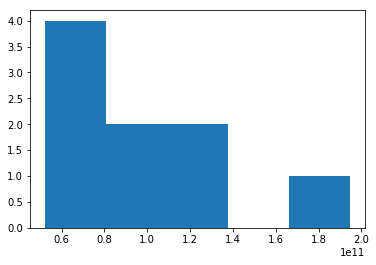

In [206]:
#sns.barplot(y=station, x=, data=df3)
plt.hist(df4['ENTRIES'], bins='auto')

In [205]:
g = sns.factorplot(x=["STATION"], y=["ENTRIES"], data=df4, kind='bar')
                   #palette="BuPu", size=6, aspect=1.5)

KeyError: 'STATION'